# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
This is the iPython notebook with the code to find the lane lines in the road. It is accompanied by the writeup. 

The write up was based on this [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md).

The Ipython notebook and the writeup are written to fulfill the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

The goal of the project is to write a function that automatically draws the lane lines, such as in the image below:
<p>
</p>
<figure>
 <img src="laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
</figure>

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Example of A Raw Image

This is the raw image for the image shown above.

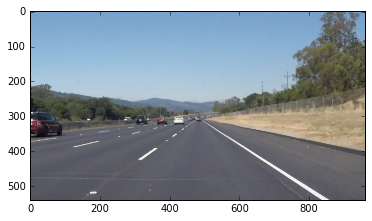

In [2]:
image = mpimg.imread('test_images/solidWhiteRight.jpg')

plt.imshow(image)

## Helper Functions

For the most part, the functions below are the ones that Udacity provided to help the students get started on the project. I've added two additional functions: "lr_lines" and "draw_lines_mb". The first function finds the left and the right lane lines (as described fully in the writeup), and the second function adds these lines to the image.

In [3]:
import math

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    fill_color = 255
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (fill_color,) * channel_count
    else:
        ignore_mask_color = fill_color
        
    #filling pixels inside the polygon defined by "vertices" with the fill color
    verbose = False
    if verbose:
        print(ignore_mask_color)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def draw_lines_mb(img_orig, lines, ysize, yfract = 1.0, color=[255, 0, 0], thickness=8):
    
    img = np.copy(img_orig)
    
    for m_avg, b_avg in lines:
        #for x1,y1,x2,y2 in line:
        y1 = np.int(yfract*ysize)
        y2 = ysize
        x1 = np.int((y1-b_avg)/m_avg)
        x2 = np.int((y2-b_avg)/m_avg) 
        verbose = False
        if verbose:
            print('[x1,x2,y1,y2]')
            print([x1,x2,y1,y2])
    
        #initial_img * α + img * β + λ
        img = cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    
    # Step 9: Save this to the test_images directory
    img = weighted_img(img, img_orig, α=0.6, β=0.4, λ=0.)
    
    return img

def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    #img = np.copy(img_orig)
    
    for line in lines:
        #[l_m_avg,r_m_avg,l_b_avg,r_b_avg]
        for x1,y1,x2,y2 in line:
            img = cv2.line(img, (x1, y1), (x2, y2), color, thickness)
        
    return img

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    #[l_m_avg,r_m_avg,l_b_avg,r_b_avg] = slope_intercept(lines)
    bf_lines = lr_lines(lines)
    return line_img, bf_lines

def lr_lines(lines):
    
    slopes = []
    intercepts = []

    for line in lines:
        for x1, y1, x2, y2 in line: 
            slopes.append((y2-y1)/(x2-x1))
            intercepts.append(y1 - (y2-y1)/(x2-x1)*x1)
    slopes = np.array(slopes)
    intercepts = np.array(intercepts)
    
    #m = slope, b = intercept, l = left, r = right
    r_m = [-1.0, -0.6]
    l_m = [0.5, 0.7]
    r_b = [500,800]
    l_b = [-50,100]
    
    do_plot = True
    if do_plot:
        plt.subplot(211)
        plt.scatter(slopes,intercepts)
        plt.axis([r_m[0],r_m[1],r_b[0],r_b[1]])
        plt.subplot(212)
        plt.scatter(slopes,intercepts)
        plt.axis([l_m[0],l_m[1],l_b[0],l_b[1]])
        plt.show()
    
    l_m_avg = np.mean(slopes[(slopes > l_m[0]) & (slopes < l_m[1]) & (intercepts > l_b[0]) & (intercepts < l_b[1])])
    l_b_avg = np.mean(intercepts[(slopes > l_m[0]) & (slopes < l_m[1]) & (intercepts > l_b[0]) & (intercepts < l_b[1])])
    r_m_avg =  np.mean(slopes[(slopes > r_m[0]) & (slopes < r_m[1]) & (intercepts > r_b[0]) & (intercepts < r_b[1])])
    r_b_avg = np.mean(intercepts[(slopes > r_m[0]) & (slopes < r_m[1]) & (intercepts > r_b[0]) & (intercepts < r_b[1])])

    #(x1,y1,x2,y2)
    verbose = True
    if verbose:
        print([(l_m_avg,l_b_avg),(r_m_avg,r_b_avg)])
    return [(l_m_avg,l_b_avg),(r_m_avg,r_b_avg)]
# Python 3 has support for cool math symbols.

def weighted_img(initial_img, img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

## Test Images

The first step of the process sees that the process works well on the images in the "test_images" directory.

In [4]:
import os
os.listdir("test_images/")

['solidYellowLeft.jpg',
 'solidYellowCurve.jpg',
 'solidWhiteCurve.jpg',
 'whiteCarLaneSwitch.jpg',
 'solidWhiteRight.jpg',
 'solidYellowCurve2.jpg']

## Lane-Finding Pipeline



This is the pipeline that I have built to find the lane lines. The different steps are described in the writeup. I've made a function "find_lines" which I use instead of the naming "process_images" as given in the original example. At the end of this code segment, I loop over all of the images in the test directory.

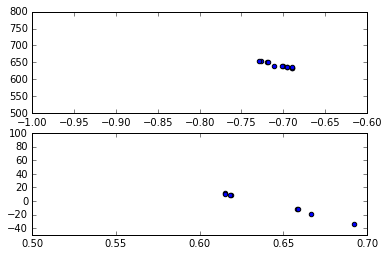

[(0.6429554479538433, -4.759714865258843), (-0.70555806082368966, 642.16187860874311)]


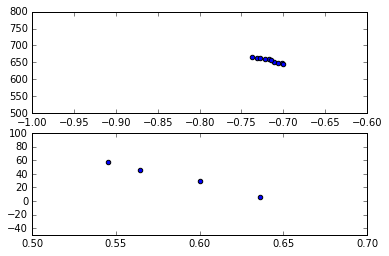

[(0.58648018648018641, 35.091608391608403), (-0.71680502978506078, 655.89057976176832)]


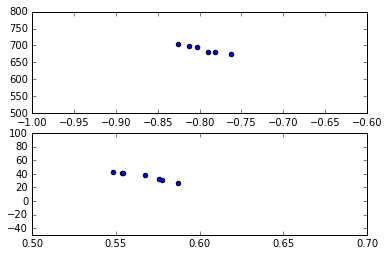

[(0.56635282391167174, 36.479617365127773), (-0.79584371216329997, 689.19448673926763)]


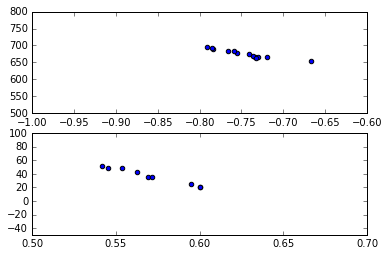

[(0.5709090359952429, 36.650147354026657), (-0.74626177807054195, 675.48990735282007)]


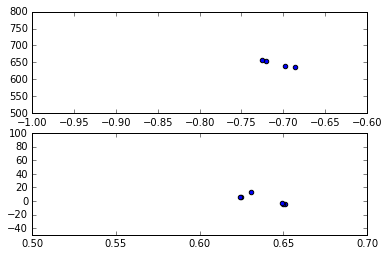

[(0.63825529192084007, 2.2002909293007065), (-0.70732973421926904, 646.55367524916937)]


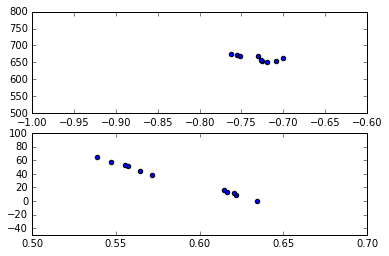

[(0.58557638234245524, 32.826757700332898), (-0.73121503509605079, 662.41705000340608)]


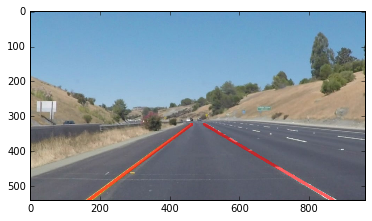

In [5]:
def color_selection(img,rgb_threshold):
    """
    Select only those pixels that lane line-like colors
    """
    
    color_select = np.copy(img)
    # Identify pixels below the threshold
    thresholds = (img[:,:,0] < rgb_threshold[0]) \
                | (img[:,:,1] < rgb_threshold[1]) \
                | (img[:,:,2] < rgb_threshold[2])
    color_select[thresholds] = [0,0,0]
    
    return color_select

def find_lines(img_orig):
    
    xsize = img_orig.shape[1]
    ysize = img_orig.shape[0]
        
    
    # Step 1: Color Selection.
    # Define the color selection criteria
    # The RGB color for white is [255,255,255]
    # The RGB colorfor yellow is [255,255,0]
    # So, let's not put any threshold on blue.
    red_threshold = 180
    green_threshold = 180
    blue_threshold = 0
    rgb_threshold = [red_threshold, green_threshold, blue_threshold]
    
    img = color_selection(img_orig,rgb_threshold)
    #mpimg.imsave("intermediate_images/color_select_" + img_file,img)

    # Step 2: Region of Interest Selection.
    verbose = False
    if verbose:
        print(img.shape)
    #vertices = [np.array([[0,0],[xsize,0],[xsize,ysize],[0,ysize]])]
    xfract_t = 0.45
    xfract_b = 0.05
    yfract = 0.60    
    
    vertices = [np.array([[np.int(xfract_t*xsize),      np.int(yfract*ysize)],
                          [np.int((1.0-xfract_t)*xsize),np.int(yfract*ysize)],
                          [np.int((1.0-xfract_b)*xsize),ysize],
                          [np.int(xfract_b*xsize),      ysize]])]
    
    img = region_of_interest(img, vertices)
    
    #mpimg.imsave("intermediate_images/roi_" + img_file,img,cmap='gray')
    ## vertices are defined according to cv2.fillPoly
    
    
    # Step 3: Grayscaling.
    do_grayscale = True
    if do_grayscale:
        img = grayscale(img)

            
    # Step 4: Gaussian Smoothing.
    kernel_size = 9
    img = gaussian_blur(img,kernel_size)
    #mpimg.imsave("intermediate_images/gb_" + img_file,img,cmap='gray')
    
    # Step 5: Canny Edge Detection.
    low_threshold = 50
    high_threshold = 200
    img = canny(img, low_threshold, high_threshold)
    #mpimg.imsave("intermediate_images/canny_" + img_file,img,cmap='gray')
    
    # Step 6: Hough Transform Line Detection.
    rho = 1 #distance resolution in rpixels of the Hough grid
    theta = np.pi/180 # angular resolution in radians of the Hough grid
    threshold = 10 # minimum number of votes (intersections in Hough grid cell)
    min_line_len = 20 #minimum number of pixels making up a line
    max_line_gap = 4 # maximum gap in pixels between connectable line segments
    img_out, bf_lines = hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap)
    #mpimg.imsave("intermediate_images/ht_" + img_file,img_out,cmap='gray')
    
    # Step 7: draw_lines
    do_draw_lines = True
    if do_draw_lines:
        #lines = [[(0,0,xsize,ysize)]]
        #img = draw_lines(img, lines, color=[255, 0, 0], thickness=2)
        img_w_lines = draw_lines_mb(img_orig, bf_lines, ysize, yfract=yfract)
        
        plt.imshow(img_w_lines)  # if you wanted to show a single color channel image called 'gray', 
                                          # for example, call as plt.imshow(gray, cmap='gray')
            
    return img_w_lines   

# First, save all of the images into a list, and then loop over that list.
all_images = os.listdir("test_images/")

for img_file in all_images:
    
    # Read In The Image.
    img_orig = mpimg.imread('test_images/' + img_file)

    # Step2 1-7: draw_lines function.
    img_w_lines = find_lines(img_orig)
    mpimg.imsave("intermediate_images/final_" + img_file,img_w_lines)
    


## Test on Videos

I've tested my solution on the two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

In [6]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

I test the solid white lane on the right first ...

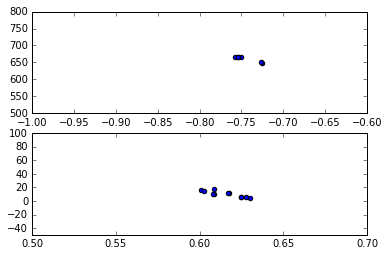

[(0.61549485372519119, 10.381436991053931), (-0.74459984720523842, 660.49503343223387)]
[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4



  0%|          | 0/222 [00:00<?, ?it/s]

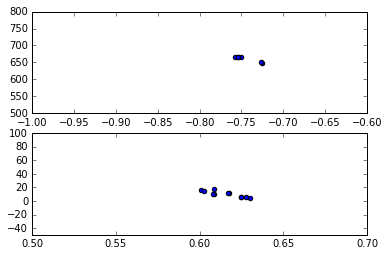


  0%|          | 1/222 [00:00<01:36,  2.29it/s]

[(0.61549485372519119, 10.381436991053931), (-0.74459984720523842, 660.49503343223387)]


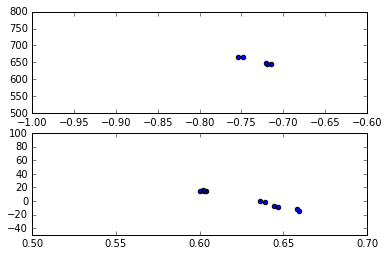


  1%|          | 2/222 [00:00<01:41,  2.16it/s]

[(0.62918959579811906, 1.6600798620796298), (-0.73142857656117877, 653.95498732630926)]


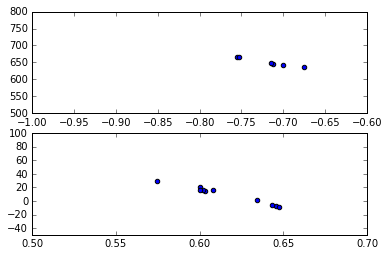


  1%|▏         | 3/222 [00:01<01:38,  2.23it/s]

[(0.6158343089503171, 9.0562351559608487), (-0.71847098904683182, 650.7139767074458)]


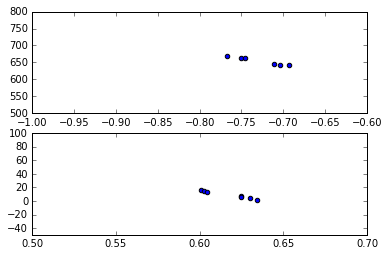


  2%|▏         | 4/222 [00:01<01:37,  2.23it/s]

[(0.61743618652908883, 8.9668690006511724), (-0.72844580208493559, 653.81370232798315)]


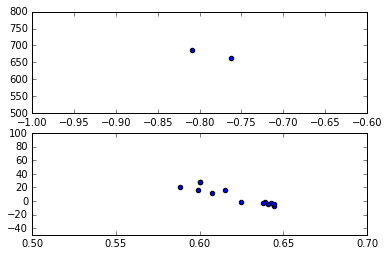


  2%|▏         | 5/222 [00:02<01:37,  2.23it/s]

[(0.62185630102272949, 7.4273656964424415), (-0.7857142857142857, 674.45238095238096)]


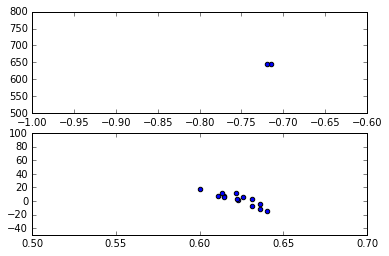


  3%|▎         | 6/222 [00:02<01:32,  2.32it/s]

[(0.62296767532287123, 2.5980383359204415), (-0.71714285714285708, 645.29428571428571)]


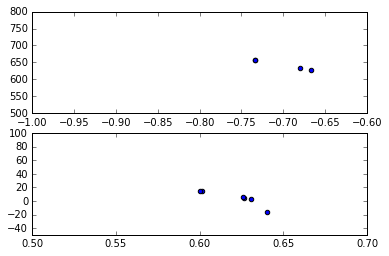


  3%|▎         | 7/222 [00:03<01:29,  2.39it/s]

[(0.62075584991632082, 4.7242586033139844), (-0.70333333333333337, 643.18666666666661)]


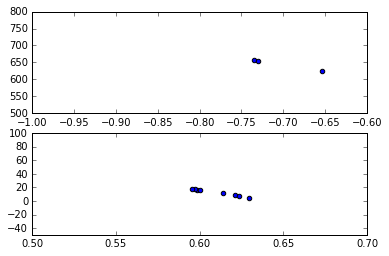


  4%|▎         | 8/222 [00:03<01:35,  2.25it/s]

[(0.60997163220201611, 12.445545284486535), (-0.70629000040764744, 645.09420732950139)]


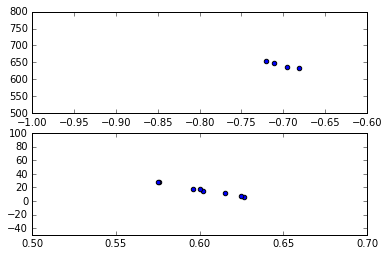


  4%|▍         | 9/222 [00:03<01:32,  2.31it/s]

[(0.60194381767657634, 16.319465878948627), (-0.70237792485011896, 643.49972423936015)]


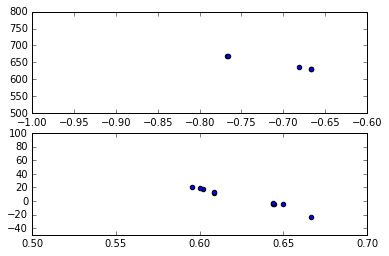


  5%|▍         | 10/222 [00:04<01:30,  2.34it/s]

[(0.62635222100379928, 4.2771555735641353), (-0.70971016448502833, 647.00869056722581)]


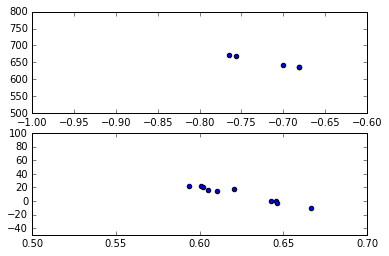


  5%|▍         | 11/222 [00:04<01:26,  2.43it/s]

[(0.62342146888839367, 9.880711137714508), (-0.71701980054921222, 651.11144674085847)]


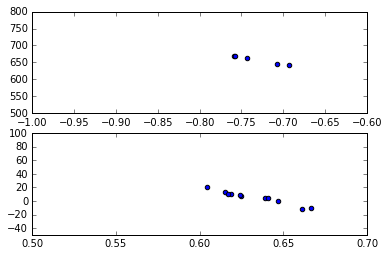


  5%|▌         | 12/222 [00:05<01:22,  2.55it/s]

[(0.63258823010930498, 5.2112198608978026), (-0.7322941517677547, 657.38513593795312)]


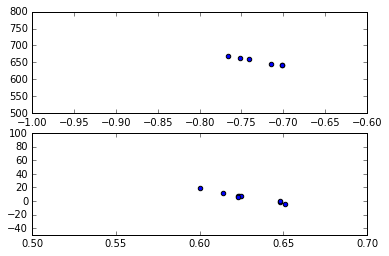


  6%|▌         | 13/222 [00:05<01:24,  2.47it/s]

[(0.62847399517936919, 5.9945471895970162), (-0.72952658755933275, 654.22185481017334)]


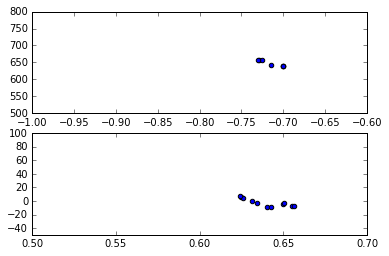


  6%|▋         | 14/222 [00:05<01:23,  2.50it/s]

[(0.63948722861738239, -2.3479157562811421), (-0.71422330596803663, 647.40925444578841)]


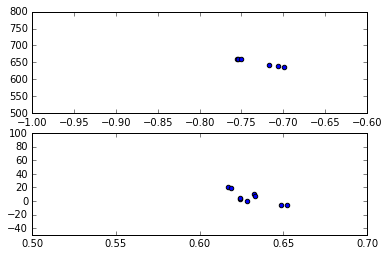


  7%|▋         | 15/222 [00:06<01:22,  2.51it/s]

[(0.63102324287434364, 5.9633621692861363), (-0.73028671551575053, 649.66226196896218)]


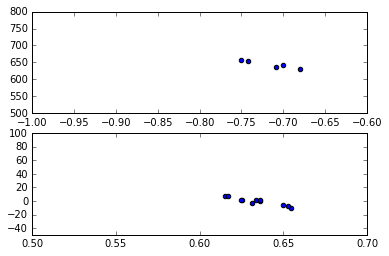


  7%|▋         | 16/222 [00:06<01:22,  2.50it/s]

[(0.63431871136126317, -0.53119923393719337), (-0.71605376344086014, 644.13649462365595)]


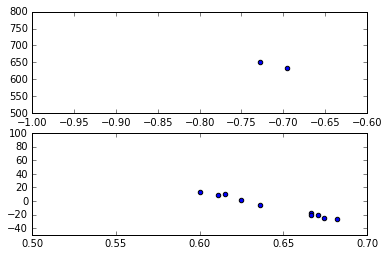


  8%|▊         | 17/222 [00:07<01:24,  2.43it/s]

[(0.64480835694262084, -8.2547764573894433), (-0.71146245059288538, 642.65612648221349)]


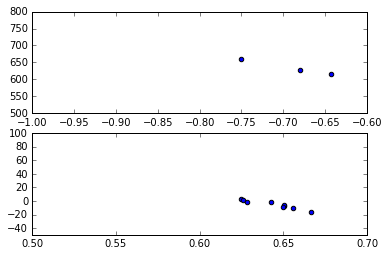


  8%|▊         | 18/222 [00:07<01:24,  2.41it/s]

[(0.64391424790708152, -5.2760396780587309), (-0.69095238095238098, 634.83428571428567)]


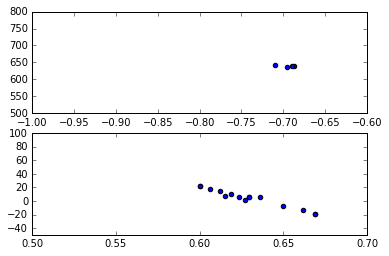

  9%|▊         | 19/222 [00:08<01:31,  2.22it/s]

[(0.62986731632707715, 4.022466903202254), (-0.69562119142041889, 639.08302098950526)]


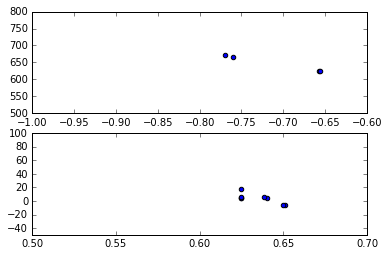

  9%|▉         | 20/222 [00:08<01:26,  2.32it/s]

[(0.6348856609578406, 3.6881499333945484), (-0.71084387651821868, 646.49378162955463)]


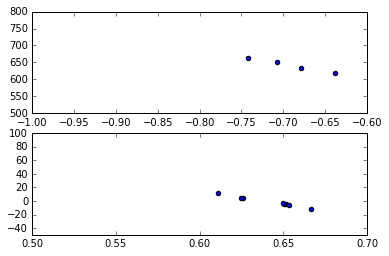

  9%|▉         | 21/222 [00:08<01:23,  2.41it/s]

[(0.64180971402446785, -1.0509619757244835), (-0.6915304644883884, 641.40915372501843)]


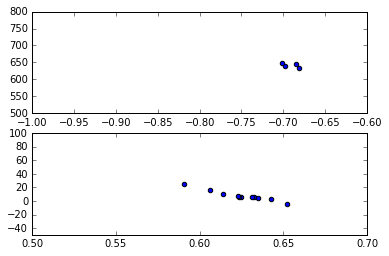

 10%|▉         | 22/222 [00:09<01:20,  2.48it/s]

[(0.62513181282125618, 7.7987980216347319), (-0.69181105853125113, 641.71930329658153)]


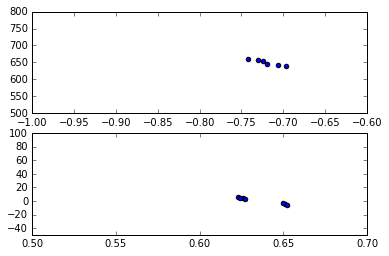

 10%|█         | 23/222 [00:09<01:21,  2.43it/s]

[(0.63616212508515158, 0.75717557253159384), (-0.71984736582917563, 650.17384105116741)]


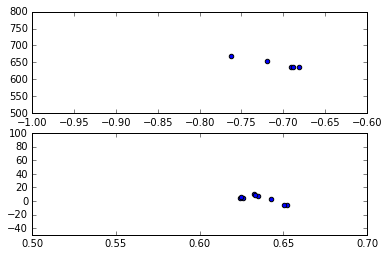

 11%|█         | 24/222 [00:10<01:30,  2.18it/s]

[(0.63573599831268568, 3.4204164365906737), (-0.70852004364199472, 645.79395558371164)]


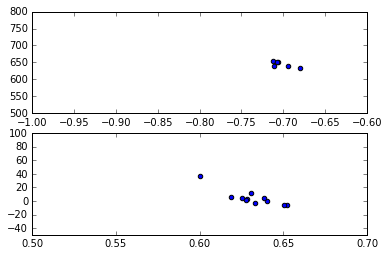

 11%|█▏        | 25/222 [00:10<01:26,  2.28it/s]

[(0.63149197228000464, 4.7819375827461075), (-0.7017985585216554, 644.61427422844577)]


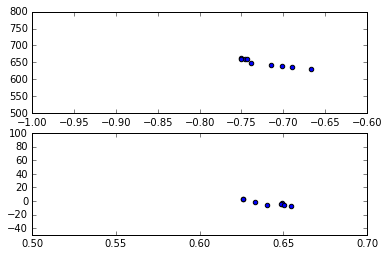

 12%|█▏        | 26/222 [00:11<01:22,  2.36it/s]

[(0.6418856824546223, -2.8146189612265413), (-0.72217613357043642, 648.61106141383505)]


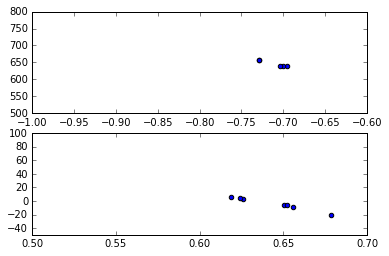

 12%|█▏        | 27/222 [00:11<01:20,  2.43it/s]

[(0.64369501637667803, -3.5936054839786089), (-0.71145502645502645, 646.79769841269842)]


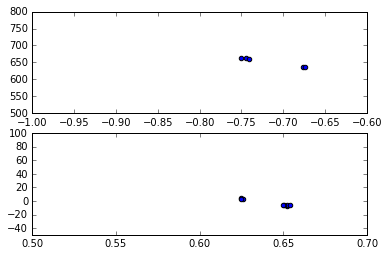

 13%|█▎        | 28/222 [00:11<01:16,  2.55it/s]

[(0.64181921134551678, -2.6163303390150432), (-0.71706208379318481, 650.55564025632725)]


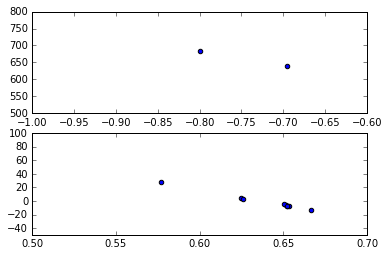

 13%|█▎        | 29/222 [00:12<01:12,  2.67it/s]

[(0.63937192308967594, -1.0172795442650984), (-0.74782608695652175, 661.8608695652174)]


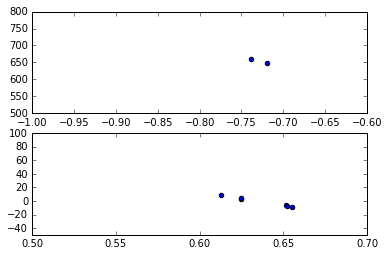

 14%|█▎        | 30/222 [00:12<01:13,  2.63it/s]

[(0.63683706607976576, -0.81289749961035795), (-0.72956521739130431, 654.12347826086955)]


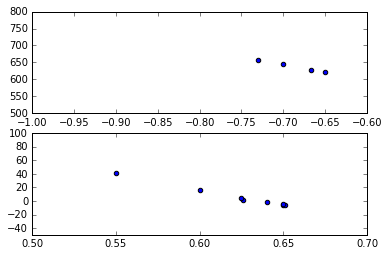

 14%|█▍        | 31/222 [00:12<01:11,  2.68it/s]

[(0.62399727235877811, 5.5584508982167122), (-0.68685897435897436, 638.26666666666665)]


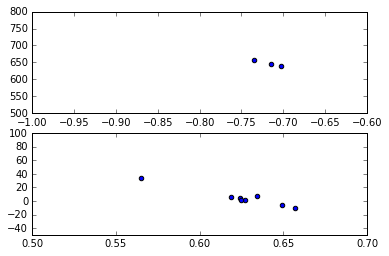

 14%|█▍        | 32/222 [00:13<01:07,  2.83it/s]

[(0.62520275972072803, 4.7921809974117053), (-0.7174275115451586, 647.89605571958509)]


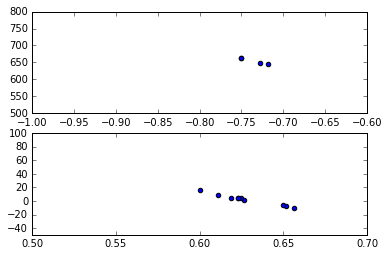

 15%|█▍        | 33/222 [00:13<01:04,  2.91it/s]

[(0.628514193586863, 1.9552091731294012), (-0.73650568181818188, 655.03196022727275)]


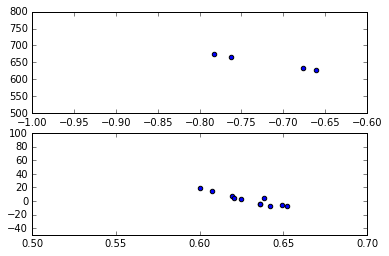

 15%|█▌        | 34/222 [00:13<01:06,  2.85it/s]

[(0.62972479093545308, 2.3472740059945481), (-0.72042458287662892, 650.25269455608327)]


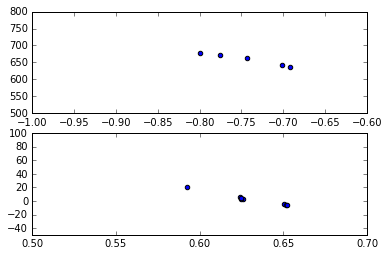

 16%|█▌        | 35/222 [00:14<01:09,  2.68it/s]

[(0.63081194570360211, 2.531696503706911), (-0.74250388828875702, 658.26464106146045)]


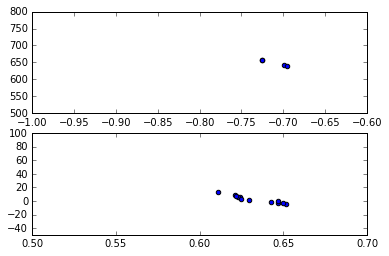

 16%|█▌        | 36/222 [00:14<01:10,  2.63it/s]

[(0.6328929560937766, 2.76411905330527), (-0.71097928298560098, 648.34736078460185)]


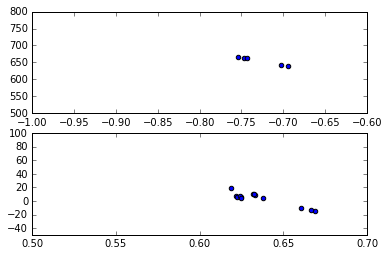

 17%|█▋        | 37/222 [00:14<01:07,  2.75it/s]

[(0.63606470788713887, 3.6289797484424886), (-0.72822044517696694, 654.62432334084508)]


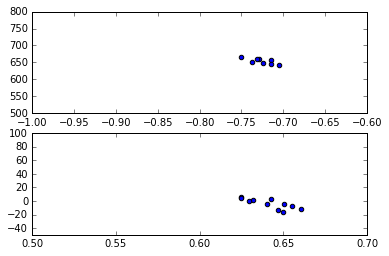

 17%|█▋        | 38/222 [00:15<01:07,  2.72it/s]

[(0.64152817021573016, -3.8177541267721566), (-0.72573689797396956, 652.65082528594826)]


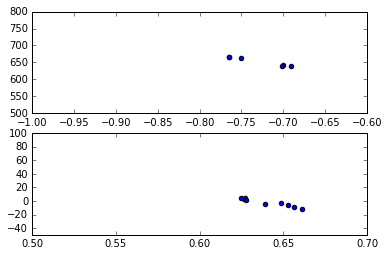

 18%|█▊        | 39/222 [00:15<01:07,  2.69it/s]

[(0.64049089440320595, -2.3938888532229168), (-0.72863517201752492, 652.79450729009557)]


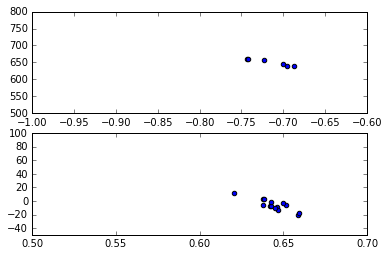

 18%|█▊        | 40/222 [00:16<01:05,  2.77it/s]

[(0.64425755416464781, -6.0564989127206275), (-0.71529238740844636, 649.73600404874071)]


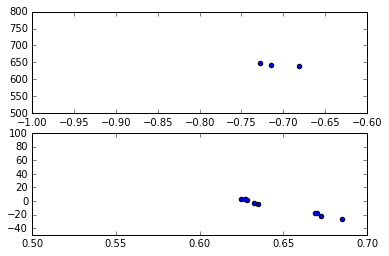

 18%|█▊        | 41/222 [00:16<01:06,  2.73it/s]

[(0.64719482564510711, -8.0873435094446506), (-0.70779220779220786, 642.8354978354979)]


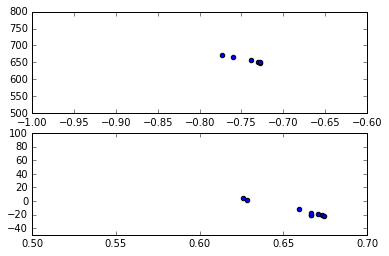

 19%|█▉        | 42/222 [00:16<01:06,  2.69it/s]

[(0.65911516475351928, -14.097577389141154), (-0.74286206547076106, 657.61484747136922)]


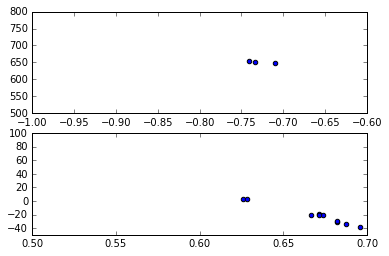

 19%|█▉        | 43/222 [00:17<01:07,  2.66it/s]

[(0.66835281060711726, -20.766606276206129), (-0.72791716447630428, 650.50776583034656)]


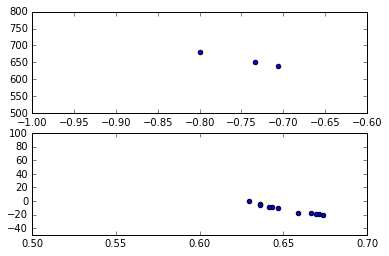

 20%|█▉        | 44/222 [00:17<01:06,  2.67it/s]

[(0.65217764681414558, -11.995625783290517), (-0.74640522875816995, 656.26013071895431)]


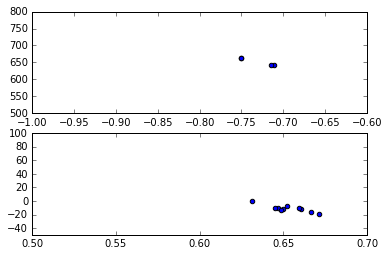

 20%|██        | 45/222 [00:17<01:05,  2.71it/s]

[(0.65319516108559816, -11.181869805809606), (-0.73120300751879697, 651.89144736842104)]


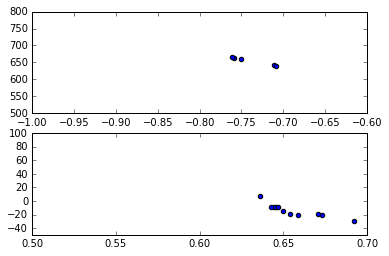

 21%|██        | 46/222 [00:18<01:07,  2.59it/s]

[(0.65584926926969755, -14.132283645398735), (-0.73787240994887171, 654.4617912197748)]


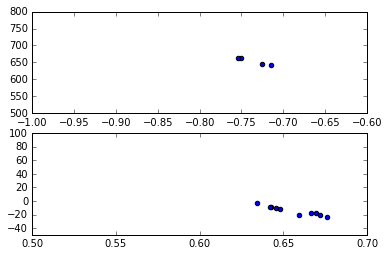

 21%|██        | 47/222 [00:18<01:04,  2.70it/s]

[(0.65564911939879456, -14.370511354076507), (-0.73604763163858877, 652.88381997431452)]


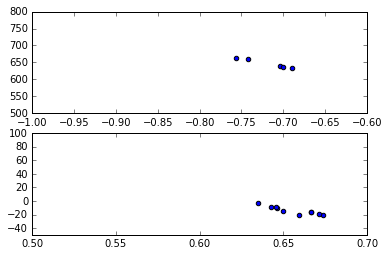

 22%|██▏       | 48/222 [00:19<01:05,  2.64it/s]

[(0.65568847093329707, -13.883283616247144), (-0.71841022334904425, 646.18695554286228)]


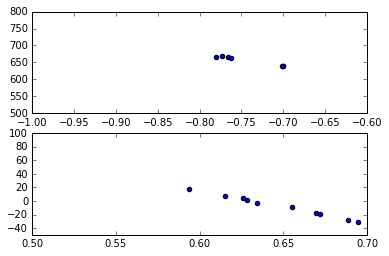

 22%|██▏       | 49/222 [00:19<01:04,  2.68it/s]

[(0.64770110987840857, -7.5482452431780986), (-0.74052994044283238, 653.74442552221296)]


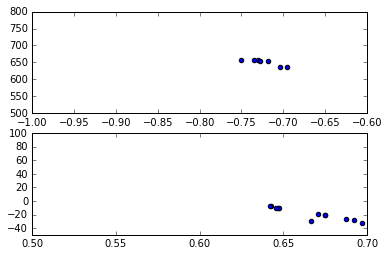

 23%|██▎       | 50/222 [00:19<01:01,  2.82it/s]

[(0.66570598915764101, -18.739141347667299), (-0.72291455532624338, 649.72360362726511)]


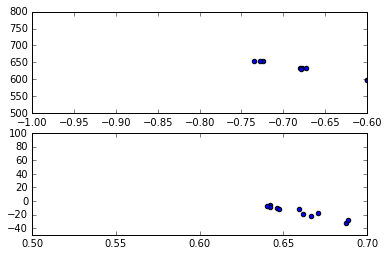

 23%|██▎       | 51/222 [00:20<01:02,  2.72it/s]

[(0.65934061614881512, -15.919702077945363), (-0.69951714171136192, 641.50752321629409)]


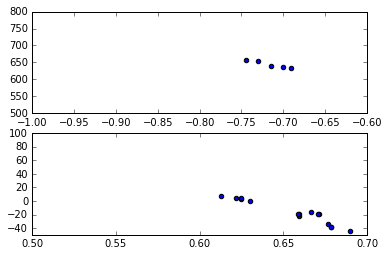

 23%|██▎       | 52/222 [00:20<01:03,  2.69it/s]

[(0.6548945459473976, -16.684091871076628), (-0.71609430158449761, 642.99801190546282)]


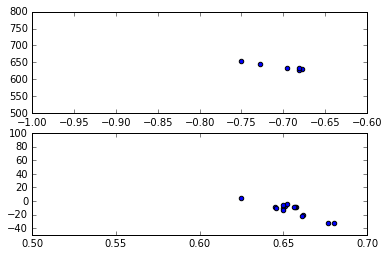

 24%|██▍       | 53/222 [00:20<01:01,  2.73it/s]

[(0.65456525762514228, -12.681930793547375), (-0.70233010327680745, 637.55535721875128)]


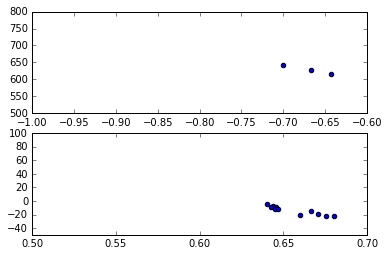

 24%|██▍       | 54/222 [00:21<01:00,  2.79it/s]

[(0.65611580337610798, -13.915227736915504), (-0.66984126984126979, 627.96349206349203)]


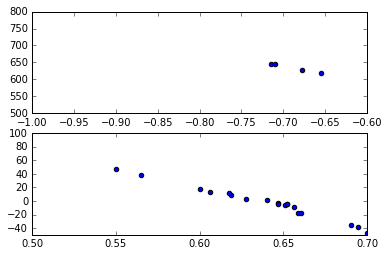

 25%|██▍       | 55/222 [00:21<00:58,  2.86it/s]

[(0.63530788915101999, 0.14400427118303583), (-0.68913872556809141, 634.12994597171462)]


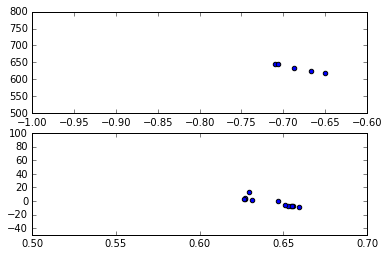

 25%|██▌       | 56/222 [00:21<00:57,  2.90it/s]

[(0.64324143598168149, -1.5275056600815826), (-0.68394528779253627, 632.45865907653388)]


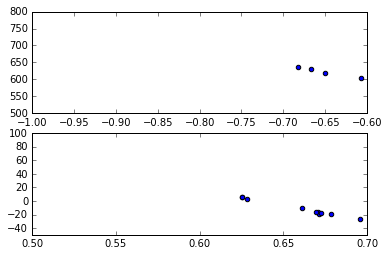

 26%|██▌       | 57/222 [00:22<00:59,  2.79it/s]

[(0.65982130952776019, -11.107766053626596), (-0.65168408826945412, 623.15013066202096)]


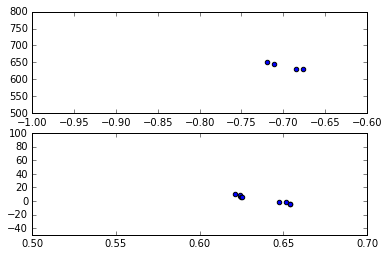

 26%|██▌       | 58/222 [00:22<00:57,  2.86it/s]

[(0.63634359921147166, 2.6415787124664689), (-0.69829855873973523, 639.36511396011394)]


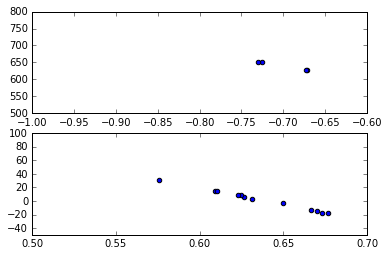

 27%|██▋       | 59/222 [00:22<00:55,  2.93it/s]

[(0.63651783674988016, 1.7115703268089295), (-0.70032359912595843, 639.14705242398429)]


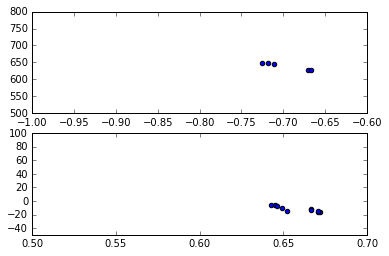

 27%|██▋       | 60/222 [00:23<00:55,  2.94it/s]

[(0.65822205763286834, -11.564676460938102), (-0.69830624355005155, 638.920007739938)]


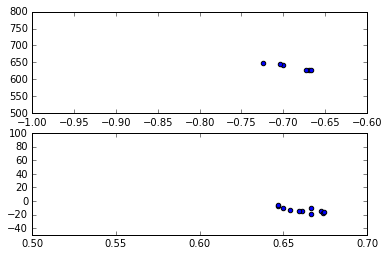

 27%|██▋       | 61/222 [00:23<00:57,  2.80it/s]

[(0.66107867579847912, -13.161010458337252), (-0.68975918762367749, 636.12512916835249)]


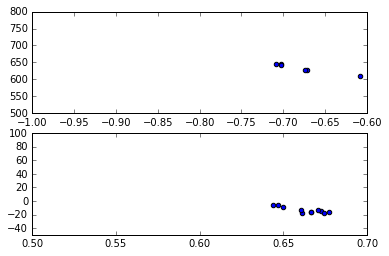

 28%|██▊       | 62/222 [00:24<00:58,  2.74it/s]

[(0.66276664116512196, -13.484649270943107), (-0.67827569245918584, 632.81925047474476)]


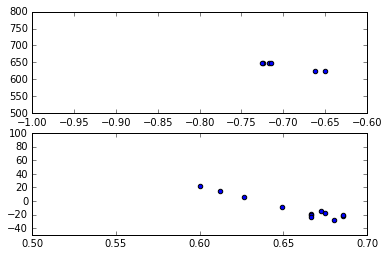

 28%|██▊       | 63/222 [00:24<00:59,  2.69it/s]

[(0.65724527542246092, -10.933698947666295), (-0.69872556853441414, 639.51707271364319)]


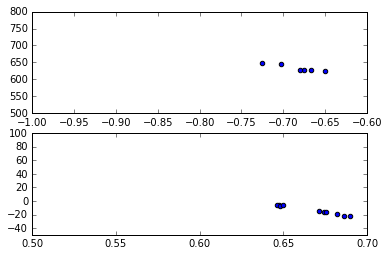

 29%|██▉       | 64/222 [00:24<00:59,  2.67it/s]

[(0.66708673353150671, -13.799931749685026), (-0.68354563232587406, 632.84213900392331)]


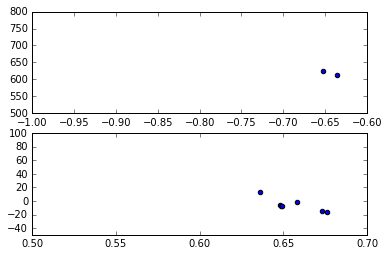

 29%|██▉       | 65/222 [00:25<01:00,  2.60it/s]

[(0.65570693992740614, -5.8300943857923118), (-0.64426877470355737, 618.77865612648225)]


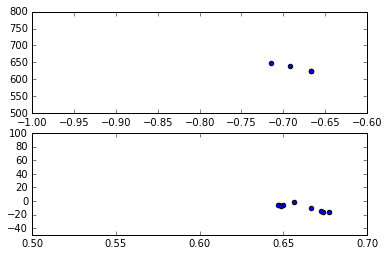

 30%|██▉       | 66/222 [00:25<01:00,  2.60it/s]

[(0.65981847182490261, -9.2602575192271317), (-0.68498168498168488, 632.92307692307691)]


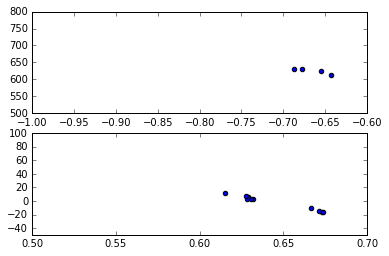

 30%|███       | 67/222 [00:25<00:57,  2.69it/s]

[(0.64329983094687138, -1.4715421004856508), (-0.66573722787223899, 624.59482758620686)]


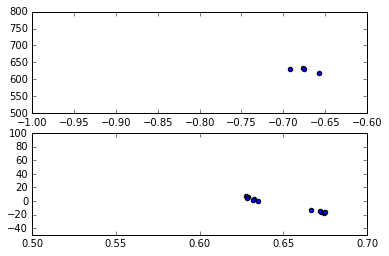

 31%|███       | 68/222 [00:26<00:58,  2.63it/s]

[(0.64942885894085045, -5.0381789078256922), (-0.67539920334037995, 628.00532460385398)]


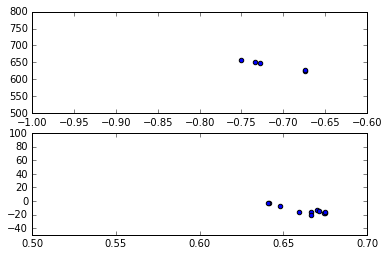

 31%|███       | 69/222 [00:26<00:56,  2.71it/s]

[(0.66249296754600084, -13.290401314524951), (-0.7117875417470968, 641.39241167999512)]


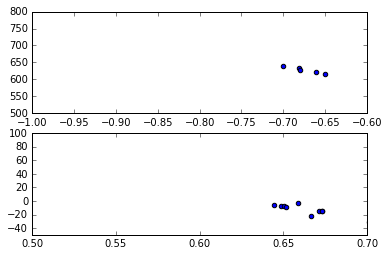

 32%|███▏      | 70/222 [00:27<00:54,  2.81it/s]

[(0.65975881605177378, -11.057193480466424), (-0.67443910806174956, 627.61264493996566)]


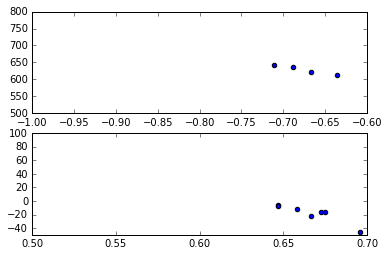

 32%|███▏      | 71/222 [00:27<00:53,  2.82it/s]

[(0.66600337083084826, -18.105351145301022), (-0.67577333868317468, 628.70764071993574)]


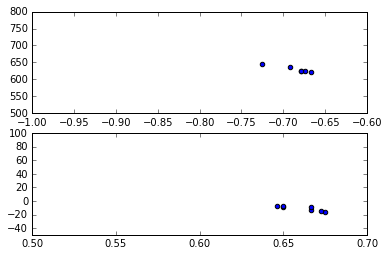

 32%|███▏      | 72/222 [00:27<00:52,  2.88it/s]

[(0.66106576162000741, -11.058322494022937), (-0.68613053158147774, 629.41548292377661)]


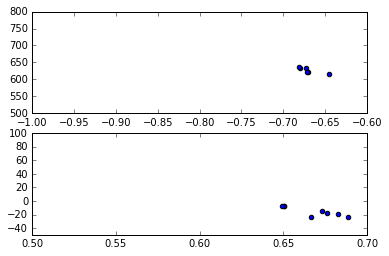

 33%|███▎      | 73/222 [00:28<00:51,  2.90it/s]

[(0.66722416913609006, -15.330157402485383), (-0.67038177259036236, 626.94523738234284)]


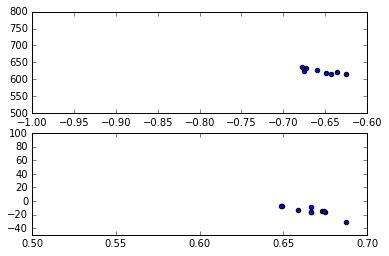

 33%|███▎      | 74/222 [00:28<00:53,  2.78it/s]

[(0.66663749302820008, -14.478894292139756), (-0.6548549830192445, 623.8057324615113)]


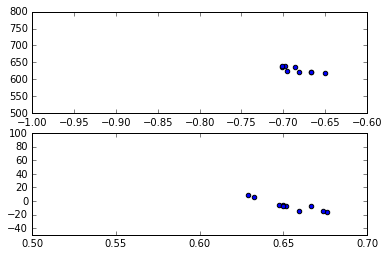

 34%|███▍      | 75/222 [00:28<00:52,  2.82it/s]

[(0.65368674534129934, -6.6908613046953009), (-0.68314629855387687, 628.7584638671251)]


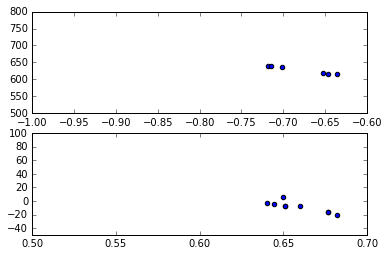

 34%|███▍      | 76/222 [00:29<00:53,  2.75it/s]

[(0.65902085152404744, -8.5155700994936101), (-0.67832179808682369, 627.40690357170536)]


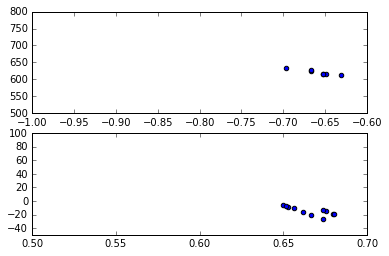

 35%|███▍      | 77/222 [00:29<00:54,  2.68it/s]

[(0.66566172167149285, -14.782953055810951), (-0.65926835034386533, 620.64611427082821)]


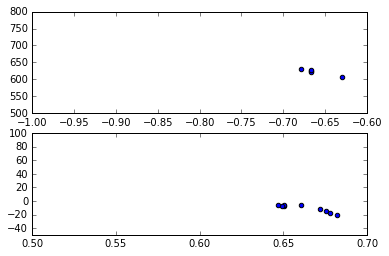

 35%|███▌      | 78/222 [00:29<00:55,  2.61it/s]

[(0.66265974833823993, -10.488746348922056), (-0.66164021164021158, 621.47539682539684)]


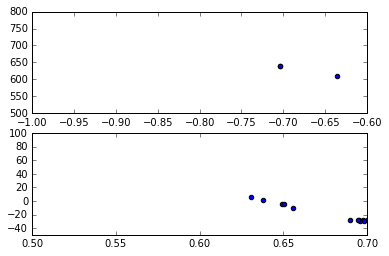

 36%|███▌      | 79/222 [00:30<00:56,  2.51it/s]

[(0.67220779911053363, -16.745151175374108), (-0.68125701459034793, 629.29292929292933)]


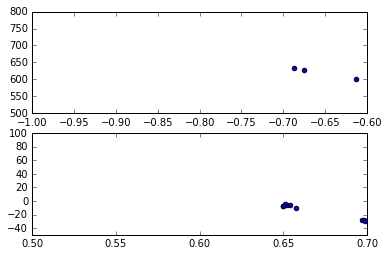

 36%|███▌      | 80/222 [00:30<00:53,  2.63it/s]

[(0.66767691865538958, -14.516313315435532), (-0.65869296716070913, 621.40787561755303)]


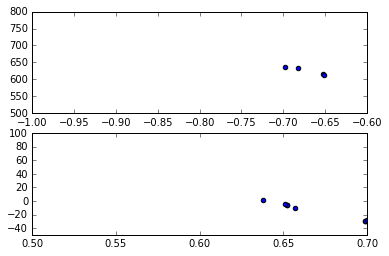

 36%|███▋      | 81/222 [00:31<00:53,  2.66it/s]

[(0.66834528156729012, -14.33625498460615), (-0.67098448790352405, 624.06238131643192)]


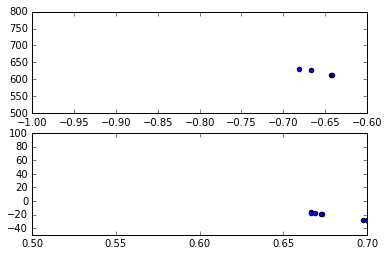

 37%|███▋      | 82/222 [00:31<00:51,  2.70it/s]

[(0.67436367464608793, -19.80598838806797), (-0.65821285632606386, 620.15972392387482)]


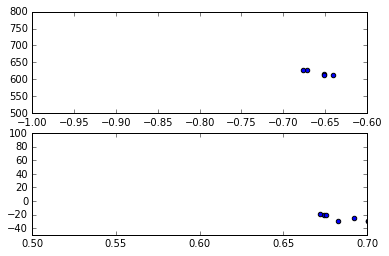

 37%|███▋      | 83/222 [00:31<00:50,  2.74it/s]

[(0.67920295354226623, -23.012680138642075), (-0.65842650405150405, 619.54091158841163)]


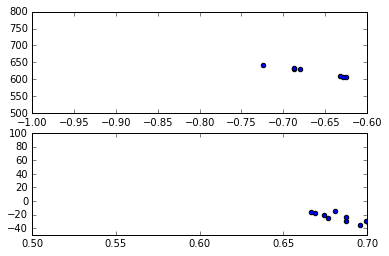

 38%|███▊      | 84/222 [00:32<00:50,  2.76it/s]

[(0.6818679234149978, -23.411631090502347), (-0.66648034583291449, 623.06100432291146)]


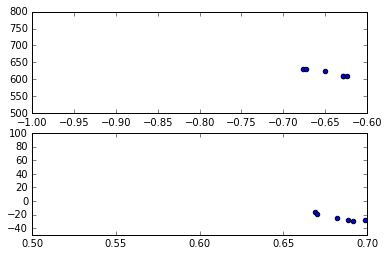

 38%|███▊      | 85/222 [00:32<00:50,  2.69it/s]

[(0.68327013972455619, -24.48142958713321), (-0.64669543877464664, 618.24288434337939)]


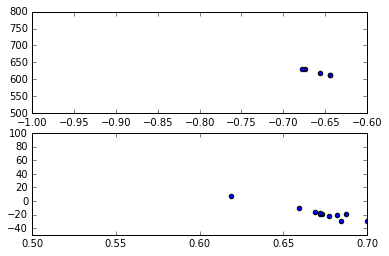

 39%|███▊      | 86/222 [00:33<00:52,  2.57it/s]

[(0.66946819692473869, -16.719239597850795), (-0.65906632662709241, 620.51462497311547)]


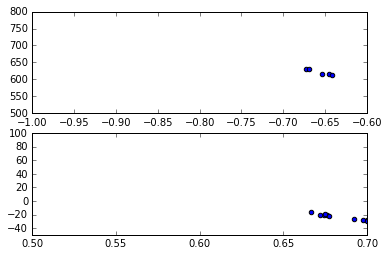

 39%|███▉      | 87/222 [00:33<00:52,  2.58it/s]

[(0.67889597560849557, -21.828371076763077), (-0.65648443933163514, 620.47978866692085)]


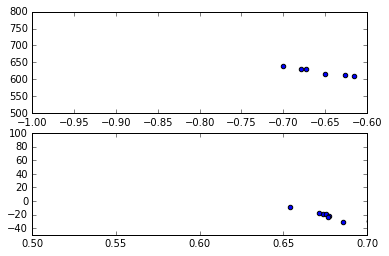

 40%|███▉      | 88/222 [00:33<00:50,  2.68it/s]

[(0.67335884286634029, -20.220496130825559), (-0.65724964336075442, 622.97343613176952)]


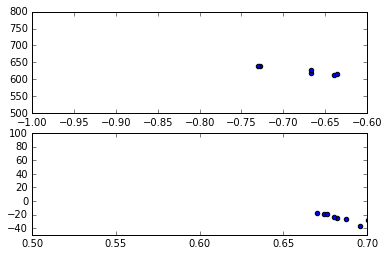

 40%|████      | 89/222 [00:34<00:50,  2.66it/s]

[(0.68085982916259469, -24.351771756701435), (-0.67795648795648777, 625.07334887334889)]


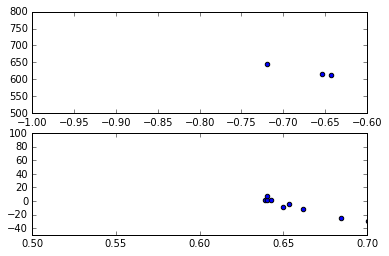

 41%|████      | 90/222 [00:34<00:52,  2.53it/s]

[(0.65139078806456041, -4.8268538813191242), (-0.67223443223443224, 625.48183150183161)]


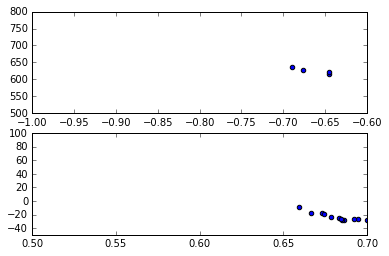

 41%|████      | 91/222 [00:34<00:48,  2.72it/s]

[(0.67975843695848848, -22.401418491652102), (-0.66411208532356203, 624.58790813321991)]


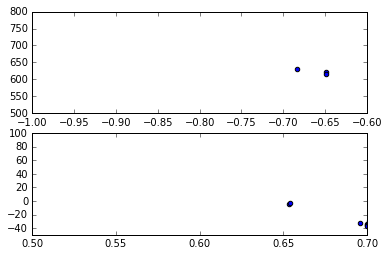

 41%|████▏     | 92/222 [00:35<00:47,  2.76it/s]

[(0.66781751754383623, -13.44565814948489), (-0.66050260787102888, 622.7690848743481)]


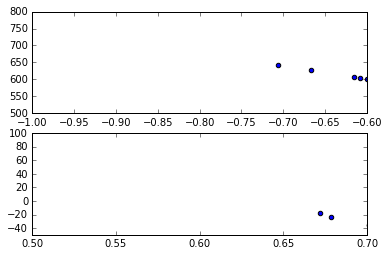

 42%|████▏     | 93/222 [00:35<00:46,  2.75it/s]

[(0.67535128805620603, -20.676229508196712), (-0.64915732179159291, 620.18415961702408)]


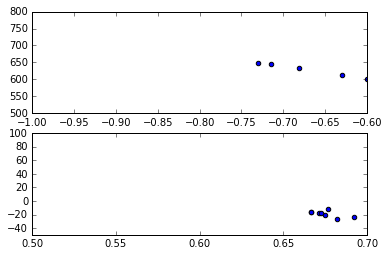

 42%|████▏     | 94/222 [00:35<00:46,  2.72it/s]

[(0.67528515954534307, -18.605508248758412), (-0.6888658138658138, 634.69689819689825)]


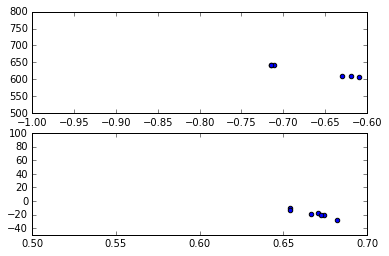

 43%|████▎     | 95/222 [00:36<00:44,  2.83it/s]

[(0.66768664673509726, -18.445385886241404), (-0.66635264765346069, 625.46467931345978)]


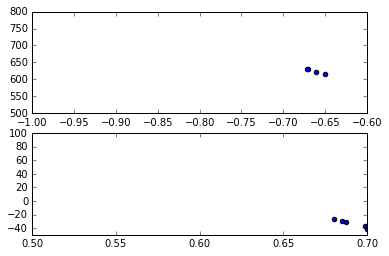

 43%|████▎     | 96/222 [00:36<00:48,  2.57it/s]

[(0.68781244462165525, -31.341429758107409), (-0.6633769087808159, 624.274687877769)]


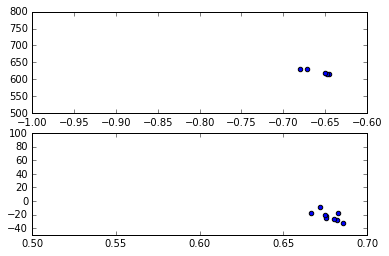

 44%|████▎     | 97/222 [00:37<00:48,  2.58it/s]

[(0.67721433057582692, -22.141995875706172), (-0.65866467758018499, 622.01239327541282)]


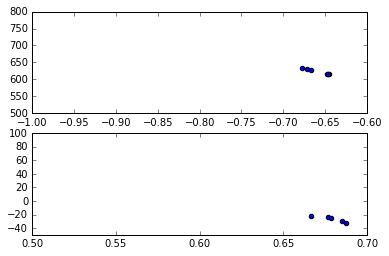

 44%|████▍     | 98/222 [00:37<00:47,  2.58it/s]

[(0.67893204621465486, -26.883450136819715), (-0.65939972483785192, 622.65488172824951)]


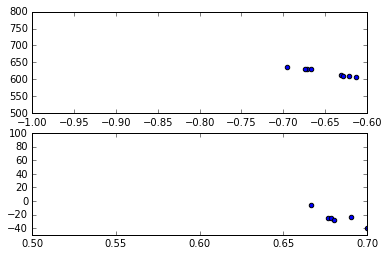

 45%|████▍     | 99/222 [00:37<00:47,  2.60it/s]

[(0.67849113718140264, -21.1638343367547), (-0.65050058070410832, 620.59900470072694)]


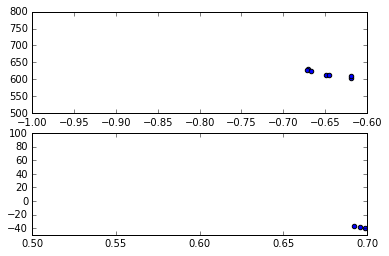

 45%|████▌     | 100/222 [00:38<00:45,  2.68it/s]

[(0.69555927164622811, -38.355351170568554), (-0.64874554721069688, 617.36553608221584)]


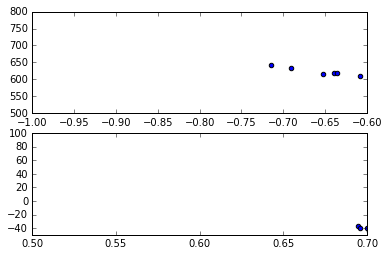

 45%|████▌     | 101/222 [00:38<00:46,  2.60it/s]

[(0.69504830917874394, -38.58514492753622), (-0.65699918439048866, 621.763980174415)]


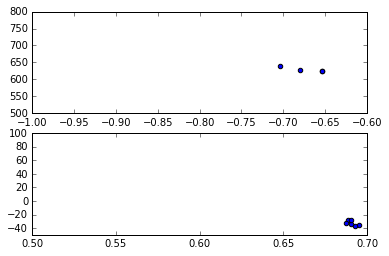

 46%|████▌     | 102/222 [00:39<00:46,  2.59it/s]

[(0.69093937099693692, -32.496112677527151), (-0.67284900284900284, 629.39400284900285)]


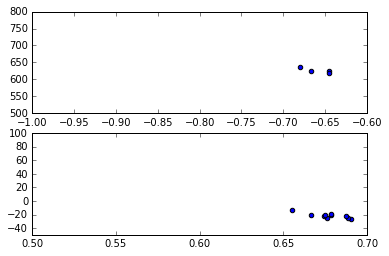

 46%|████▋     | 103/222 [00:39<00:46,  2.58it/s]

[(0.67717204572529122, -21.58611963447866), (-0.65924731182795704, 625.39182795698935)]


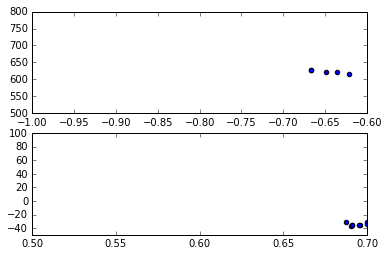

 47%|████▋     | 104/222 [00:39<00:46,  2.56it/s]

[(0.69185976845082797, -34.893789974006843), (-0.64799344799344794, 622.46945126945116)]


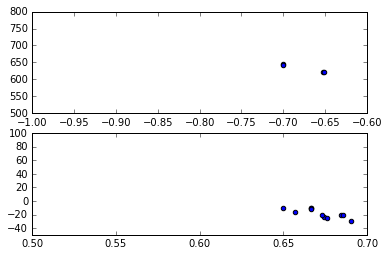

 47%|████▋     | 105/222 [00:40<00:45,  2.57it/s]

[(0.67188055579422734, -18.102116750921308), (-0.67583417593528816, 632.16026289180991)]


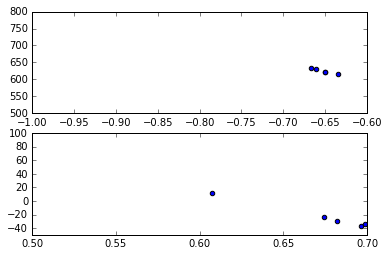

 48%|████▊     | 106/222 [00:40<00:44,  2.60it/s]

[(0.67174101322441804, -22.545942206526966), (-0.65223807332412942, 623.67365546863016)]


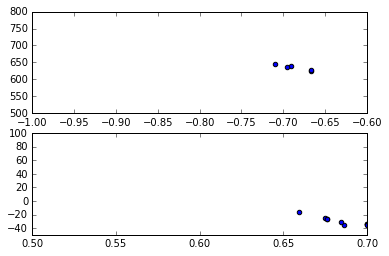

 48%|████▊     | 107/222 [00:41<00:45,  2.54it/s]

[(0.67615668693852371, -26.768150709010303), (-0.68591440350206123, 634.33739130434776)]


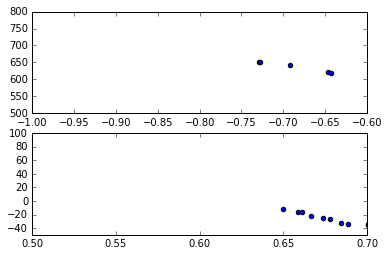

 49%|████▊     | 108/222 [00:41<00:42,  2.67it/s]

[(0.67013645588013526, -23.003683529794465), (-0.68751851703484612, 636.03485943572753)]


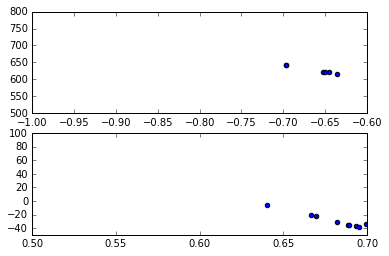

 49%|████▉     | 109/222 [00:41<00:43,  2.60it/s]

[(0.68046892161787165, -28.98958966622758), (-0.66283271215734496, 627.83169746190617)]


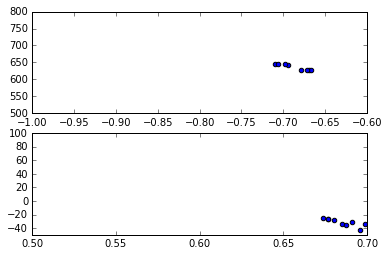

 50%|████▉     | 110/222 [00:42<00:40,  2.73it/s]

[(0.6849766368397987, -31.439273209627043), (-0.68667588402288349, 635.67860835719807)]


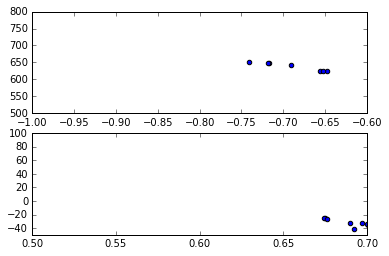

 50%|█████     | 111/222 [00:42<00:39,  2.84it/s]

[(0.68409008975945074, -30.399045383450073), (-0.68903380300466532, 637.46521763878354)]


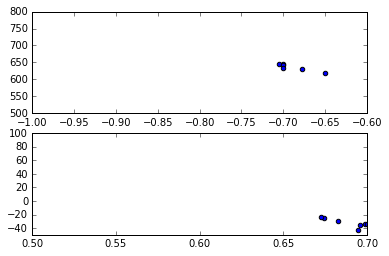

 50%|█████     | 112/222 [00:42<00:41,  2.65it/s]

[(0.68644925037639049, -31.923007032816912), (-0.68878439568094729, 635.68650296064084)]


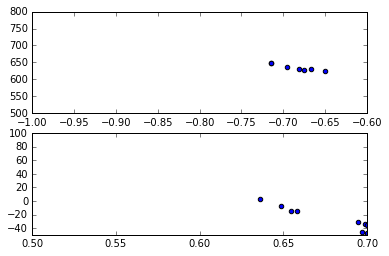

 51%|█████     | 113/222 [00:43<00:40,  2.67it/s]

[(0.66963154733905805, -20.745049457252442), (-0.68538692156704584, 635.17215320910975)]


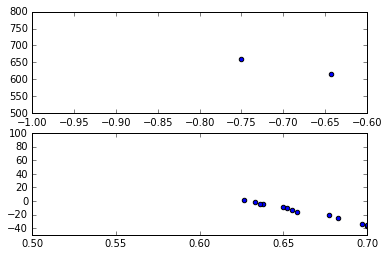

 51%|█████▏    | 114/222 [00:43<00:40,  2.65it/s]

[(0.6551851566668454, -12.306553966590251), (-0.6964285714285714, 638.46428571428578)]


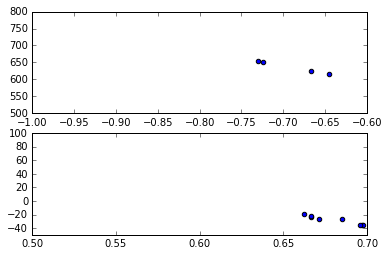

 52%|█████▏    | 115/222 [00:43<00:39,  2.71it/s]

[(0.68034164241495065, -27.994615536347297), (-0.69168377969824013, 636.11424731182797)]


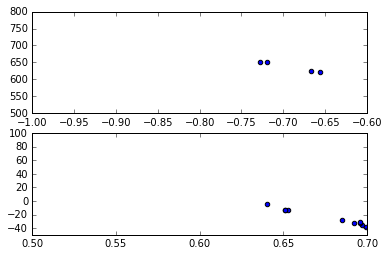

 52%|█████▏    | 116/222 [00:44<00:37,  2.82it/s]

[(0.67602513278763232, -24.256126459781605), (-0.69254734848484856, 636.21001893939388)]


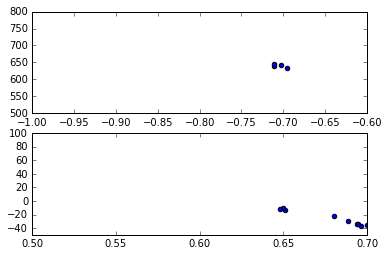

 53%|█████▎    | 117/222 [00:44<00:37,  2.80it/s]

[(0.67542867585706956, -24.097553399084212), (-0.70485187704867347, 640.1650148432185)]


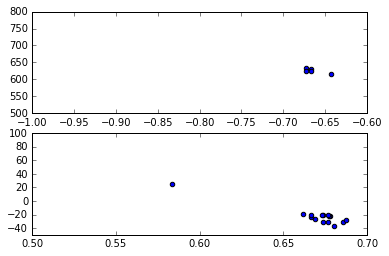

 53%|█████▎    | 118/222 [00:45<00:38,  2.69it/s]

[(0.66866122277693463, -21.757053743353335), (-0.66454735740450022, 626.04500261643113)]


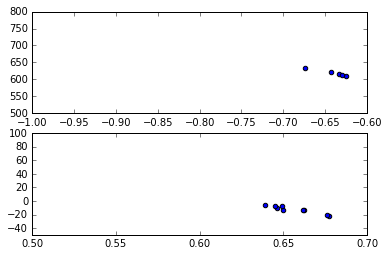

 54%|█████▎    | 119/222 [00:45<00:39,  2.62it/s]

[(0.65628546354763062, -12.648137872570601), (-0.64094662985967332, 618.62687600644131)]


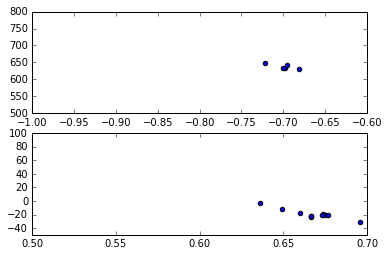

 54%|█████▍    | 120/222 [00:45<00:39,  2.61it/s]

[(0.66721896605158115, -19.196206114745255), (-0.69962105527322904, 637.56561390300521)]


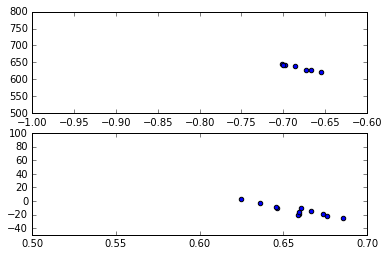

 55%|█████▍    | 121/222 [00:46<00:39,  2.57it/s]

[(0.65769853448319904, -13.843891633719428), (-0.6830095828814704, 635.17533474400136)]


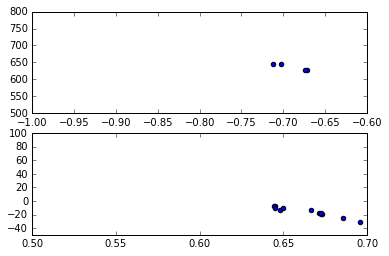

 55%|█████▍    | 122/222 [00:46<00:38,  2.58it/s]

[(0.66419431491291003, -16.12196538027705), (-0.69028260685210319, 636.66419677182273)]


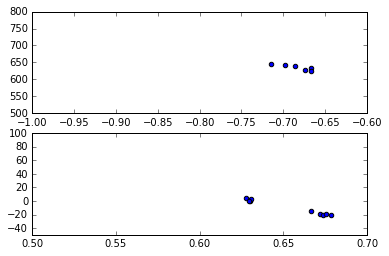

 55%|█████▌    | 123/222 [00:47<00:39,  2.50it/s]

[(0.65144652304943385, -8.7122825486335724), (-0.68432928727046372, 636.08442265795202)]


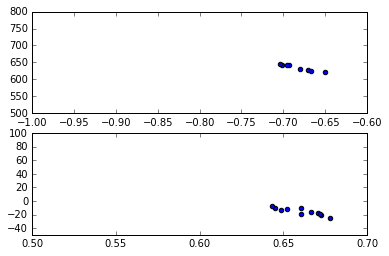

 56%|█████▌    | 124/222 [00:47<00:39,  2.51it/s]

[(0.66093614359440878, -15.333486139880309), (-0.68264643929844881, 634.23579749427176)]


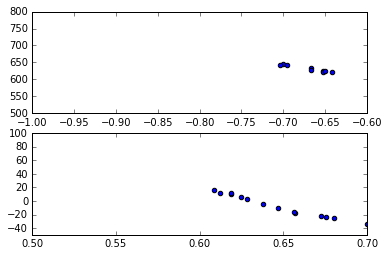

 56%|█████▋    | 125/222 [00:47<00:38,  2.52it/s]

[(0.64135214752540193, -4.767418926339019), (-0.66993708693840204, 631.29881350083042)]


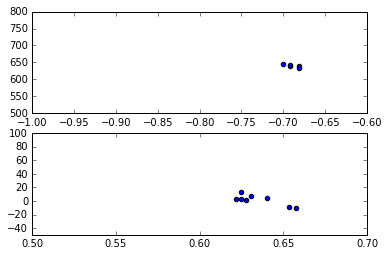

 57%|█████▋    | 126/222 [00:48<00:38,  2.50it/s]

[(0.635029003444048, 1.7005583721797137), (-0.68965034965034955, 639.86321678321679)]


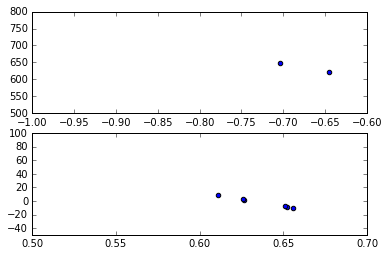

 57%|█████▋    | 127/222 [00:48<00:37,  2.52it/s]

[(0.63706377125798241, -2.2973332594382896), (-0.67443249701314212, 634.16547192353642)]


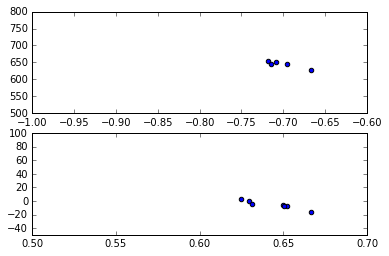

 58%|█████▊    | 128/222 [00:49<00:37,  2.52it/s]

[(0.6435347171649618, -5.823857510744241), (-0.70073757763975153, 644.65940734989647)]


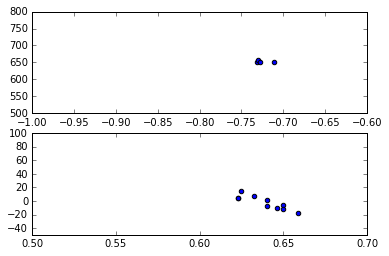

 58%|█████▊    | 129/222 [00:49<00:38,  2.43it/s]

[(0.63877714526072082, -2.2746799563726938), (-0.72506889772615057, 653.34363358079668)]


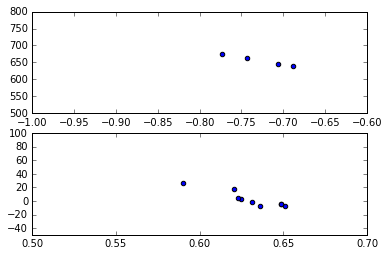

 59%|█████▊    | 130/222 [00:49<00:36,  2.55it/s]

[(0.63057051477547299, 2.8153378007449481), (-0.72758891435362028, 654.69550547491713)]


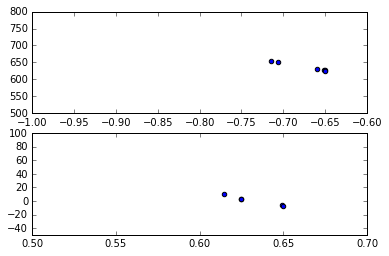

 59%|█████▉    | 131/222 [00:50<00:35,  2.59it/s]

[(0.63262432471246621, 0.80990666398332678), (-0.67181755433494528, 636.02648548781212)]


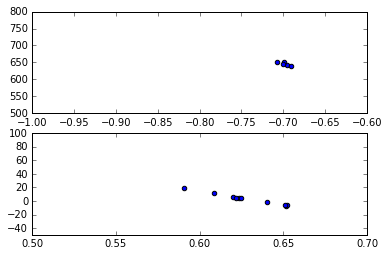

 59%|█████▉    | 132/222 [00:50<00:34,  2.61it/s]

[(0.62842565603564038, 2.982051551859854), (-0.69841511490925345, 645.45047136209473)]


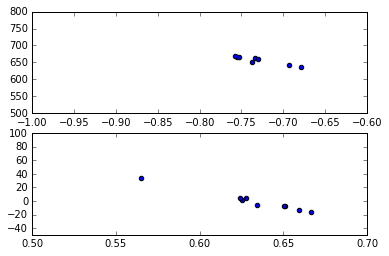

 60%|█████▉    | 133/222 [00:50<00:33,  2.65it/s]

[(0.63387252062519961, -0.45025815722516427), (-0.72982780846972573, 656.0811333794652)]


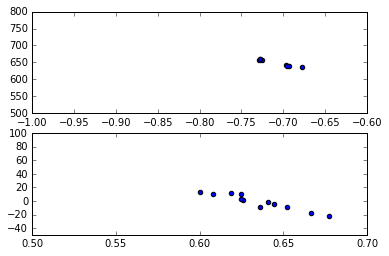

 60%|██████    | 134/222 [00:51<00:34,  2.53it/s]

[(0.63500551666759464, -0.97773660915131677), (-0.70895288229722286, 648.58408632070166)]


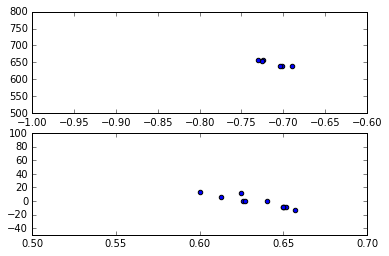

 61%|██████    | 135/222 [00:51<00:32,  2.67it/s]

[(0.63543793424568207, -1.6227452687220265), (-0.71269517756942491, 647.76988502801225)]


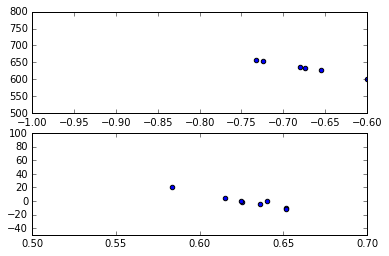

 61%|██████▏   | 136/222 [00:52<00:31,  2.72it/s]

[(0.6285063993537453, -0.25538388082512142), (-0.69320515754665124, 641.64309294216241)]


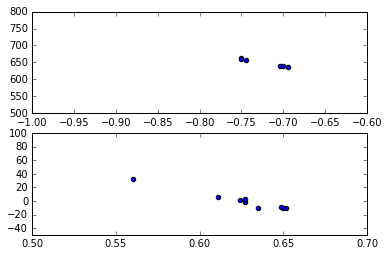

 62%|██████▏   | 137/222 [00:52<00:31,  2.68it/s]

[(0.62592040854526076, 0.046108756264591953), (-0.72371035096465697, 649.19128940780411)]


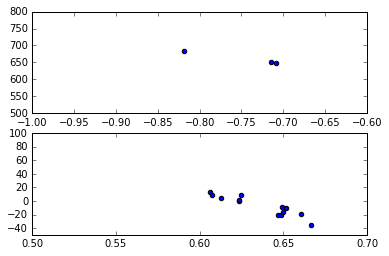

 62%|██████▏   | 138/222 [00:52<00:31,  2.63it/s]

[(0.6362910865832222, -7.1835486613180572), (-0.74693362193362189, 661.49224386724381)]


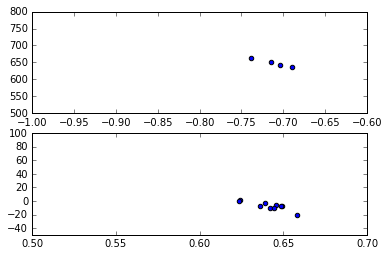

 63%|██████▎   | 139/222 [00:53<00:31,  2.65it/s]

[(0.64108725666190591, -7.1506775556384925), (-0.71169375629645493, 647.88634650928498)]


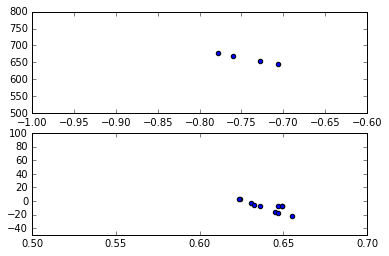

 63%|██████▎   | 140/222 [00:53<00:31,  2.62it/s]

[(0.6400388494023066, -7.9499133410691858), (-0.7427332144979204, 660.50544860368382)]


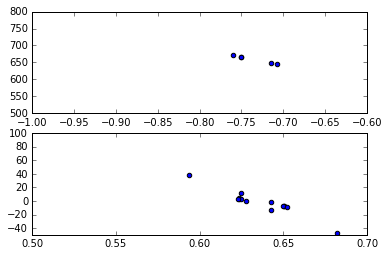

 64%|██████▎   | 141/222 [00:53<00:31,  2.60it/s]

[(0.63660487304019753, -2.1476494187800728), (-0.73632055749128911, 659.36675261324046)]


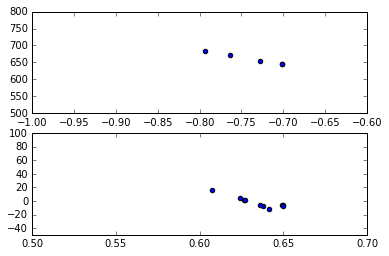

 64%|██████▍   | 142/222 [00:54<00:31,  2.56it/s]

[(0.63495666432351627, -1.9892304893031167), (-0.73755787788687355, 659.06848950562892)]


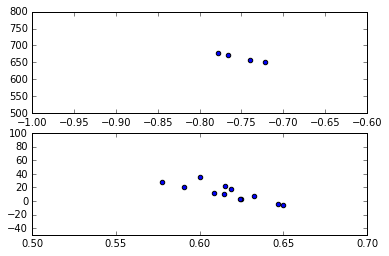

 64%|██████▍   | 143/222 [00:54<00:30,  2.56it/s]

[(0.61708067517562826, 12.408348532460101), (-0.75148936170212766, 664.63734042553187)]


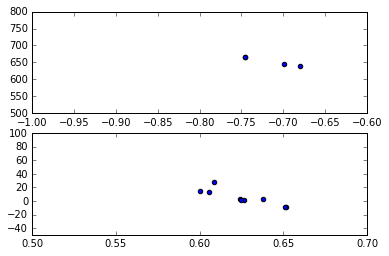

 65%|██████▍   | 144/222 [00:55<00:30,  2.53it/s]

[(0.62559326421836725, 5.3651308460913469), (-0.71779186260478434, 653.90692905336334)]


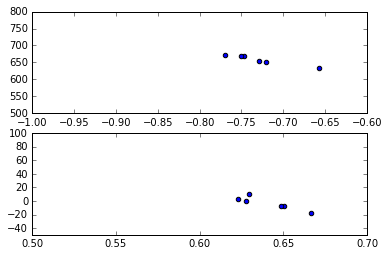

 65%|██████▌   | 145/222 [00:55<00:30,  2.56it/s]

[(0.64095454657277673, -3.0518650258497075), (-0.72882639206240063, 657.1624038692878)]


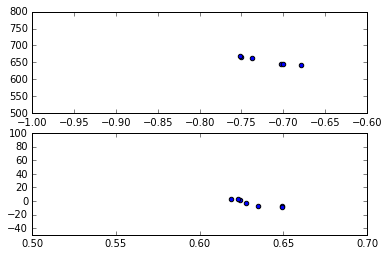

 66%|██████▌   | 146/222 [00:55<00:28,  2.68it/s]

[(0.63253953372925409, -2.9147655971747133), (-0.72022406565969888, 655.09867116682983)]


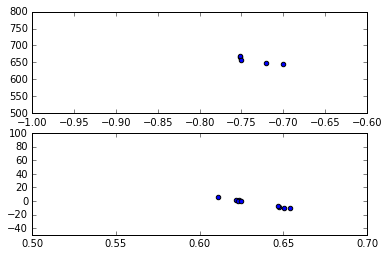

 66%|██████▌   | 147/222 [00:56<00:27,  2.76it/s]

[(0.63370831495673208, -3.1899847419049872), (-0.73495275236238178, 656.65325783710819)]


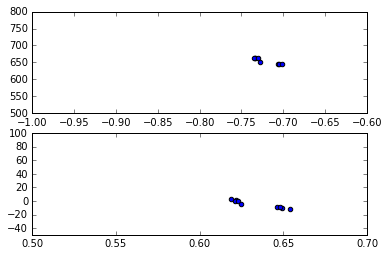

 67%|██████▋   | 148/222 [00:56<00:26,  2.80it/s]

[(0.63413051146449206, -4.3931494852727972), (-0.72167628799961769, 654.28558794346645)]


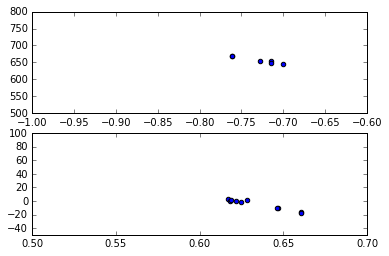

 67%|██████▋   | 149/222 [00:56<00:26,  2.72it/s]

[(0.63441029792717241, -4.8500769384385247), (-0.72959721437982317, 655.74732731037068)]


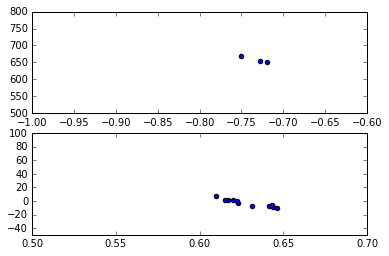

 68%|██████▊   | 150/222 [00:57<00:26,  2.70it/s]

[(0.62854288266084335, -2.8925341780448033), (-0.73242424242424242, 657.93575757575752)]


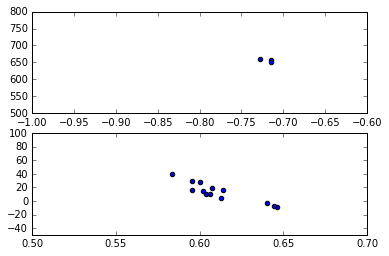

 68%|██████▊   | 151/222 [00:57<00:27,  2.56it/s]

[(0.61162974990089403, 12.945035551229664), (-0.7186147186147186, 655.27272727272725)]


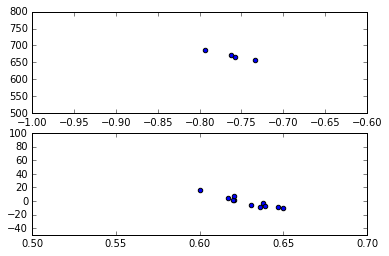

 68%|██████▊   | 152/222 [00:58<00:27,  2.55it/s]

[(0.62892336972770446, -1.1406053141033992), (-0.76147932527242868, 670.47599641737565)]


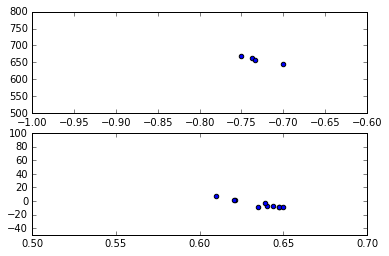

 69%|██████▉   | 153/222 [00:58<00:26,  2.56it/s]

[(0.63538012068480576, -4.4981955974640186), (-0.73004385964912277, 658.93048245614034)]


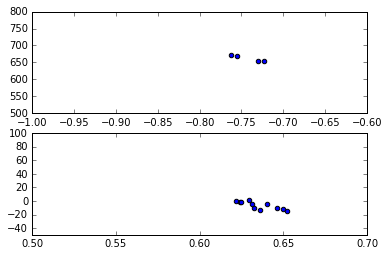

 69%|██████▉   | 154/222 [00:58<00:26,  2.57it/s]

[(0.63538430019465308, -6.4333905808372318), (-0.74290845088717428, 662.17192996129165)]


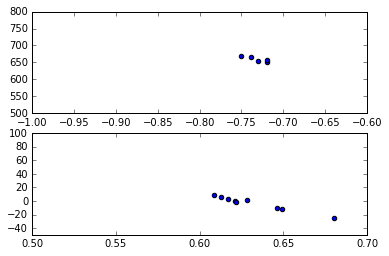

 70%|██████▉   | 155/222 [00:59<00:26,  2.57it/s]

[(0.63172583283734762, -3.384736382453708), (-0.73149219201850779, 659.29679969153653)]


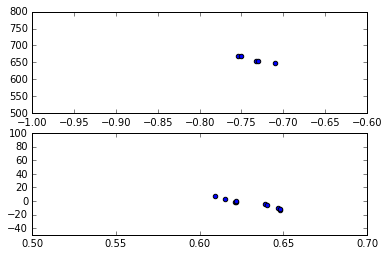

 70%|███████   | 156/222 [00:59<00:26,  2.47it/s]

[(0.63117240205240166, -4.105169165197827), (-0.7351707408233098, 658.36776998283926)]


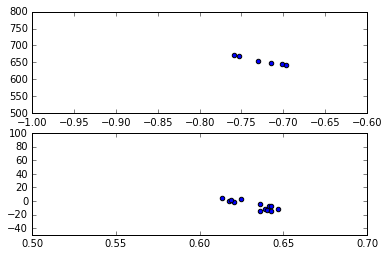

 71%|███████   | 157/222 [01:00<00:25,  2.50it/s]

[(0.63238574468696962, -5.7900625090793749), (-0.72575707982980442, 654.90213670079208)]


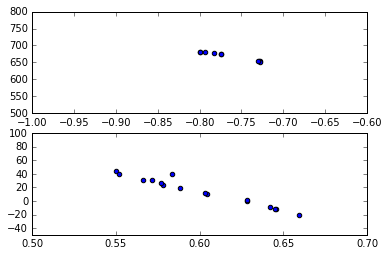

 71%|███████   | 158/222 [01:00<00:25,  2.50it/s]

[(0.60143381623260073, 14.029220461855502), (-0.76394459572065343, 668.24316903540671)]


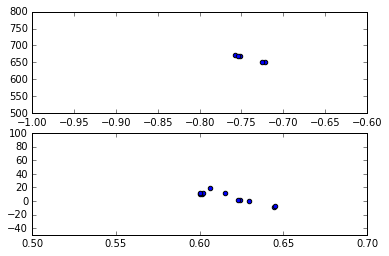

 72%|███████▏  | 159/222 [01:00<00:24,  2.52it/s]

[(0.61738269239101085, 5.68995454632367), (-0.74203827662014121, 662.59555621474647)]


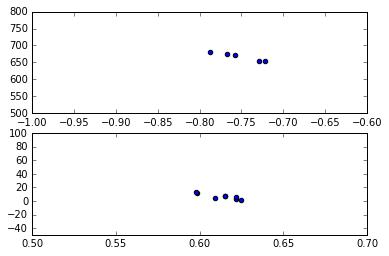

 72%|███████▏  | 160/222 [01:01<00:24,  2.53it/s]

[(0.61311817943238012, 6.8715017681011261), (-0.75286435786435779, 666.45691558441558)]


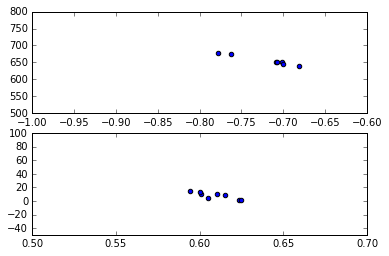

 73%|███████▎  | 161/222 [01:01<00:24,  2.51it/s]

[(0.60924932414050248, 8.1444121212070471), (-0.71989696965417926, 655.77561447642063)]


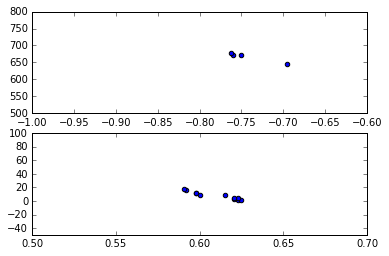

 73%|███████▎  | 162/222 [01:02<00:24,  2.42it/s]

[(0.60961406542647467, 8.4105859674742245), (-0.74188923395445139, 666.33234989648031)]


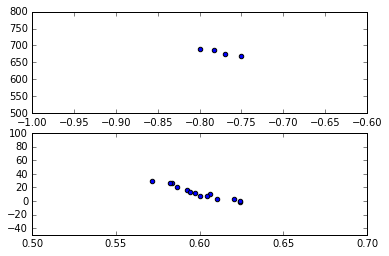

 73%|███████▎  | 163/222 [01:02<00:24,  2.45it/s]

[(0.59979614623452804, 12.364239304017483), (-0.77545986622073582, 679.339381270903)]


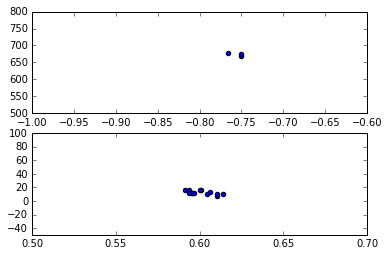

 74%|███████▍  | 164/222 [01:02<00:22,  2.54it/s]

[(0.60101607831498227, 12.6291648667305), (-0.75555555555555554, 673.31111111111113)]


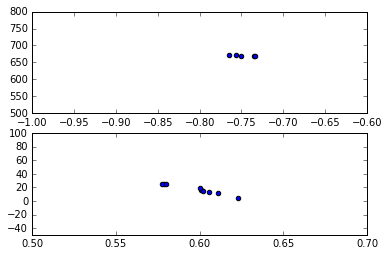

 74%|███████▍  | 165/222 [01:03<00:21,  2.65it/s]

[(0.5976732278748913, 17.320768532426712), (-0.74801801801801804, 669.72244303126649)]


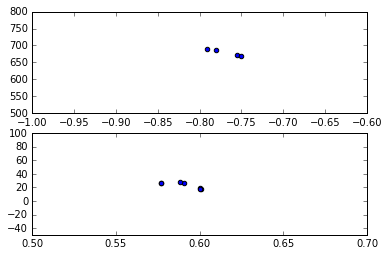

 75%|███████▍  | 166/222 [01:03<00:21,  2.56it/s]

[(0.59055782336244522, 23.22481247977046), (-0.76918525871305232, 677.93346095670256)]


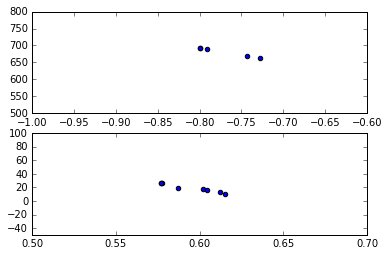

 75%|███████▌  | 167/222 [01:04<00:21,  2.55it/s]

[(0.59409028517223117, 19.710173720872447), (-0.77250582750582741, 681.04342657342647)]


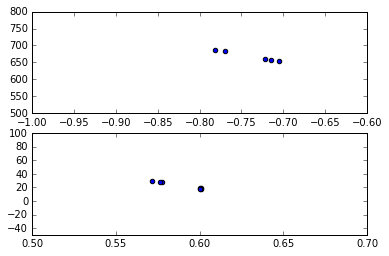

 76%|███████▌  | 168/222 [01:04<00:20,  2.61it/s]

[(0.58952365019015651, 22.994992694879336), (-0.73830683205683212, 668.34394425019423)]


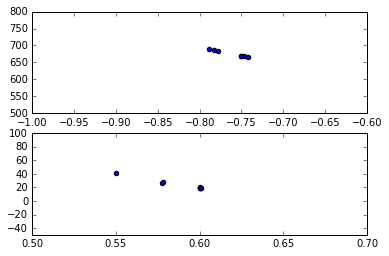

 76%|███████▌  | 169/222 [01:04<00:20,  2.58it/s]

[(0.58831741703542551, 23.989339094551269), (-0.76260640754315578, 676.33866656170562)]


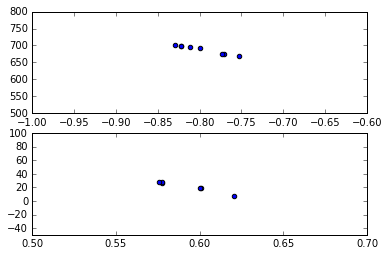

 77%|███████▋  | 170/222 [01:05<00:19,  2.70it/s]

[(0.5919843478574619, 21.310125839700174), (-0.79788014472721003, 687.86237628967353)]


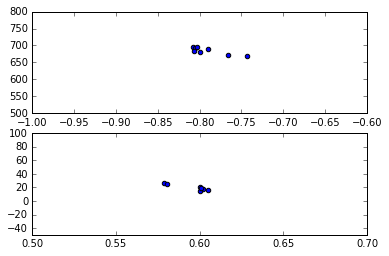

 77%|███████▋  | 171/222 [01:05<00:19,  2.67it/s]

[(0.59535396290625542, 19.915747067663258), (-0.79014914397802749, 684.7415271016929)]


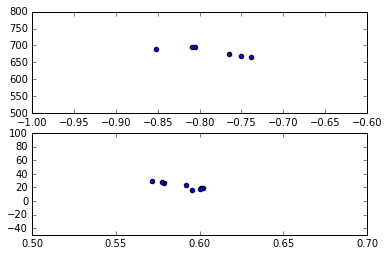

 77%|███████▋  | 172/222 [01:05<00:18,  2.64it/s]

[(0.58974322812769731, 22.635640039194278), (-0.78669115517959531, 681.84927525460159)]


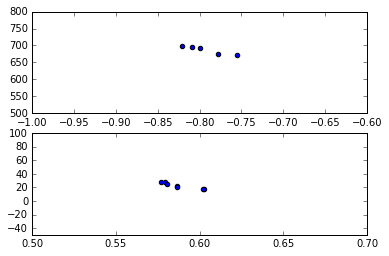

 78%|███████▊  | 173/222 [01:06<00:19,  2.49it/s]

[(0.58767421023957822, 22.684489153030597), (-0.7928571428571427, 686.37238095238104)]


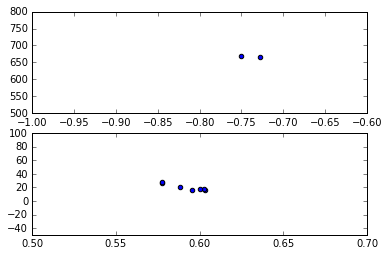

 78%|███████▊  | 174/222 [01:06<00:19,  2.53it/s]

[(0.59211049775594737, 20.573386760678918), (-0.73863636363636365, 666.34090909090912)]


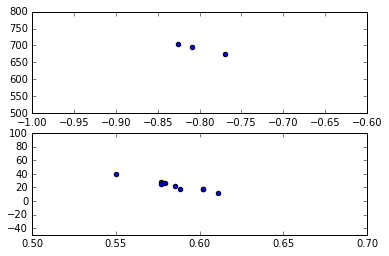

 79%|███████▉  | 175/222 [01:07<00:18,  2.60it/s]

[(0.58507179042956292, 23.184143823340872), (-0.80161384509210587, 692.00069013112488)]


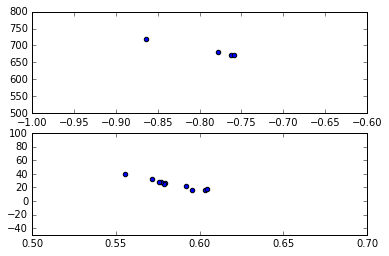

 79%|███████▉  | 176/222 [01:07<00:17,  2.69it/s]

[(0.58333838200263277, 25.228724367610976), (-0.79048489824351886, 685.65109842265019)]


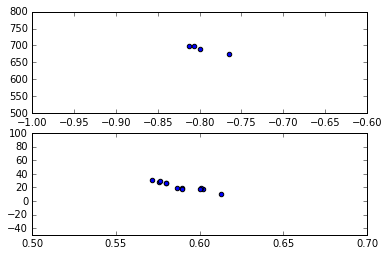

 80%|███████▉  | 177/222 [01:07<00:16,  2.70it/s]

[(0.58868143516022275, 22.111301751213546), (-0.79591437381404173, 689.94157969639468)]


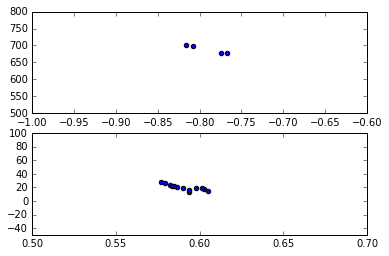

 80%|████████  | 178/222 [01:08<00:16,  2.62it/s]

[(0.59053328020588469, 20.236037496849299), (-0.79148091046040858, 688.48429820638353)]


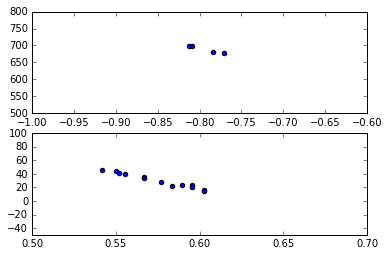

 81%|████████  | 179/222 [01:08<00:16,  2.62it/s]

[(0.57525701804422547, 30.104490007516002), (-0.79403942428035046, 689.2757548498123)]


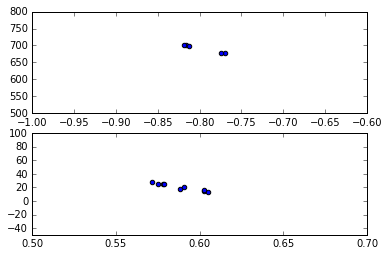

 81%|████████  | 180/222 [01:09<00:16,  2.59it/s]

[(0.58816576985768543, 20.599770406742355), (-0.79815456049327016, 690.97554364989855)]


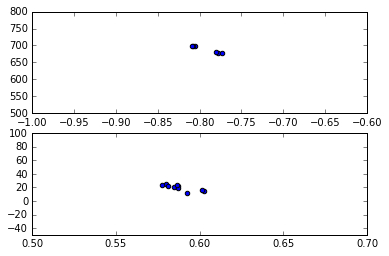

 82%|████████▏ | 181/222 [01:09<00:15,  2.58it/s]

[(0.58807837033919008, 19.99416673680949), (-0.79223396296567017, 688.49421851860882)]


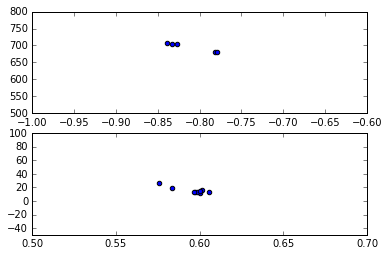

 82%|████████▏ | 182/222 [01:09<00:16,  2.41it/s]

[(0.59530220596441275, 15.60935860284118), (-0.81186091686091688, 695.74683760683763)]


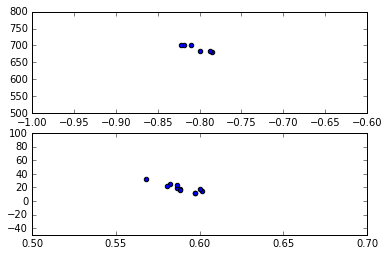

 82%|████████▏ | 183/222 [01:10<00:15,  2.46it/s]

[(0.58869309988608332, 19.421079661142485), (-0.80405699026388688, 691.8048008823871)]


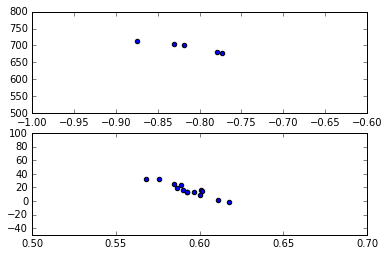

 83%|████████▎ | 184/222 [01:10<00:15,  2.39it/s]

[(0.59333324928485431, 16.524545996921038), (-0.81540940498523207, 695.42109301333016)]


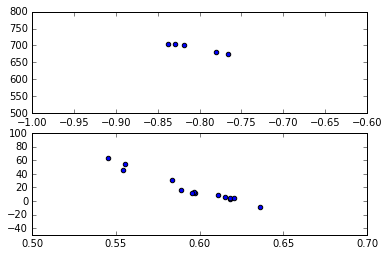

 83%|████████▎ | 185/222 [01:11<00:15,  2.44it/s]

[(0.59551147644426539, 19.118136708600293), (-0.80639092307384996, 692.90715758774297)]


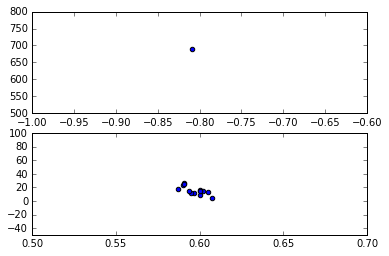

 84%|████████▍ | 186/222 [01:11<00:15,  2.39it/s]

[(0.59674109398156527, 15.695075041798624), (-0.80952380952380953, 689.76190476190482)]


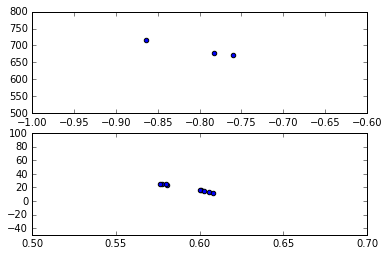

 84%|████████▍ | 187/222 [01:11<00:14,  2.50it/s]

[(0.59238278413357437, 19.023844625888273), (-0.8020816864295125, 688.82042160737819)]


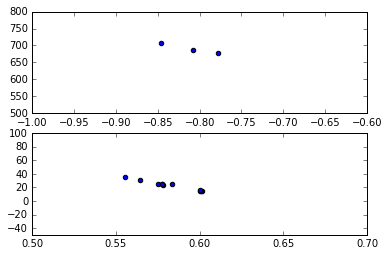

 85%|████████▍ | 188/222 [01:12<00:13,  2.60it/s]

[(0.58310148460648403, 22.779813895048367), (-0.81054131054131062, 690.75783475783464)]


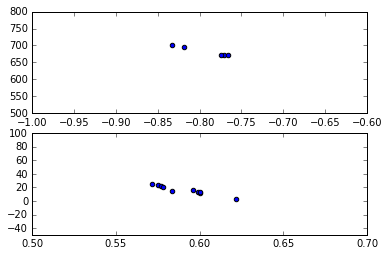

 85%|████████▌ | 189/222 [01:12<00:13,  2.49it/s]

[(0.59020236714730179, 16.367866557759434), (-0.79276078759949731, 683.33324675324684)]


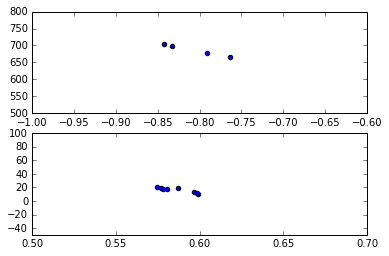

 86%|████████▌ | 190/222 [01:13<00:12,  2.50it/s]

[(0.58639199540036913, 16.260251033949963), (-0.80732354141166873, 686.86041411668714)]


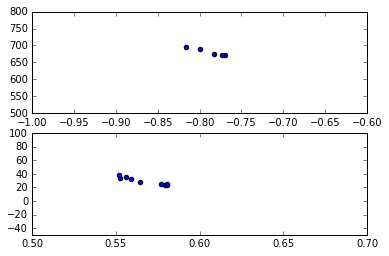

 86%|████████▌ | 191/222 [01:13<00:12,  2.54it/s]

[(0.56680486782396788, 29.450863199105115), (-0.78817865364449202, 681.25798462407158)]


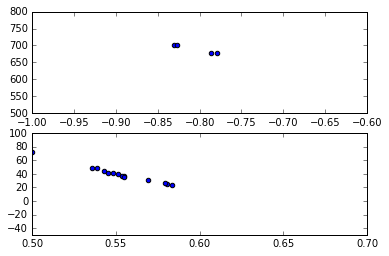

 86%|████████▋ | 192/222 [01:13<00:11,  2.51it/s]

[(0.5567558517704897, 36.897794782257549), (-0.8061602360809037, 689.65781203591041)]


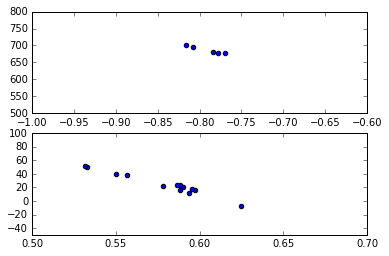

 87%|████████▋ | 193/222 [01:14<00:11,  2.51it/s]

[(0.57793142543480958, 25.084956671227339), (-0.79085482243376981, 686.5123074491496)]


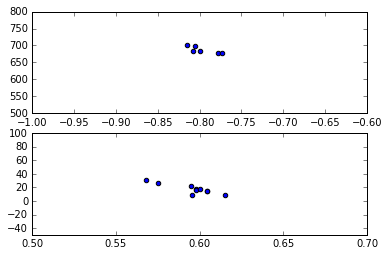

 87%|████████▋ | 194/222 [01:14<00:10,  2.65it/s]

[(0.59527064183656597, 17.930848181619087), (-0.79668293752554276, 687.12985731648143)]


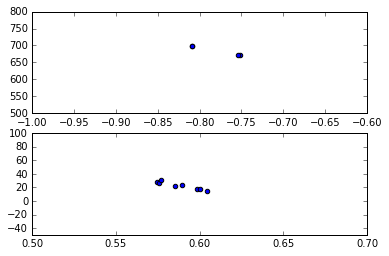

 88%|████████▊ | 195/222 [01:15<00:10,  2.53it/s]

[(0.58817177611388183, 22.592330536718322), (-0.78139258402416301, 685.05974873080129)]


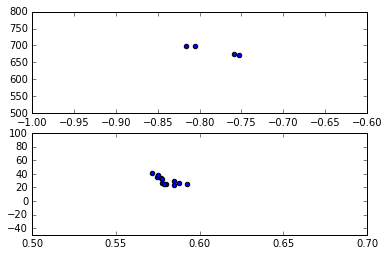

 88%|████████▊ | 196/222 [01:15<00:10,  2.55it/s]

[(0.58008881862251727, 30.256396582101441), (-0.78313653625119417, 685.80643451242895)]


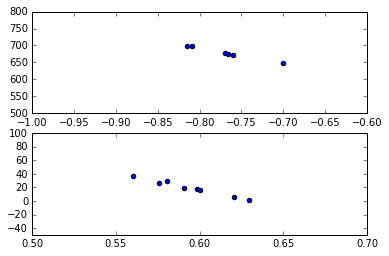

 89%|████████▊ | 197/222 [01:15<00:09,  2.62it/s]

[(0.59455837205637585, 19.419581885377859), (-0.76992114006298396, 678.27548775101968)]


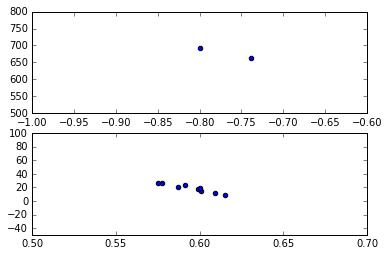

 89%|████████▉ | 198/222 [01:16<00:09,  2.58it/s]

[(0.59513423337790472, 18.832120669343894), (-0.76956521739130435, 678.04782608695655)]


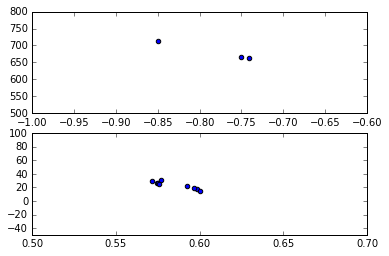

 90%|████████▉ | 199/222 [01:16<00:09,  2.55it/s]

[(0.58460127330437872, 23.748768712730794), (-0.78024691358024689, 680.67962962962963)]


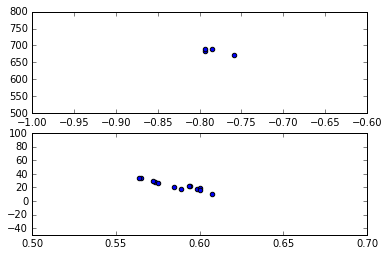

 90%|█████████ | 200/222 [01:17<00:08,  2.54it/s]

[(0.5859431388140236, 23.03575347136228), (-0.7826354679802956, 683.96428571428578)]


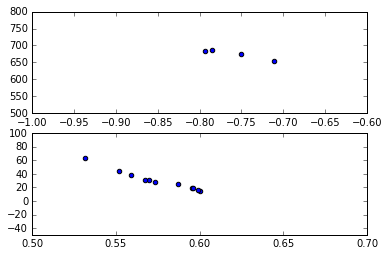

 91%|█████████ | 201/222 [01:17<00:07,  2.63it/s]

[(0.57556376117581221, 29.965802434292449), (-0.76008956214064571, 674.99505196815562)]


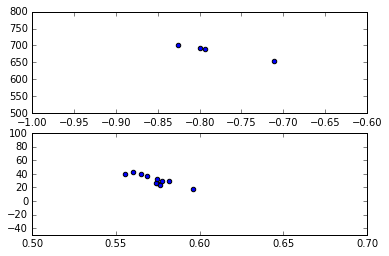

 91%|█████████ | 202/222 [01:17<00:07,  2.61it/s]

[(0.57310824384925385, 31.387242175408186), (-0.78282892867291842, 684.68084683148629)]


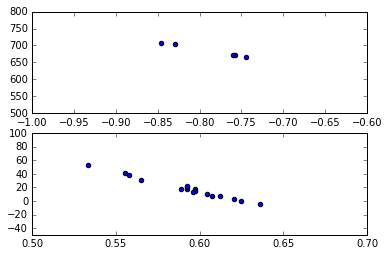

 91%|█████████▏| 203/222 [01:18<00:07,  2.59it/s]

[(0.59263638810338182, 18.391197051488131), (-0.78772297539756853, 684.37107743653928)]


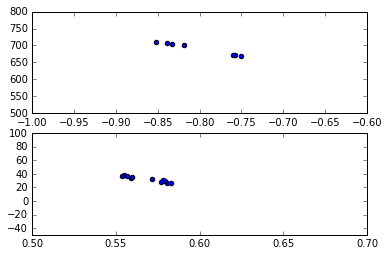

 92%|█████████▏| 204/222 [01:18<00:06,  2.57it/s]

[(0.5685084562281868, 32.548690330304929), (-0.80137891976601661, 690.48701531443464)]


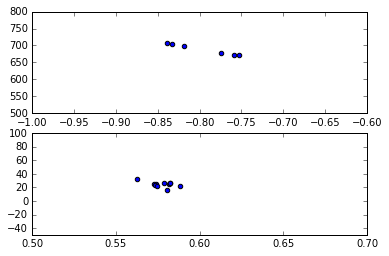

 92%|█████████▏| 205/222 [01:18<00:06,  2.55it/s]

[(0.57734673651603152, 24.918409114731116), (-0.7960659497284176, 687.58027042330662)]


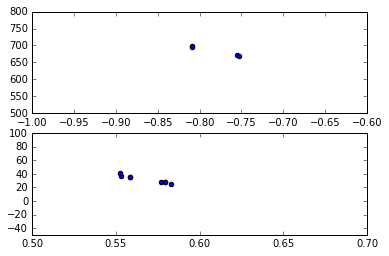

 93%|█████████▎| 206/222 [01:19<00:06,  2.45it/s]

[(0.56752028475815419, 32.315161046244683), (-0.78171050387713548, 683.4567558959543)]


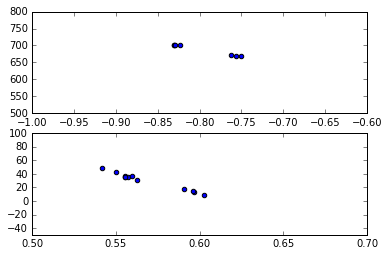

 93%|█████████▎| 207/222 [01:19<00:06,  2.48it/s]

[(0.56865260119671746, 29.949248628423693), (-0.79747692698092365, 688.29425515046546)]


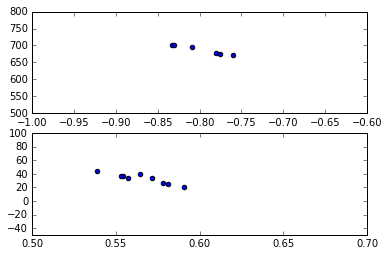

 94%|█████████▎| 208/222 [01:20<00:05,  2.48it/s]

[(0.56543185378315064, 33.076446089521141), (-0.79815121208379647, 687.5438268098942)]


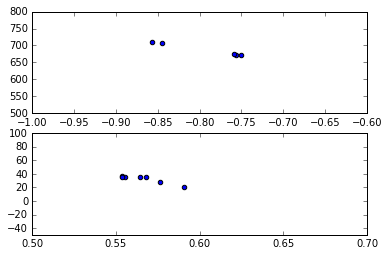

 94%|█████████▍| 209/222 [01:20<00:05,  2.47it/s]

[(0.56608031017423344, 32.676022101076626), (-0.7932611104436168, 686.53249215694132)]


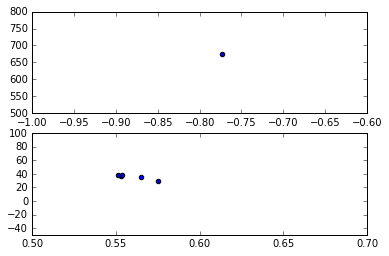

 95%|█████████▍| 210/222 [01:20<00:04,  2.49it/s]

[(0.55963361309228121, 35.748075326933858), (-0.77272727272727271, 674.0)]


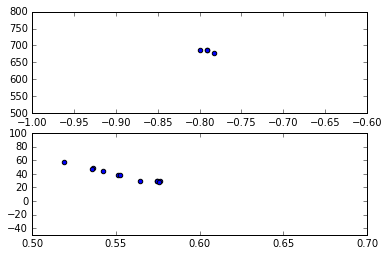

 95%|█████████▌| 211/222 [01:21<00:04,  2.46it/s]

[(0.55481095813589665, 38.443294892930354), (-0.79148550724637678, 684.4234601449275)]


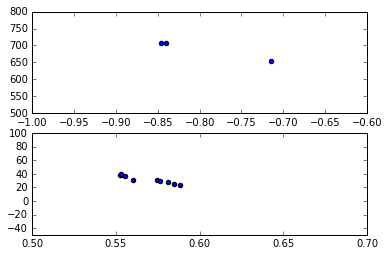

 95%|█████████▌| 212/222 [01:21<00:04,  2.49it/s]

[(0.56799924356519338, 32.157723122786116), (-0.80014652014652021, 689.60908424908428)]


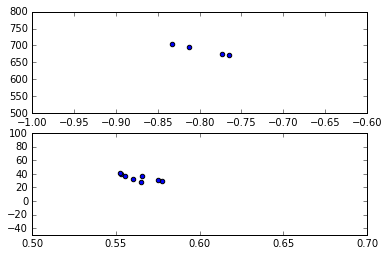

 96%|█████████▌| 213/222 [01:22<00:03,  2.50it/s]

[(0.56310584780407325, 34.797230315461334), (-0.79581662210338688, 687.38803475935833)]


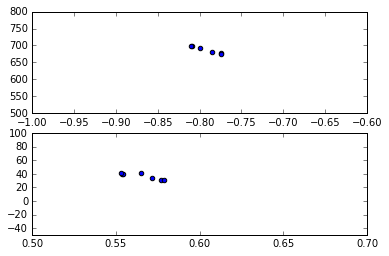

 96%|█████████▋| 214/222 [01:22<00:03,  2.52it/s]

[(0.56480683676513987, 37.051034180660714), (-0.79267481767481762, 686.81512762762759)]


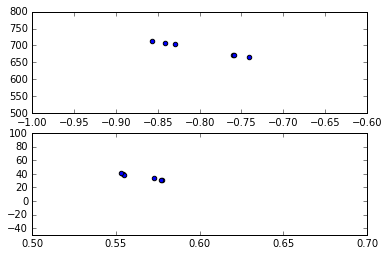

 97%|█████████▋| 215/222 [01:22<00:02,  2.53it/s]

[(0.56495351082486733, 36.231028598231141), (-0.79786676874840234, 688.85473482040015)]


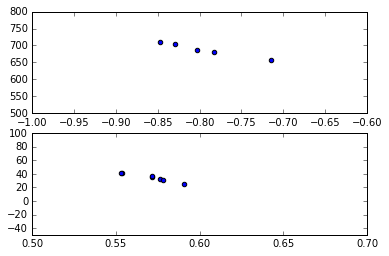

 97%|█████████▋| 216/222 [01:23<00:02,  2.53it/s]

[(0.57069471701993713, 34.829323712185406), (-0.79537980365280991, 687.57057064320293)]


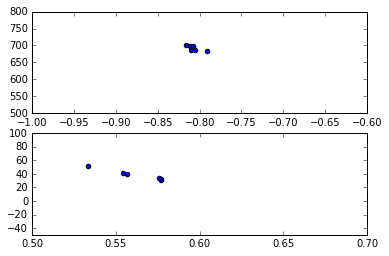

 98%|█████████▊| 217/222 [01:23<00:01,  2.53it/s]

[(0.56226976377767712, 38.291853293198578), (-0.80724583446699516, 692.73302564802452)]


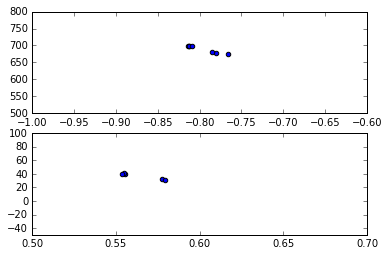

 98%|█████████▊| 218/222 [01:24<00:01,  2.47it/s]

[(0.56416243100164054, 37.050617868295845), (-0.79723925200547463, 689.69382963661235)]


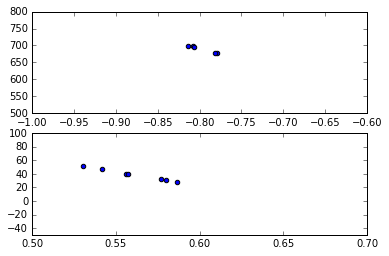

 99%|█████████▊| 219/222 [01:24<00:01,  2.54it/s]

[(0.56117878414839617, 38.446662699058436), (-0.79784070462451895, 688.8613131530384)]


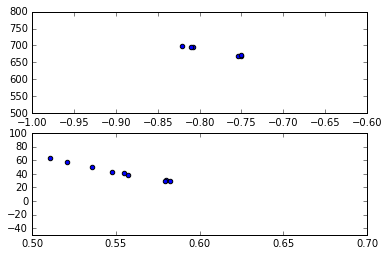

 99%|█████████▉| 220/222 [01:24<00:00,  2.60it/s]

[(0.55205442456816378, 42.752181145104664), (-0.78222430367584961, 683.53961691625102)]


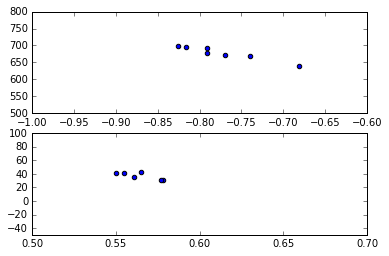

100%|█████████▉| 221/222 [01:25<00:00,  2.56it/s]

[(0.56429010693014148, 37.383957400537582), (-0.77361281747716748, 677.77903079589419)]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white.mp4 

CPU times: user 1min 52s, sys: 1min 51s, total: 3min 44s
Wall time: 1min 26s


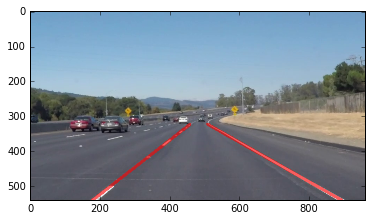

In [73]:
white_output = 'white.mp4'
clip1 = VideoFileClip("solidWhiteRight.mp4")
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
white_clip = clip1.fl_image(find_lines) #NOTE: this function expects color images!!

%time white_clip.write_videofile(white_output, audio=False)

This is to allow me to play the video inline.

In [74]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

This is the video where the solid yellow lane on the left.

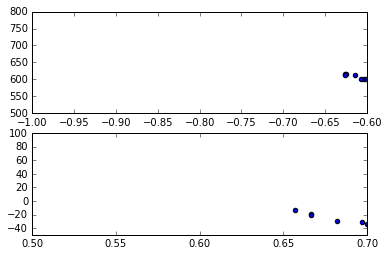

[(0.67385281385281381, -22.630649350649342), (-0.61495178162798303, 608.74160109123738)]
[MoviePy] >>>> Building video yellow.mp4
[MoviePy] Writing video yellow.mp4


  0%|          | 0/682 [00:00<?, ?it/s]

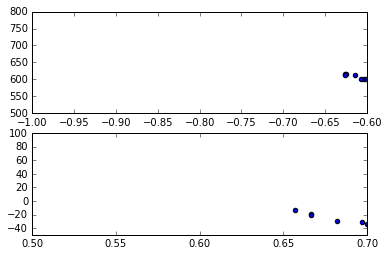

  0%|          | 1/682 [00:00<04:44,  2.39it/s]

[(0.67385281385281381, -22.630649350649342), (-0.61495178162798303, 608.74160109123738)]


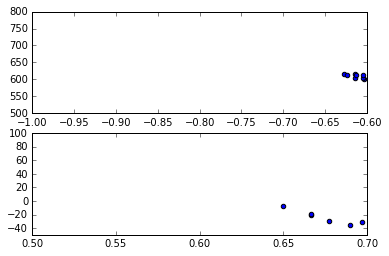

  0%|          | 2/682 [00:00<04:39,  2.43it/s]

[(0.67456292625925551, -23.691182683340639), (-0.61311476112477914, 610.11774741461841)]


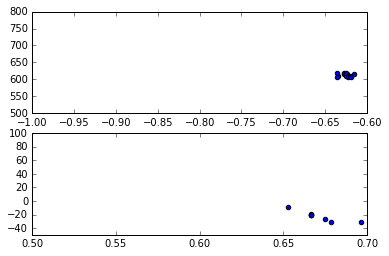

  0%|          | 3/682 [00:01<04:42,  2.40it/s]

[(0.67121598639455782, -22.364434523809507), (-0.62627682063725121, 612.33721946588219)]


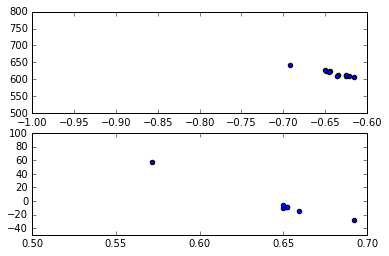

  1%|          | 4/682 [00:01<04:46,  2.37it/s]

[(0.64673928555916138, -2.9071828792325669), (-0.63998315414881091, 618.01966282547176)]


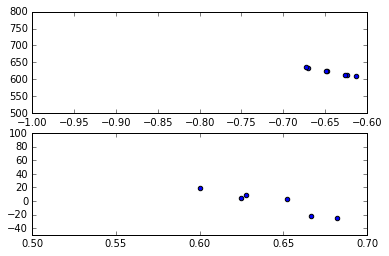

  1%|          | 5/682 [00:02<04:59,  2.26it/s]

[(0.64226095637875202, -1.7985364259378305), (-0.64330774971608251, 621.40295845725905)]


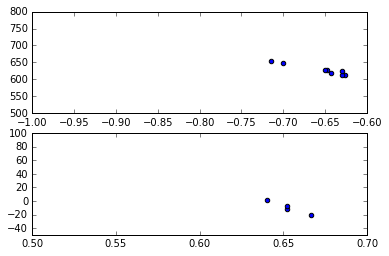

  1%|          | 6/682 [00:02<04:39,  2.42it/s]

[(0.65275362318840568, -9.4634782608695645), (-0.65512287788037049, 627.95929958113902)]


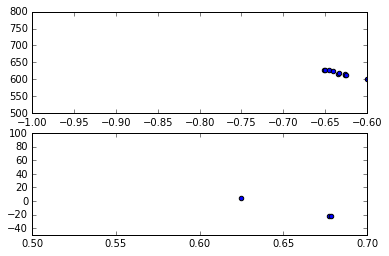

  1%|          | 7/682 [00:02<04:23,  2.56it/s]

[(0.66033026113671267, -13.194508448540716), (-0.63691129239144373, 620.23297227077194)]


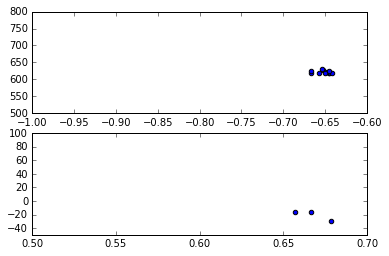

  1%|          | 8/682 [00:03<04:09,  2.70it/s]

[(0.66746031746031742, -20.949206349206332), (-0.65215552723421089, 621.75901233947525)]


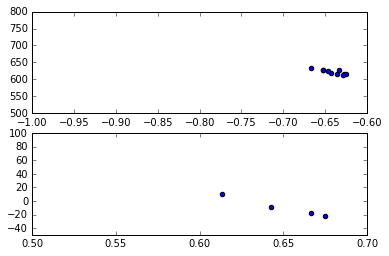

  1%|▏         | 9/682 [00:03<04:18,  2.61it/s]

[(0.64954004329004322, -9.9521103896103966), (-0.64130450359058611, 621.38220745807121)]


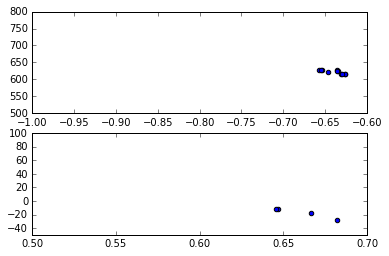

  1%|▏         | 10/682 [00:03<04:11,  2.67it/s]

[(0.66034425133689845, -17.154077540106954), (-0.63947095013564803, 622.02095465150444)]


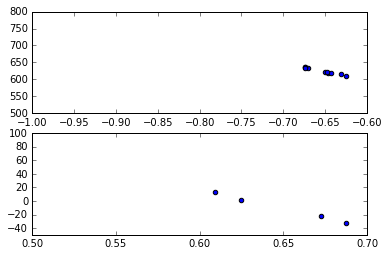

  2%|▏         | 11/682 [00:04<04:16,  2.62it/s]

[(0.6485721982758621, -9.7684536637931103), (-0.65363822442147579, 624.52511967910618)]


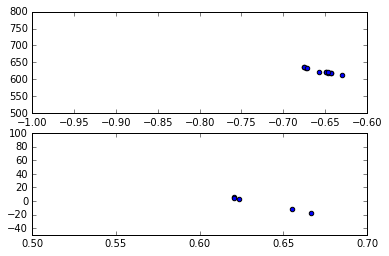

  2%|▏         | 12/682 [00:04<04:17,  2.60it/s]

[(0.63731900283624421, -3.2509926854754441), (-0.65514511048303448, 624.67264511143776)]


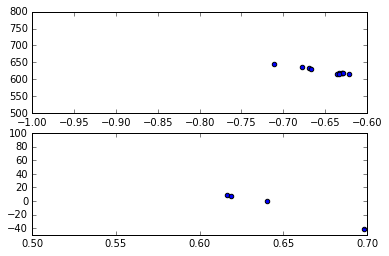

  2%|▏         | 13/682 [00:05<04:06,  2.71it/s]

[(0.64333061068910125, -6.3000500966538766), (-0.64890982608692671, 624.00405312834857)]


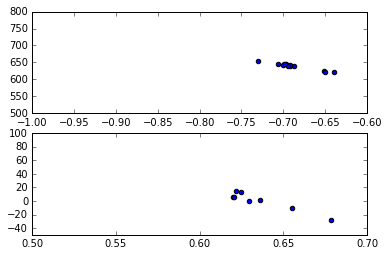

  2%|▏         | 14/682 [00:05<04:06,  2.71it/s]

[(0.63590042798894042, 0.30623687136818489), (-0.68743926690452917, 638.59546137000802)]


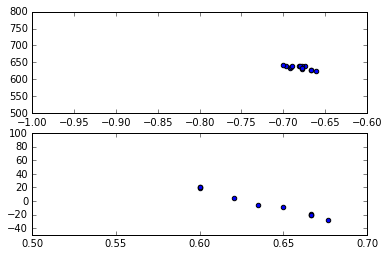

  2%|▏         | 15/682 [00:05<04:05,  2.72it/s]

[(0.6381775628023092, -3.7688776200135123), (-0.68088510360605914, 634.98922443151866)]


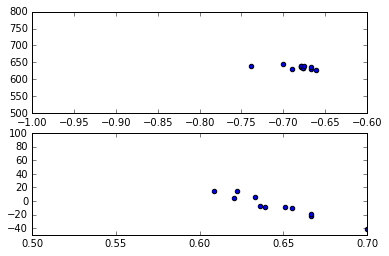

  2%|▏         | 16/682 [00:06<04:19,  2.56it/s]

[(0.63995426411764744, -3.6806789235168482), (-0.6822105772424627, 635.66296996683639)]


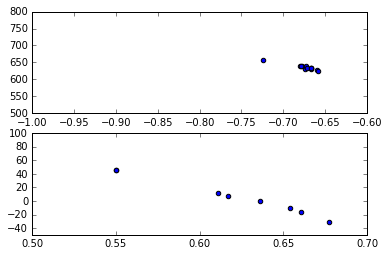

  2%|▏         | 17/682 [00:06<04:08,  2.68it/s]

[(0.6194730351646055, 6.8545412396827246), (-0.6742075784880921, 635.4910206629894)]


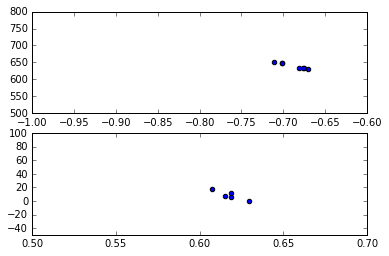

  3%|▎         | 18/682 [00:06<03:56,  2.80it/s]

[(0.61805046805046815, 8.2288766788766559), (-0.68842955215851898, 639.48975233190924)]


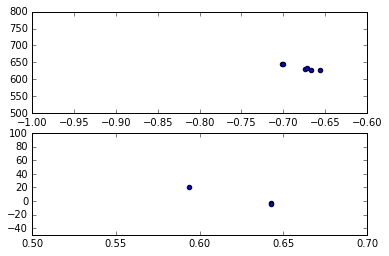

  3%|▎         | 19/682 [00:07<04:02,  2.74it/s]

[(0.62648809523809523, 4.2723214285714262), (-0.67833534252271377, 635.02848372034759)]


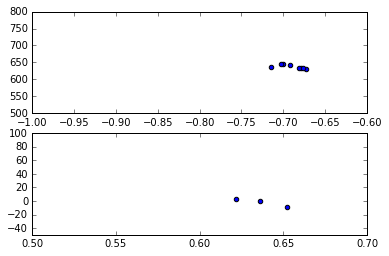

  3%|▎         | 20/682 [00:07<04:09,  2.66it/s]

[(0.63671972367624541, -2.0293059858277047), (-0.68980568840253365, 637.45992422169047)]


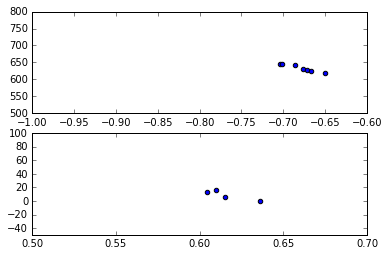

  3%|▎         | 21/682 [00:08<04:02,  2.73it/s]

[(0.6165388780249812, 8.6417035885271929), (-0.67934916738123641, 634.01217032424779)]


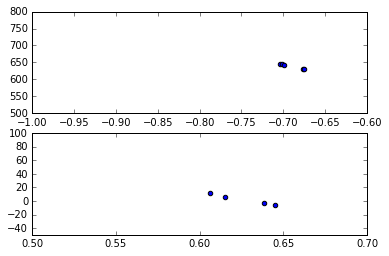

  3%|▎         | 22/682 [00:08<04:13,  2.60it/s]

[(0.62622609602705692, 2.2065556840779834), (-0.69115270898396841, 638.73918434640439)]


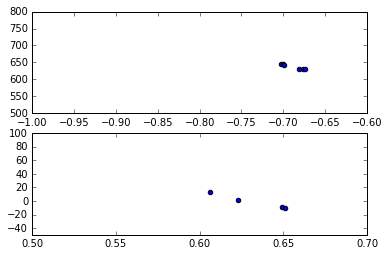

  3%|▎         | 23/682 [00:08<04:12,  2.61it/s]

[(0.63232425586198882, -1.3480251681086628), (-0.68895208695229415, 637.00139889445609)]


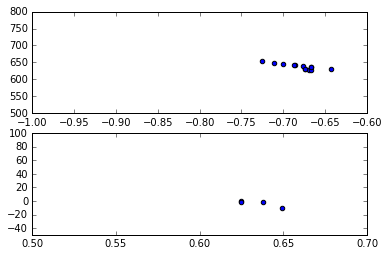

  4%|▎         | 24/682 [00:09<04:10,  2.62it/s]

[(0.63420099160945842, -3.0632866132723109), (-0.68051562445527325, 637.34019058432852)]


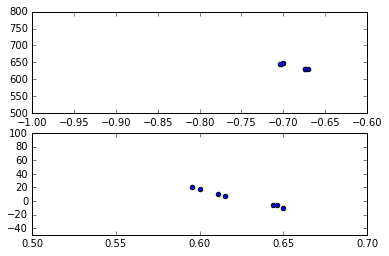

  4%|▎         | 25/682 [00:09<04:41,  2.34it/s]

[(0.62308083268674408, 4.6203038067569979), (-0.68771189467301352, 638.20122281545844)]


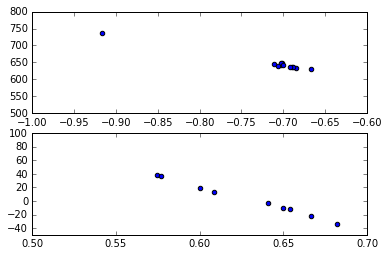

  4%|▍         | 26/682 [00:10<05:29,  1.99it/s]

[(0.62816038417333508, 2.9095578642757181), (-0.71363113971312986, 647.99111084385038)]


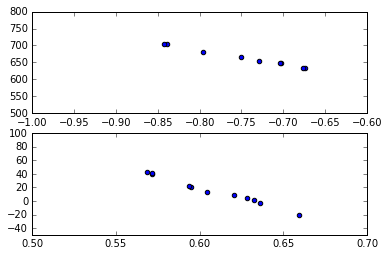

  4%|▍         | 27/682 [00:11<06:39,  1.64it/s]

[(0.60740059452180184, 15.833775928042252), (-0.74602615759115543, 663.02065706267217)]


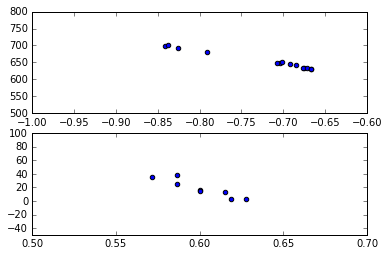

  4%|▍         | 28/682 [00:11<06:56,  1.57it/s]

[(0.60074177167904241, 18.77288366133746), (-0.72456763858824147, 654.9026246776948)]


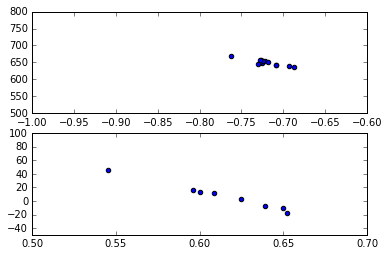

  4%|▍         | 29/682 [00:12<05:56,  1.83it/s]

[(0.61454585571433396, 6.9782920129387591), (-0.72012000829733624, 649.46244286692877)]


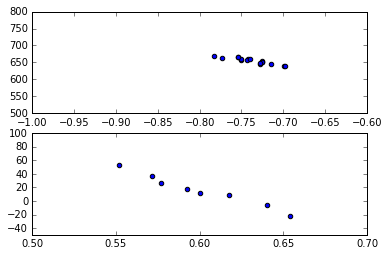

  4%|▍         | 30/682 [00:12<05:20,  2.03it/s]

[(0.60052019894311981, 15.932746084581794), (-0.73712982225069912, 654.414909545417)]


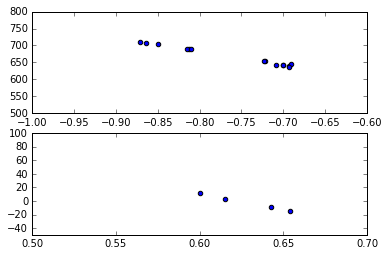

  5%|▍         | 31/682 [00:13<04:51,  2.24it/s]

[(0.62802197802197801, -2.2478021978022014), (-0.76102745924875426, 667.3903026551319)]


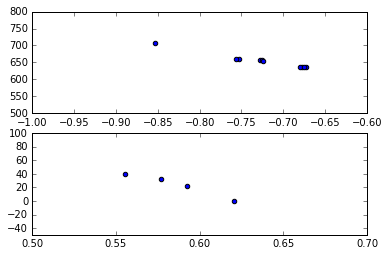

  5%|▍         | 32/682 [00:13<04:25,  2.45it/s]

[(0.58644022006090968, 23.298752333235115), (-0.72449062062454939, 653.92395388755699)]


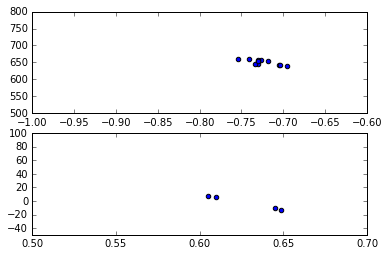

  5%|▍         | 33/682 [00:13<04:28,  2.41it/s]

[(0.62720729860673541, -2.3585651523816722), (-0.72497601905935227, 650.39283798542135)]


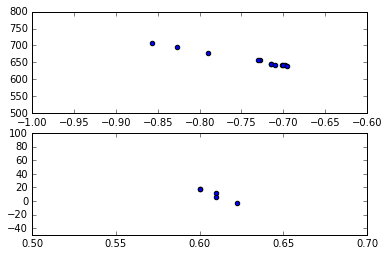

  5%|▍         | 34/682 [00:14<04:13,  2.56it/s]

[(0.60834688346883481, 10.091598915989163), (-0.73877157786135117, 657.845060666167)]


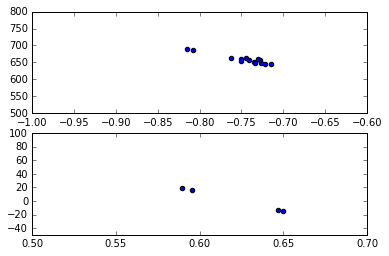

  5%|▌         | 35/682 [00:14<04:02,  2.67it/s]

[(0.62039565826330534, 1.717279411764693), (-0.74723628770302841, 658.98522992141341)]


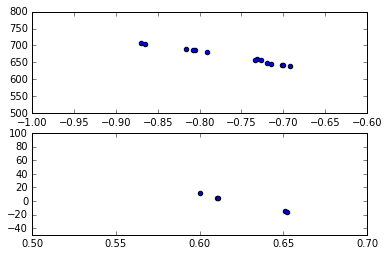

  5%|▌         | 36/682 [00:14<04:01,  2.68it/s]

[(0.62484963329473286, -2.1892744265478425), (-0.76251767168468054, 667.29666692245257)]


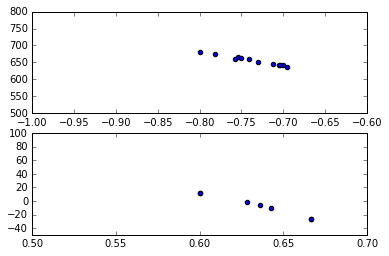

  5%|▌         | 37/682 [00:15<04:29,  2.39it/s]

[(0.63444650587507734, -6.8214594928880627), (-0.73589564636959137, 655.39906605207659)]


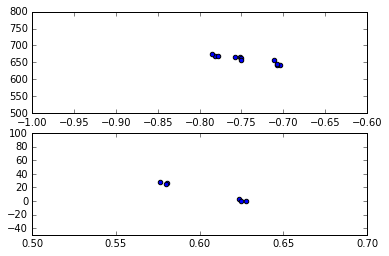

  6%|▌         | 38/682 [00:16<05:29,  1.95it/s]

[(0.60223918241611329, 13.727205407870912), (-0.74392461907709029, 659.05405744481095)]


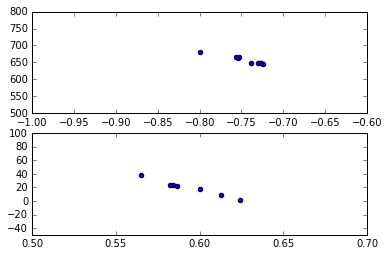

  6%|▌         | 39/682 [00:16<05:00,  2.14it/s]

[(0.59351937601697913, 19.359461634154588), (-0.74563628510961921, 657.09960767892164)]


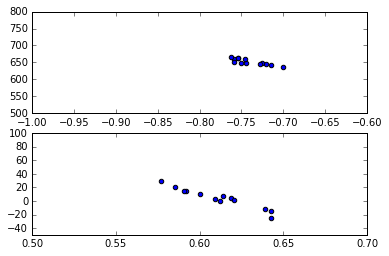

  6%|▌         | 40/682 [00:16<04:45,  2.25it/s]

[(0.61118842254652006, 4.3671269680795515), (-0.73962818070441061, 651.68844798415876)]


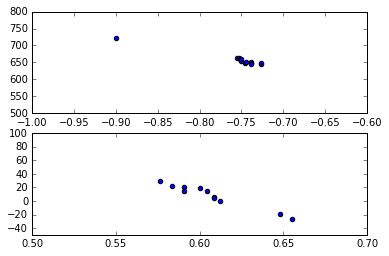

  6%|▌         | 41/682 [00:17<04:33,  2.34it/s]

[(0.60718460260283202, 7.7153068111789942), (-0.75527355715930988, 658.6006711065636)]


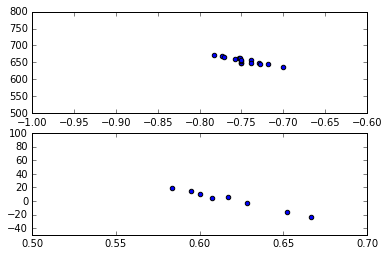

  6%|▌         | 42/682 [00:17<04:21,  2.45it/s]

[(0.61864368250237822, 1.4633344524648919), (-0.74638508042670448, 654.58080806944281)]


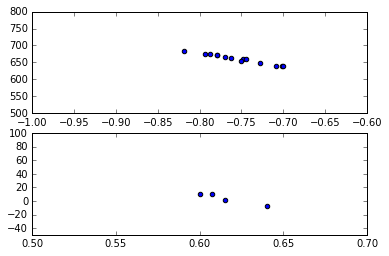

  6%|▋         | 43/682 [00:18<04:26,  2.40it/s]

[(0.6156318681318681, 3.7830769230769334), (-0.75496031331256774, 660.16681396994488)]


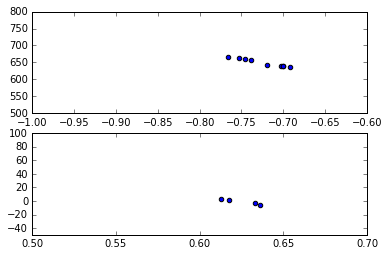

  6%|▋         | 44/682 [00:18<05:34,  1.91it/s]

[(0.62506181358173762, -1.169307400379509), (-0.724308612870736, 648.85097923168382)]


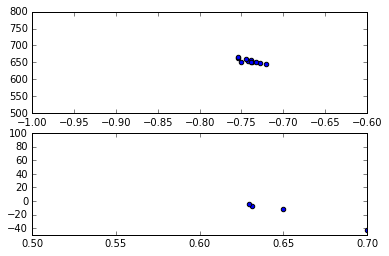

  7%|▋         | 45/682 [00:19<05:01,  2.11it/s]

[(0.63706952566601682, -7.7709226770630266), (-0.74002993711208054, 653.84430090585613)]


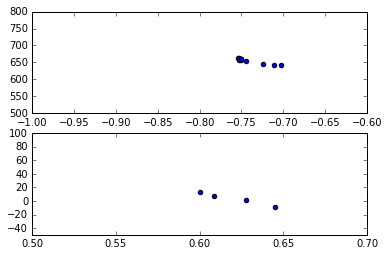

  7%|▋         | 46/682 [00:19<04:43,  2.24it/s]

[(0.62044097981016988, 3.5244805766658942), (-0.73929917700848513, 654.27163987969141)]


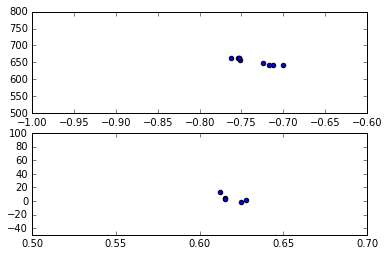

  7%|▋         | 47/682 [00:20<04:50,  2.18it/s]

[(0.6190930218241143, 3.9730992396958755), (-0.73653210443942618, 653.79017139476412)]


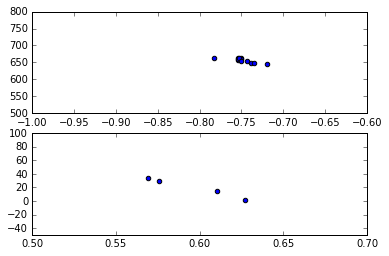

  7%|▋         | 48/682 [00:20<05:33,  1.90it/s]

[(0.59556912014539132, 20.115558452846585), (-0.74868138170579135, 656.36245999545156)]


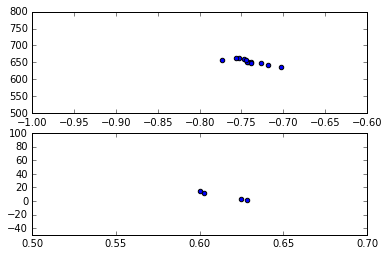

  7%|▋         | 49/682 [00:21<05:39,  1.87it/s]

[(0.61403388278388282, 7.8236492673992615), (-0.74022282483693658, 652.60559617765364)]


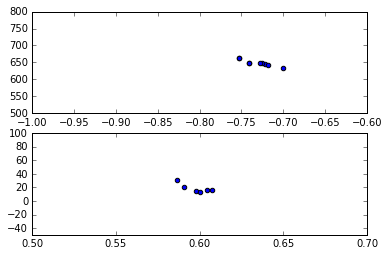

  7%|▋         | 50/682 [00:21<05:10,  2.04it/s]

[(0.5977272759333726, 18.759433362239559), (-0.7312880718835818, 648.21327204054751)]


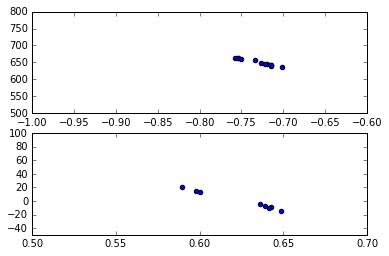

  7%|▋         | 51/682 [00:21<04:41,  2.24it/s]

[(0.62449368559925844, 0.35483642881037269), (-0.7301841396515566, 650.17083365479652)]


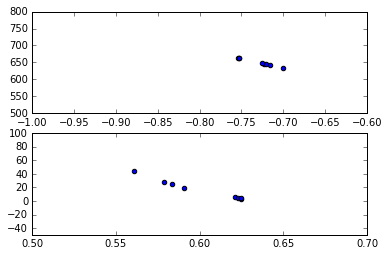

  8%|▊         | 52/682 [00:22<05:16,  1.99it/s]

[(0.60096524306665944, 16.912488346711832), (-0.73079066299373852, 650.13062474190633)]


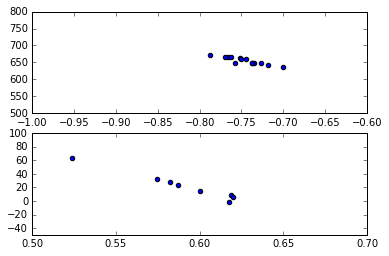

  8%|▊         | 53/682 [00:23<05:32,  1.89it/s]

[(0.59046031018849887, 21.847473394763348), (-0.74594587280907976, 654.79250320670258)]


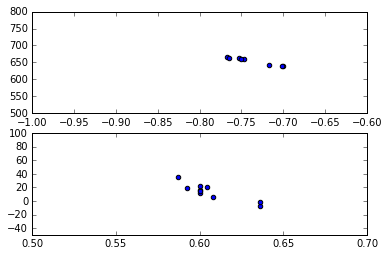

  8%|▊         | 54/682 [00:23<05:07,  2.04it/s]

[(0.60645151287095023, 13.777588036667328), (-0.73785658275523747, 654.16809764276309)]


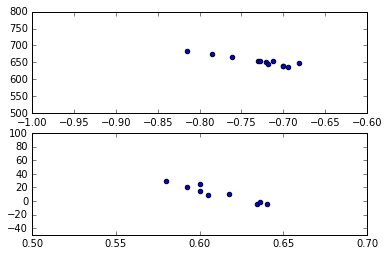

  8%|▊         | 55/682 [00:24<05:01,  2.08it/s]

[(0.61177919857087892, 11.01293877128658), (-0.72877967356295914, 653.54202630691771)]


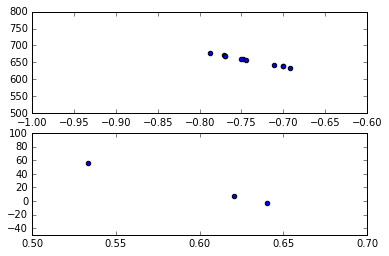

  8%|▊         | 56/682 [00:24<04:39,  2.24it/s]

[(0.59800766283524898, 20.084597701149431), (-0.7404207174693892, 655.60920316383897)]


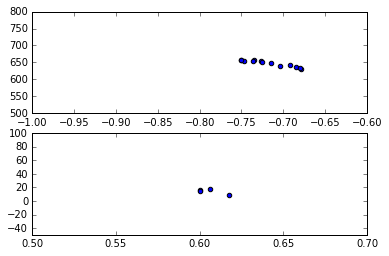

  8%|▊         | 57/682 [00:24<04:22,  2.38it/s]

[(0.6059269162210339, 14.17941176470589), (-0.71720678749605604, 647.05204018672862)]


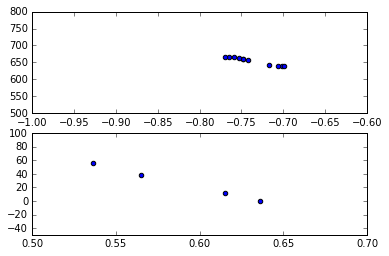

  9%|▊         | 58/682 [00:25<04:12,  2.47it/s]

[(0.58838775222656448, 26.478802215811754), (-0.73723861676538893, 654.63351506819811)]


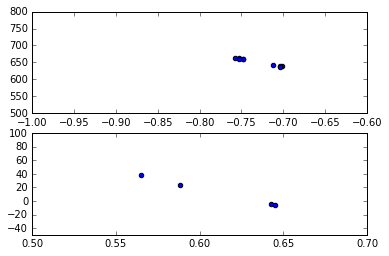

  9%|▊         | 59/682 [00:25<04:11,  2.47it/s]

[(0.61036777965042954, 12.817268141478181), (-0.73126209351793547, 651.04144864845284)]


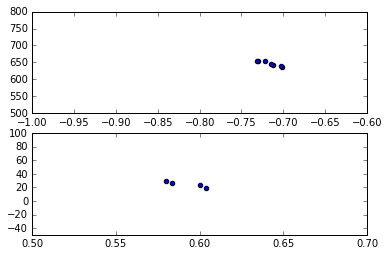

  9%|▉         | 60/682 [00:25<04:16,  2.43it/s]

[(0.59177672955974847, 24.865094339622644), (-0.71630674858978716, 646.38604290847127)]


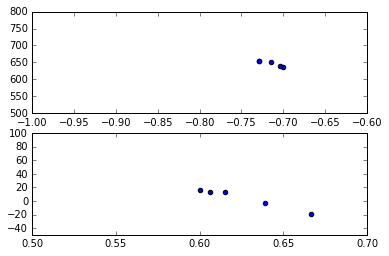

  9%|▉         | 61/682 [00:26<04:14,  2.44it/s]

[(0.62549123008139396, 4.2351270587336218), (-0.71546467809103942, 646.82592909383231)]


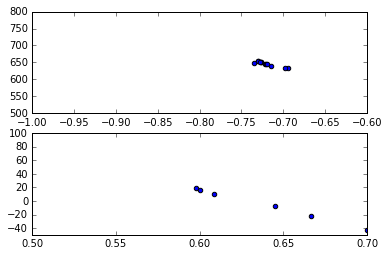

  9%|▉         | 62/682 [00:26<04:05,  2.53it/s]

[(0.62361691695458332, 3.4243740521556787), (-0.72052254464584953, 645.96092082630184)]


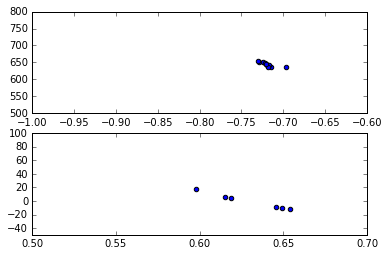

  9%|▉         | 63/682 [00:27<03:54,  2.64it/s]

[(0.63012484020829584, -0.43260163401854851), (-0.71932561679913209, 644.17234108270316)]


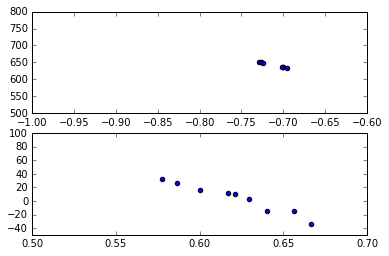

  9%|▉         | 64/682 [00:27<03:49,  2.69it/s]

[(0.62157393102532765, 4.0146648539529606), (-0.71290701110696864, 643.24353632869952)]


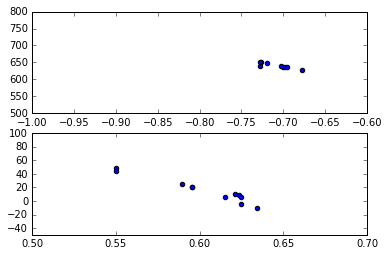

 10%|▉         | 65/682 [00:27<03:46,  2.72it/s]

[(0.60222427088447805, 16.092958314099292), (-0.70816726044135847, 640.39566348343351)]


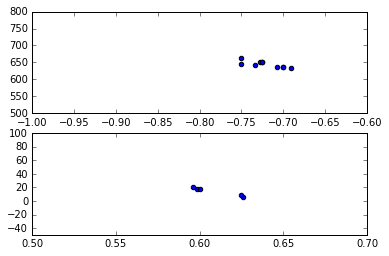

 10%|▉         | 66/682 [00:28<03:58,  2.59it/s]

[(0.60909101767797424, 14.305682035355938), (-0.72115307219287961, 644.90007466698398)]


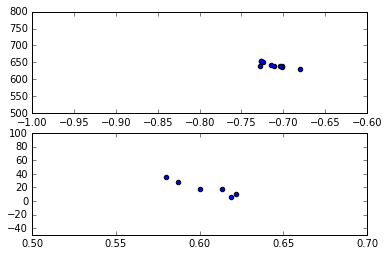

 10%|▉         | 67/682 [00:28<03:59,  2.57it/s]

[(0.6034931826236174, 19.192640777423396), (-0.71166084637950022, 642.15482190418732)]


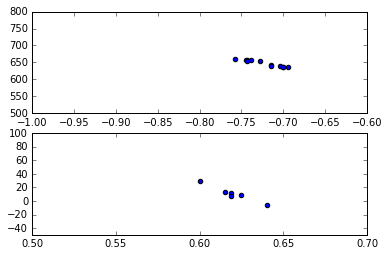

 10%|▉         | 68/682 [00:28<03:52,  2.64it/s]

[(0.61974664224664233, 10.483644688644688), (-0.72354976713440922, 647.31811132738994)]


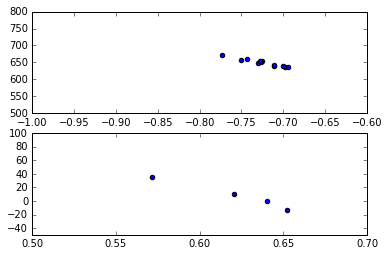

 10%|█         | 69/682 [00:29<03:44,  2.74it/s]

[(0.62107303491111587, 8.3183101306489675), (-0.72433449880159861, 648.87705787180664)]


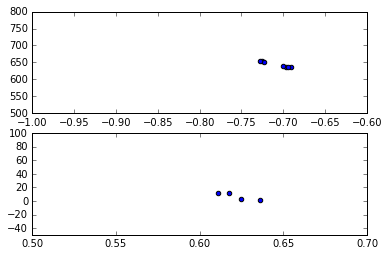

 10%|█         | 70/682 [00:29<03:50,  2.65it/s]

[(0.62253045157456921, 7.4201388888888857), (-0.70835722992900851, 643.50857674595989)]


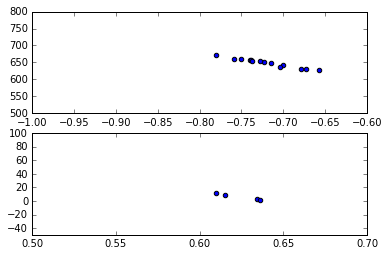

 10%|█         | 71/682 [00:30<04:02,  2.52it/s]

[(0.62391267269316053, 6.1724373187787904), (-0.72014573424777506, 648.78218041336379)]


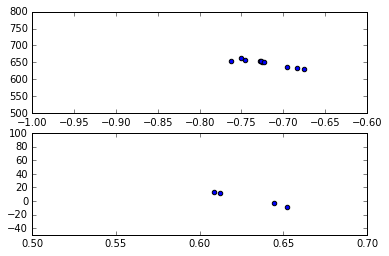

 11%|█         | 72/682 [00:30<04:02,  2.52it/s]

[(0.62938972690525485, 3.0895691609977121), (-0.72131821505453775, 648.63544305089476)]


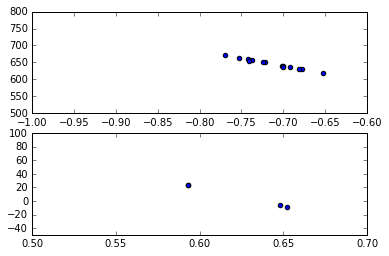

 11%|█         | 73/682 [00:30<04:03,  2.50it/s]

[(0.62169068478943201, 8.2296425939572657), (-0.71381944851002321, 645.61118913920961)]


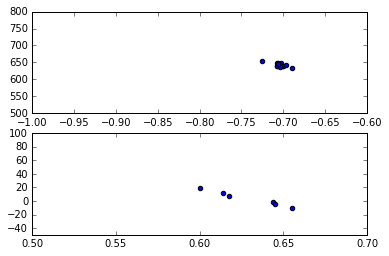

 11%|█         | 74/682 [00:31<04:02,  2.50it/s]

[(0.62934727454478023, 3.8002182992358846), (-0.70433605185942705, 642.63450404309879)]


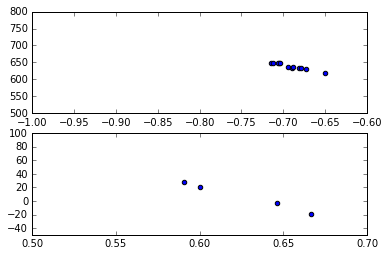

 11%|█         | 75/682 [00:31<03:59,  2.53it/s]

[(0.62597930524759793, 6.4635809312638486), (-0.69143457672997111, 638.65259887647051)]


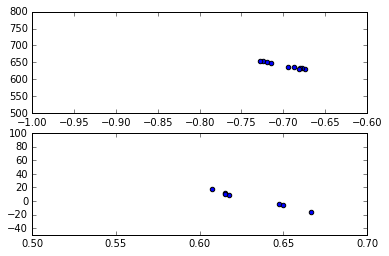

 11%|█         | 76/682 [00:32<03:57,  2.55it/s]

[(0.63140640871733311, 2.8304644934896959), (-0.69816731253813646, 641.04194665469845)]


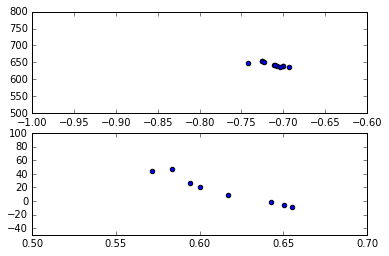

 11%|█▏        | 77/682 [00:32<04:02,  2.49it/s]

[(0.61426830794034326, 16.497508219711229), (-0.71275001912730662, 644.15323482049462)]


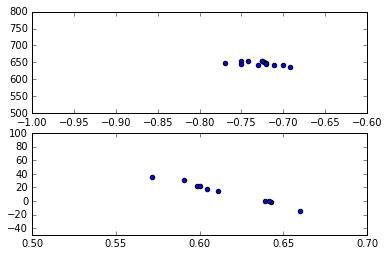

 11%|█▏        | 78/682 [00:32<03:58,  2.53it/s]

[(0.61597418651073643, 12.76160704947274), (-0.72773202677163118, 647.46417665218723)]


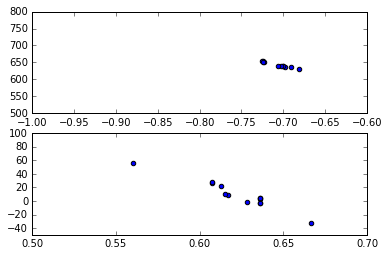

 12%|█▏        | 79/682 [00:33<03:49,  2.63it/s]

[(0.62281931608683105, 9.5180966123962865), (-0.70689412829569942, 642.35312015269164)]


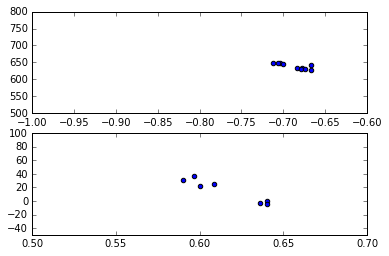

 12%|█▏        | 80/682 [00:33<03:46,  2.66it/s]

[(0.61595920729056497, 15.330578971240714), (-0.68712130455591824, 638.12295946966219)]


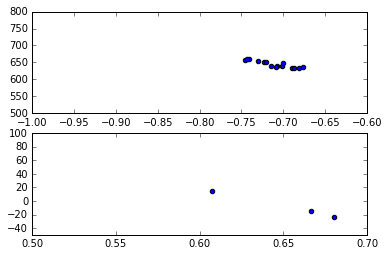

 12%|█▏        | 81/682 [00:34<03:40,  2.72it/s]

[(0.65126984126984133, -7.6506349206349187), (-0.71136599693732872, 644.80458748147271)]


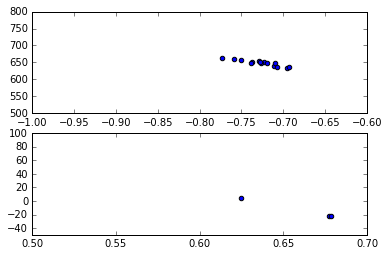

 12%|█▏        | 82/682 [00:34<03:46,  2.64it/s]

[(0.66033026113671267, -13.572196620583725), (-0.72649651823376449, 648.18573896433747)]


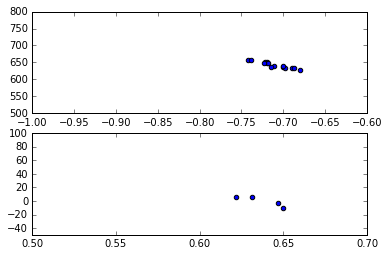

 12%|█▏        | 83/682 [00:34<03:48,  2.62it/s]

[(0.63756484812986369, -0.65765207932390979), (-0.71093818774909123, 642.63158157220289)]


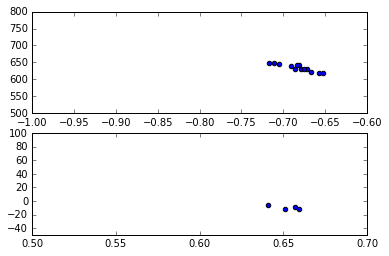

 12%|█▏        | 84/682 [00:35<03:48,  2.62it/s]

[(0.65210554948927035, -10.080457817376427), (-0.68284192712039316, 633.90013995922402)]


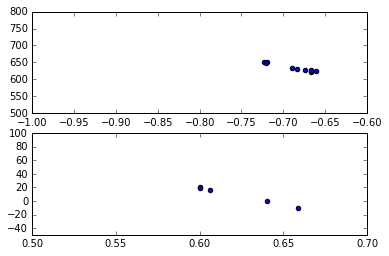

 12%|█▏        | 85/682 [00:35<03:46,  2.64it/s]

[(0.62091943828529195, 9.3281005173688065), (-0.68720435881917252, 633.67435710216114)]


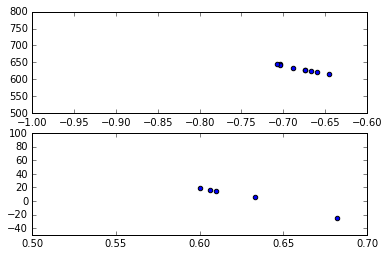

 13%|█▎        | 86/682 [00:35<03:36,  2.75it/s]

[(0.62619364375461939, 6.2780339985218232), (-0.68040488960741463, 631.42937613400488)]


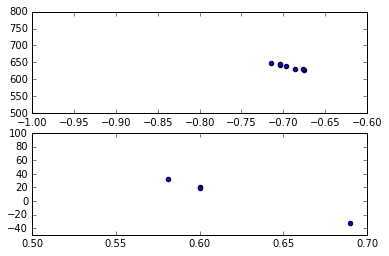

 13%|█▎        | 87/682 [00:36<03:34,  2.77it/s]

[(0.61776263031275069, 10.387971130713709), (-0.69400271460471663, 637.13110311338392)]


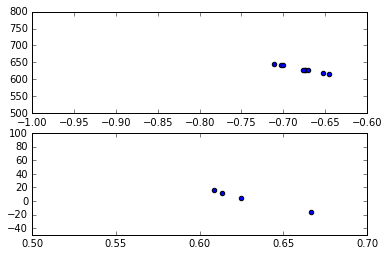

 13%|█▎        | 88/682 [00:36<03:36,  2.74it/s]

[(0.62849967061923584, 3.7745800395256879), (-0.67848673241235957, 629.76242204030495)]


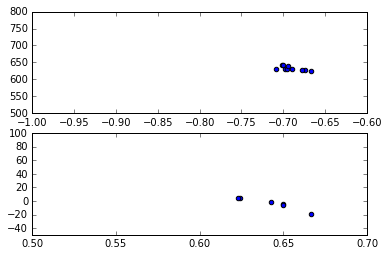

 13%|█▎        | 89/682 [00:36<03:36,  2.73it/s]

[(0.6426505794400531, -3.8076919435340719), (-0.69077701277970893, 632.5020203438803)]


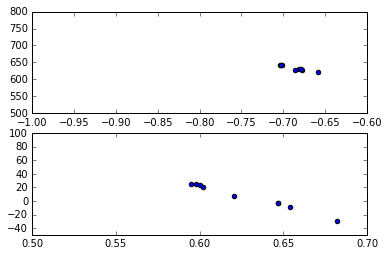

 13%|█▎        | 90/682 [00:37<03:30,  2.81it/s]

[(0.62718469232790164, 6.2186231141219723), (-0.68633165061806434, 632.9270283733124)]


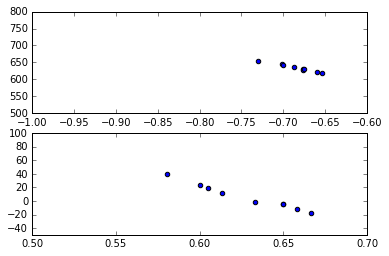

 13%|█▎        | 91/682 [00:37<03:39,  2.69it/s]

[(0.62855689658179748, 6.2678505265092657), (-0.68473777734228536, 633.79051245945482)]


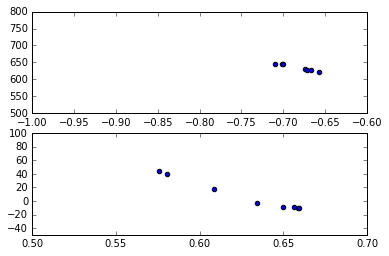

 13%|█▎        | 92/682 [00:38<03:43,  2.64it/s]

[(0.62795072301702326, 7.5280766266974766), (-0.68318444358493946, 634.30011345531909)]


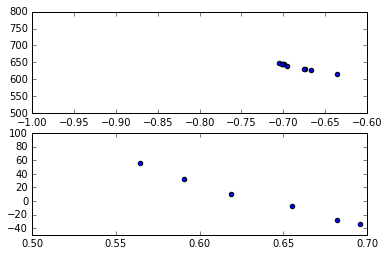

 14%|█▎        | 93/682 [00:38<03:46,  2.60it/s]

[(0.63445034059726713, 5.009887538748103), (-0.68558816059638039, 637.13914204189518)]


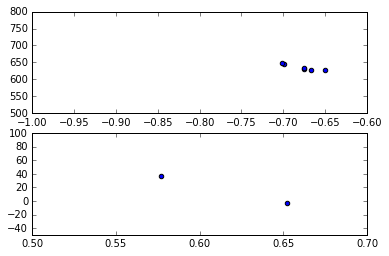

 14%|█▍        | 94/682 [00:38<03:41,  2.65it/s]

[(0.61454849498327757, 17.11956521739134), (-0.67788918084621852, 635.04751322949255)]


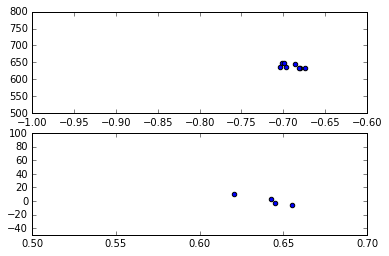

 14%|█▍        | 95/682 [00:39<03:46,  2.59it/s]

[(0.64097012553631028, 1.255005561735274), (-0.69038239009786972, 638.50935700385412)]


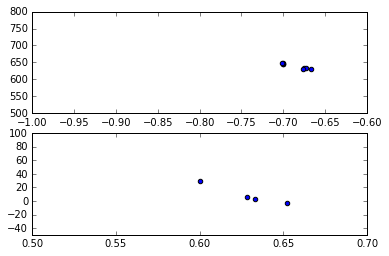

 14%|█▍        | 96/682 [00:39<03:51,  2.53it/s]

[(0.62851966873706, 8.5724120082815745), (-0.6865616177645264, 639.0764160457727)]


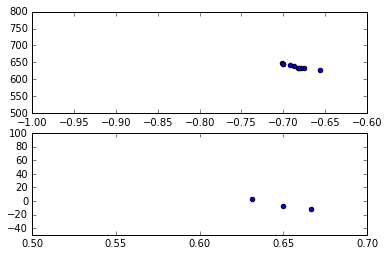

 14%|█▍        | 97/682 [00:40<03:37,  2.69it/s]

[(0.64941520467836256, -5.6277777777777755), (-0.6856621070972041, 637.96535521097189)]


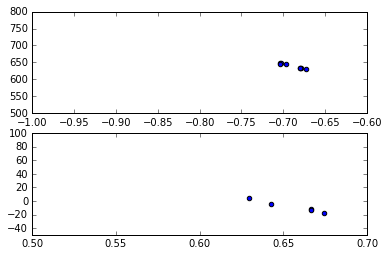

 14%|█▍        | 98/682 [00:40<03:30,  2.77it/s]

[(0.65604774209425376, -8.8610434354620331), (-0.68986281212049549, 639.40056468828584)]


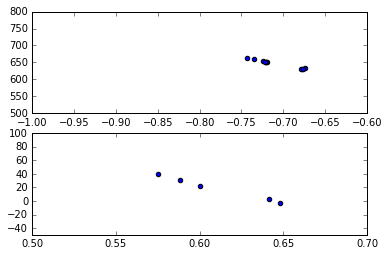

 15%|█▍        | 99/682 [00:40<03:45,  2.59it/s]

[(0.61057857524561188, 18.679889012208672), (-0.70848253087179769, 646.077500977147)]


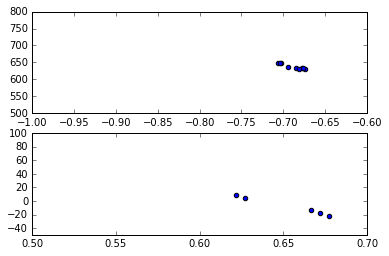

 15%|█▍        | 100/682 [00:41<03:35,  2.70it/s]

[(0.65288966295375772, -7.9564243950257261), (-0.68922487798369603, 637.54854095319047)]


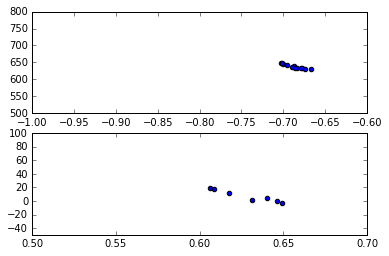

 15%|█▍        | 101/682 [00:41<03:30,  2.77it/s]

[(0.62849236212266402, 7.2150492491769977), (-0.68706872123080365, 637.39716356369422)]


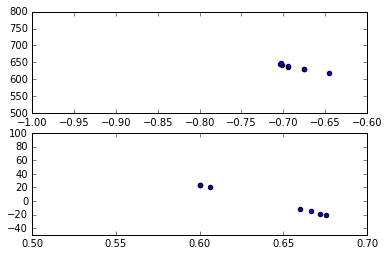

 15%|█▍        | 102/682 [00:41<03:36,  2.67it/s]

[(0.64003970691470691, 0.19316924066924099), (-0.6884307409791437, 637.13266337514915)]


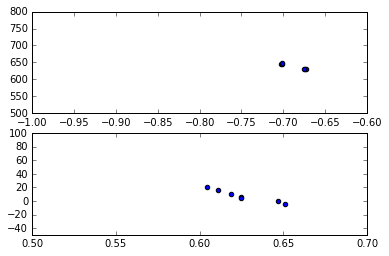

 15%|█▌        | 103/682 [00:42<03:35,  2.69it/s]

[(0.62607814443606902, 7.4262396819192658), (-0.68804171298510752, 638.13230578667947)]


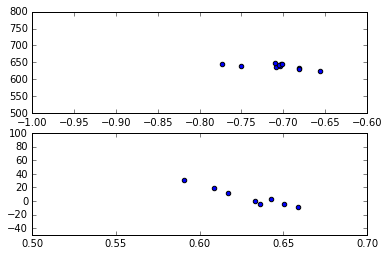

 15%|█▌        | 104/682 [00:42<03:48,  2.53it/s]

[(0.62976540270796955, 5.8447331407790415), (-0.70660813434335423, 639.24408316687413)]


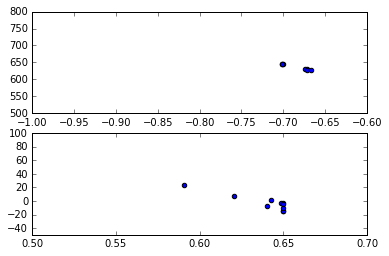

 15%|█▌        | 105/682 [00:43<03:48,  2.52it/s]

[(0.6392807537290297, -2.5565928554204675), (-0.6841817703898404, 635.45261811222997)]


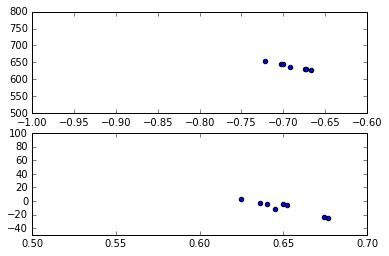

 16%|█▌        | 106/682 [00:43<03:47,  2.53it/s]

[(0.64994850407701898, -9.2992600367236165), (-0.69017225883758626, 637.7975790869915)]


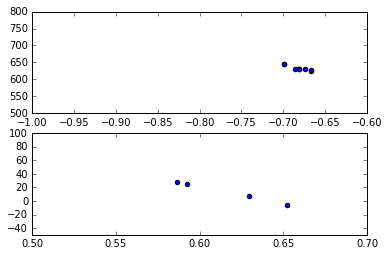

 16%|█▌        | 107/682 [00:43<03:49,  2.51it/s]

[(0.61515075795435614, 13.556666111388765), (-0.68207330876331973, 632.73477757187288)]


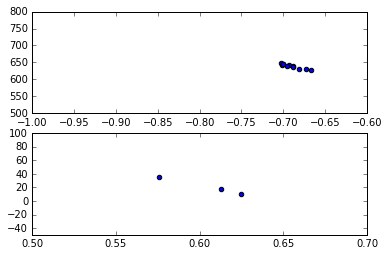

 16%|█▌        | 108/682 [00:44<03:54,  2.45it/s]

[(0.60455360052134244, 21.404284783317035), (-0.69016759332350386, 638.28294938886768)]


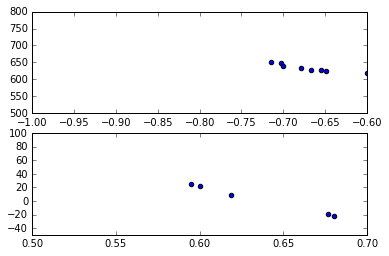

 16%|█▌        | 109/682 [00:44<03:49,  2.49it/s]

[(0.63402256037550164, 2.7381891134832133), (-0.68095768962108105, 635.97042307716617)]


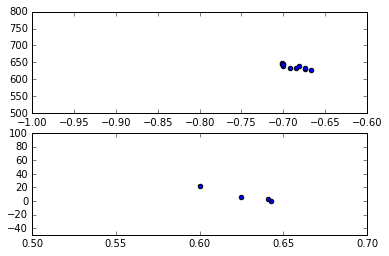

 16%|█▌        | 110/682 [00:45<03:59,  2.39it/s]

[(0.62722069597069596, 8.0207646520146341), (-0.68874299085643564, 638.01667433830505)]


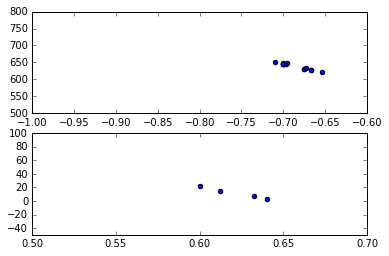

 16%|█▋        | 111/682 [00:45<03:55,  2.42it/s]

[(0.62122448979591838, 11.825510204081624), (-0.68670155308972658, 638.90964171079781)]


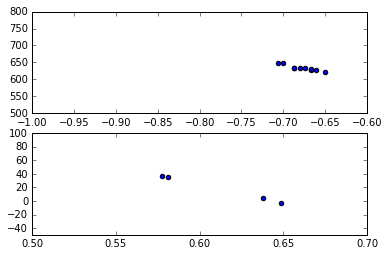

 16%|█▋        | 112/682 [00:46<04:02,  2.35it/s]

[(0.61143820243659863, 18.412944580506732), (-0.67804391690415433, 633.54157191767058)]


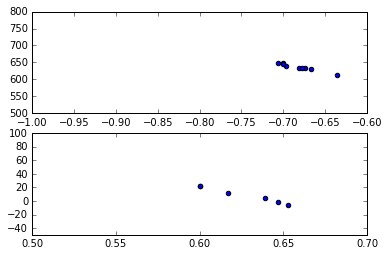

 17%|█▋        | 113/682 [00:46<03:56,  2.41it/s]

[(0.62600503558397358, 8.8744035912237393), (-0.68228252625915442, 635.75756806384243)]


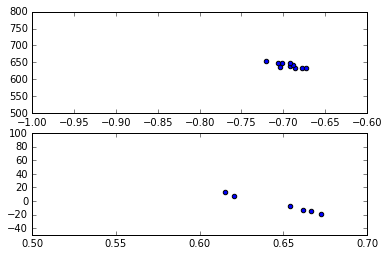

 17%|█▋        | 114/682 [00:46<03:56,  2.40it/s]

[(0.64846093167594188, -5.6085647786966319), (-0.69411009908730636, 641.25718626811965)]


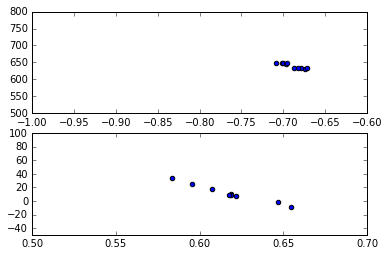

 17%|█▋        | 115/682 [00:47<03:57,  2.39it/s]

[(0.61824170921534005, 11.209660146171295), (-0.68977480275259495, 639.87951703439319)]


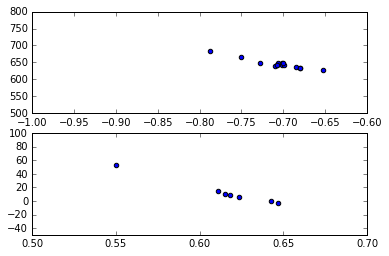

 17%|█▋        | 116/682 [00:47<04:04,  2.31it/s]

[(0.61538294866468235, 12.835047806387918), (-0.70637990130508255, 645.16252385183327)]


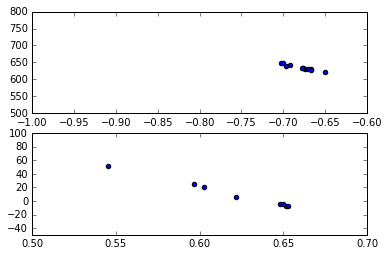

 17%|█▋        | 117/682 [00:48<04:11,  2.24it/s]

[(0.62116554367139043, 10.121382285260644), (-0.6793041483233434, 634.47016721630143)]


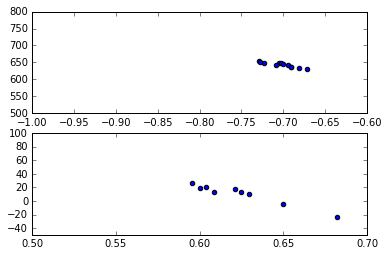

 17%|█▋        | 118/682 [00:48<04:00,  2.35it/s]

[(0.62392969610862237, 10.400686550255873), (-0.70213025305998578, 643.00188948983669)]


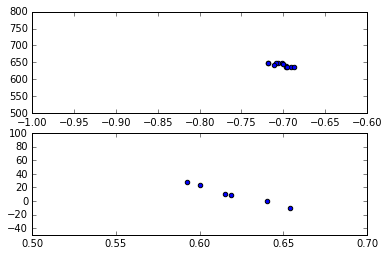

 17%|█▋        | 119/682 [00:48<03:49,  2.46it/s]

[(0.6201451634784968, 10.120919820919832), (-0.70248747111037468, 642.46540743884736)]


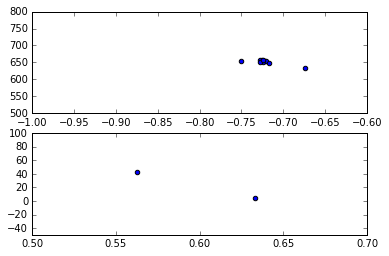

 18%|█▊        | 120/682 [00:49<04:05,  2.29it/s]

[(0.59791666666666665, 23.850000000000023), (-0.72126404903571739, 650.90899128940487)]


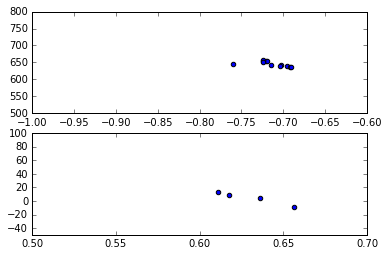

 18%|█▊        | 121/682 [00:50<04:54,  1.91it/s]

[(0.63034295157456921, 4.0454823975044576), (-0.71449225294156049, 646.09668578633284)]


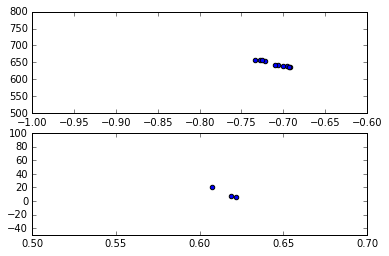

 18%|█▊        | 122/682 [00:50<04:29,  2.08it/s]

[(0.61593736593736592, 11.546332046332074), (-0.71048917281580526, 645.8530028339901)]


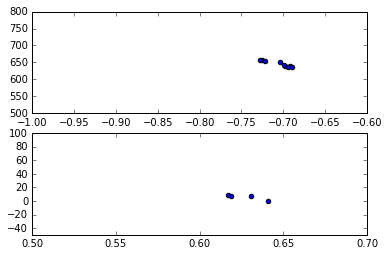

 18%|█▊        | 123/682 [00:50<04:12,  2.22it/s]

[(0.62688232981942515, 5.9937096129279155), (-0.70573506454592261, 645.61483876503758)]


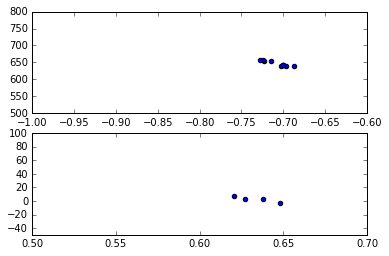

 18%|█▊        | 124/682 [00:51<04:08,  2.24it/s]

[(0.63347187046777931, 2.6135409225707065), (-0.70772014712357045, 646.50923146563275)]


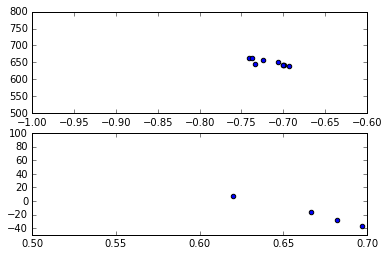

 18%|█▊        | 125/682 [00:51<03:57,  2.34it/s]

[(0.6662932138284251, -18.611395646606894), (-0.71497200026321961, 649.09826878880949)]


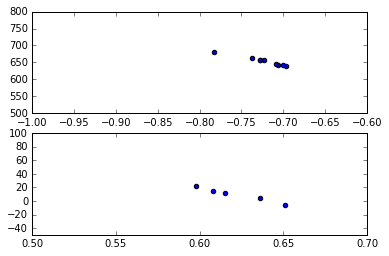

 18%|█▊        | 126/682 [00:52<04:01,  2.30it/s]

[(0.62171605333146995, 9.4547991016497459), (-0.72326002249847243, 653.20059841076534)]


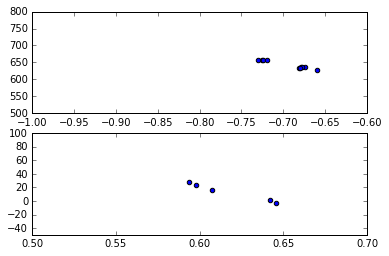

 19%|█▊        | 127/682 [00:52<03:49,  2.41it/s]

[(0.61733601571625663, 13.102826746476534), (-0.69506285949511126, 642.48615363536112)]


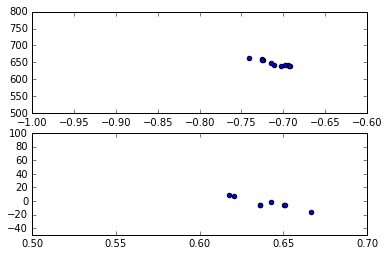

 19%|█▉        | 128/682 [00:52<03:53,  2.37it/s]

[(0.64030443980644369, -3.1613448774157575), (-0.71117748808565584, 647.87226352247728)]


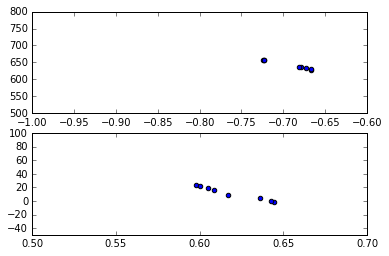

 19%|█▉        | 129/682 [00:53<04:16,  2.16it/s]

[(0.61909588867357801, 11.470365360662058), (-0.69186485183335367, 641.66850890775731)]


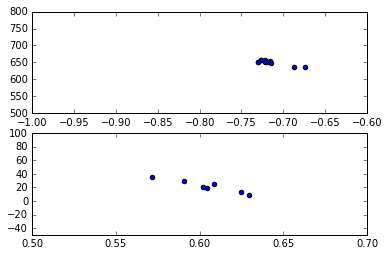

 19%|█▉        | 130/682 [00:53<04:10,  2.20it/s]

[(0.60463780636661579, 21.747965229826175), (-0.71537364148959426, 650.04908642171961)]


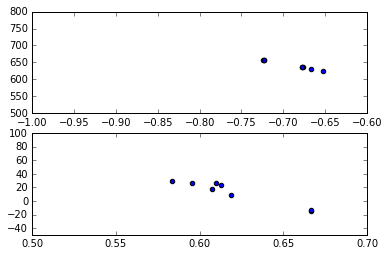

 19%|█▉        | 131/682 [00:54<04:15,  2.16it/s]

[(0.62009432018283317, 12.791412601626021), (-0.69008736187648778, 641.17499908038121)]


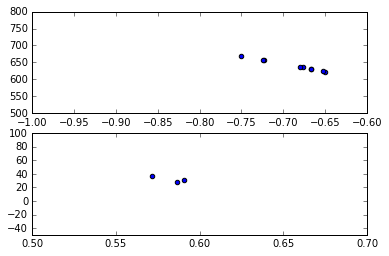

 19%|█▉        | 132/682 [00:55<04:26,  2.06it/s]

[(0.58284818629646207, 31.794297656366609), (-0.68758731499833037, 639.82335884223301)]


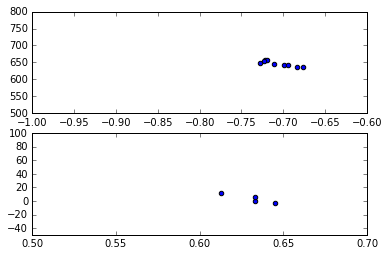

 20%|█▉        | 133/682 [00:55<04:18,  2.13it/s]

[(0.63118279569892466, 3.4198924731182814), (-0.7062007086245764, 645.88631977778482)]


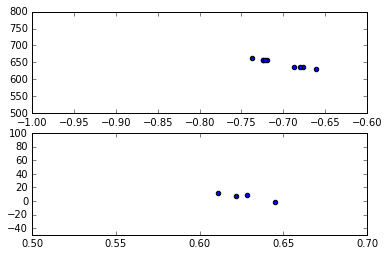

 20%|█▉        | 134/682 [00:55<04:09,  2.20it/s]

[(0.62661636290668543, 6.551209504435306), (-0.70348028634753623, 647.24232774630639)]


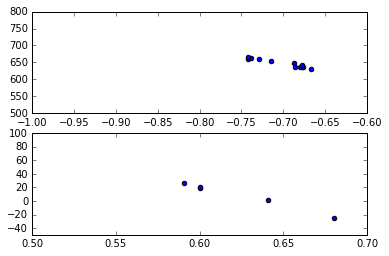

 20%|█▉        | 135/682 [00:56<03:54,  2.34it/s]

[(0.62238694638694647, 8.5432354312354271), (-0.70143894212208657, 647.02791656903321)]


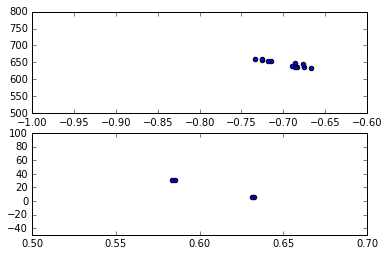

 20%|█▉        | 136/682 [00:56<03:42,  2.46it/s]

[(0.6082327988961953, 18.733197868364286), (-0.69846752469865392, 646.92731529318144)]


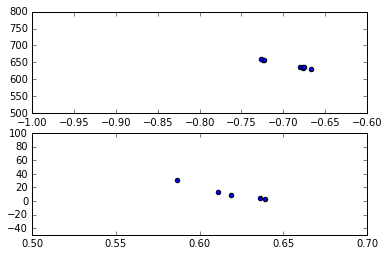

 20%|██        | 137/682 [00:57<03:46,  2.41it/s]

[(0.61841470507383456, 12.135189005454686), (-0.69373865056366768, 643.55062373320345)]


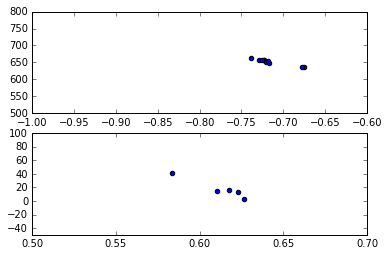

 20%|██        | 138/682 [00:57<03:36,  2.52it/s]

[(0.61215347400421682, 17.689045028847865), (-0.71495144465397875, 651.74479767659386)]


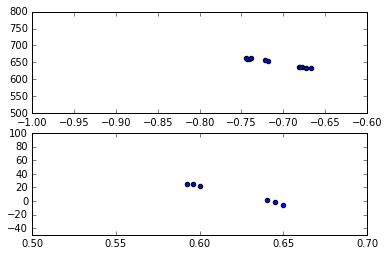

 20%|██        | 139/682 [00:57<03:28,  2.60it/s]

[(0.62061891314579487, 10.929869121320763), (-0.70792782113064712, 648.46622338164082)]


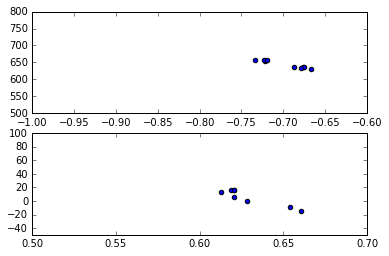

 21%|██        | 140/682 [00:58<03:27,  2.61it/s]

[(0.62960404921264201, 5.533226201454795), (-0.6982473222966622, 643.88936587209969)]


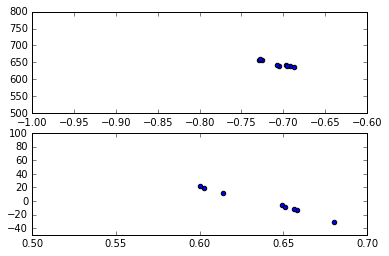

 21%|██        | 141/682 [00:58<03:31,  2.56it/s]

[(0.63890064353800247, -2.093828416239127), (-0.70760156652910389, 645.5160850598138)]


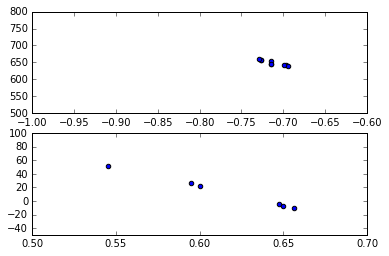

 21%|██        | 142/682 [00:58<03:29,  2.57it/s]

[(0.61569186321341496, 13.172206206150179), (-0.71276605802357895, 648.9547911577007)]


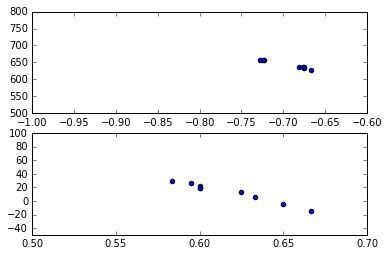

 21%|██        | 143/682 [00:59<03:31,  2.55it/s]

[(0.61699199199199195, 13.075450450450445), (-0.69371861915161448, 642.19095335731788)]


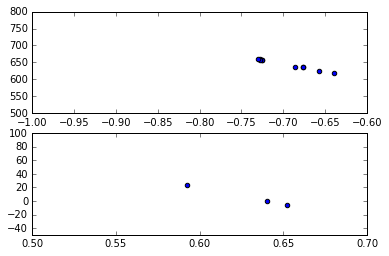

 21%|██        | 144/682 [00:59<03:23,  2.65it/s]

[(0.62825550187869028, 6.2928609769189352), (-0.69727090656209256, 643.8704550153434)]


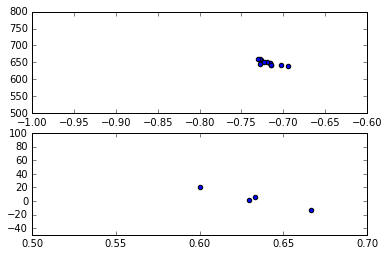

 21%|██▏       | 145/682 [01:00<03:21,  2.67it/s]

[(0.63240740740740742, 3.4185185185185247), (-0.71852704819880486, 649.60765902028129)]


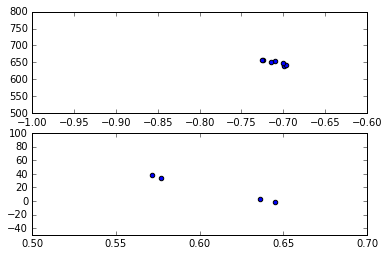

 21%|██▏       | 146/682 [01:00<03:14,  2.76it/s]

[(0.60746914375946637, 18.585426670104113), (-0.70740178037169199, 647.85351758156912)]


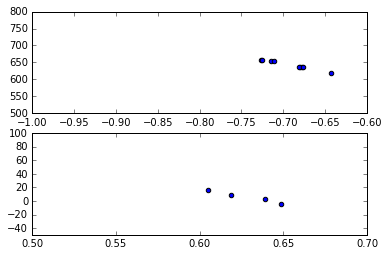

 22%|██▏       | 147/682 [01:00<03:19,  2.68it/s]

[(0.62796207861997333, 5.658130404840918), (-0.69295805922032505, 642.1615283942939)]


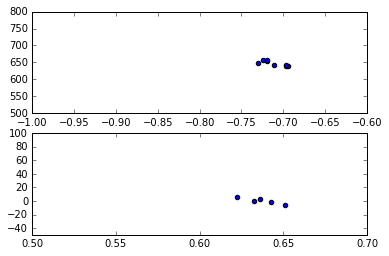

 22%|██▏       | 148/682 [01:01<03:37,  2.45it/s]

[(0.6370517706730332, 0.28856366225134022), (-0.71166144676222309, 646.92793316751386)]


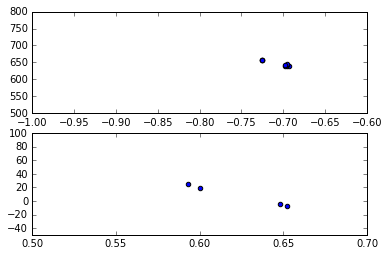

 22%|██▏       | 149/682 [01:01<03:35,  2.48it/s]

[(0.62338560004366927, 8.0984688446737039), (-0.70587780504744524, 645.99284303357899)]


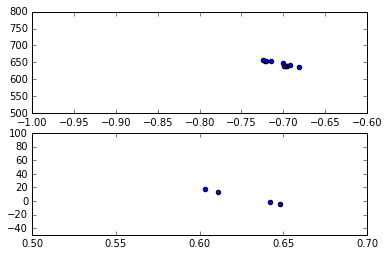

 22%|██▏       | 150/682 [01:01<03:25,  2.59it/s]

[(0.62599787012649166, 6.3040353786622489), (-0.70409569433906338, 645.81093063553806)]


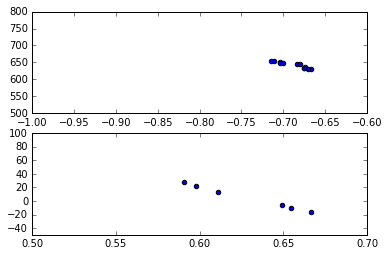

 22%|██▏       | 151/682 [01:02<03:19,  2.66it/s]

[(0.62837878831526739, 5.1169552451312752), (-0.68843027251197597, 642.6753443005382)]


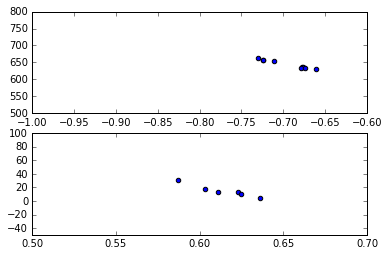

 22%|██▏       | 152/682 [01:02<03:13,  2.74it/s]

[(0.61425350908498488, 14.908506194539475), (-0.69538780075880025, 643.99009853099471)]


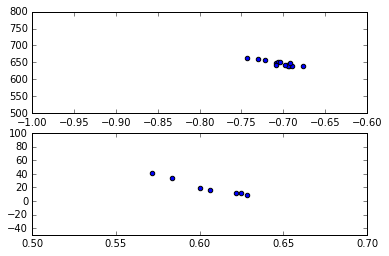

 22%|██▏       | 153/682 [01:03<03:14,  2.72it/s]

[(0.60510895950213262, 20.389040095392811), (-0.70433032105964488, 647.27429992803434)]


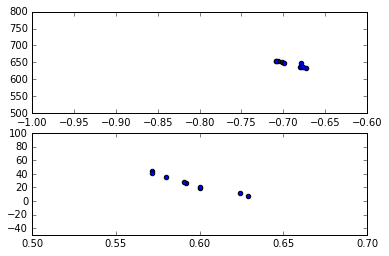

 23%|██▎       | 154/682 [01:03<03:20,  2.63it/s]

[(0.59540391405829185, 26.071690386418513), (-0.69114176748989054, 645.07605267657209)]


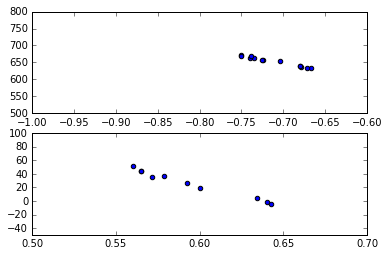

 23%|██▎       | 155/682 [01:03<03:18,  2.65it/s]

[(0.59504067993714693, 25.824761527360284), (-0.71107171593152296, 652.60926182459218)]


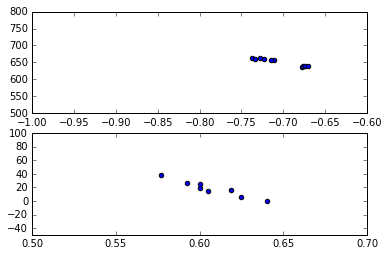

 23%|██▎       | 156/682 [01:04<03:17,  2.66it/s]

[(0.60735330580725311, 18.195144779684263), (-0.70466525185210138, 651.38513765994105)]


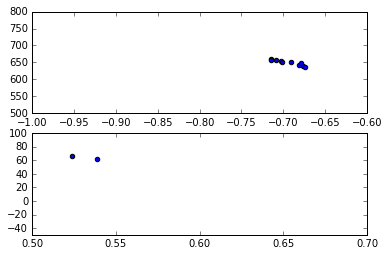

 23%|██▎       | 157/682 [01:04<03:22,  2.59it/s]

[(0.53113553113553114, 64.474358974358978), (-0.69427053624894386, 649.49168000206112)]


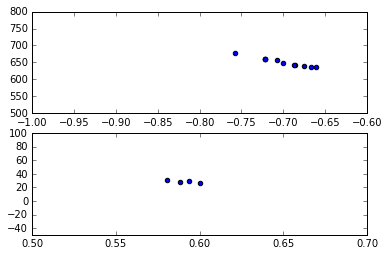

 23%|██▎       | 158/682 [01:04<03:23,  2.58it/s]

[(0.59065761385199245, 28.783945090132818), (-0.70070279748861397, 650.94801418034558)]


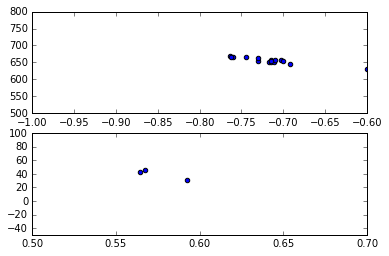

 23%|██▎       | 159/682 [01:05<03:33,  2.45it/s]

[(0.57475424142090803, 39.893406226739579), (-0.72455716383314772, 656.90094587588158)]


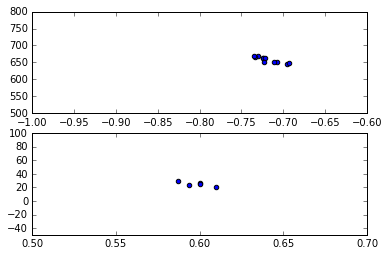

 23%|██▎       | 160/682 [01:05<03:28,  2.50it/s]

[(0.59809252386002121, 25.089891304347827), (-0.71827074970995264, 658.06165682312042)]


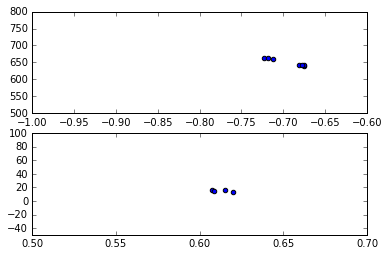

 24%|██▎       | 161/682 [01:06<03:26,  2.52it/s]

[(0.61280578117534645, 14.907261108456765), (-0.69464578713993919, 650.33538810667335)]


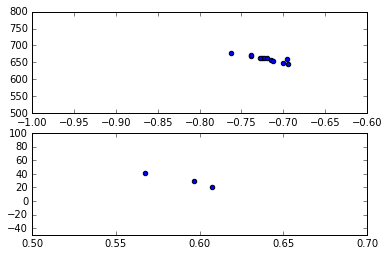

 24%|██▍       | 162/682 [01:06<03:26,  2.52it/s]

[(0.59036040993190719, 30.270376229451813), (-0.72084006364671893, 661.11477389201752)]


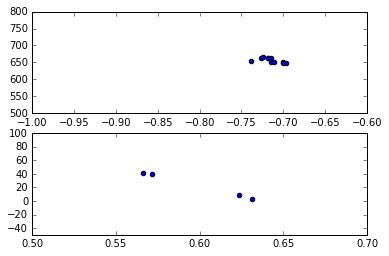

 24%|██▍       | 163/682 [01:06<03:23,  2.55it/s]

[(0.59816230060364495, 23.55350657585916), (-0.71488223949383223, 656.0967037184887)]


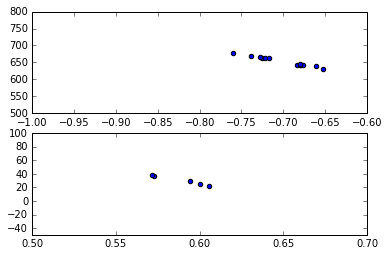

 24%|██▍       | 164/682 [01:07<03:25,  2.52it/s]

[(0.58878746283332994, 30.035325377237008), (-0.70022575581619384, 652.62297699005694)]


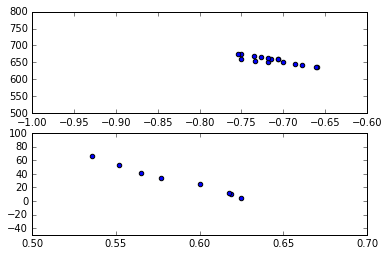

 24%|██▍       | 165/682 [01:07<03:35,  2.40it/s]

[(0.58636380769220597, 31.071221890580965), (-0.71228662114284003, 656.3569874151674)]


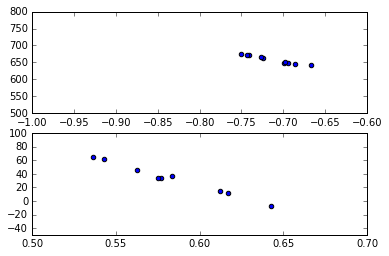

 24%|██▍       | 166/682 [01:08<03:25,  2.51it/s]

[(0.58318478077760938, 32.898406284859689), (-0.71302687020088462, 658.08404858460221)]


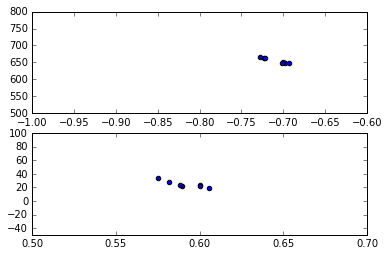

 24%|██▍       | 167/682 [01:08<03:24,  2.51it/s]

[(0.59147166469076884, 24.558199531175799), (-0.70954175493598748, 655.20281612625047)]


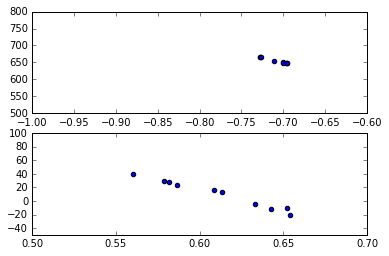

 25%|██▍       | 168/682 [01:09<03:25,  2.51it/s]

[(0.61115150056813439, 10.444814998909914), (-0.70921055294793056, 655.0778571294951)]


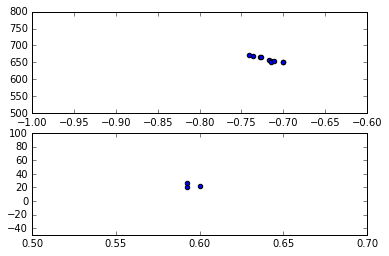

 25%|██▍       | 169/682 [01:09<03:25,  2.50it/s]

[(0.59506172839506177, 22.943209876543222), (-0.71870859426462963, 658.87425111512164)]


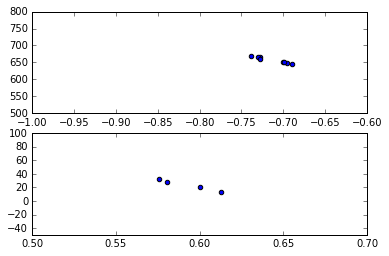

 25%|██▍       | 170/682 [01:09<03:29,  2.44it/s]

[(0.59232649071358745, 23.393255131964807), (-0.71377499630953622, 657.58312507284018)]


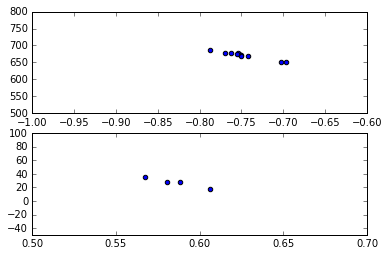

 25%|██▌       | 171/682 [01:10<03:28,  2.45it/s]

[(0.5856271572590358, 27.272449092183422), (-0.74765613265478414, 671.12157316870753)]


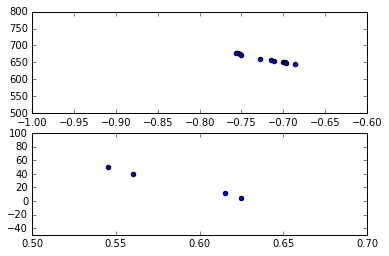

 25%|██▌       | 172/682 [01:10<03:25,  2.48it/s]

[(0.58645979020979022, 26.295218531468521), (-0.72238181641693877, 660.92974820308507)]


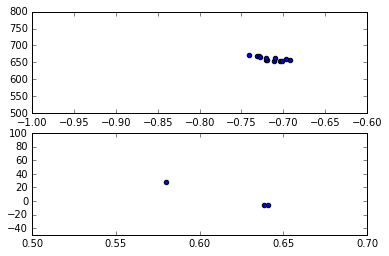

 25%|██▌       | 173/682 [01:11<03:26,  2.47it/s]

[(0.61977450445535542, 5.4347190398254002), (-0.71602531759937427, 661.13314530103139)]


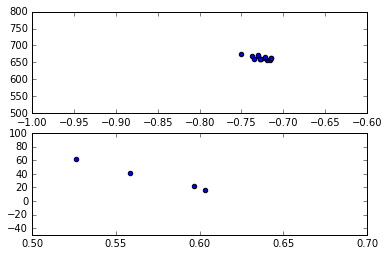

 26%|██▌       | 174/682 [01:11<03:24,  2.49it/s]

[(0.57109870707241239, 35.473474936338462), (-0.72674700329779307, 663.56644003128974)]


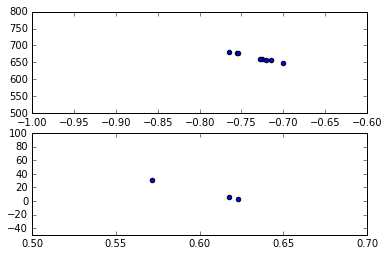

 26%|██▌       | 175/682 [01:11<03:22,  2.51it/s]

[(0.60408801201640072, 13.690192018836532), (-0.73269571601626449, 664.34357611566679)]


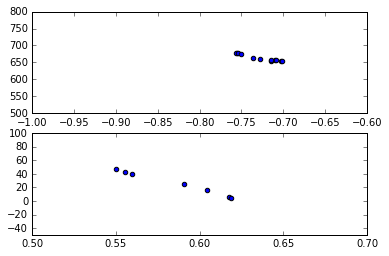

 26%|██▌       | 176/682 [01:12<03:31,  2.39it/s]

[(0.58518355952778867, 25.906046276011971), (-0.72744252895535466, 663.69763286594559)]


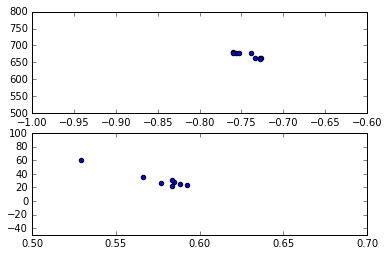

 26%|██▌       | 177/682 [01:12<03:21,  2.51it/s]

[(0.57556031443378841, 31.760635796408543), (-0.74277398147262952, 670.93190485000775)]


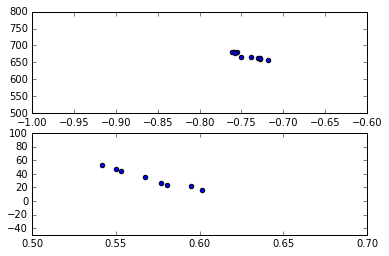

 26%|██▌       | 178/682 [01:12<03:09,  2.66it/s]

[(0.57075904914773568, 33.433703282822783), (-0.74243862678473649, 669.66463869752567)]


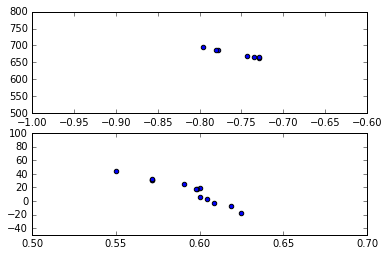

 26%|██▌       | 179/682 [01:13<03:01,  2.77it/s]

[(0.59295908340486869, 15.405106994451872), (-0.75569852447259811, 675.60245493652894)]


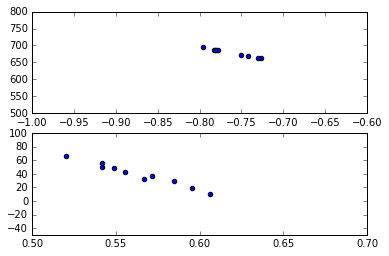

 26%|██▋       | 180/682 [01:13<03:01,  2.77it/s]

[(0.56324756192427583, 39.428257608832403), (-0.76297780998943254, 678.79256865222317)]


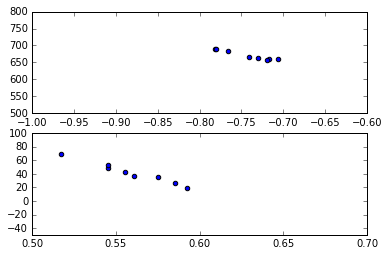

 27%|██▋       | 181/682 [01:14<03:08,  2.66it/s]

[(0.55970501022277719, 41.416395637408577), (-0.7427013418268702, 670.83299459425064)]


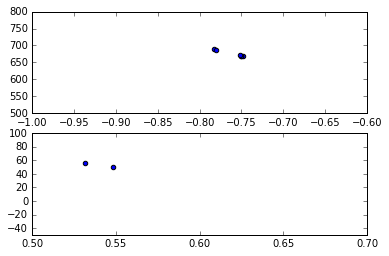

 27%|██▋       | 182/682 [01:14<02:59,  2.78it/s]

[(0.53981854838709675, 53.351814516129053), (-0.76074552696277753, 675.64029042473214)]


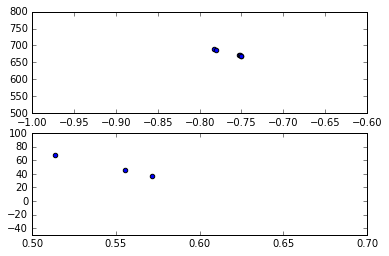

 27%|██▋       | 183/682 [01:14<03:04,  2.71it/s]

[(0.54683254683254678, 50.225797225797237), (-0.76149246084086386, 675.85532057689909)]


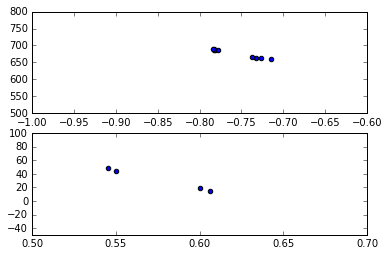

 27%|██▋       | 184/682 [01:15<03:07,  2.65it/s]

[(0.57537878787878793, 31.920454545454547), (-0.75762763966413482, 677.0805595467707)]


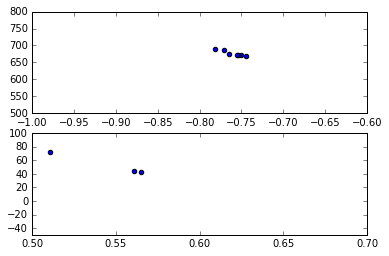

 27%|██▋       | 185/682 [01:15<03:10,  2.61it/s]

[(0.54561043297759526, 52.673841595030218), (-0.76012628398187876, 676.11122498257077)]


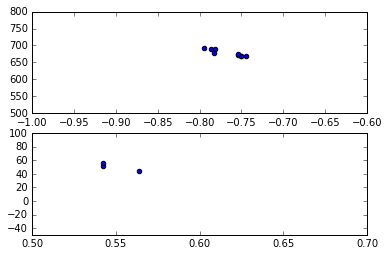

 27%|██▋       | 186/682 [01:15<03:05,  2.67it/s]

[(0.54946070878274267, 50.528916281458656), (-0.76654522725951579, 677.77499927792553)]


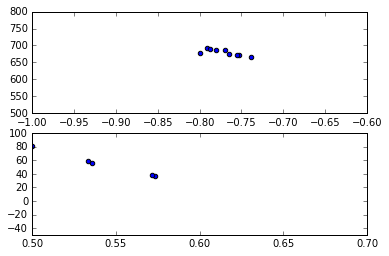

 27%|██▋       | 187/682 [01:16<03:15,  2.53it/s]

[(0.55350140056022412, 47.494117647058843), (-0.77125927071078904, 679.60840083897688)]


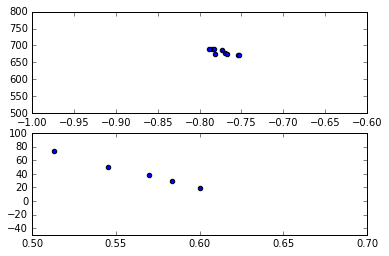

 28%|██▊       | 188/682 [01:16<03:15,  2.52it/s]

[(0.56224572895458969, 42.28350476527693), (-0.77286088036474887, 680.645402961522)]


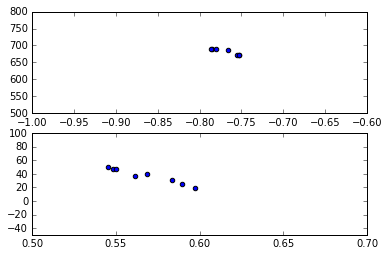

 28%|██▊       | 189/682 [01:17<03:12,  2.56it/s]

[(0.56799555630388976, 37.147801168830007), (-0.76832302851619849, 680.73457487976395)]


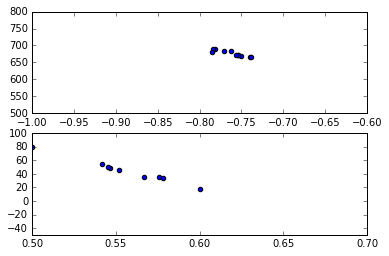

 28%|██▊       | 190/682 [01:17<03:11,  2.57it/s]

[(0.56319915801755815, 40.0614737879378), (-0.76168392100846949, 676.41446232186547)]


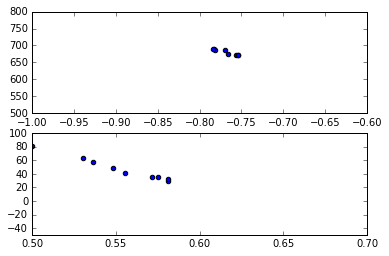

 28%|██▊       | 191/682 [01:17<03:12,  2.55it/s]

[(0.56008774974222275, 43.144214494006498), (-0.7685194361818255, 680.13940090332756)]


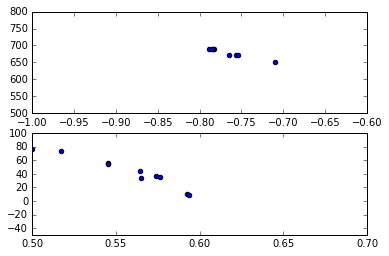

 28%|██▊       | 192/682 [01:18<03:13,  2.53it/s]

[(0.56382929654106562, 39.228173895491295), (-0.76577070975788919, 677.7212345735777)]


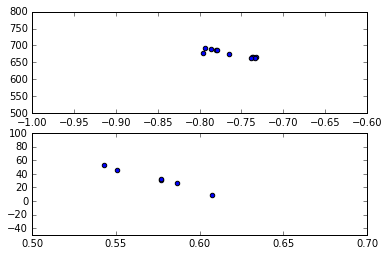

 28%|██▊       | 193/682 [01:18<03:06,  2.62it/s]

[(0.57346294801317288, 33.204941073419377), (-0.76175680327462447, 675.03584614707904)]


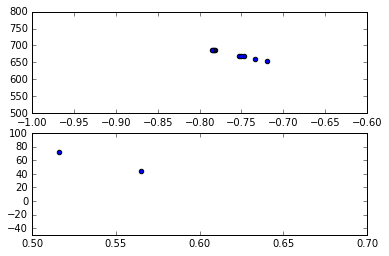

 28%|██▊       | 194/682 [01:19<03:08,  2.59it/s]

[(0.54067321178120609, 58.15497896213185), (-0.75953714675529771, 673.93901449111343)]


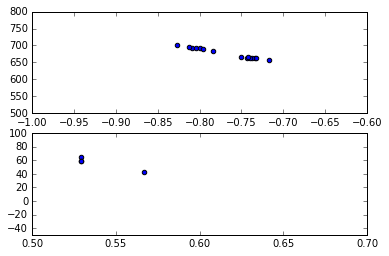

 29%|██▊       | 195/682 [01:19<03:08,  2.58it/s]

[(0.5387254901960784, 56.557352941176475), (-0.76865084279020268, 677.31689284132415)]


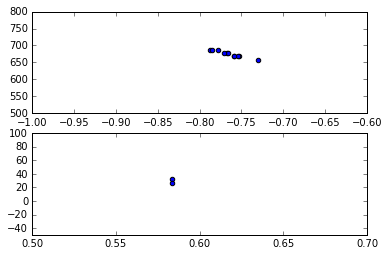

 29%|██▊       | 196/682 [01:19<03:05,  2.62it/s]

[(0.58333333333333337, 29.041666666666657), (-0.76450158202683982, 675.42714611405654)]


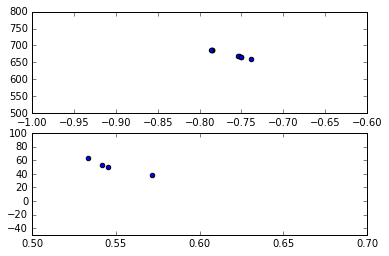

 29%|██▉       | 197/682 [01:20<03:08,  2.57it/s]

[(0.54797077922077908, 51.707873376623397), (-0.76550009379660133, 675.19593873310907)]


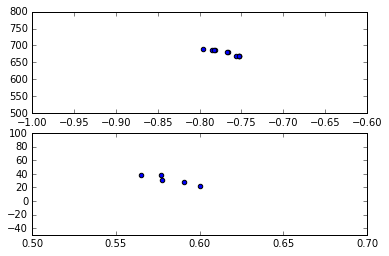

 29%|██▉       | 198/682 [01:20<03:09,  2.56it/s]

[(0.58216546738285868, 31.438639235160974), (-0.76956669047209925, 678.41282548779168)]


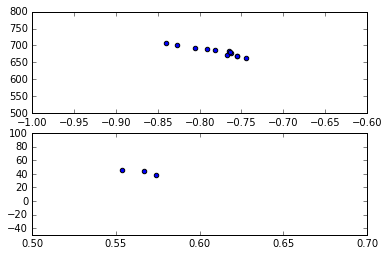

 29%|██▉       | 199/682 [01:21<03:02,  2.64it/s]

[(0.5647611041053664, 43.120288636682098), (-0.77970171666917187, 682.31104744447816)]


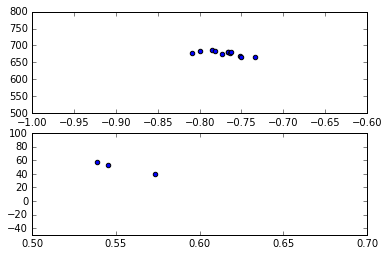

 29%|██▉       | 200/682 [01:21<03:02,  2.64it/s]

[(0.55241647241647229, 50.344149184149181), (-0.77017872109672414, 677.00935139156161)]


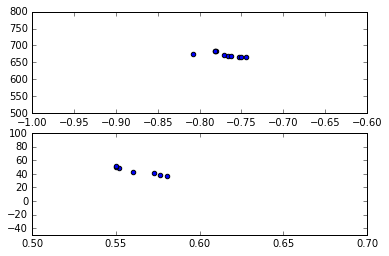

 29%|██▉       | 201/682 [01:21<02:53,  2.77it/s]

[(0.56310807916047401, 44.217364940970825), (-0.76972679965384105, 673.19906141887282)]


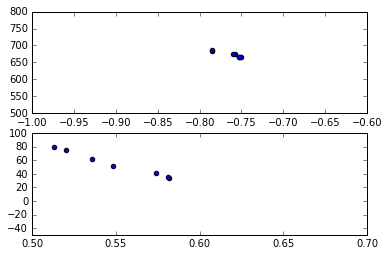

 30%|██▉       | 202/682 [01:22<02:51,  2.80it/s]

[(0.55055798825252311, 54.337017106102685), (-0.76204521174220219, 672.70084043828945)]


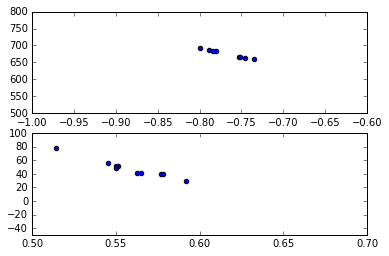

 30%|██▉       | 203/682 [01:22<02:55,  2.72it/s]

[(0.5585551123836876, 47.765707592471152), (-0.76721570815767659, 674.4492295076019)]


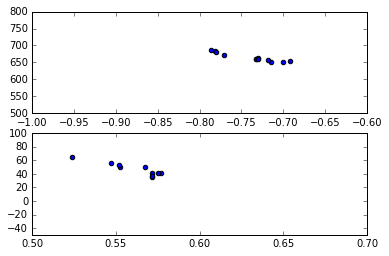

 30%|██▉       | 204/682 [01:22<02:52,  2.76it/s]

[(0.5609424106219687, 47.165270508774242), (-0.73920589220604838, 664.59095445314142)]


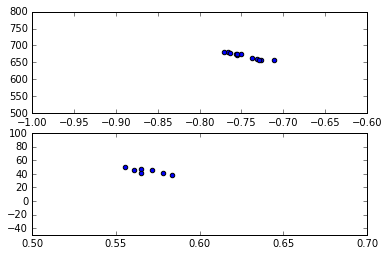

 30%|███       | 205/682 [01:23<02:57,  2.69it/s]

[(0.56857730081347169, 44.457877744955915), (-0.74622753583548584, 669.15626559640248)]


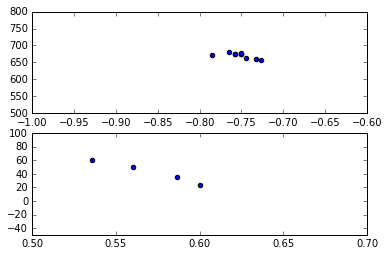

 30%|███       | 206/682 [01:23<02:56,  2.69it/s]

[(0.57048029556650248, 42.305172413793116), (-0.75188052692007035, 670.51034450117254)]


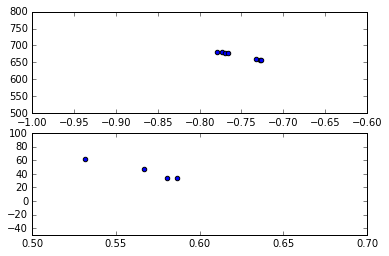

 30%|███       | 207/682 [01:23<02:59,  2.65it/s]

[(0.5661921811271784, 44.146453235076024), (-0.75369113457569326, 670.54537931590585)]


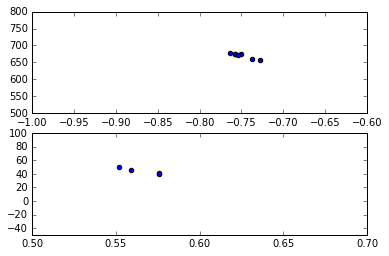

 30%|███       | 208/682 [01:24<03:00,  2.62it/s]

[(0.56551570471448764, 44.537709754748278), (-0.74980413325146544, 670.20372525674986)]


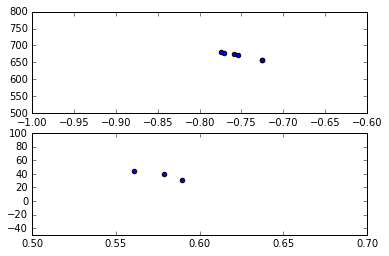

 31%|███       | 209/682 [01:24<03:11,  2.47it/s]

[(0.57655552264024668, 38.339060597083666), (-0.75173952555455203, 670.08396691999599)]


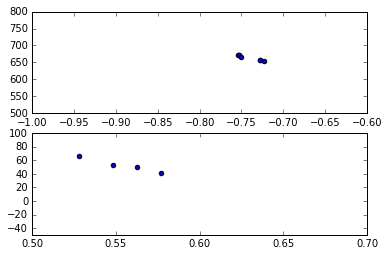

 31%|███       | 210/682 [01:25<03:11,  2.46it/s]

[(0.55389698786876207, 52.387226013234098), (-0.74114266500775083, 664.64206848432798)]


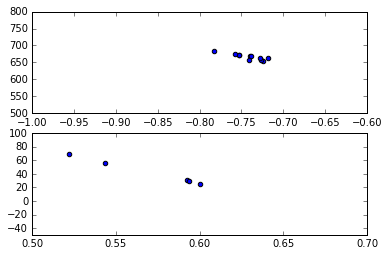

 31%|███       | 211/682 [01:25<03:09,  2.49it/s]

[(0.57031199677938804, 42.355382447665079), (-0.74192041821877275, 666.88760616477566)]


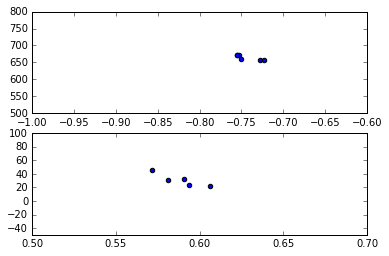

 31%|███       | 212/682 [01:25<03:03,  2.56it/s]

[(0.58870872344709557, 31.166040596999903), (-0.74387640972389057, 664.434358310417)]


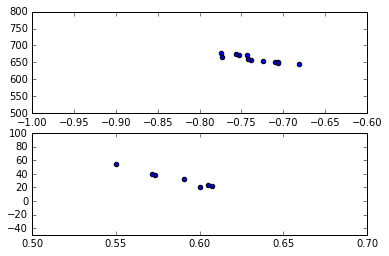

 31%|███       | 213/682 [01:26<02:55,  2.68it/s]

[(0.5853931606312559, 33.115793307221871), (-0.73401017552577841, 660.52762191439956)]


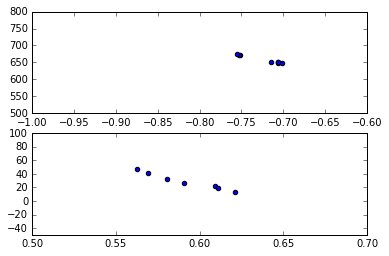

 31%|███▏      | 214/682 [01:26<02:58,  2.62it/s]

[(0.59207978744726453, 28.818368552587838), (-0.7242947324684943, 658.00884127334098)]


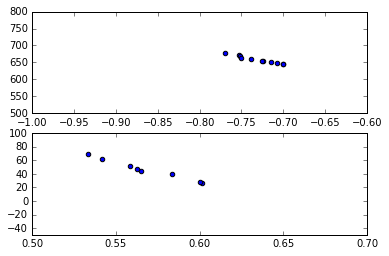

 32%|███▏      | 215/682 [01:27<03:01,  2.58it/s]

[(0.56820494186046511, 46.377417740984164), (-0.73048109423717422, 658.05731390106655)]


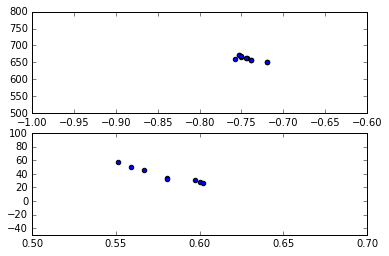

 32%|███▏      | 216/682 [01:27<03:00,  2.59it/s]

[(0.57959469997103641, 38.014287302909821), (-0.74256086821544254, 661.37651465384226)]


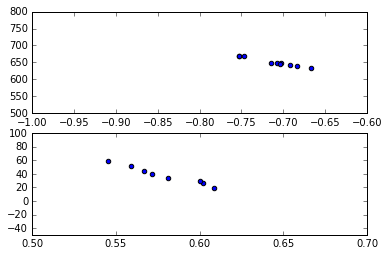

 32%|███▏      | 217/682 [01:27<02:50,  2.72it/s]

[(0.57931314128740019, 38.022100765115304), (-0.7124693315282008, 651.53117037340587)]


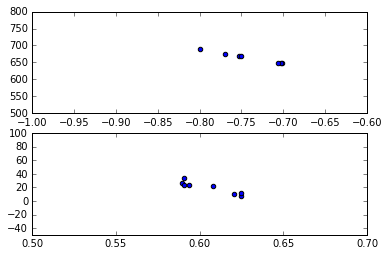

 32%|███▏      | 218/682 [01:28<02:47,  2.77it/s]

[(0.60542333606640142, 20.118595263340445), (-0.74040490451882857, 663.37354282847957)]


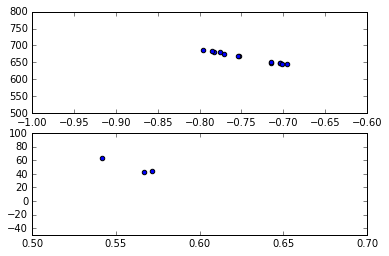

 32%|███▏      | 219/682 [01:28<02:44,  2.82it/s]

[(0.55992063492063482, 50.157539682539699), (-0.74246336826175363, 663.41475688496143)]


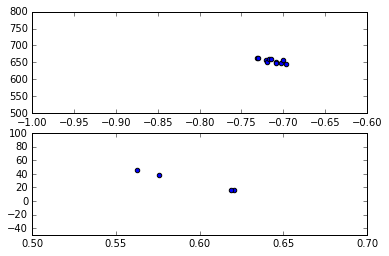

 32%|███▏      | 220/682 [01:28<02:48,  2.75it/s]

[(0.59449871249440212, 28.575498675175396), (-0.71364028121092316, 654.54860963507065)]


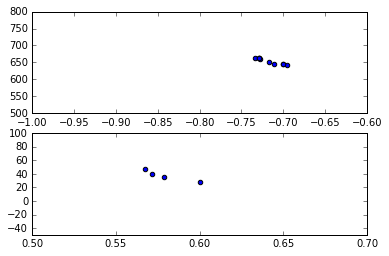

 32%|███▏      | 221/682 [01:29<02:47,  2.75it/s]

[(0.57948587685429787, 37.850955090428783), (-0.71718779190804061, 653.63211197710052)]


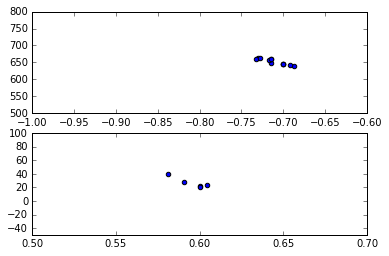

 33%|███▎      | 222/682 [01:29<02:43,  2.81it/s]

[(0.59539112050739962, 26.972177589852002), (-0.71089363663066496, 652.13753325094706)]


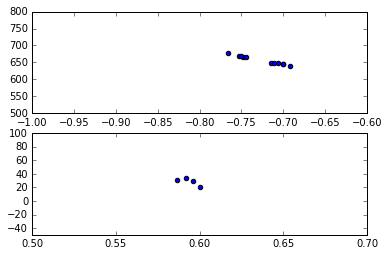

 33%|███▎      | 223/682 [01:29<02:40,  2.86it/s]

[(0.59354936934986202, 28.604692659557202), (-0.72595756753973617, 656.47129191918714)]


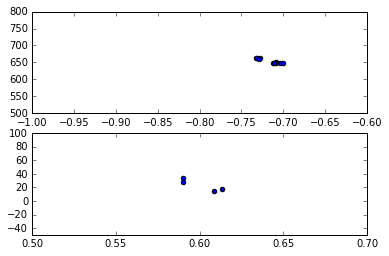

 33%|███▎      | 224/682 [01:30<02:44,  2.79it/s]

[(0.60066497116568396, 23.442983379770624), (-0.71633194654422283, 653.48327710416504)]


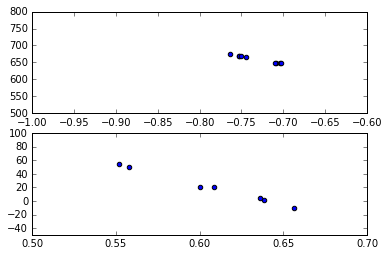

 33%|███▎      | 225/682 [01:30<02:57,  2.58it/s]

[(0.60700337235733115, 20.27932600032587), (-0.73221357781764496, 660.00447857731854)]


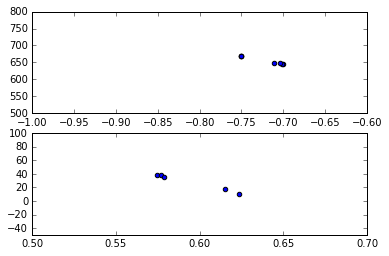

 33%|███▎      | 226/682 [01:31<02:57,  2.56it/s]

[(0.59383368008996285, 28.243657026013445), (-0.72370549612291502, 656.13185553941196)]


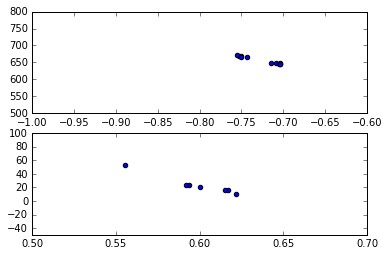

 33%|███▎      | 227/682 [01:31<02:58,  2.55it/s]

[(0.59934476003956105, 23.530317634690221), (-0.72638780149571858, 656.32792572732842)]


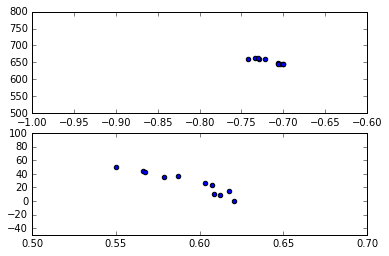

 33%|███▎      | 228/682 [01:31<02:57,  2.56it/s]

[(0.59267436880195534, 26.81598483960197), (-0.71736734312585715, 653.43179438838888)]


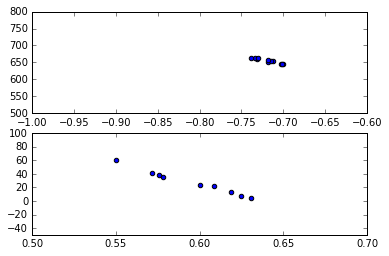

 34%|███▎      | 229/682 [01:32<02:57,  2.55it/s]

[(0.59537176137694692, 27.520974402984759), (-0.71846738456843262, 654.47577114466583)]


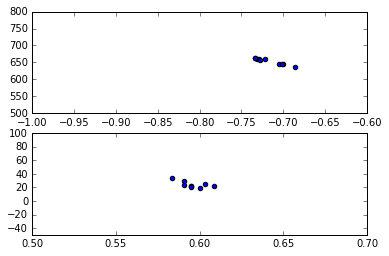

 34%|███▎      | 230/682 [01:32<02:58,  2.54it/s]

[(0.59564506158709063, 24.486888667323438), (-0.71700807809778022, 652.95706675844303)]


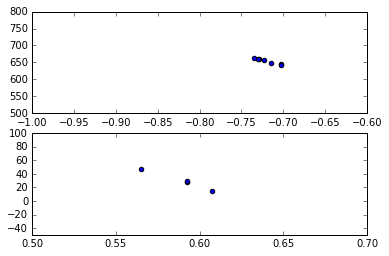

 34%|███▍      | 231/682 [01:33<03:05,  2.43it/s]

[(0.5893863584080975, 29.738727858293089), (-0.71971495189176127, 652.88261634878324)]


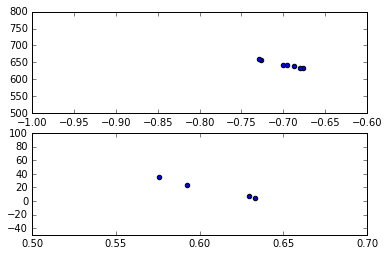

 34%|███▍      | 232/682 [01:33<02:57,  2.54it/s]

[(0.60782828282828283, 17.748148148148147), (-0.69927933885692628, 643.76994251393785)]


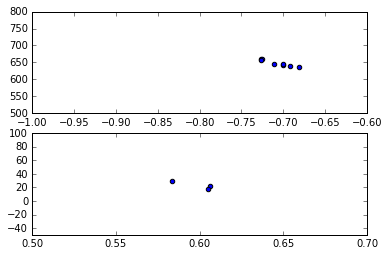

 34%|███▍      | 233/682 [01:33<02:57,  2.53it/s]

[(0.59821903242955876, 23.485778841042002), (-0.7080281170210696, 648.05311987832704)]


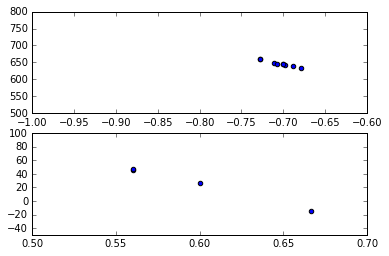

 34%|███▍      | 234/682 [01:34<02:56,  2.54it/s]

[(0.59666666666666668, 26.233333333333334), (-0.70448072321923827, 646.1802978586677)]


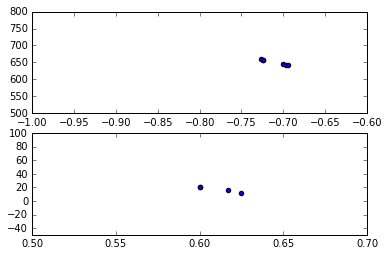

 34%|███▍      | 235/682 [01:34<02:51,  2.60it/s]

[(0.61050531914893613, 17.651728723404261), (-0.710878457439727, 650.59073855367808)]


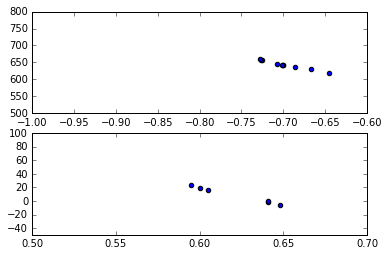

 35%|███▍      | 236/682 [01:35<02:56,  2.53it/s]

[(0.62167619711479361, 8.7178303809882607), (-0.69870346380786885, 643.24692567191437)]


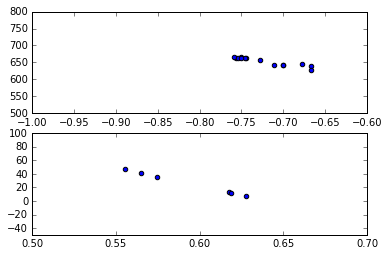

 35%|███▍      | 237/682 [01:35<02:55,  2.53it/s]

[(0.59330711443027007, 26.406364319853235), (-0.72204011472671148, 653.11211497121644)]


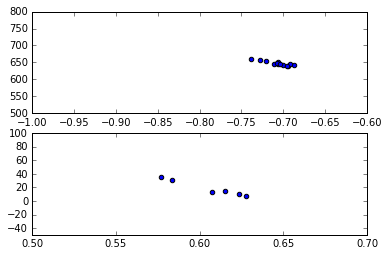

 35%|███▍      | 238/682 [01:35<02:50,  2.60it/s]

[(0.60562737915679088, 18.393359908065786), (-0.7069099690738756, 647.20105422589018)]


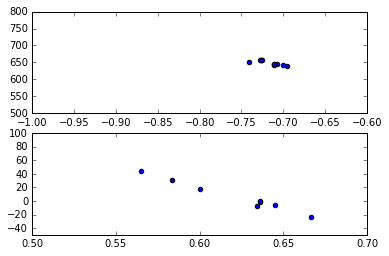

 35%|███▌      | 239/682 [01:36<02:52,  2.56it/s]

[(0.62090653697720199, 6.9052444557261481), (-0.71652415818925042, 648.41274275228398)]


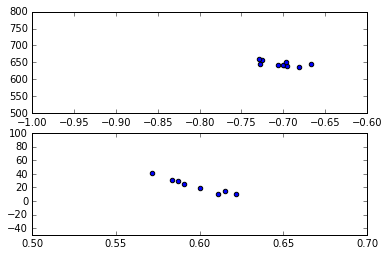

 35%|███▌      | 240/682 [01:36<02:53,  2.54it/s]

[(0.59759310819093425, 22.504984303625598), (-0.70283292215694193, 646.02016298906142)]


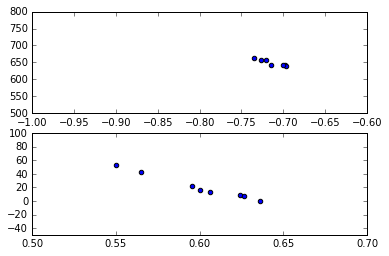

 35%|███▌      | 241/682 [01:36<02:45,  2.67it/s]

[(0.600392794403664, 20.370417968504917), (-0.71296282625953622, 648.97872106503905)]


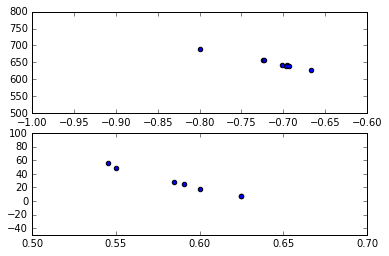

 35%|███▌      | 242/682 [01:37<02:51,  2.56it/s]

[(0.58875275667728499, 27.111804704729227), (-0.71270343633258926, 649.20195592086384)]


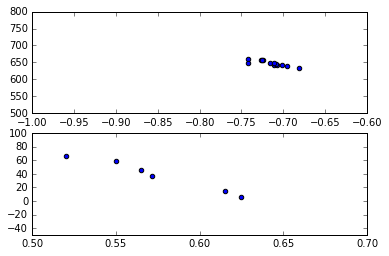

 36%|███▌      | 243/682 [01:37<02:54,  2.52it/s]

[(0.57450509635292235, 38.116894808090471), (-0.71490661457077276, 647.7349452432469)]


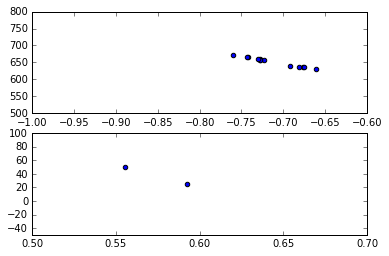

 36%|███▌      | 244/682 [01:38<02:46,  2.63it/s]

[(0.57407407407407407, 37.796296296296276), (-0.71280934203414015, 651.45496698736792)]


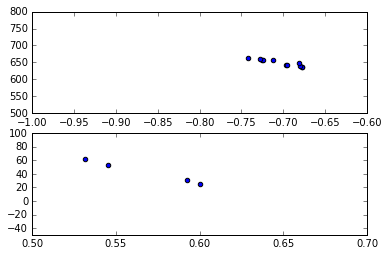

 36%|███▌      | 245/682 [01:38<02:46,  2.63it/s]

[(0.56732428451178452, 43.01145307239058), (-0.7036189926689207, 648.64097966476606)]


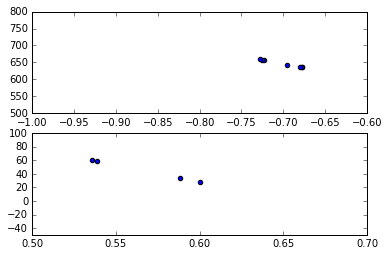

 36%|███▌      | 246/682 [01:38<02:41,  2.69it/s]

[(0.5656027795733678, 45.139471557853909), (-0.70093820471889523, 646.94758251493238)]


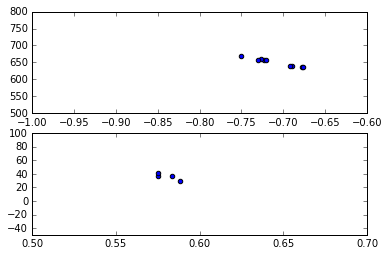

 36%|███▌      | 247/682 [01:39<02:48,  2.58it/s]

[(0.58039215686274503, 36.198039215686279), (-0.70967008505931295, 649.97896847408231)]


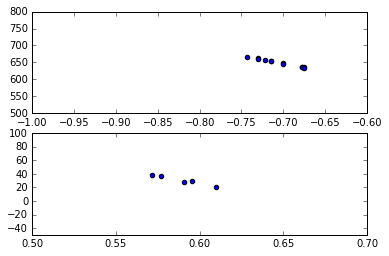

 36%|███▋      | 248/682 [01:39<02:51,  2.54it/s]

[(0.58895230353455563, 30.665922867998631), (-0.70505170849580256, 648.65335675907465)]


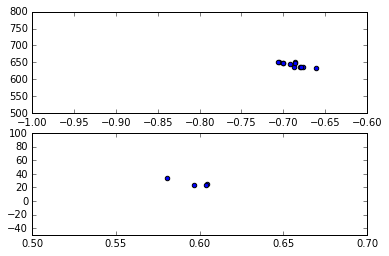

 37%|███▋      | 249/682 [01:40<02:51,  2.53it/s]

[(0.5962691602332062, 26.649755141429367), (-0.68818289277207911, 643.5301530786187)]


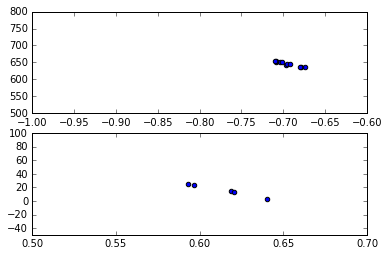

 37%|███▋      | 250/682 [01:40<02:51,  2.51it/s]

[(0.61394636135029423, 16.093889873152921), (-0.69552412614629988, 645.53477715988856)]


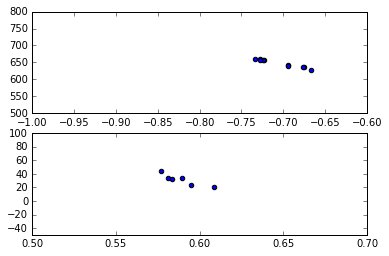

 37%|███▋      | 251/682 [01:40<02:51,  2.52it/s]

[(0.5890379533579736, 31.835080942007124), (-0.70446951245036615, 647.17798146549148)]


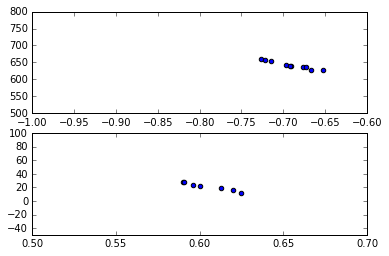

 37%|███▋      | 252/682 [01:41<02:50,  2.53it/s]

[(0.60504680123607446, 21.227366605411685), (-0.69113492615045413, 642.14845886802402)]


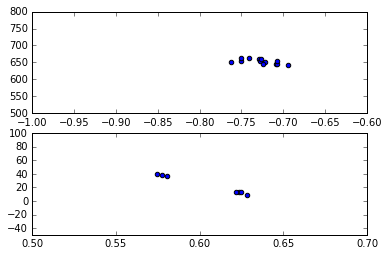

 37%|███▋      | 253/682 [01:41<02:59,  2.39it/s]

[(0.60458215040656349, 23.250129501420378), (-0.72688082414001021, 653.13509012641941)]


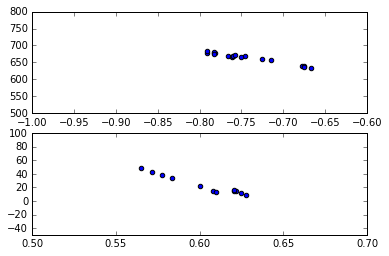

 37%|███▋      | 254/682 [01:42<02:56,  2.43it/s]

[(0.60260535144754523, 23.413186077798642), (-0.74451652904952659, 663.87281521440468)]


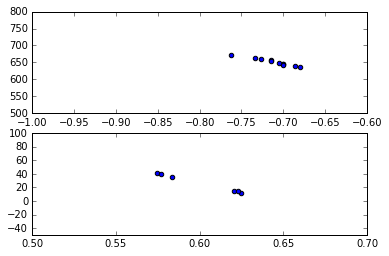

 37%|███▋      | 255/682 [01:42<02:54,  2.44it/s]

[(0.6004529700380129, 26.306886864361246), (-0.71118407284465546, 650.64602863555763)]


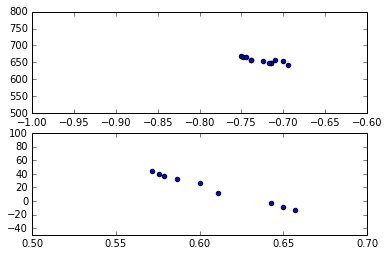

 38%|███▊      | 256/682 [01:42<02:50,  2.50it/s]

[(0.60816128036333728, 18.768767108180285), (-0.72462196400916323, 655.70833929024514)]


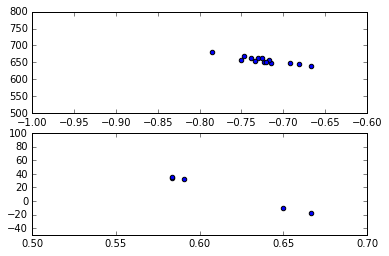

 38%|███▊      | 257/682 [01:43<02:47,  2.54it/s]

[(0.61484848484848498, 15.066060606060592), (-0.72325350030810664, 656.45286267604956)]


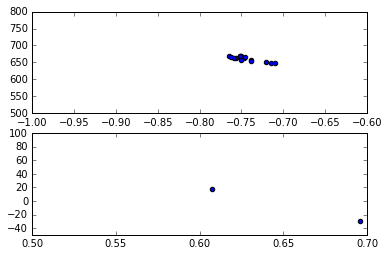

 38%|███▊      | 258/682 [01:43<02:54,  2.43it/s]

[(0.65139751552795033, -6.1746894409937738), (-0.74395703519758405, 660.0247415958205)]


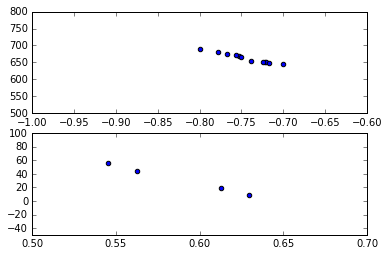

 38%|███▊      | 259/682 [01:44<02:46,  2.54it/s]

[(0.58762185022265667, 31.928291653090042), (-0.74397039059924286, 662.43680325339039)]


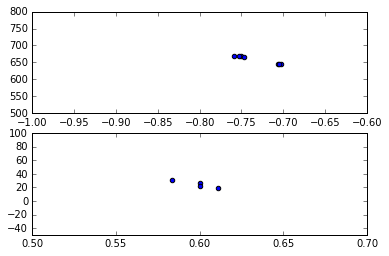

 38%|███▊      | 260/682 [01:44<02:41,  2.61it/s]

[(0.59861111111111109, 24.951388888888886), (-0.73172871019707164, 657.86686469738561)]


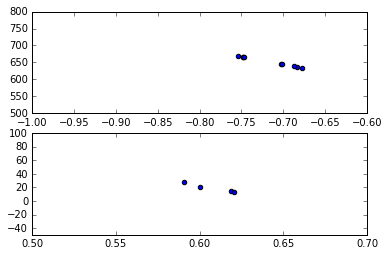

 38%|███▊      | 261/682 [01:44<02:41,  2.61it/s]

[(0.60766159128228092, 19.155821764442436), (-0.71666446246623439, 651.68584318541241)]


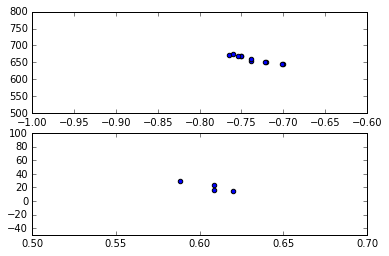

 38%|███▊      | 262/682 [01:45<02:35,  2.70it/s]

[(0.60640664961636825, 20.598644501278756), (-0.73640089485148075, 659.86978337792561)]


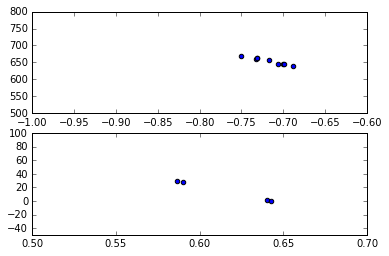

 39%|███▊      | 263/682 [01:45<02:35,  2.70it/s]

[(0.6148069934587741, 14.735896390212403), (-0.71743882079877264, 654.0996994758483)]


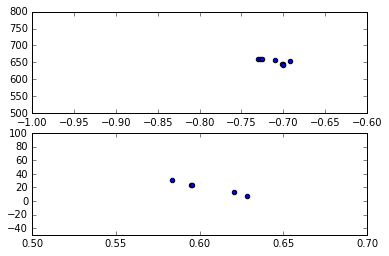

 39%|███▊      | 264/682 [01:46<02:42,  2.58it/s]

[(0.60448542138197314, 19.985879820707396), (-0.71088081862233632, 652.54026922998651)]


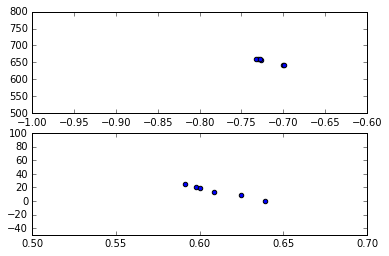

 39%|███▉      | 265/682 [01:46<02:33,  2.72it/s]

[(0.61028058999174251, 14.593860798095571), (-0.71931725156020532, 653.73985718924814)]


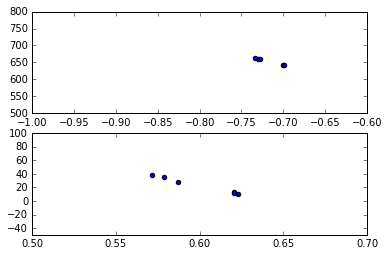

 39%|███▉      | 266/682 [01:46<02:29,  2.79it/s]

[(0.60025313157957372, 23.002957481159154), (-0.71831254562518865, 653.01816464501815)]


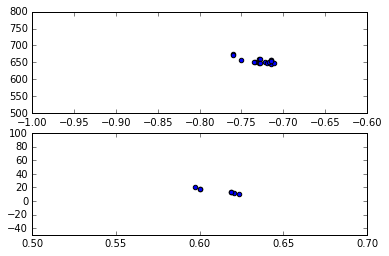

 39%|███▉      | 267/682 [01:47<02:27,  2.81it/s]

[(0.61132782667467878, 15.123375342894187), (-0.72756536587930754, 654.57806342977028)]


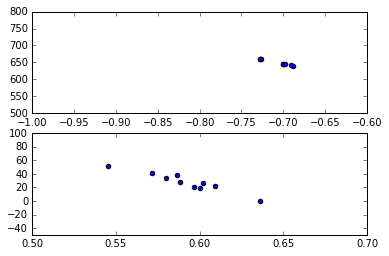

 39%|███▉      | 268/682 [01:47<02:25,  2.84it/s]

[(0.59158789537910417, 28.153818779425514), (-0.70765115068982254, 649.09019686426916)]


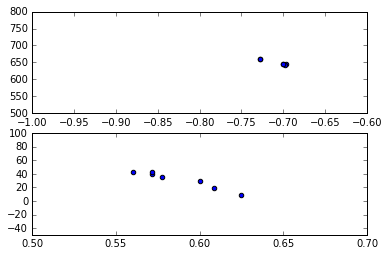

 39%|███▉      | 269/682 [01:47<02:29,  2.76it/s]

[(0.5877167976804929, 31.153415149280793), (-0.70868474904586776, 649.75285435193121)]


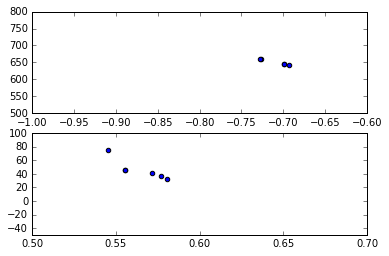

 40%|███▉      | 270/682 [01:48<02:33,  2.68it/s]

[(0.56426041103460456, 46.229944786396402), (-0.70902575143309843, 650.68917001942373)]


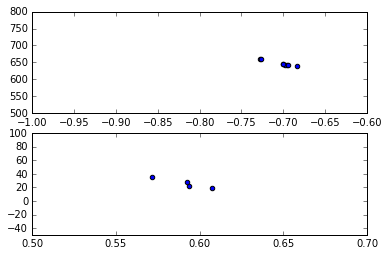

 40%|███▉      | 271/682 [01:48<02:37,  2.61it/s]

[(0.59122850529100535, 26.163525132275154), (-0.70315501961663174, 647.76046668060621)]


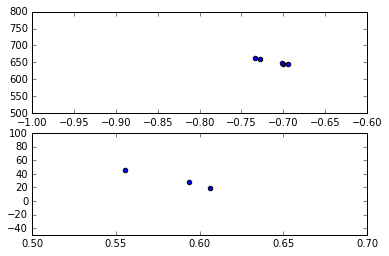

 40%|███▉      | 272/682 [01:48<02:38,  2.58it/s]

[(0.58512205387205396, 30.781986531986529), (-0.7115296282702176, 652.00967482583724)]


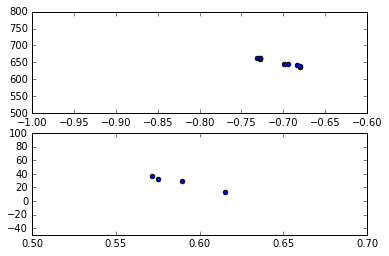

 40%|████      | 273/682 [01:49<02:31,  2.69it/s]

[(0.58788919413919416, 28.040659340659332), (-0.70599440078171227, 650.77092640239732)]


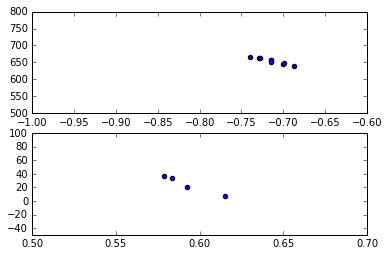

 40%|████      | 274/682 [01:49<02:27,  2.76it/s]

[(0.59256447743289853, 24.767450142450144), (-0.71399710509820324, 654.06827553117591)]


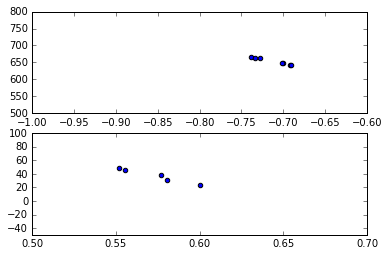

 40%|████      | 275/682 [01:50<02:32,  2.67it/s]

[(0.57296958633999784, 37.52400387895382), (-0.71216920895638836, 653.1804277876638)]


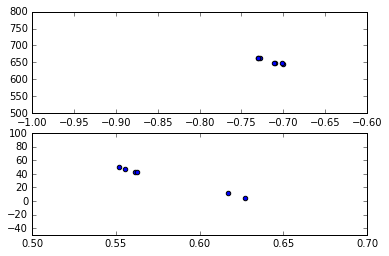

 40%|████      | 276/682 [01:50<02:29,  2.71it/s]

[(0.5791783584160094, 32.81378718973405), (-0.71601903185820726, 653.73640518950663)]


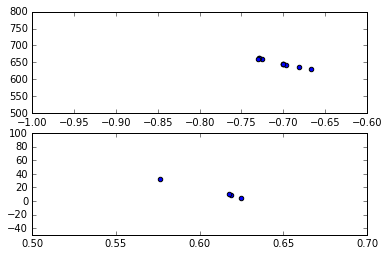

 41%|████      | 277/682 [01:50<02:23,  2.82it/s]

[(0.60944540859822194, 14.07582435147971), (-0.70613501378611399, 649.30874516116751)]


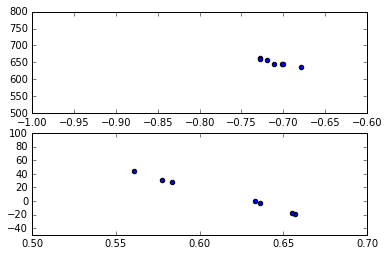

 41%|████      | 278/682 [01:51<02:25,  2.78it/s]

[(0.61484391294555896, 8.9613111687063363), (-0.7094881711364428, 650.37827116576432)]


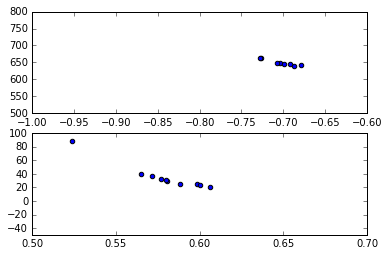

 41%|████      | 279/682 [01:51<02:26,  2.74it/s]

[(0.57907146349014182, 35.146588252639518), (-0.70298412216972128, 648.48173770974836)]


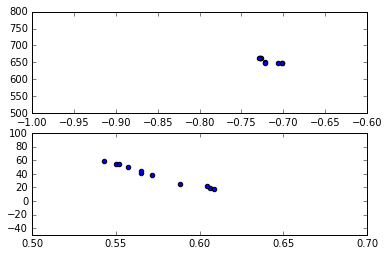

 41%|████      | 280/682 [01:51<02:36,  2.56it/s]

[(0.57376106799523297, 38.895990385392814), (-0.71838300433607793, 654.56967876396811)]


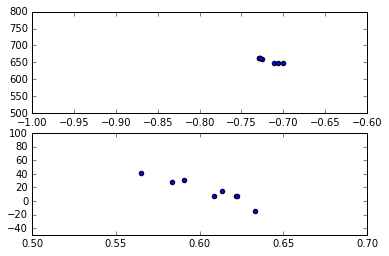

 41%|████      | 281/682 [01:52<02:30,  2.67it/s]

[(0.60483324727889942, 15.362161850585771), (-0.71842032017602253, 656.40862464866063)]


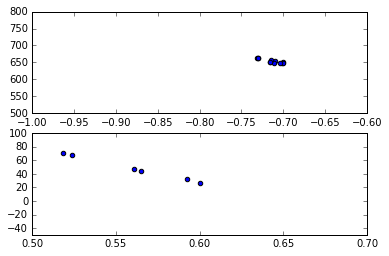

 41%|████▏     | 282/682 [01:52<02:26,  2.73it/s]

[(0.56018560599684675, 48.143280198847542), (-0.71383992276170405, 654.13265944928423)]


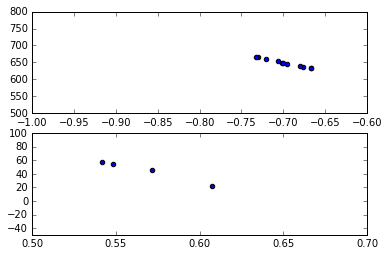

 41%|████▏     | 283/682 [01:52<02:22,  2.80it/s]

[(0.5671562980030721, 45.027697772657476), (-0.69783249843547757, 648.3605189183819)]


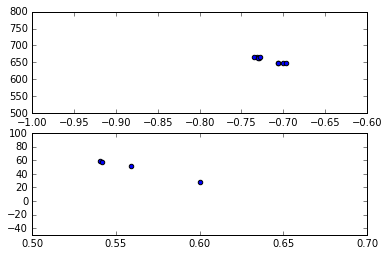

 42%|████▏     | 284/682 [01:53<02:27,  2.71it/s]

[(0.56025768415474297, 49.634777424483303), (-0.71820894470054375, 657.2467842291145)]


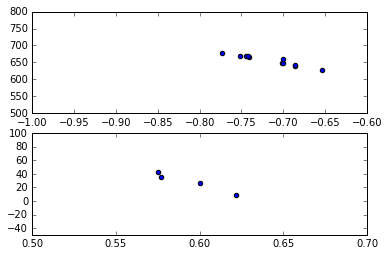

 42%|████▏     | 285/682 [01:53<02:25,  2.72it/s]

[(0.5933861746361746, 28.16075883575887), (-0.71644055955029795, 655.42968754450885)]


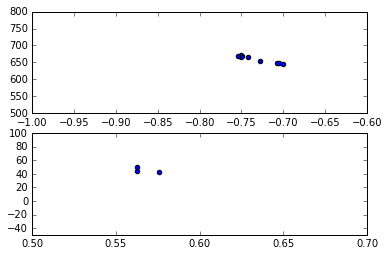

 42%|████▏     | 286/682 [01:54<02:36,  2.53it/s]

[(0.56691919191919193, 46.147095959595958), (-0.733434089865178, 660.40650759015705)]


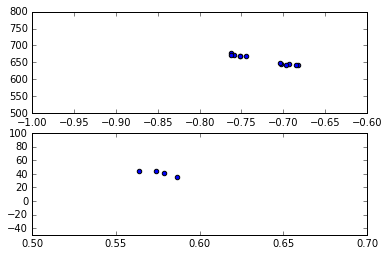

 42%|████▏     | 287/682 [01:54<02:29,  2.64it/s]

[(0.57571617567080358, 41.447722078620444), (-0.72440164995725398, 657.38966419812232)]


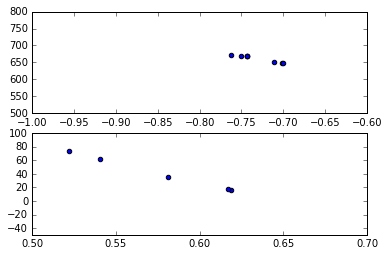

 42%|████▏     | 288/682 [01:54<02:32,  2.58it/s]

[(0.57594878309117936, 41.258546223746386), (-0.73172888775143885, 661.41056699123203)]


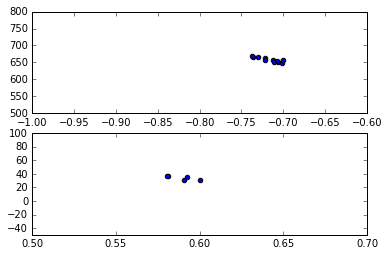

 42%|████▏     | 289/682 [01:55<02:31,  2.60it/s]

[(0.58910843872584306, 34.426760275927563), (-0.71705562835075209, 658.1571522335571)]


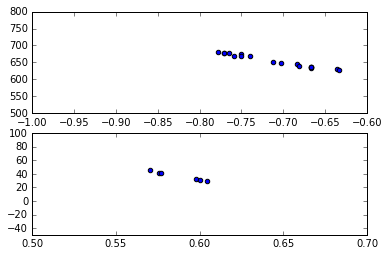

 43%|████▎     | 290/682 [01:55<02:26,  2.68it/s]

[(0.58749666549625312, 36.991001989809718), (-0.71111023213739566, 654.08737735667421)]


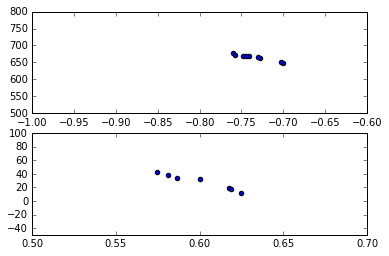

 43%|████▎     | 291/682 [01:56<02:35,  2.52it/s]

[(0.60043119083915286, 27.92066848466138), (-0.73473122693998305, 664.64983379717296)]


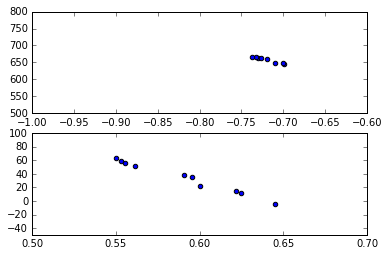

 43%|████▎     | 292/682 [01:56<02:33,  2.55it/s]

[(0.58980806517805751, 34.819020851806947), (-0.71936718067865713, 657.45261590124812)]


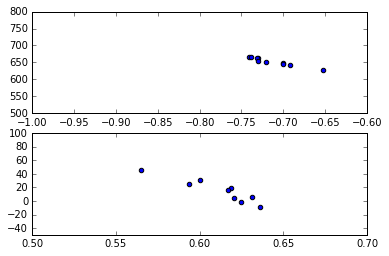

 43%|████▎     | 293/682 [01:56<02:35,  2.51it/s]

[(0.6120742806502425, 15.409263663226032), (-0.7136381672550921, 652.93096830703519)]


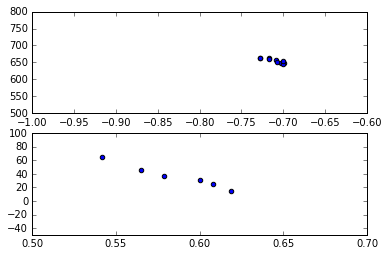

 43%|████▎     | 294/682 [01:57<02:35,  2.49it/s]

[(0.58545369711576467, 36.003698691528491), (-0.70985164753610419, 653.97166785806758)]


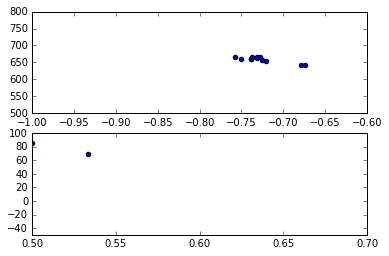

 43%|████▎     | 295/682 [01:57<02:28,  2.60it/s]

[(0.53333333333333333, 70.066666666666663), (-0.72572320077225039, 658.2181258659092)]


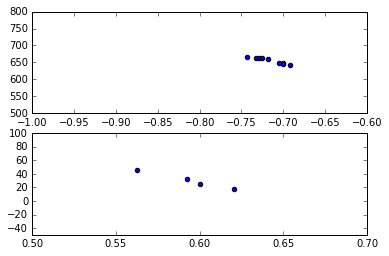

 43%|████▎     | 296/682 [01:58<02:30,  2.56it/s]

[(0.59394556194125159, 30.29553400383142), (-0.71624223629234518, 655.91297338049048)]


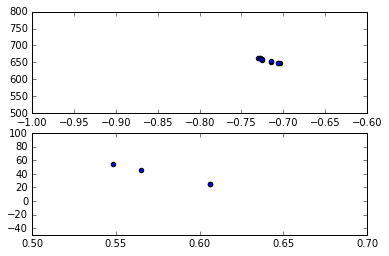

 44%|████▎     | 297/682 [01:58<02:38,  2.43it/s]

[(0.58143142504993828, 37.583683964469387), (-0.71882806420891743, 655.71731889607827)]


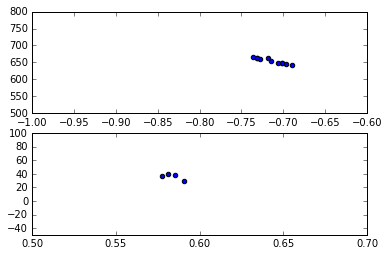

 44%|████▎     | 298/682 [01:58<02:28,  2.59it/s]

[(0.58386201779565361, 36.591820502243081), (-0.71407740160758248, 654.1789546615172)]


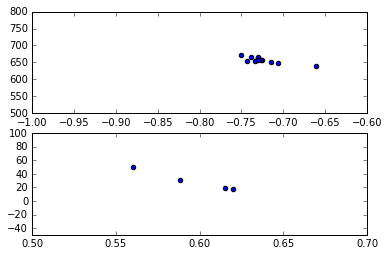

 44%|████▍     | 299/682 [01:59<02:23,  2.66it/s]

[(0.59590497737556558, 29.339909502262415), (-0.72459074167871684, 657.42100763829092)]


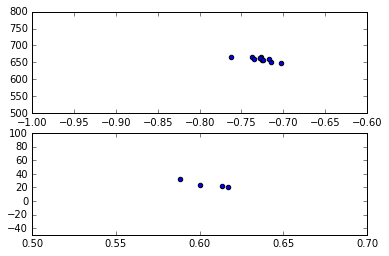

 44%|████▍     | 300/682 [01:59<02:28,  2.58it/s]

[(0.60463458110516932, 24.709692513368964), (-0.72719636378178154, 659.34938599199893)]


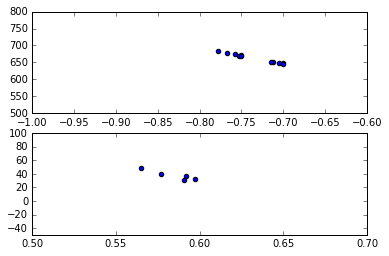

 44%|████▍     | 301/682 [01:59<02:21,  2.69it/s]

[(0.58451148393940155, 37.690394273918322), (-0.73523981872185074, 662.31802132622261)]


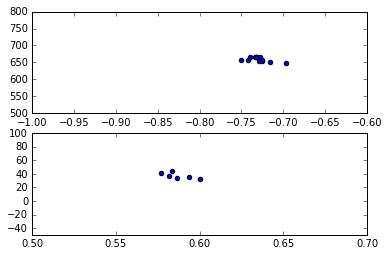

 44%|████▍     | 302/682 [02:00<02:28,  2.55it/s]

[(0.58697432664489324, 37.413859322464624), (-0.72924934239968764, 658.64868992621257)]


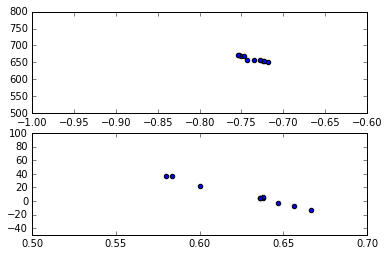

 44%|████▍     | 303/682 [02:00<02:31,  2.51it/s]

[(0.62817300979953117, 9.1275656485164571), (-0.73744145124622962, 660.86889058151439)]


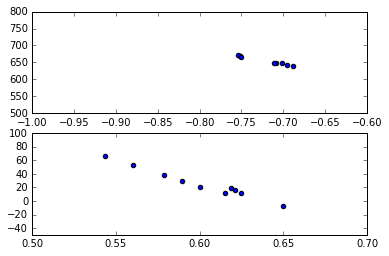

 45%|████▍     | 304/682 [02:01<02:24,  2.62it/s]

[(0.60026264736440049, 26.184127922194808), (-0.72347834539869116, 655.43666061931583)]


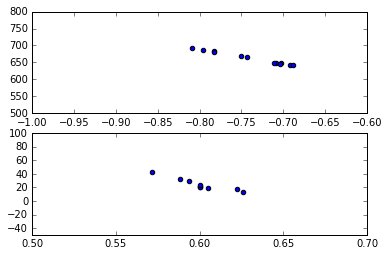

 45%|████▍     | 305/682 [02:01<02:26,  2.57it/s]

[(0.60072942273318564, 24.264820785667933), (-0.73923921820831684, 662.49804499556001)]


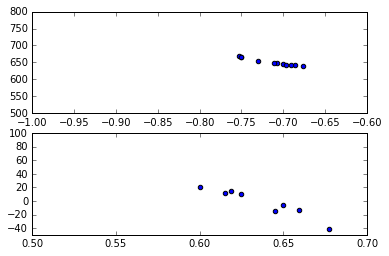

 45%|████▍     | 306/682 [02:01<02:27,  2.55it/s]

[(0.63638797358555421, -2.0121868722675131), (-0.71384406307361514, 650.7711930481654)]


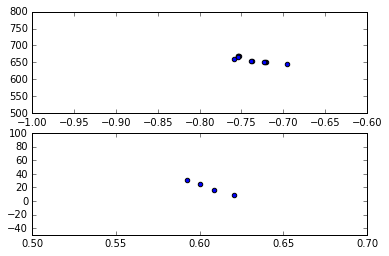

 45%|████▌     | 307/682 [02:02<02:26,  2.57it/s]

[(0.60549447498472986, 20.058520739630197), (-0.73709448942848188, 657.59015778322521)]


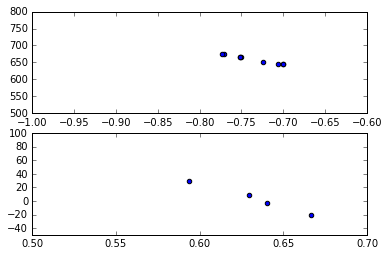

 45%|████▌     | 308/682 [02:02<02:35,  2.40it/s]

[(0.6325115740740741, 3.5890740740740767), (-0.7363007020477419, 659.68680375444922)]


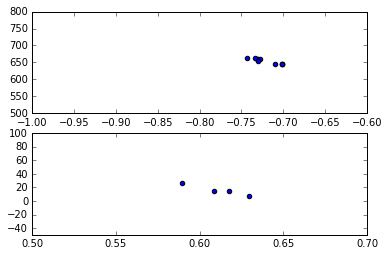

 45%|████▌     | 309/682 [02:03<02:31,  2.46it/s]

[(0.61142898259266554, 15.691671038538033), (-0.72114569288158914, 653.84173234950322)]


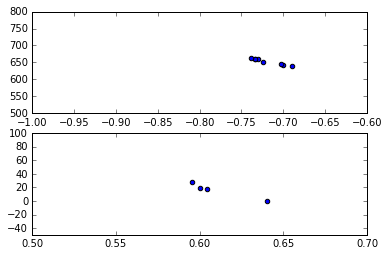

 45%|████▌     | 310/682 [02:03<02:30,  2.48it/s]

[(0.60997231450719824, 16.429828349944643), (-0.71910354811911059, 652.01727540475144)]


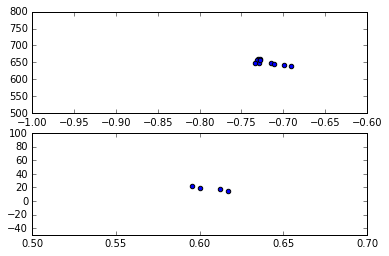

 46%|████▌     | 311/682 [02:03<02:30,  2.47it/s]

[(0.60625271385149804, 18.644333478072085), (-0.7193838909208714, 649.97630802143351)]


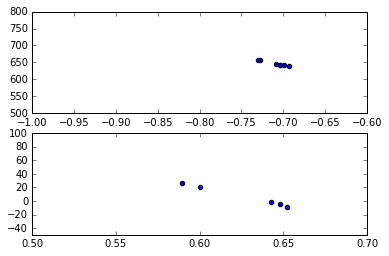

 46%|████▌     | 312/682 [02:04<02:20,  2.62it/s]

[(0.62658455875847197, 6.5488166905558156), (-0.70928425295457287, 646.84486995513612)]


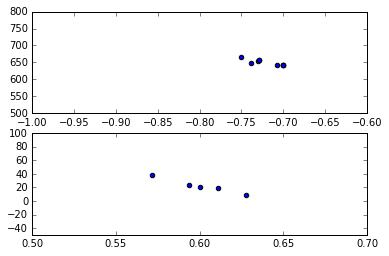

 46%|████▌     | 313/682 [02:04<02:30,  2.45it/s]

[(0.60074813258636794, 22.174313725490187), (-0.72065473694301019, 649.94752951929752)]


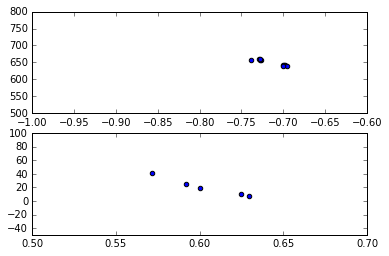

 46%|████▌     | 314/682 [02:05<02:21,  2.60it/s]

[(0.60357898715041569, 20.875230536659114), (-0.71432205096895218, 649.11705727060848)]


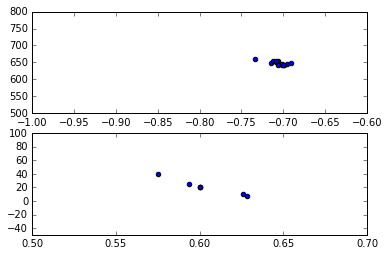

 46%|████▌     | 315/682 [02:05<02:23,  2.55it/s]

[(0.60334405501330957, 20.579824755989364), (-0.70592223183456249, 648.07510088706704)]


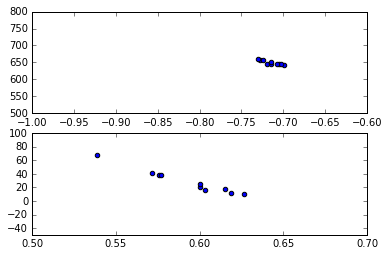

 46%|████▋     | 316/682 [02:05<02:19,  2.62it/s]

[(0.59272118362453463, 28.664760382890535), (-0.71449215918980868, 649.00852571065241)]


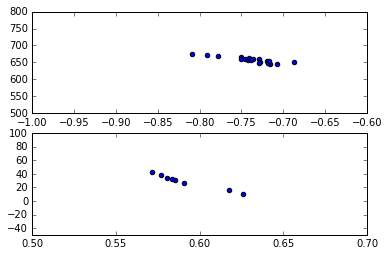

 46%|████▋     | 317/682 [02:06<02:12,  2.76it/s]

[(0.59151041855156217, 29.220371786049263), (-0.73759436202028628, 657.2909919252794)]


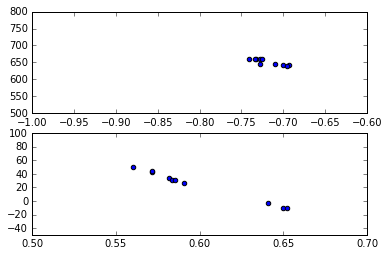

 47%|████▋     | 318/682 [02:06<02:09,  2.80it/s]

[(0.59870825156197649, 23.606427955704607), (-0.71860768284384569, 651.50889565025568)]


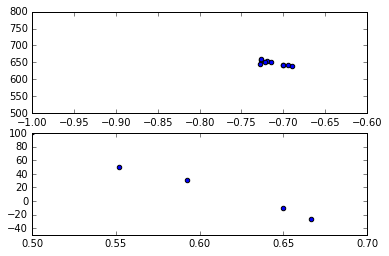

 47%|████▋     | 319/682 [02:07<02:19,  2.60it/s]

[(0.61524584929757342, 11.040964240102184), (-0.71214209780040594, 648.60889302724195)]


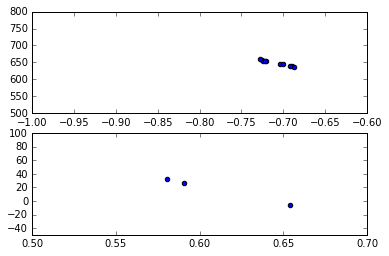

 47%|████▋     | 320/682 [02:07<02:19,  2.59it/s]

[(0.60846680201518921, 17.451838484096545), (-0.70933933983269204, 648.53752691718887)]


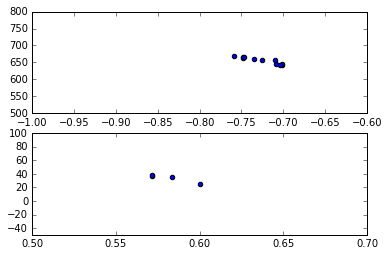

 47%|████▋     | 321/682 [02:07<02:15,  2.66it/s]

[(0.58154761904761898, 34.098809523809521), (-0.72614017334742431, 655.33926094563583)]


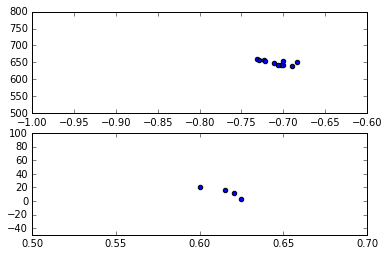

 47%|████▋     | 322/682 [02:08<02:09,  2.77it/s]

[(0.6152685676392573, 12.859748010610062), (-0.70901143617087881, 650.04002322519364)]


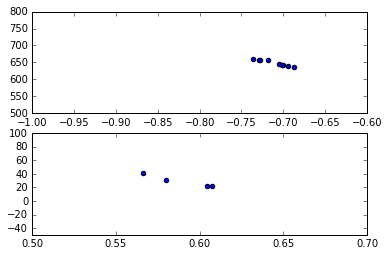

 47%|████▋     | 323/682 [02:08<02:10,  2.74it/s]

[(0.58933681491464507, 29.430779424977558), (-0.71112411529907071, 648.319564788668)]


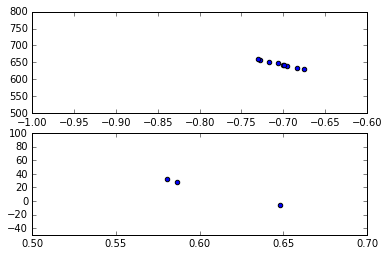

 48%|████▊     | 324/682 [02:08<02:19,  2.56it/s]

[(0.60500006866339839, 18.662732253944721), (-0.70396537192890263, 645.01001157067367)]


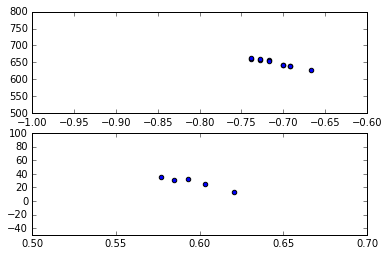

 48%|████▊     | 325/682 [02:09<02:16,  2.62it/s]

[(0.59573938627123901, 27.521936216909932), (-0.71082360129193001, 648.86047064144998)]


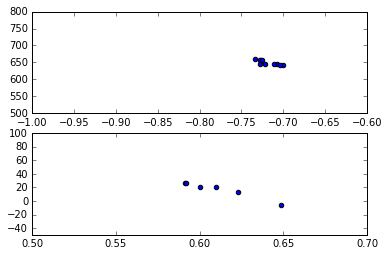

 48%|████▊     | 326/682 [02:09<02:13,  2.67it/s]

[(0.61076502500633312, 16.987460706694662), (-0.7187693364012564, 649.93671047154191)]


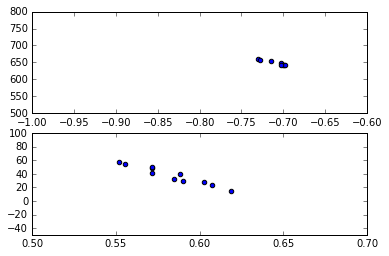

 48%|████▊     | 327/682 [02:10<02:18,  2.55it/s]

[(0.58304638392267616, 38.376863067166532), (-0.7093118319179208, 648.3293669235735)]


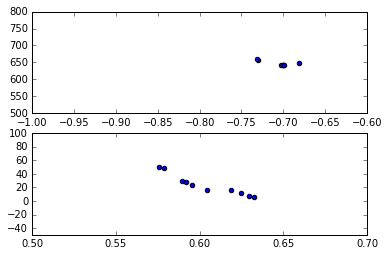

 48%|████▊     | 328/682 [02:10<02:22,  2.49it/s]

[(0.60427113021115775, 24.174152438924125), (-0.70631859185996615, 647.88662155617965)]


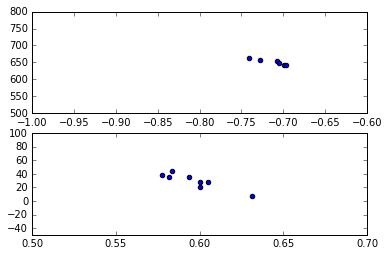

 48%|████▊     | 329/682 [02:10<02:23,  2.47it/s]

[(0.59668485732597465, 29.643236782910854), (-0.71273518050222862, 650.59125865064857)]


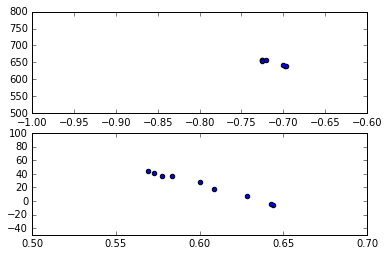

 48%|████▊     | 330/682 [02:11<02:28,  2.38it/s]

[(0.60303359515892352, 22.598188624479551), (-0.71337728148749524, 649.00894569432694)]


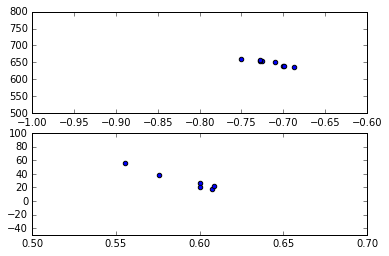

 49%|████▊     | 331/682 [02:11<02:21,  2.48it/s]

[(0.59119194010498355, 29.898032603467396), (-0.71591193036696998, 648.71292623770864)]


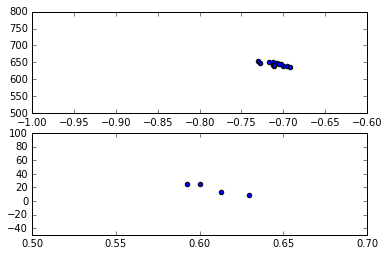

 49%|████▊     | 332/682 [02:12<02:18,  2.52it/s]

[(0.60878136200716848, 18.204181600955792), (-0.70950951154301234, 644.54937498449624)]


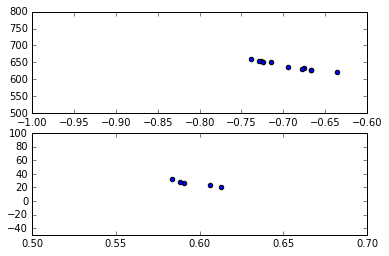

 49%|████▉     | 333/682 [02:12<02:16,  2.57it/s]

[(0.59628831004542582, 26.195296417687302), (-0.69534048025732109, 640.91873114340581)]


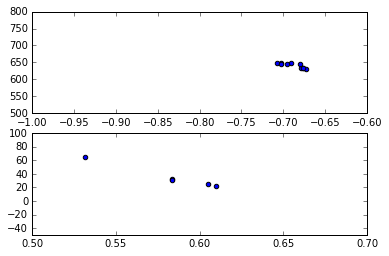

 49%|████▉     | 334/682 [02:12<02:16,  2.54it/s]

[(0.58258718442447588, 35.329685494223369), (-0.6884391102507702, 640.70098899412892)]


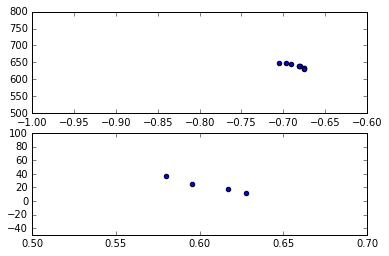

 49%|████▉     | 335/682 [02:13<02:22,  2.44it/s]

[(0.60516823354774862, 22.558424047501248), (-0.6844058112621908, 639.40621124617871)]


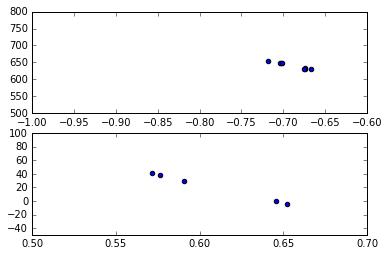

 49%|████▉     | 336/682 [02:13<02:20,  2.45it/s]

[(0.60732321903103037, 20.930024332704875), (-0.689520798639502, 640.53254347187419)]


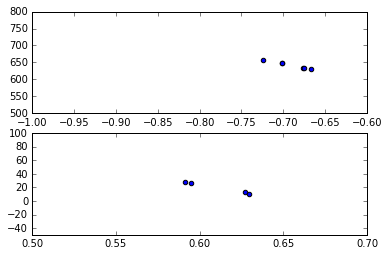

 49%|████▉     | 337/682 [02:14<02:18,  2.49it/s]

[(0.61065979791016589, 19.415346290162333), (-0.69093195611980496, 641.14119555489935)]


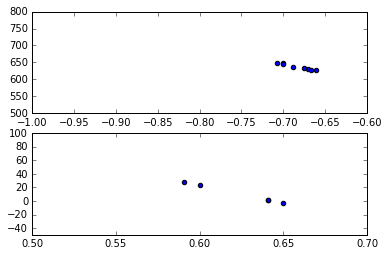

 50%|████▉     | 338/682 [02:14<02:12,  2.59it/s]

[(0.62459207459207455, 10.469440559440546), (-0.68380063638426991, 636.73604278198877)]


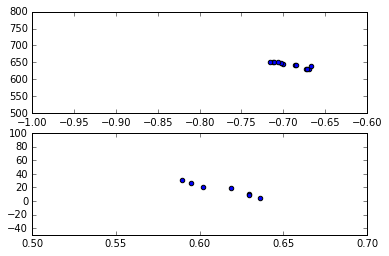

 50%|████▉     | 339/682 [02:14<02:11,  2.60it/s]

[(0.61427208408166944, 17.391659274083022), (-0.69181395237687993, 642.74140440288318)]


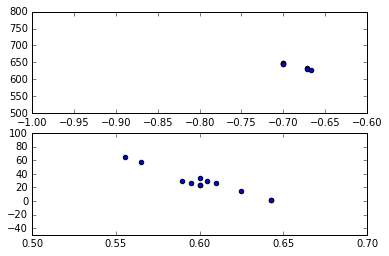

 50%|████▉     | 340/682 [02:15<02:08,  2.67it/s]

[(0.60253411037495974, 27.8117012820599), (-0.68710105943701194, 639.7179333394007)]


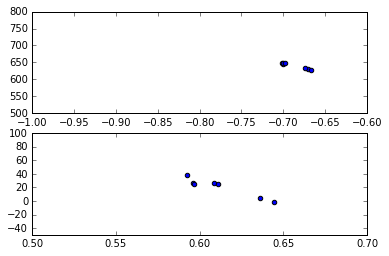

 50%|█████     | 341/682 [02:15<02:16,  2.50it/s]

[(0.61229517963592783, 20.556080473471777), (-0.68718097939279499, 640.04783706070782)]


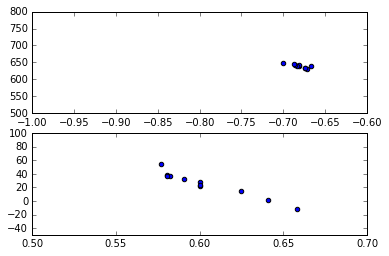

 50%|█████     | 342/682 [02:16<02:15,  2.52it/s]

[(0.60315765207357175, 25.368004510722049), (-0.68074263264073887, 638.97044757659819)]


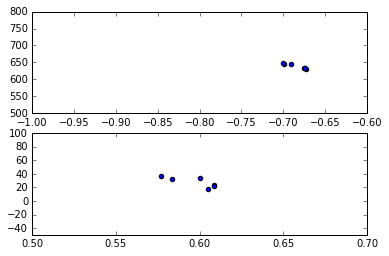

 50%|█████     | 343/682 [02:16<02:15,  2.50it/s]

[(0.59715181208316226, 27.924566293101766), (-0.68564545153412759, 639.25738179722941)]


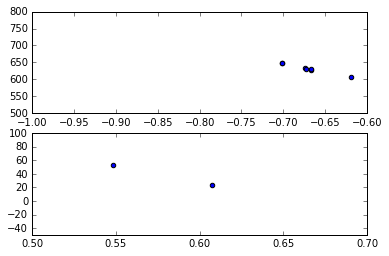

 50%|█████     | 344/682 [02:16<02:14,  2.51it/s]

[(0.57776497695852536, 38.684907834101409), (-0.67170498886441277, 631.8814939892103)]


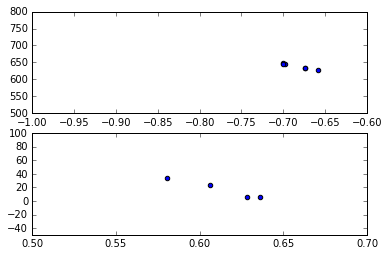

 51%|█████     | 345/682 [02:17<02:13,  2.51it/s]

[(0.61291020807149832, 17.314760508308879), (-0.68418152009212729, 638.99458835093139)]


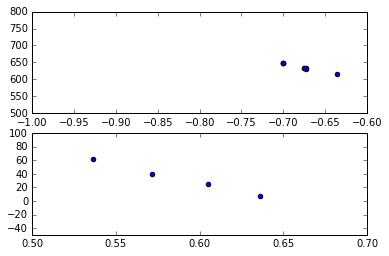

 51%|█████     | 346/682 [02:17<02:15,  2.47it/s]

[(0.58741018288515079, 33.489113582181631), (-0.67922302685766467, 636.15847792431794)]


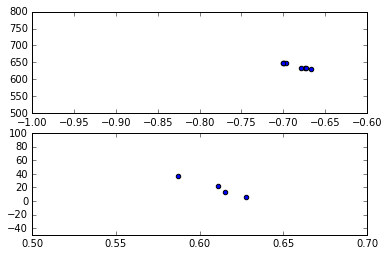

 51%|█████     | 347/682 [02:18<02:15,  2.48it/s]

[(0.61033980624476081, 19.666130858244102), (-0.68599869912856204, 639.87803431914426)]


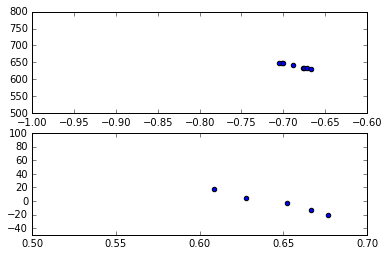

 51%|█████     | 348/682 [02:18<02:14,  2.48it/s]

[(0.64629156010230182, -2.7563512361466338), (-0.68554637864071766, 639.67585562134218)]


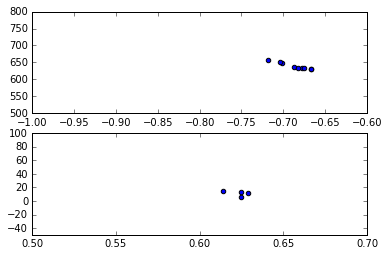

 51%|█████     | 349/682 [02:18<02:12,  2.51it/s]

[(0.6232668364459536, 11.26805673457838), (-0.68651651134152614, 639.59968523459565)]


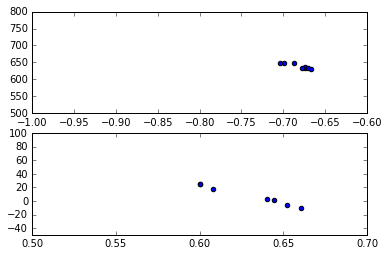

 51%|█████▏    | 350/682 [02:19<02:12,  2.51it/s]

[(0.62935259687398981, 7.9640079510064981), (-0.68150132346770298, 638.85637203351234)]


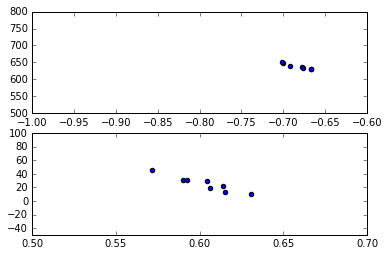

 51%|█████▏    | 351/682 [02:19<02:08,  2.57it/s]

[(0.60307516313097631, 25.279400985901752), (-0.68321515873060379, 638.35823001482083)]


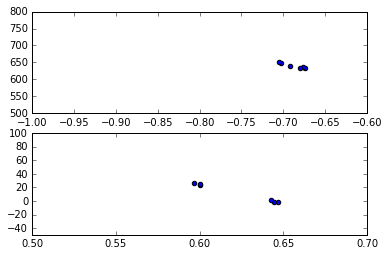

 52%|█████▏    | 352/682 [02:20<02:14,  2.45it/s]

[(0.62185576739656445, 12.113779705430554), (-0.68837626282999631, 639.88816260182796)]


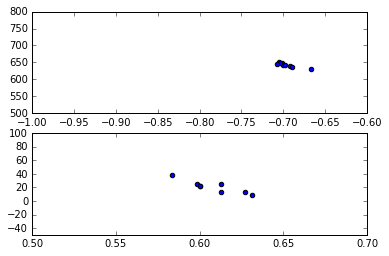

 52%|█████▏    | 353/682 [02:20<02:13,  2.46it/s]

[(0.60828037566052329, 20.905064236212532), (-0.69588153723375556, 642.41954874798148)]


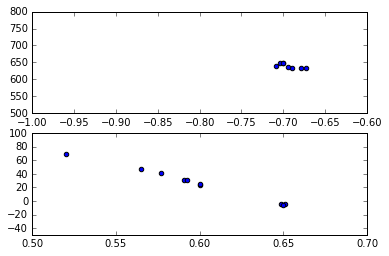

 52%|█████▏    | 354/682 [02:20<02:13,  2.46it/s]

[(0.5994787450874407, 25.281604731822135), (-0.69376310651496664, 640.2939856520868)]


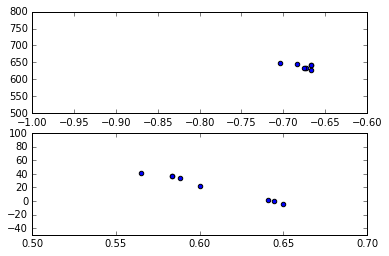

 52%|█████▏    | 355/682 [02:21<02:08,  2.54it/s]

[(0.60694867969484345, 21.077255749010845), (-0.6761346482382935, 638.17020326876627)]


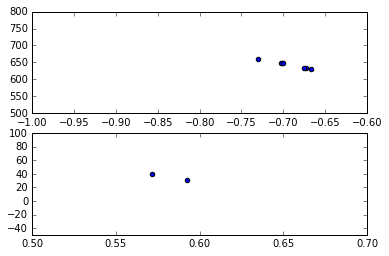

 52%|█████▏    | 356/682 [02:21<02:09,  2.52it/s]

[(0.58201058201058198, 35.584656084656103), (-0.69271272215066559, 642.78254153415367)]


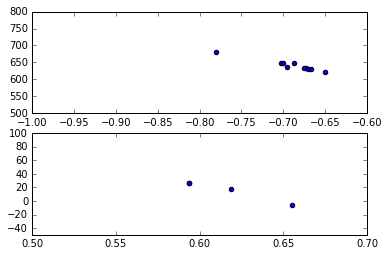

 52%|█████▏    | 357/682 [02:22<02:12,  2.45it/s]

[(0.61543000821018068, 16.043039306239748), (-0.69008640485263106, 641.04344169711703)]


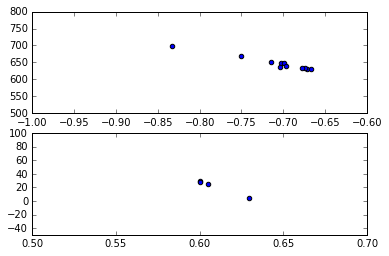

 52%|█████▏    | 358/682 [02:22<02:10,  2.47it/s]

[(0.60872319688109167, 21.665009746588694), (-0.70826706290456853, 646.52654632884776)]


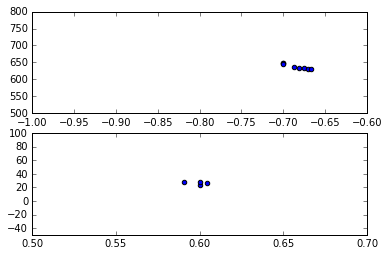

 53%|█████▎    | 359/682 [02:22<02:05,  2.57it/s]

[(0.59889006342494722, 26.585095137420723), (-0.68521780303030311, 637.88093749999996)]


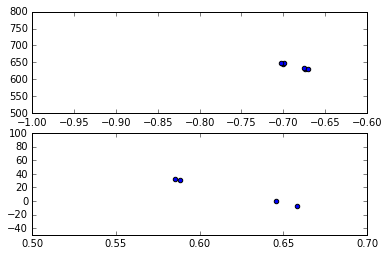

 53%|█████▎    | 360/682 [02:23<02:00,  2.67it/s]

[(0.61933230448790555, 13.94797998628205), (-0.68718004330889004, 638.93660139145834)]


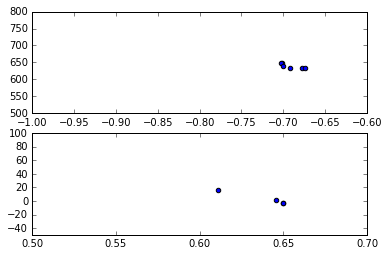

 53%|█████▎    | 361/682 [02:23<01:58,  2.71it/s]

[(0.63923611111111112, 2.591319444444423), (-0.69159283461049126, 638.95517858447226)]


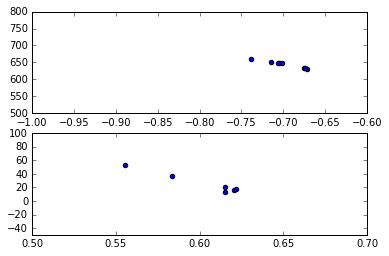

 53%|█████▎    | 362/682 [02:23<02:01,  2.64it/s]

[(0.60199489940869255, 26.271848439951878), (-0.69840470844895108, 644.30872150582104)]


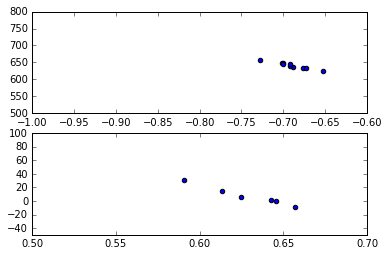

 53%|█████▎    | 363/682 [02:24<02:07,  2.50it/s]

[(0.62922979797979794, 7.3614808802308671), (-0.69036391513843409, 640.64419542915527)]


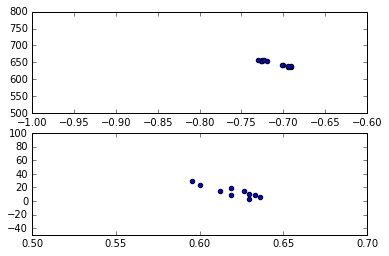

 53%|█████▎    | 364/682 [02:24<02:06,  2.51it/s]

[(0.62006034871706517, 13.783604140469816), (-0.71036550755702887, 647.26263531768871)]


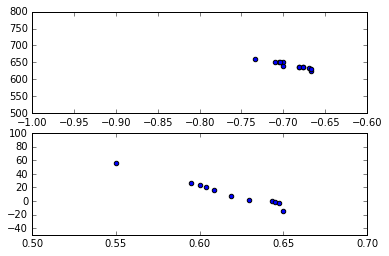

 54%|█████▎    | 365/682 [02:25<02:04,  2.55it/s]

[(0.61744838827329307, 12.155585996398274), (-0.69026320155437537, 640.87298497312031)]


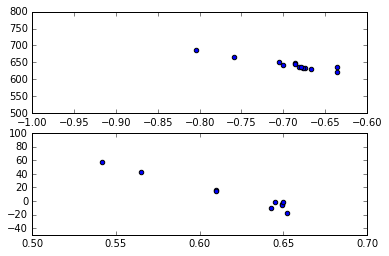

 54%|█████▎    | 366/682 [02:25<02:06,  2.49it/s]

[(0.62151959424161862, 9.094735672026701), (-0.69167919185265458, 643.95086740694774)]


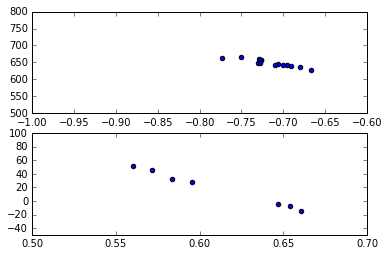

 54%|█████▍    | 367/682 [02:25<02:00,  2.61it/s]

[(0.61018319083801875, 18.90240791236668), (-0.7159413005202393, 648.364535543491)]


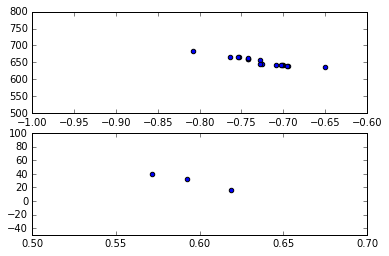

 54%|█████▍    | 368/682 [02:26<02:05,  2.50it/s]

[(0.59435626102292771, 29.989417989418012), (-0.72565203314435822, 652.64382852885774)]


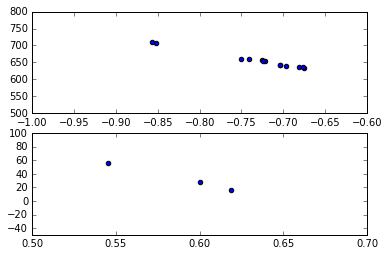

 54%|█████▍    | 369/682 [02:26<02:06,  2.48it/s]

[(0.58816738816738823, 33.690620490620496), (-0.73141085118772742, 656.25928338058156)]


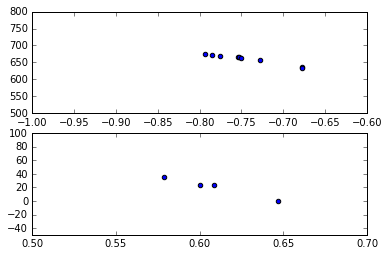

 54%|█████▍    | 370/682 [02:27<02:04,  2.50it/s]

[(0.60867546103109438, 20.552651770090165), (-0.74381973258709244, 659.53640403587656)]


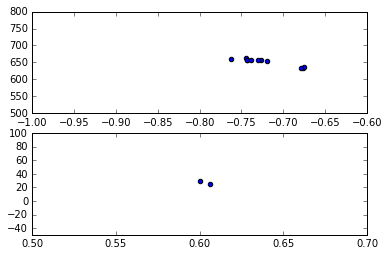

 54%|█████▍    | 371/682 [02:27<02:05,  2.48it/s]

[(0.60303030303030303, 27.169696969696986), (-0.72170277998885402, 651.46624232468355)]


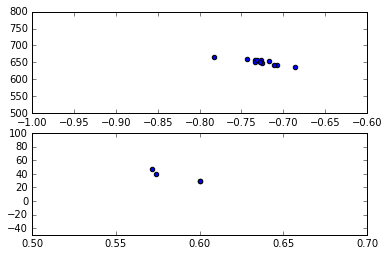

 55%|█████▍    | 372/682 [02:27<02:01,  2.55it/s]

[(0.58637566137566133, 36.791269841269852), (-0.72715745593581849, 651.71142580699814)]


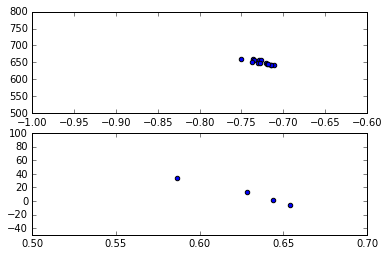

 55%|█████▍    | 373/682 [02:28<02:01,  2.54it/s]

[(0.62817306889486901, 10.729554081219788), (-0.72642245542842632, 650.53818228794046)]


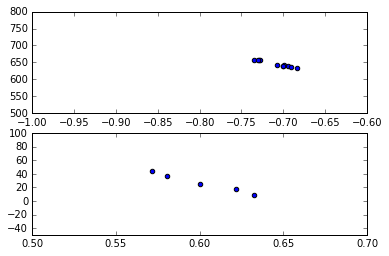

 55%|█████▍    | 374/682 [02:28<02:07,  2.41it/s]

[(0.6012096591033973, 26.795426432124724), (-0.70885552587484568, 645.41585895067396)]


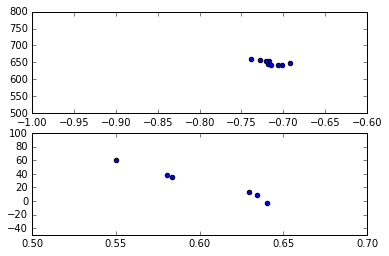

 55%|█████▍    | 375/682 [02:29<02:00,  2.56it/s]

[(0.60295907761945011, 25.536111208244677), (-0.71535160036006828, 649.16283860252884)]


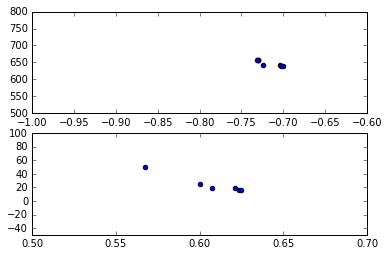

 55%|█████▌    | 376/682 [02:29<01:55,  2.65it/s]

[(0.60738901343740048, 24.698878717427107), (-0.71884449887204505, 648.85112839862109)]


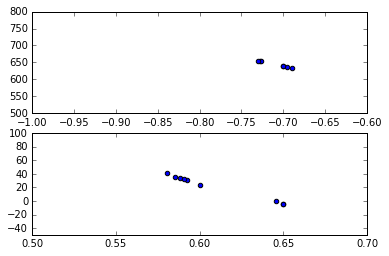

 55%|█████▌    | 377/682 [02:29<01:55,  2.65it/s]

[(0.60921696103530065, 21.052474692738581), (-0.70983379942178915, 644.25171396035)]


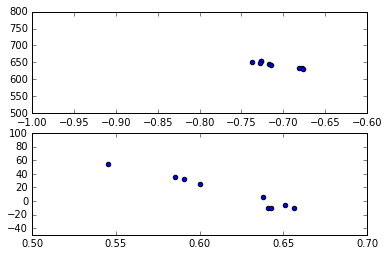

 55%|█████▌    | 378/682 [02:30<01:52,  2.70it/s]

[(0.61672075883907362, 13.106276138762546), (-0.70949420082654369, 643.22178484295841)]


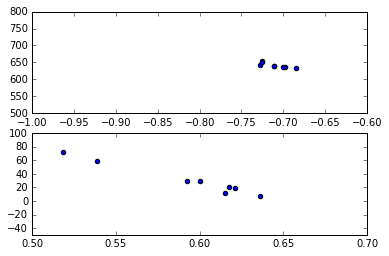

 56%|█████▌    | 379/682 [02:30<01:59,  2.53it/s]

[(0.59252251016956903, 31.189150745768401), (-0.71047307530363635, 641.54084001219371)]


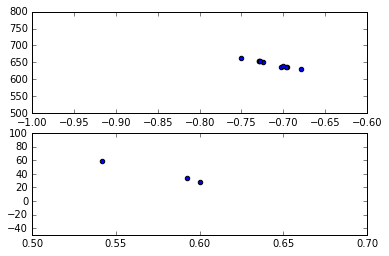

 56%|█████▌    | 380/682 [02:31<01:59,  2.52it/s]

[(0.57808641975308639, 40.154938271604976), (-0.71335277018572008, 645.42277524659517)]


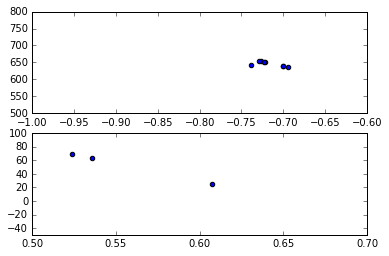

 56%|█████▌    | 381/682 [02:31<01:54,  2.64it/s]

[(0.55555555555555547, 53.047619047619058), (-0.71678133219191564, 645.54096987817559)]


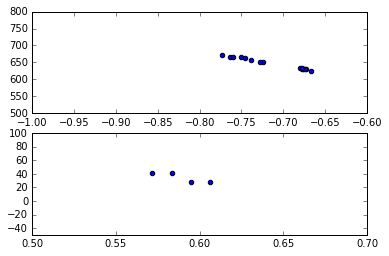

 56%|█████▌    | 382/682 [02:31<01:52,  2.67it/s]

[(0.58885427635427634, 34.705188955188945), (-0.71378460898542806, 646.90491342188648)]


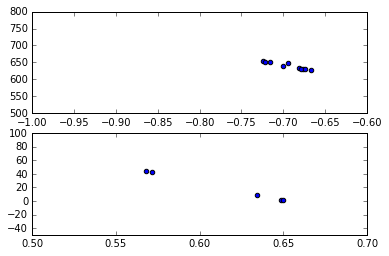

 56%|█████▌    | 383/682 [02:32<01:48,  2.75it/s]

[(0.61448107594449053, 19.98422210617332), (-0.69324481235165458, 639.41865531691428)]


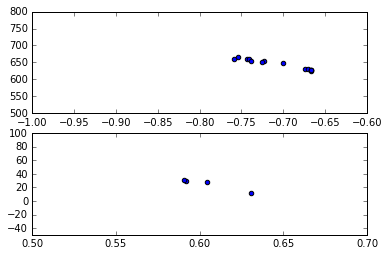

 56%|█████▋    | 384/682 [02:32<01:49,  2.72it/s]

[(0.60433681871958267, 25.494015689279649), (-0.70675687516667995, 643.86758747479212)]


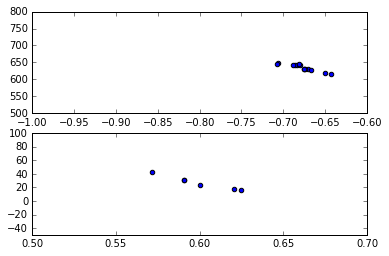

 56%|█████▋    | 385/682 [02:32<01:55,  2.58it/s]

[(0.59982273473652781, 27.235406403940875), (-0.67782274918097307, 634.86138356858567)]


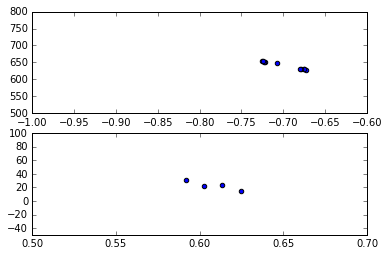

 57%|█████▋    | 386/682 [02:33<01:49,  2.70it/s]

[(0.60837033820541386, 22.850318706167684), (-0.69825888174149797, 640.42725277152704)]


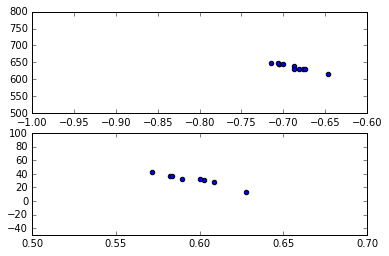

 57%|█████▋    | 387/682 [02:33<01:46,  2.76it/s]

[(0.59574217521122463, 31.707144297748911), (-0.68942866513574363, 637.21666302148549)]


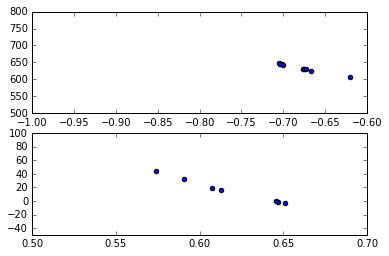

 57%|█████▋    | 388/682 [02:33<01:46,  2.77it/s]

[(0.61833375253001155, 15.351624012263747), (-0.68270469046863858, 634.36337982008934)]


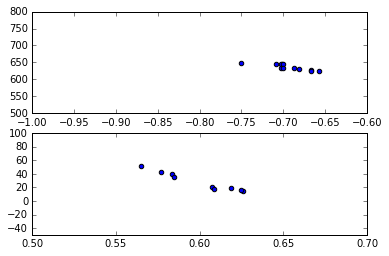

 57%|█████▋    | 389/682 [02:34<01:47,  2.73it/s]

[(0.5995799765306431, 29.059481034581072), (-0.69393810374178511, 636.18420048751796)]


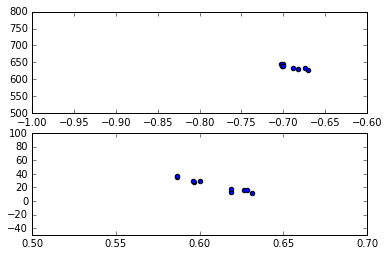

 57%|█████▋    | 390/682 [02:34<01:49,  2.65it/s]

[(0.60895671076251845, 23.632866426777504), (-0.69021545001628515, 636.61068748803041)]


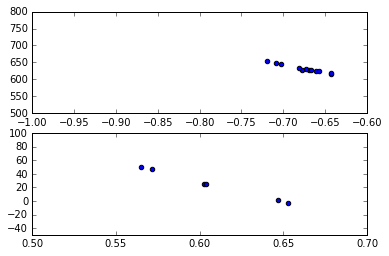

 57%|█████▋    | 391/682 [02:35<01:47,  2.71it/s]

[(0.60713670858497848, 24.143037545154176), (-0.67523839022427967, 631.12354895702754)]


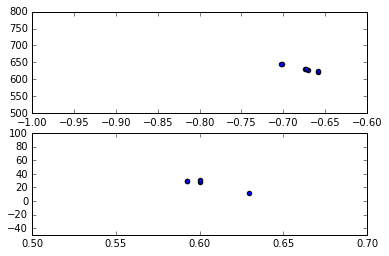

 57%|█████▋    | 392/682 [02:35<01:49,  2.64it/s]

[(0.60296296296296303, 25.943703703703715), (-0.67698888237736587, 631.70300243260579)]


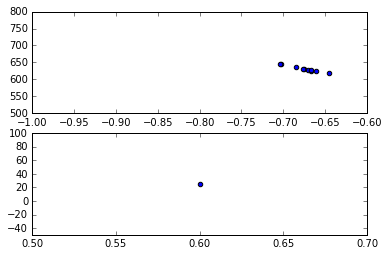

 58%|█████▊    | 393/682 [02:35<01:51,  2.60it/s]

[(0.59999999999999998, 25.400000000000034), (-0.67537115720474339, 630.91644349408898)]


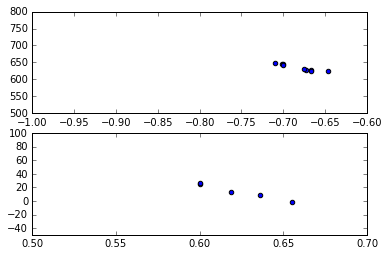

 58%|█████▊    | 394/682 [02:36<01:51,  2.59it/s]

[(0.62211673384087185, 14.288269891028506), (-0.68211470212404779, 634.92615557861882)]


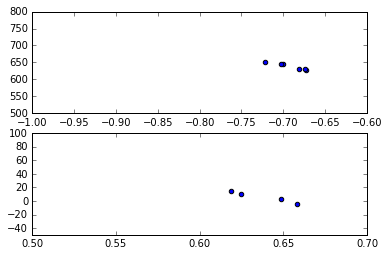

 58%|█████▊    | 395/682 [02:36<01:50,  2.59it/s]

[(0.63764775113459327, 6.1739949536002001), (-0.69232529850387303, 638.11347318526555)]


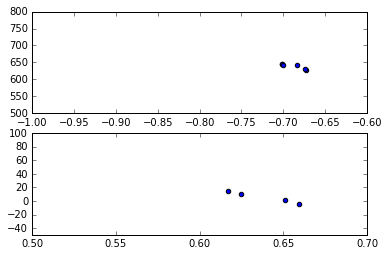

 58%|█████▊    | 396/682 [02:37<01:58,  2.41it/s]

[(0.63806874409608205, 5.6462864356079336), (-0.68895807164792078, 638.44634952830927)]


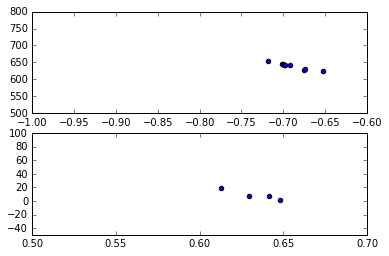

 58%|█████▊    | 397/682 [02:37<01:58,  2.41it/s]

[(0.63304760938662341, 9.1978398818782239), (-0.68999961444685798, 638.99991040714269)]


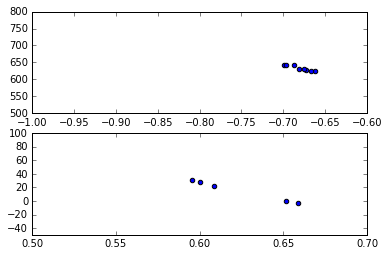

 58%|█████▊    | 398/682 [02:37<01:54,  2.48it/s]

[(0.62279709685860274, 15.502572245711145), (-0.68017341208193571, 633.09319703035067)]


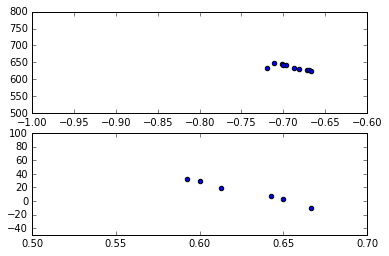

 59%|█████▊    | 399/682 [02:38<01:55,  2.45it/s]

[(0.62750327132047556, 13.65011378506002), (-0.69057145405759401, 635.73017481253942)]


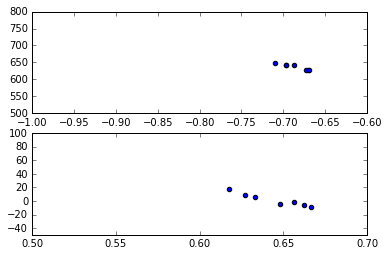

 59%|█████▊    | 400/682 [02:38<01:52,  2.50it/s]

[(0.64454492192130175, 1.7437690502312162), (-0.68629192283138796, 636.66117705544468)]


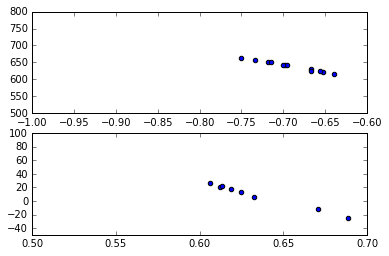

 59%|█████▉    | 401/682 [02:39<01:53,  2.48it/s]

[(0.63349824778396202, 8.4546272675736844), (-0.69081026995922656, 638.50538979472435)]


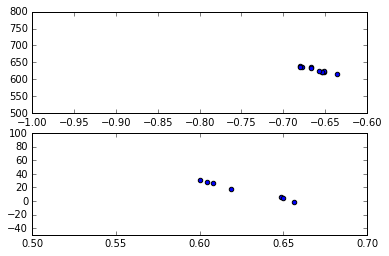

 59%|█████▉    | 402/682 [02:39<02:07,  2.19it/s]

[(0.62663436682026685, 16.049091261268806), (-0.66147286804590533, 628.17641328888737)]


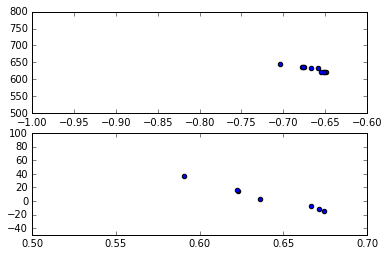

 59%|█████▉    | 403/682 [02:40<02:11,  2.12it/s]

[(0.64063637242272431, 5.0151796748736013), (-0.66650700062198764, 630.65057694652137)]


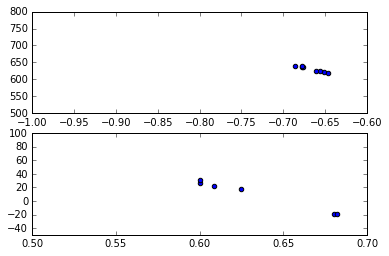

 59%|█████▉    | 404/682 [02:40<02:10,  2.12it/s]

[(0.63258563899868248, 9.8586067193676001), (-0.66669006687360022, 630.14504654766961)]


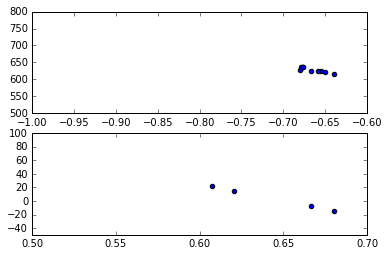

 59%|█████▉    | 405/682 [02:41<02:06,  2.19it/s]

[(0.6436247947454844, 3.5877093596058955), (-0.66597336539466068, 628.30628583092721)]


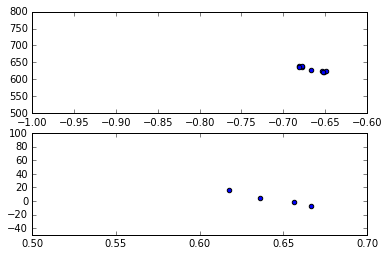

 60%|█████▉    | 406/682 [02:41<02:04,  2.23it/s]

[(0.64423184046345805, 3.0463318850267314), (-0.66557118145498528, 629.6838439649714)]


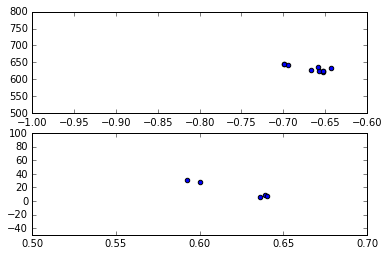

 60%|█████▉    | 407/682 [02:42<02:04,  2.20it/s]

[(0.62156902356902355, 16.270060606060621), (-0.66761449191358446, 632.12024387136501)]


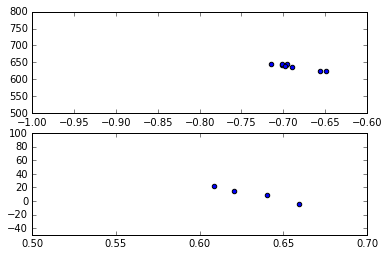

 60%|█████▉    | 408/682 [02:42<01:57,  2.34it/s]

[(0.63211905410930902, 10.573654422788593), (-0.68920895508719715, 637.86605289055342)]


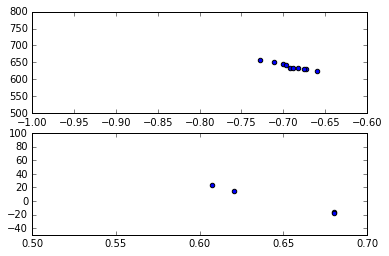

 60%|█████▉    | 409/682 [02:42<01:55,  2.36it/s]

[(0.64695812807881781, 0.86458128078815832), (-0.69076494960381829, 637.97541085780972)]


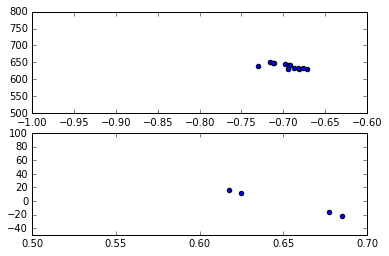

 60%|██████    | 410/682 [02:43<01:49,  2.49it/s]

[(0.65131289971185602, -2.3952469428631673), (-0.69618599869669362, 638.63665762418418)]


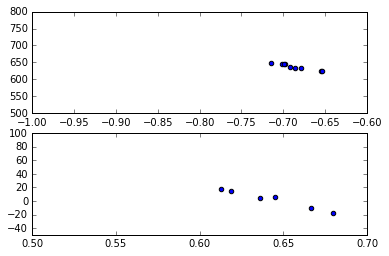

 60%|██████    | 411/682 [02:43<01:45,  2.56it/s]

[(0.6432716029490223, 2.3536624665656802), (-0.68643829911299137, 637.0106082020892)]


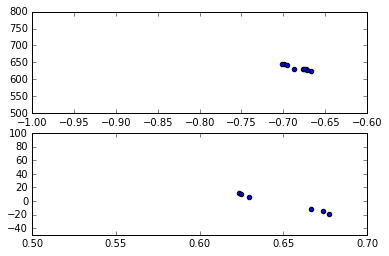

 60%|██████    | 412/682 [02:43<01:45,  2.57it/s]

[(0.64926027704445521, -2.7308528467322426), (-0.68295114459921791, 633.82639388799964)]


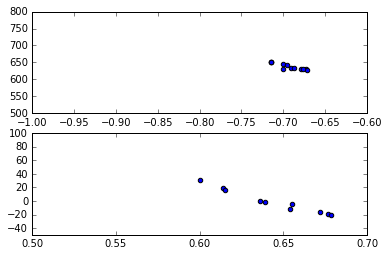

 61%|██████    | 413/682 [02:44<01:52,  2.40it/s]

[(0.64408289538904329, -0.62170600919296248), (-0.69309533424380521, 637.49458823398254)]


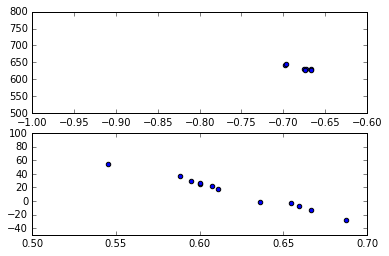

 61%|██████    | 414/682 [02:44<01:56,  2.31it/s]

[(0.62095042319150573, 13.456327725414093), (-0.67852338768304132, 633.13776291070531)]


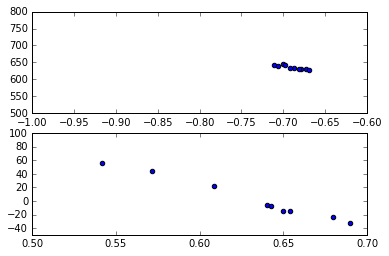

 61%|██████    | 415/682 [02:45<01:53,  2.34it/s]

[(0.63084850431926898, 2.7043251359668008), (-0.68976760060093345, 635.56199638312341)]


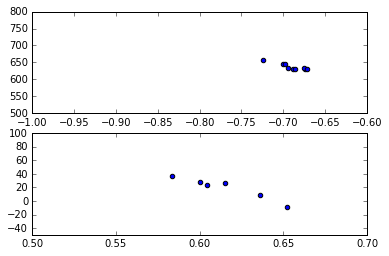

 61%|██████    | 416/682 [02:46<02:32,  1.74it/s]

[(0.6152370274652883, 19.565155104557277), (-0.69030029969718187, 636.94489552159803)]


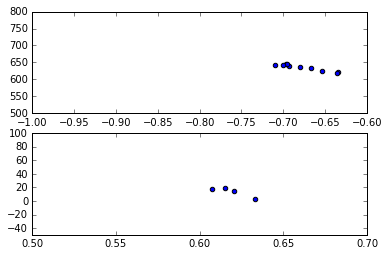

 61%|██████    | 417/682 [02:46<02:33,  1.73it/s]

[(0.61913761525830491, 13.96717506631299), (-0.67674759181092592, 635.08057088696864)]


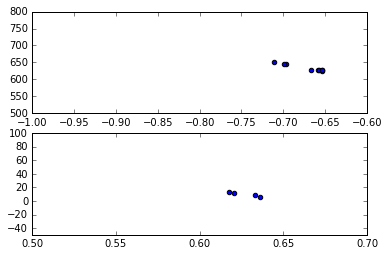

 61%|██████▏   | 418/682 [02:47<02:56,  1.49it/s]

[(0.62700842092322817, 10.137039768885629), (-0.67238424179182443, 633.21290146096953)]


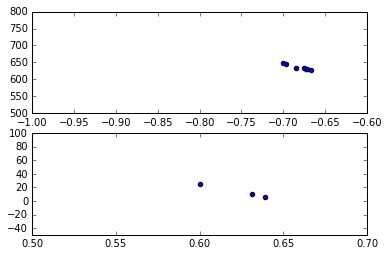

 61%|██████▏   | 419/682 [02:48<02:38,  1.66it/s]

[(0.62348927875243665, 13.766374269005874), (-0.68120056175370503, 635.6795119809085)]


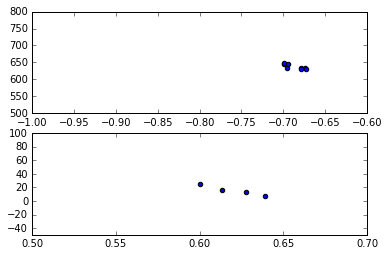

 62%|██████▏   | 420/682 [02:48<02:26,  1.79it/s]

[(0.62010805731735963, 15.600375851538644), (-0.68657436050880105, 637.46142447220404)]


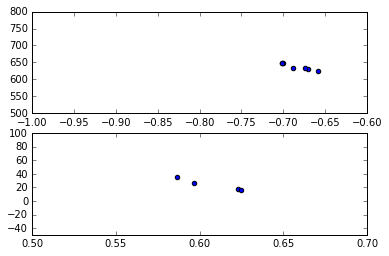

 62%|██████▏   | 421/682 [02:48<02:11,  1.99it/s]

[(0.6075849085139654, 23.77501205640975), (-0.6850451610912619, 637.68056994208177)]


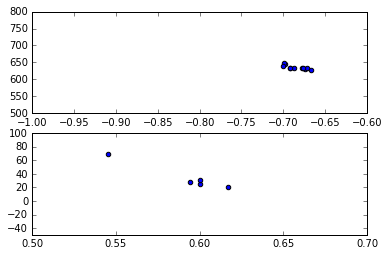

 62%|██████▏   | 422/682 [02:49<02:00,  2.16it/s]

[(0.59133574412020296, 34.865131612143649), (-0.68501150952245538, 635.2692997729921)]


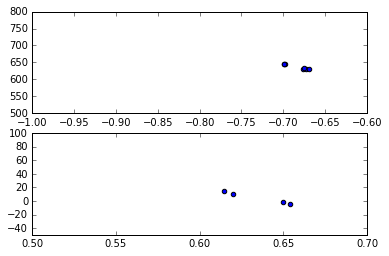

 62%|██████▏   | 423/682 [02:49<01:58,  2.18it/s]

[(0.63446254449775574, 5.0104898622504095), (-0.68442731259072376, 637.03827046857907)]


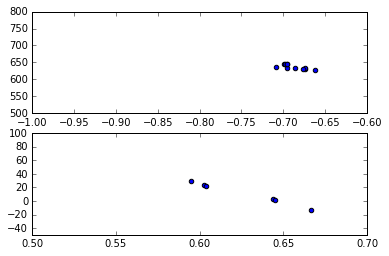

 62%|██████▏   | 424/682 [02:50<01:49,  2.36it/s]

[(0.62605409924820798, 10.786722361522132), (-0.68761781120099608, 636.99078608700938)]


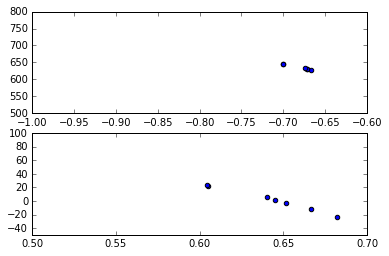

 62%|██████▏   | 425/682 [02:50<01:51,  2.30it/s]

[(0.6420380326563121, 2.0499055971905591), (-0.68070425443011551, 635.82621372882898)]


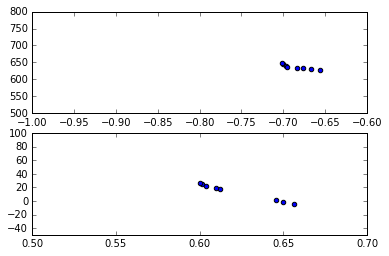

 62%|██████▏   | 426/682 [02:50<01:50,  2.32it/s]

[(0.62238655914537544, 13.303027987620851), (-0.68470381069312858, 636.53832195928317)]


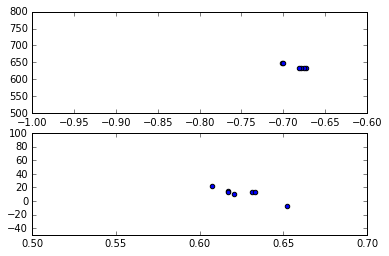

 63%|██████▎   | 427/682 [02:51<01:47,  2.38it/s]

[(0.62556589417885611, 11.280179199885181), (-0.68508928419775683, 637.26419243986049)]


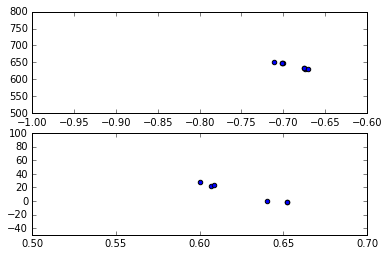

 63%|██████▎   | 428/682 [02:51<01:45,  2.40it/s]

[(0.62660014255167507, 11.773357091945835), (-0.68867985263654508, 640.14999398959822)]


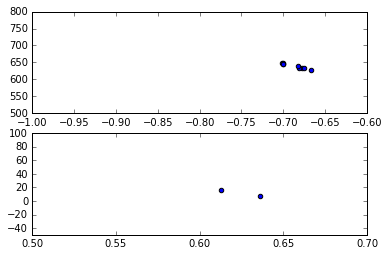

 63%|██████▎   | 429/682 [02:52<01:48,  2.32it/s]

[(0.62463343108504399, 11.293255131964827), (-0.68720118969977539, 639.10102575282156)]


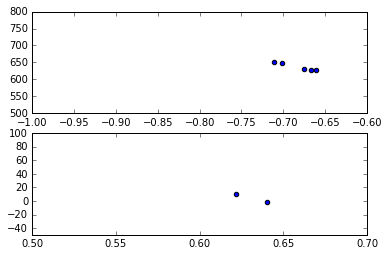

 63%|██████▎   | 430/682 [02:52<01:45,  2.39it/s]

[(0.63081081081081081, 4.4432432432432449), (-0.68300248133304586, 636.70924875050343)]


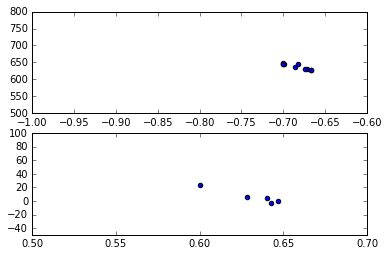

 63%|██████▎   | 431/682 [02:52<01:41,  2.46it/s]

[(0.63169747899159667, 6.5257478991596489), (-0.68476020983603691, 638.12791119559597)]


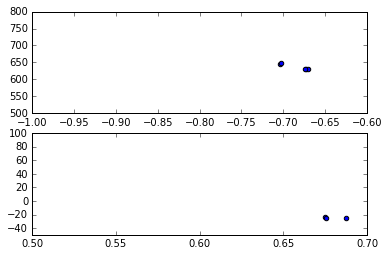

 63%|██████▎   | 432/682 [02:53<01:43,  2.41it/s]

[(0.67939189189189186, -24.484346846846847), (-0.68460805665577507, 636.76848161696489)]


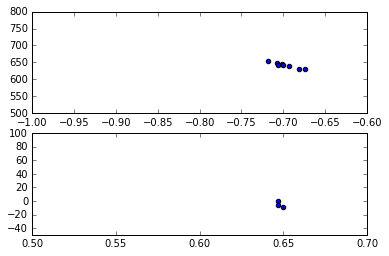

 63%|██████▎   | 433/682 [02:53<01:40,  2.48it/s]

[(0.64803921568627454, -4.7686274509804134), (-0.69781942700353894, 641.21051678798301)]


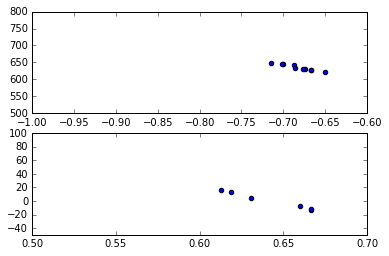

 64%|██████▎   | 434/682 [02:54<01:39,  2.50it/s]

[(0.64261982679934992, -0.1913524343819025), (-0.68232356488005652, 635.32985362060231)]


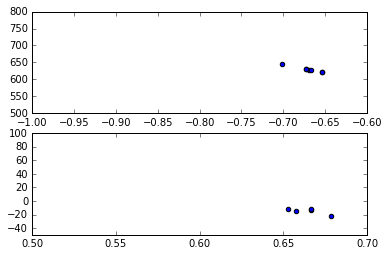

 64%|██████▍   | 435/682 [02:54<01:36,  2.55it/s]

[(0.66450004659397988, -14.56912216941571), (-0.6701017897228515, 629.27037096803542)]


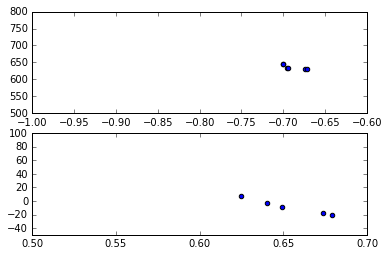

 64%|██████▍   | 436/682 [02:54<01:36,  2.54it/s]

[(0.65341889934197894, -8.6799232017873003), (-0.68942471733651434, 635.81388387977051)]


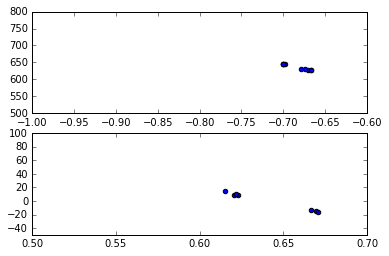

 64%|██████▍   | 437/682 [02:55<01:36,  2.53it/s]

[(0.64102246617137981, -0.27961905547247007), (-0.68381228538774352, 635.83143724520778)]


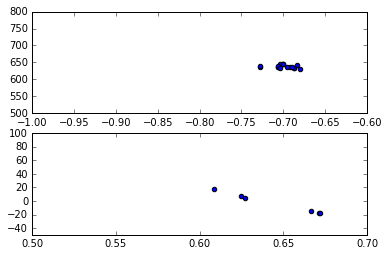

 64%|██████▍   | 438/682 [02:55<01:36,  2.53it/s]

[(0.64504677034355307, -3.4343608578010012), (-0.69994752476758137, 638.38586968795516)]


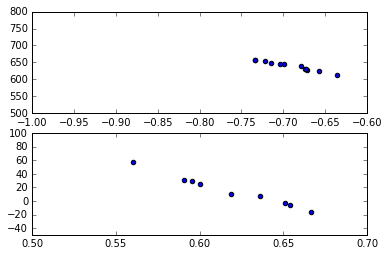

 64%|██████▍   | 439/682 [02:56<01:35,  2.54it/s]

[(0.61924822808543745, 15.076766713045775), (-0.69146698561133135, 639.21391593635656)]


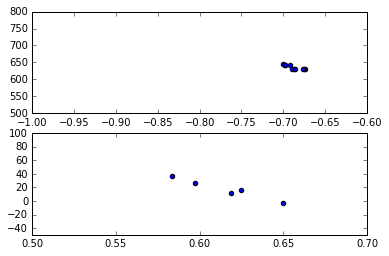

 65%|██████▍   | 440/682 [02:56<01:38,  2.45it/s]

[(0.61487917555081739, 17.89818763326225), (-0.68765403117727064, 634.85667628330566)]


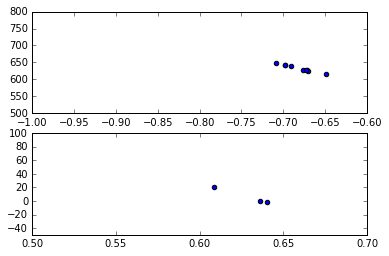

 65%|██████▍   | 441/682 [02:56<01:36,  2.49it/s]

[(0.62835309617918311, 6.1175757575757457), (-0.68170001085442256, 632.9213701063702)]


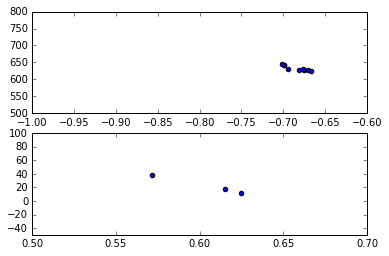

 65%|██████▍   | 442/682 [02:57<01:32,  2.59it/s]

[(0.6039377289377289, 22.749084249084245), (-0.68505358907609082, 632.59515610870972)]


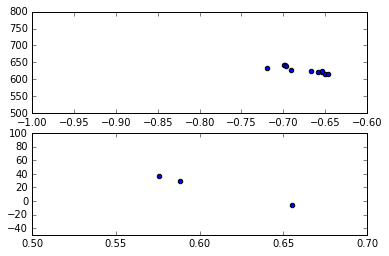

 65%|██████▍   | 443/682 [02:57<01:32,  2.58it/s]

[(0.60638842788944214, 19.96713586165917), (-0.67579434385369497, 628.31555063562143)]


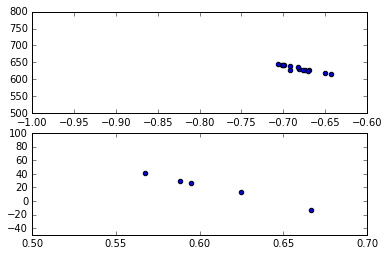

 65%|██████▌   | 444/682 [02:58<01:32,  2.56it/s]

[(0.60841282458929524, 19.647655007949119), (-0.6812445372728263, 631.56095529039874)]


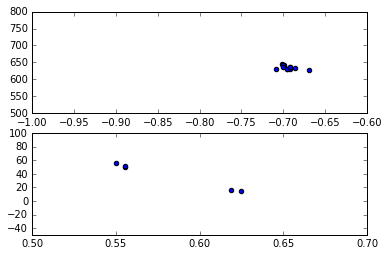

 65%|██████▌   | 445/682 [02:58<01:37,  2.43it/s]

[(0.58103174603174601, 37.832142857142856), (-0.69519400015576716, 635.66889081939701)]


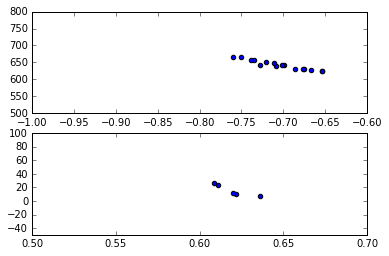

 65%|██████▌   | 446/682 [02:58<01:35,  2.46it/s]

[(0.61955840425405639, 16.065875060831569), (-0.70396204233761506, 642.32192622519256)]


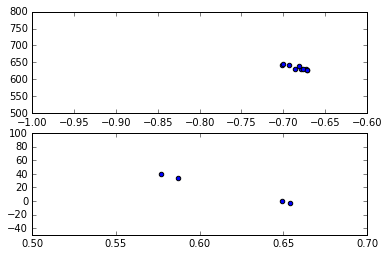

 66%|██████▌   | 447/682 [02:59<01:33,  2.50it/s]

[(0.61671213988147622, 17.922680866044715), (-0.68352735112826091, 634.31253665873919)]


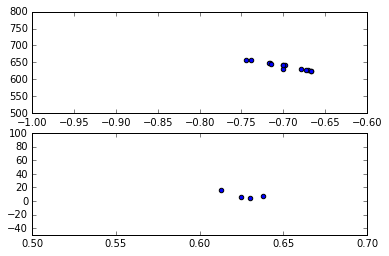

 66%|██████▌   | 448/682 [03:00<01:57,  1.99it/s]

[(0.62643034288202781, 8.2902737484549931), (-0.69886721809530827, 639.06371556031957)]


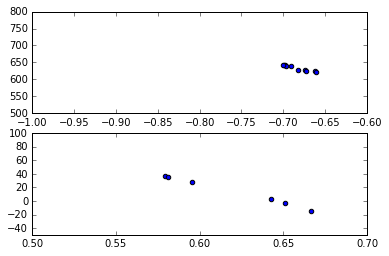

 66%|██████▌   | 449/682 [03:00<01:53,  2.05it/s]

[(0.61956201407586853, 14.103445790698382), (-0.68387295531763859, 632.74342426420139)]


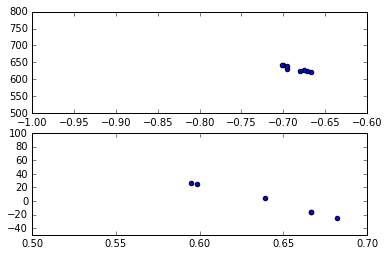

 66%|██████▌   | 450/682 [03:00<01:46,  2.17it/s]

[(0.64116594239545055, -0.34966673081425864), (-0.68580076583292804, 631.72175962507004)]


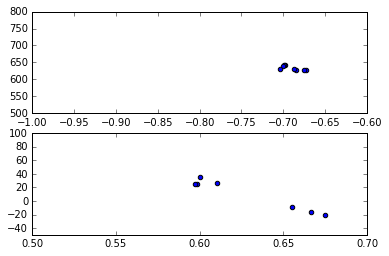

 66%|██████▌   | 451/682 [03:01<02:05,  1.84it/s]

[(0.62895816206129129, 9.6205077073450322), (-0.69020469340482471, 632.86304995455714)]


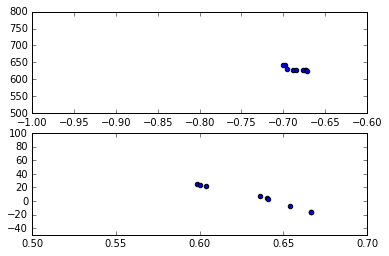

 66%|██████▋   | 452/682 [03:02<01:51,  2.07it/s]

[(0.63408528292497979, 4.7709712432755076), (-0.68473230965253251, 630.66964858557049)]


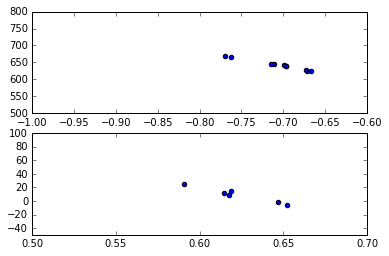

 66%|██████▋   | 453/682 [03:02<01:43,  2.21it/s]

[(0.62345985190543307, 8.7354362513072203), (-0.70597614195061587, 642.13897604362319)]


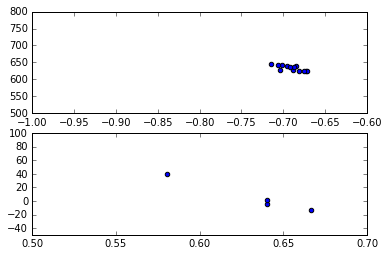

 67%|██████▋   | 454/682 [03:02<01:36,  2.37it/s]

[(0.63182795698924732, 5.6901075268817323), (-0.69055226703041761, 633.54501248521592)]


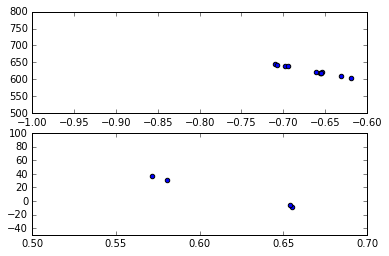

 67%|██████▋   | 455/682 [03:03<01:33,  2.42it/s]

[(0.61527307508953788, 13.308338630224057), (-0.66721987406413108, 624.87527699610143)]


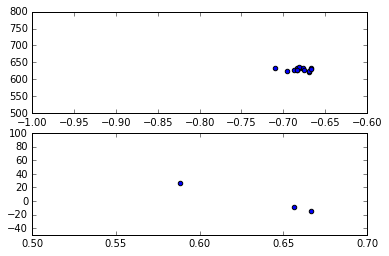

 67%|██████▋   | 456/682 [03:03<01:36,  2.35it/s]

[(0.6370506535947712, 1.1113153594771272), (-0.6806595111113064, 629.44141110365024)]


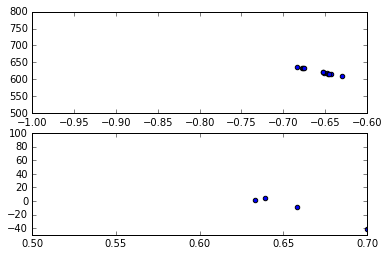

 67%|██████▋   | 457/682 [03:04<01:33,  2.40it/s]

[(0.64337231968810915, -1.0770955165691778), (-0.65670915091427529, 622.50899070271385)]


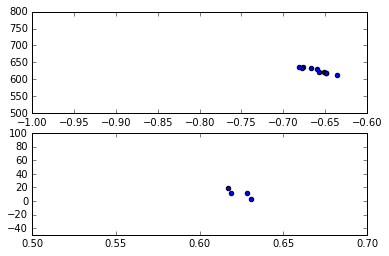

 67%|██████▋   | 458/682 [03:04<01:49,  2.04it/s]

[(0.62376877670587194, 11.306761816660043), (-0.66063788435485271, 626.2352320462777)]


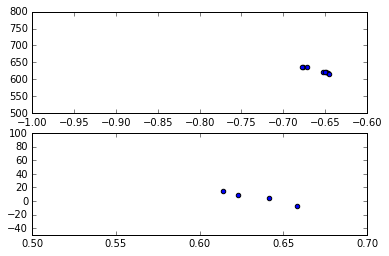

 67%|██████▋   | 459/682 [03:05<01:55,  1.93it/s]

[(0.63402019198940751, 5.1074147633234048), (-0.65862899939615493, 625.29950016042631)]


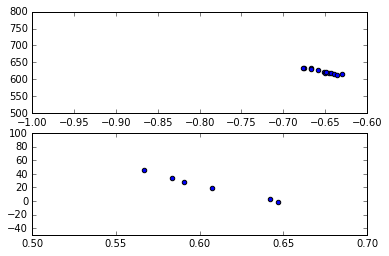

 67%|██████▋   | 460/682 [03:06<02:11,  1.69it/s]

[(0.60615030272624659, 21.666084113428269), (-0.65294904468307302, 622.93036264461421)]


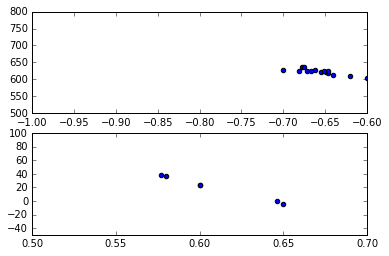

 68%|██████▊   | 461/682 [03:06<01:56,  1.89it/s]

[(0.60887742338961848, 19.535953721075686), (-0.66035982634063262, 623.2784710890088)]


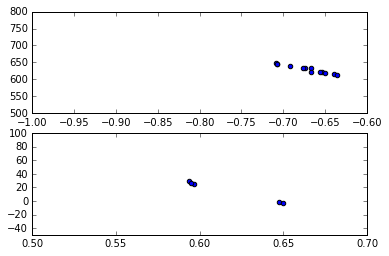

 68%|██████▊   | 462/682 [03:06<01:52,  1.95it/s]

[(0.61649097405676356, 15.313554155659414), (-0.67180587952334492, 629.88055804712212)]


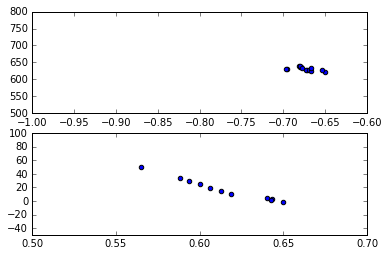

 68%|██████▊   | 463/682 [03:07<01:43,  2.11it/s]

[(0.61467526568640529, 17.258885310044615), (-0.67432480606319012, 631.11272127064331)]


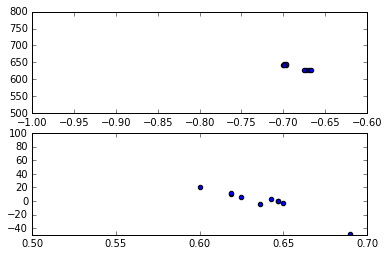

 68%|██████▊   | 464/682 [03:07<01:37,  2.24it/s]

[(0.63755979187719425, -0.46233587808650894), (-0.68613832213344694, 636.31570583555902)]


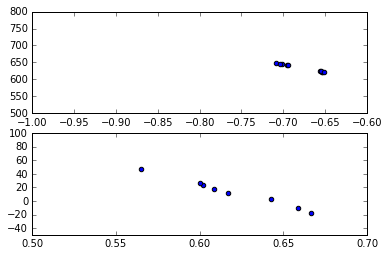

 68%|██████▊   | 465/682 [03:07<01:30,  2.39it/s]

[(0.62015843027954953, 12.632476679016563), (-0.67717445360383977, 633.58887110857609)]


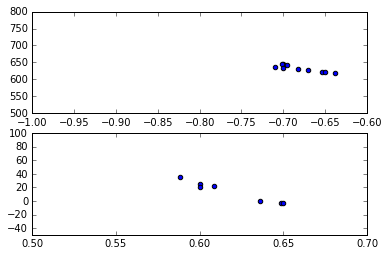

 68%|██████▊   | 466/682 [03:08<01:29,  2.43it/s]

[(0.61884903304340644, 14.027957985886369), (-0.68202230788983309, 632.96929837840128)]


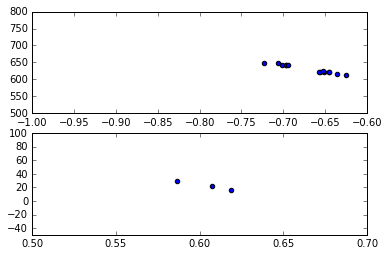

 68%|██████▊   | 467/682 [03:08<01:30,  2.38it/s]

[(0.60413245758073342, 22.648056923919), (-0.67057235129517578, 630.47588378052194)]


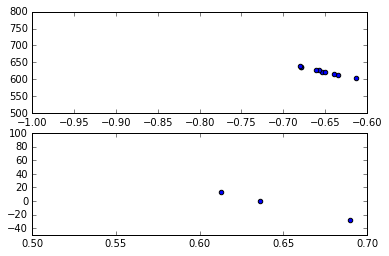

 69%|██████▊   | 468/682 [03:09<01:28,  2.41it/s]

[(0.6463073448612936, -4.829810901001129), (-0.65471253250677175, 624.81888377364317)]


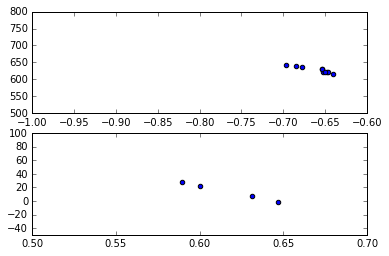

 69%|██████▉   | 469/682 [03:09<01:26,  2.45it/s]

[(0.61709534016035561, 13.939807096927836), (-0.66052925520229733, 627.90552751935684)]


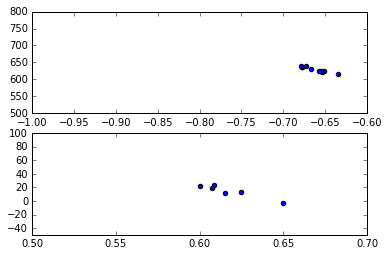

 69%|██████▉   | 470/682 [03:10<01:26,  2.46it/s]

[(0.61770385411689765, 14.370594441790095), (-0.66248078303982794, 629.40333251806442)]


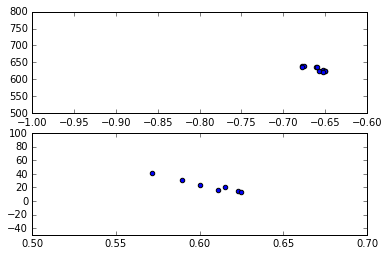

 69%|██████▉   | 471/682 [03:10<01:24,  2.50it/s]

[(0.60504419958597866, 23.139018476282622), (-0.66076866198632644, 630.16202827971983)]


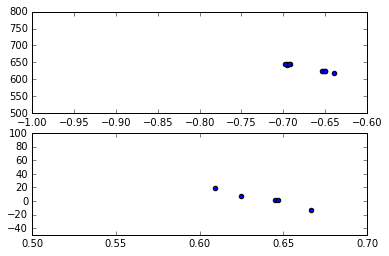

 69%|██████▉   | 472/682 [03:10<01:21,  2.57it/s]

[(0.63865235610373172, 3.1676193864642643), (-0.67214049079797067, 633.6898727177304)]


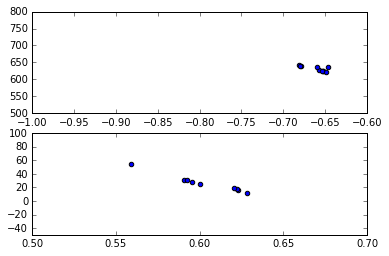

 69%|██████▉   | 473/682 [03:11<01:23,  2.51it/s]

[(0.60358166887941211, 26.36435787237054), (-0.66115413146208502, 631.25379097977179)]


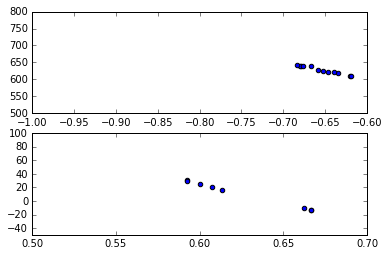

 70%|██████▉   | 474/682 [03:11<01:21,  2.54it/s]

[(0.6252435427134222, 10.432783406352698), (-0.65484240922831083, 627.65154876829661)]


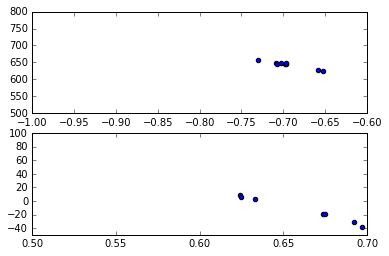

 70%|██████▉   | 475/682 [03:11<01:21,  2.54it/s]

[(0.66000167632820705, -13.021815655999335), (-0.69474819583583725, 642.90407858862307)]


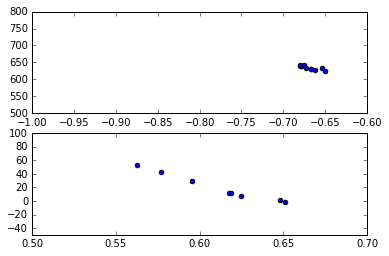

 70%|██████▉   | 476/682 [03:12<01:21,  2.54it/s]

[(0.61189368760324647, 19.615559990662931), (-0.66956479317925111, 634.51584221270969)]


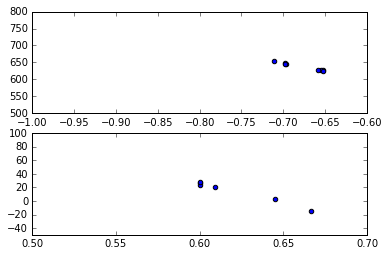

 70%|██████▉   | 477/682 [03:12<01:18,  2.61it/s]

[(0.62017055988134973, 14.624199728092947), (-0.67776744109627352, 636.96189959077333)]


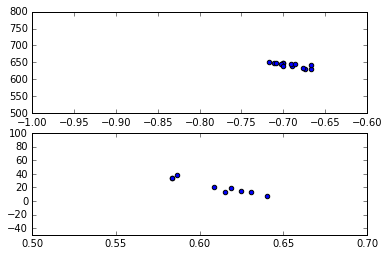

 70%|███████   | 478/682 [03:13<01:18,  2.59it/s]

[(0.61015958138147042, 21.772050589479356), (-0.69213457895175945, 642.28805103532125)]


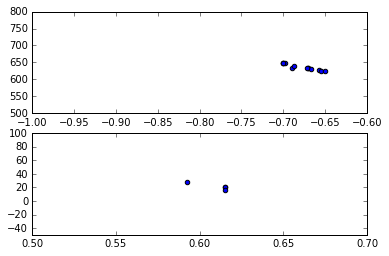

 70%|███████   | 479/682 [03:13<01:16,  2.66it/s]

[(0.6096866096866097, 21.396723646723643), (-0.67834499825155481, 635.85163721364484)]


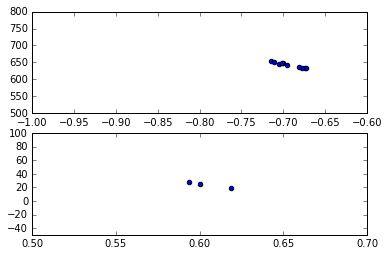

 70%|███████   | 480/682 [03:13<01:13,  2.76it/s]

[(0.60426587301587309, 23.902083333333337), (-0.69346073186987167, 642.47618652028962)]


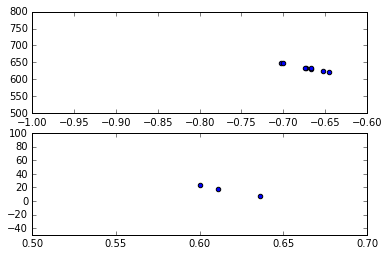

 71%|███████   | 481/682 [03:14<01:13,  2.72it/s]

[(0.61582491582491583, 16.325589225589209), (-0.67253323982427027, 634.08494953715774)]


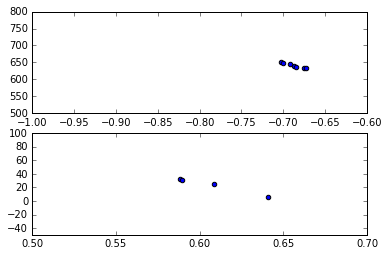

 71%|███████   | 482/682 [03:14<01:13,  2.73it/s]

[(0.60692504426519778, 23.27818217588036), (-0.68807374448214687, 640.63239799430846)]


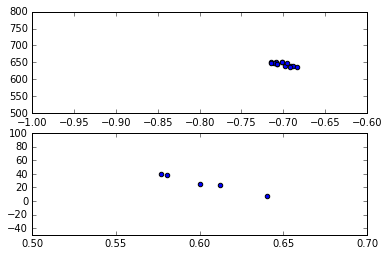

 71%|███████   | 483/682 [03:14<01:11,  2.80it/s]

[(0.60196262723451666, 26.938053577758648), (-0.70111773867286542, 644.79049410801861)]


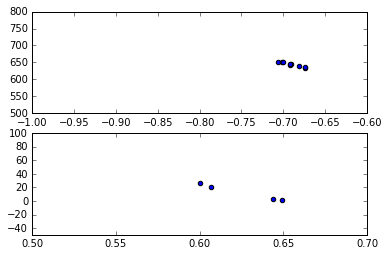

 71%|███████   | 484/682 [03:15<01:17,  2.55it/s]

[(0.62493699516922341, 13.101263265137007), (-0.69027846145613703, 643.32344074870673)]


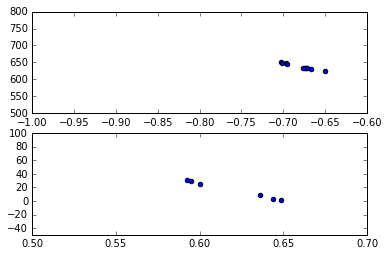

 71%|███████   | 485/682 [03:15<01:17,  2.53it/s]

[(0.6193962004839989, 16.492297877691783), (-0.68093456341079706, 637.79547497781505)]


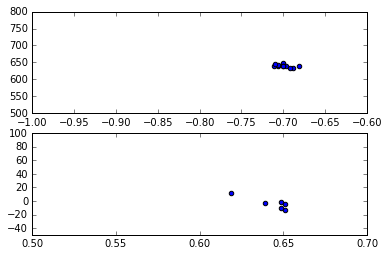

 71%|███████▏  | 486/682 [03:16<01:15,  2.61it/s]

[(0.6428770643886923, -3.6011159383252505), (-0.69944827098306217, 639.9286045114776)]


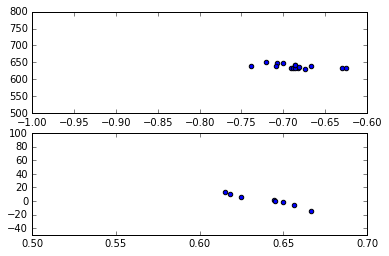

 71%|███████▏  | 487/682 [03:16<01:15,  2.57it/s]

[(0.64012210630115063, 1.0949153374349336), (-0.68587628924311128, 638.71322574811131)]


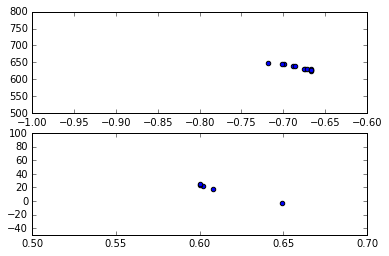

 72%|███████▏  | 488/682 [03:16<01:16,  2.55it/s]

[(0.61188858031930227, 17.4565321027731), (-0.68187117125653607, 635.18209093425605)]


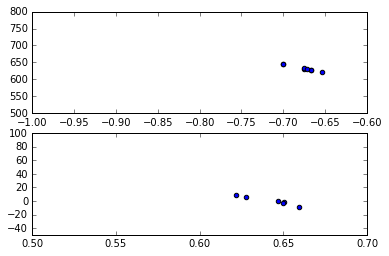

 72%|███████▏  | 489/682 [03:17<01:16,  2.53it/s]

[(0.64261796192121723, 0.047212126980828849), (-0.67619820423284072, 632.8829384825118)]


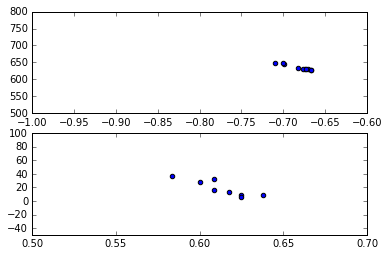

 72%|███████▏  | 490/682 [03:17<01:14,  2.56it/s]

[(0.61328784137343106, 18.870427286356808), (-0.68213030232179805, 635.04242994733215)]


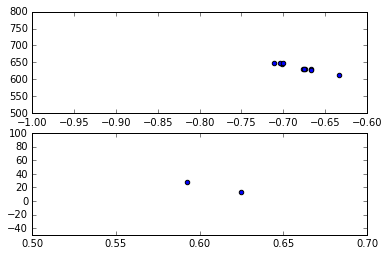

 72%|███████▏  | 491/682 [03:18<01:10,  2.69it/s]

[(0.60879629629629628, 20.291666666666686), (-0.68092692139576638, 635.43210639294045)]


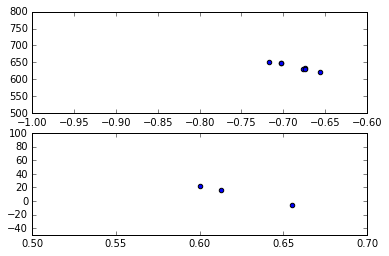

 72%|███████▏  | 492/682 [03:18<01:09,  2.73it/s]

[(0.62269187986651842, 11.11093807934742), (-0.68634769421523356, 637.56260643007602)]


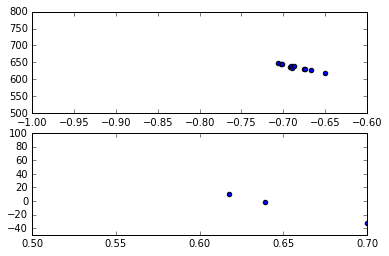

 72%|███████▏  | 493/682 [03:18<01:09,  2.72it/s]

[(0.62826797385620914, 4.5498366013071916), (-0.68504649030581832, 636.13040188579168)]


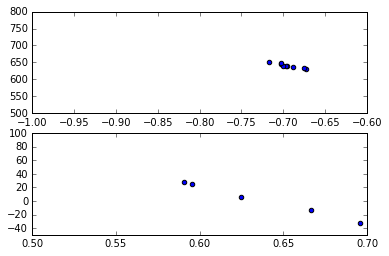

 72%|███████▏  | 494/682 [03:19<01:08,  2.74it/s]

[(0.63469320534537921, 2.9926077545642782), (-0.69455828976883061, 639.8222357695663)]


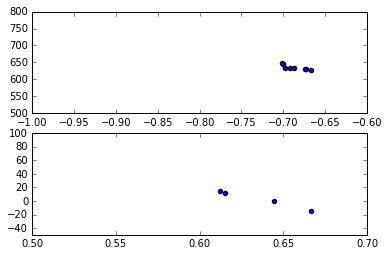

 73%|███████▎  | 495/682 [03:19<01:13,  2.55it/s]

[(0.63468515611372756, 3.0564538635967011), (-0.68828564702953943, 636.32054056213428)]


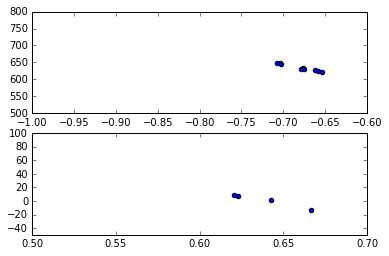

 73%|███████▎  | 496/682 [03:19<01:13,  2.55it/s]

[(0.6382910710920886, 0.7472139223128238), (-0.67990298797256632, 634.65579611278508)]


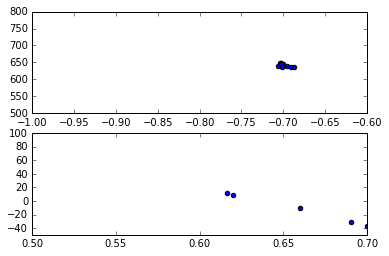

 73%|███████▎  | 497/682 [03:20<01:12,  2.54it/s]

[(0.64665821412493218, -5.3753061290115198), (-0.69918169889206816, 641.53735695570833)]


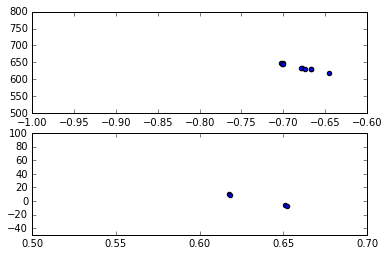

 73%|███████▎  | 498/682 [03:20<01:13,  2.52it/s]

[(0.63464954561208109, 1.6702620488572961), (-0.68132211528723574, 636.13368509180464)]


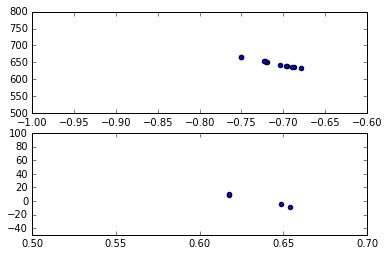

 73%|███████▎  | 499/682 [03:21<01:12,  2.51it/s]

[(0.63438329141653949, 1.3956912548984093), (-0.71135006755207586, 647.52428052393543)]


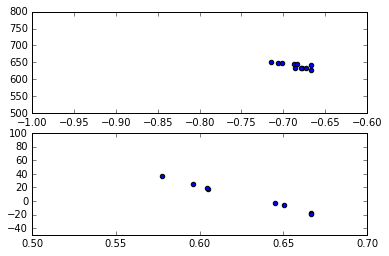

 73%|███████▎  | 500/682 [03:21<01:14,  2.46it/s]

[(0.6265862773278279, 6.7171392584758465), (-0.68560062020937895, 640.20049810454543)]


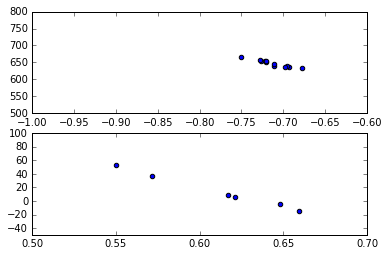

 73%|███████▎  | 501/682 [03:21<01:12,  2.49it/s]

[(0.61111558643921093, 14.125630787766719), (-0.71281396632594485, 647.35126706723202)]


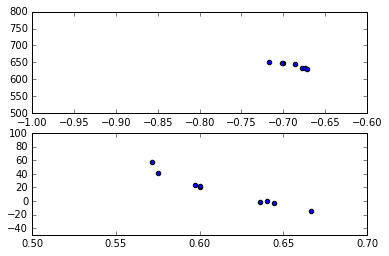

 74%|███████▎  | 502/682 [03:22<01:13,  2.45it/s]

[(0.61456950456950454, 16.198301266634612), (-0.68977952464728631, 641.06520719248499)]


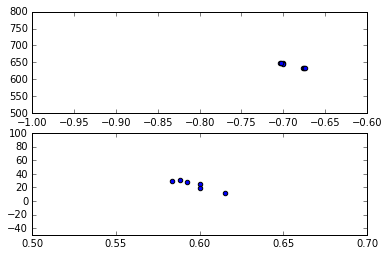

 74%|███████▍  | 503/682 [03:22<01:10,  2.54it/s]

[(0.59659097257136473, 24.308202055751064), (-0.69061481802424285, 640.71930502110661)]


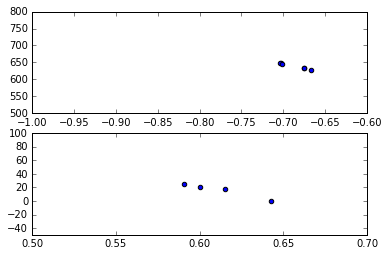

 74%|███████▍  | 504/682 [03:23<01:09,  2.57it/s]

[(0.61228771228771228, 15.691383616383604), (-0.68737732434583076, 639.09467767268973)]


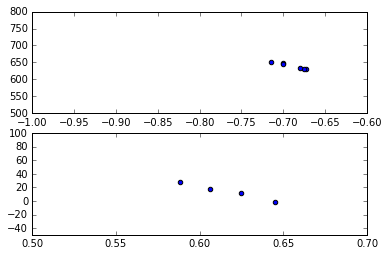

 74%|███████▍  | 505/682 [03:23<01:06,  2.66it/s]

[(0.61611429762520842, 13.72243186130757), (-0.69042908744634879, 639.63296547742846)]


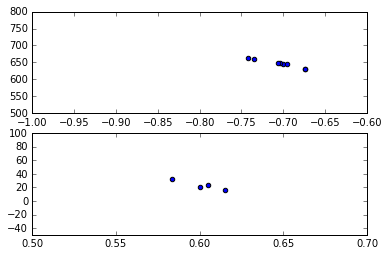

 74%|███████▍  | 506/682 [03:23<01:10,  2.51it/s]

[(0.60099527665317143, 23.284176788124142), (-0.70378481600014642, 646.51891808396181)]


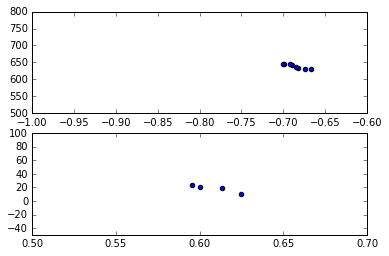

 74%|███████▍  | 507/682 [03:24<01:07,  2.59it/s]

[(0.60859526112185691, 18.425205512572546), (-0.68632314487270629, 638.46254435498679)]


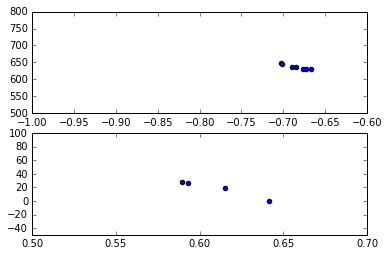

 74%|███████▍  | 508/682 [03:24<01:04,  2.70it/s]

[(0.60985002565391122, 18.704290243255301), (-0.68488954237413002, 636.28804655019974)]


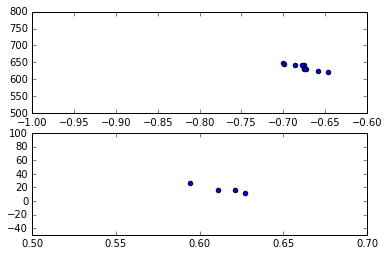

 75%|███████▍  | 509/682 [03:25<01:05,  2.66it/s]

[(0.61334795062893699, 18.06035124115914), (-0.67693045034605726, 636.00885356903007)]


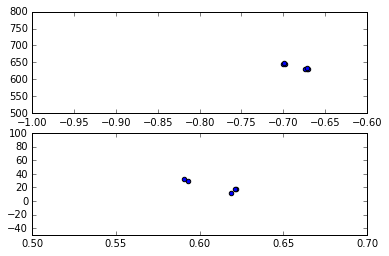

 75%|███████▍  | 510/682 [03:25<01:03,  2.72it/s]

[(0.609228661298996, 21.531438933537618), (-0.68378062435916509, 637.54523071733058)]


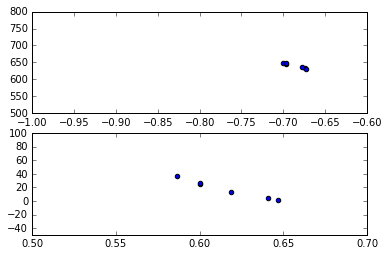

 75%|███████▍  | 511/682 [03:25<01:06,  2.58it/s]

[(0.61551500635964695, 17.781467310727436), (-0.6864188691223293, 639.52602299359557)]


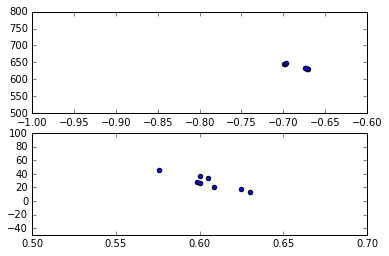

 75%|███████▌  | 512/682 [03:26<01:06,  2.57it/s]

[(0.60537587301460305, 27.853519777959129), (-0.68341117592872258, 638.14010249420028)]


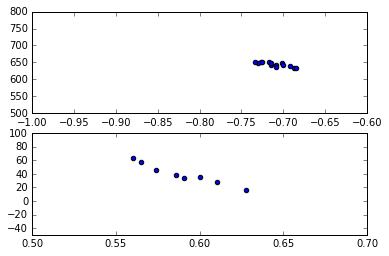

 75%|███████▌  | 513/682 [03:26<01:06,  2.54it/s]

[(0.58921798849941343, 39.985245692287712), (-0.71027170331415601, 643.86760892409472)]


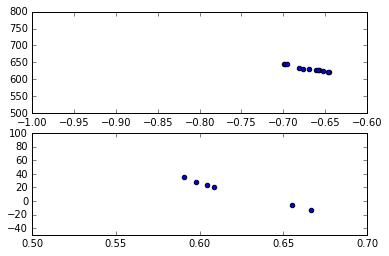

 75%|███████▌  | 514/682 [03:26<01:06,  2.52it/s]

[(0.62067218844389471, 14.588512384900818), (-0.67028049072425711, 631.37463709213228)]


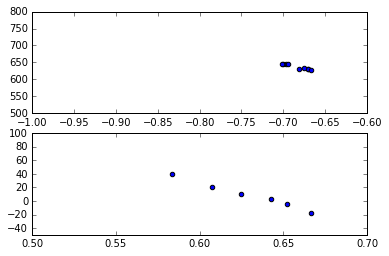

 76%|███████▌  | 515/682 [03:27<01:04,  2.61it/s]

[(0.62952898550724634, 8.7826518288474826), (-0.68420636304143512, 636.44222512720842)]


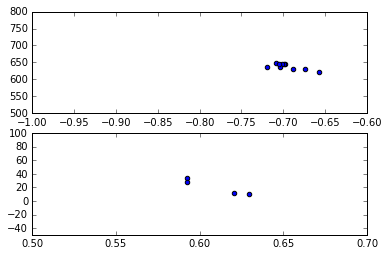

 76%|███████▌  | 516/682 [03:27<01:02,  2.66it/s]

[(0.60887611749680715, 20.91155810983399), (-0.69552214037928273, 638.1756149745712)]


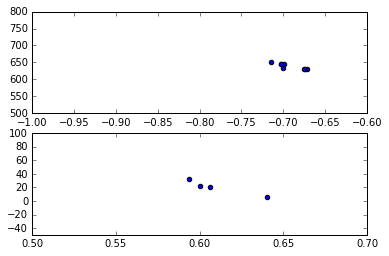

 76%|███████▌  | 517/682 [03:28<01:15,  2.19it/s]

[(0.60995265151515154, 20.393390151515163), (-0.69253407417975721, 638.37628671338302)]


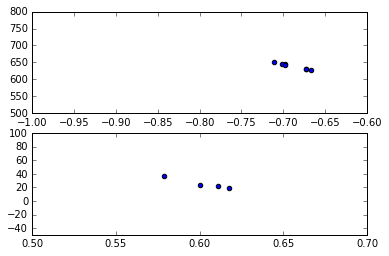

 76%|███████▌  | 518/682 [03:28<01:19,  2.06it/s]

[(0.60192638458892334, 25.063811489508069), (-0.68867744664279829, 638.68933114234494)]


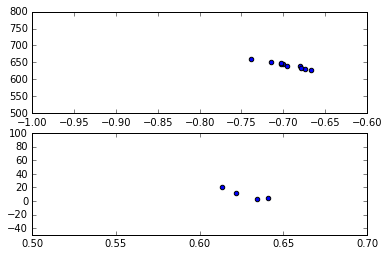

 76%|███████▌  | 519/682 [03:29<01:25,  1.91it/s]

[(0.62760749193676024, 9.9642837661130272), (-0.69544551837319823, 641.74832710527676)]


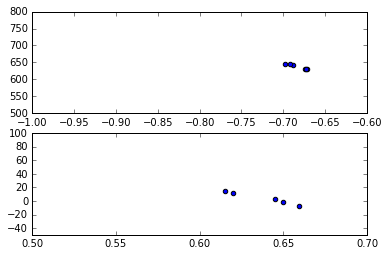

 76%|███████▌  | 520/682 [03:29<01:17,  2.09it/s]

[(0.63802407475846046, 3.8697853334037178), (-0.68282312735474626, 636.99369375307595)]


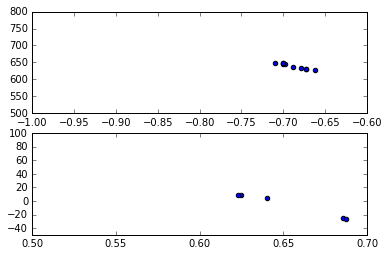

 76%|███████▋  | 521/682 [03:30<01:13,  2.20it/s]

[(0.65223302107728343, -6.0514156908665084), (-0.68846878255516852, 638.91864151687071)]


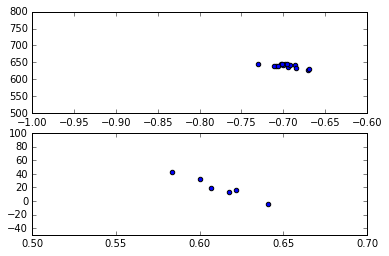

 77%|███████▋  | 522/682 [03:30<01:23,  1.91it/s]

[(0.61169750530888434, 20.045644615389079), (-0.69663071773716645, 640.04906381505452)]


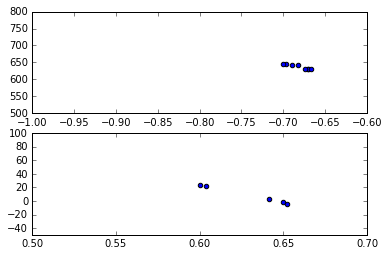

 77%|███████▋  | 523/682 [03:31<01:17,  2.06it/s]

[(0.62948773138183378, 8.4001463624623405), (-0.68131033648886763, 636.47834089841808)]


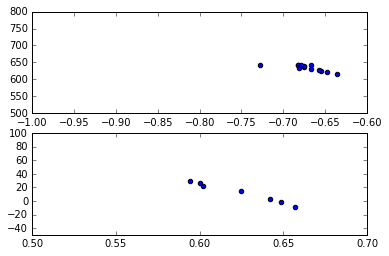

 77%|███████▋  | 524/682 [03:31<01:12,  2.19it/s]

[(0.62416492266116319, 12.317792220987696), (-0.67171263760274635, 633.47793258866)]


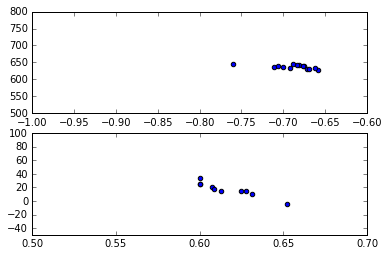

 77%|███████▋  | 525/682 [03:32<01:05,  2.38it/s]

[(0.61649455759272775, 17.155060760555795), (-0.6883443070912022, 637.09420429993156)]


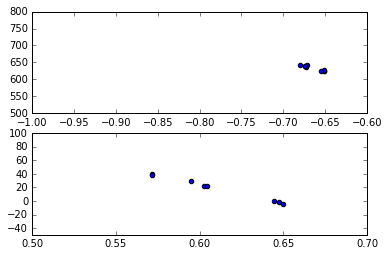

 77%|███████▋  | 526/682 [03:32<01:01,  2.55it/s]

[(0.61085483999728185, 18.328289494786596), (-0.66475993803763633, 633.32281667827851)]


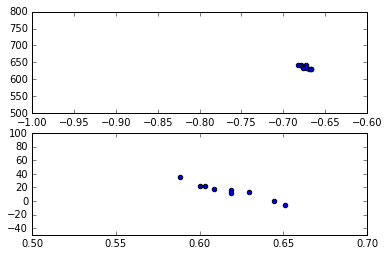

 77%|███████▋  | 527/682 [03:32<01:00,  2.56it/s]

[(0.61815973914812772, 14.71569721548506), (-0.67386384358474272, 636.49982156110377)]


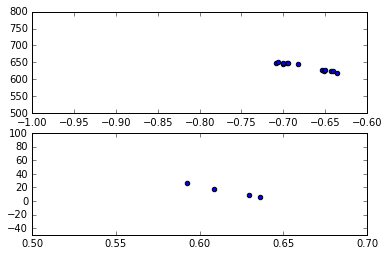

 77%|███████▋  | 528/682 [03:33<01:01,  2.49it/s]

[(0.61682037768994291, 14.977785097350321), (-0.67399713562756702, 636.77627632311226)]


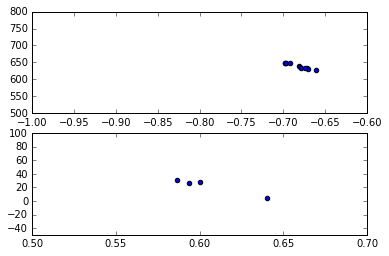

 78%|███████▊  | 529/682 [03:33<00:59,  2.55it/s]

[(0.6049892241379311, 22.26173491379312), (-0.68213562296838581, 638.6640032072512)]


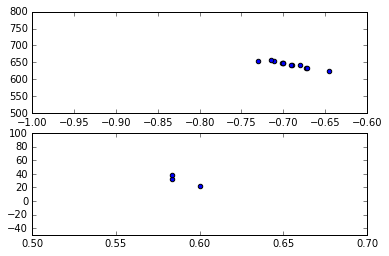

 78%|███████▊  | 530/682 [03:33<00:58,  2.59it/s]

[(0.58888888888888891, 30.850000000000005), (-0.6923127818215723, 643.62103946604577)]


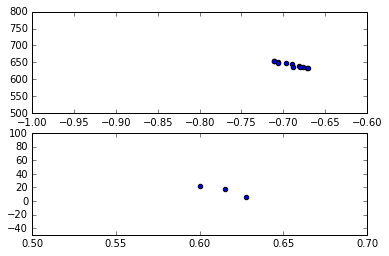

 78%|███████▊  | 531/682 [03:34<00:56,  2.68it/s]

[(0.61443053070960041, 15.160524746571241), (-0.69082760561455536, 642.68620650685341)]


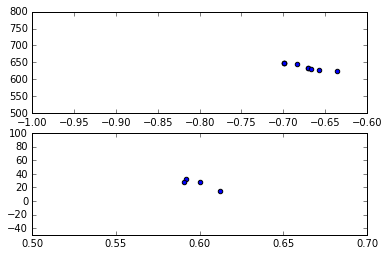

 78%|███████▊  | 532/682 [03:34<00:54,  2.74it/s]

[(0.59874768089053798, 25.977597402597397), (-0.67591478237122382, 637.46337504021869)]


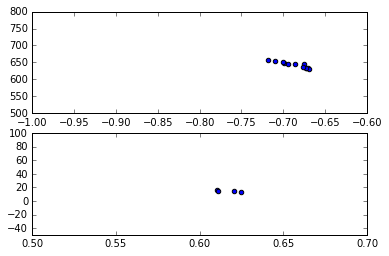

 78%|███████▊  | 533/682 [03:35<00:56,  2.64it/s]

[(0.61674256445223719, 14.533837424508079), (-0.68700322675696279, 642.78027681972992)]


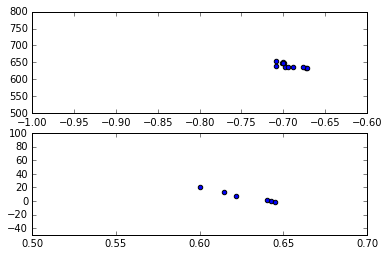

 78%|███████▊  | 534/682 [03:35<00:55,  2.65it/s]

[(0.62732096151450989, 7.0231901025449206), (-0.69331112155054475, 641.70914898473166)]


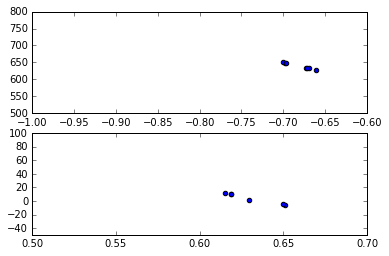

 78%|███████▊  | 535/682 [03:35<00:55,  2.67it/s]

[(0.63071204563452621, 3.6840824980359721), (-0.6812717742814467, 639.00330555943435)]


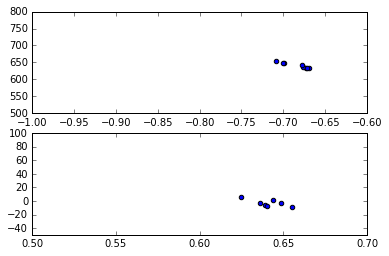

 79%|███████▊  | 536/682 [03:36<00:54,  2.66it/s]

[(0.64116305490063519, -2.9141404946431231), (-0.68446621515565231, 641.20678121524475)]


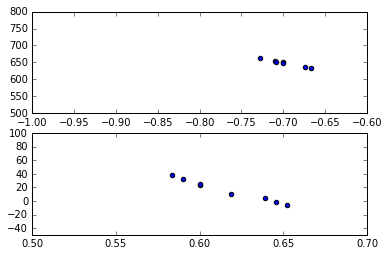

 79%|███████▊  | 537/682 [03:36<00:55,  2.61it/s]

[(0.61621867231661875, 15.901191548878586), (-0.6981042517298649, 647.87690106249431)]


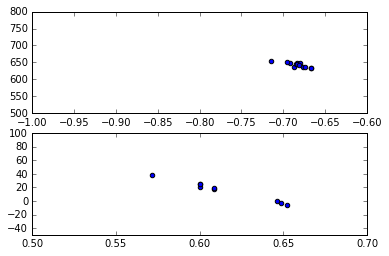

 79%|███████▉  | 538/682 [03:36<00:53,  2.71it/s]

[(0.6150403484762853, 15.518535493833687), (-0.68369313967719914, 642.96138092498336)]


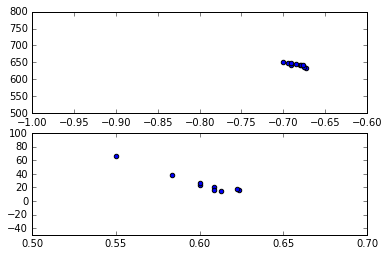

 79%|███████▉  | 539/682 [03:37<00:55,  2.56it/s]

[(0.60102518989849507, 26.914500298067381), (-0.68446437309578179, 643.5264192268653)]


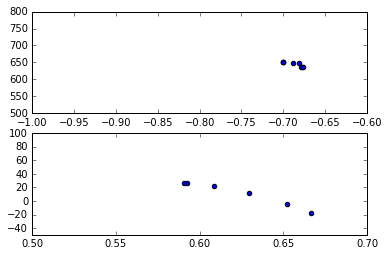

 79%|███████▉  | 540/682 [03:37<00:55,  2.55it/s]

[(0.6234445908358951, 10.588249646220666), (-0.68798890325426831, 644.88489334498945)]


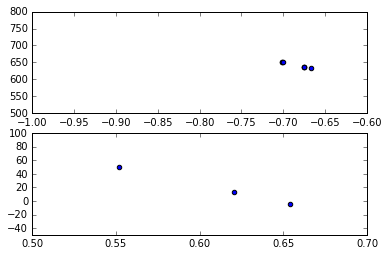

 79%|███████▉  | 541/682 [03:38<00:55,  2.55it/s]

[(0.60875331564986734, 19.835101679929267), (-0.68491216876891792, 642.2957113526187)]


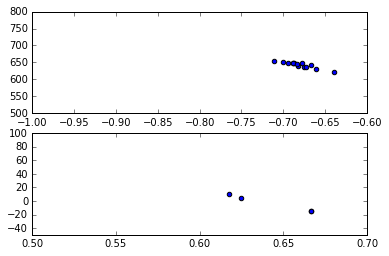

 79%|███████▉  | 542/682 [03:38<00:53,  2.64it/s]

[(0.64399509803921562, -3.5428921568627487), (-0.68088309717567941, 642.48446940237295)]


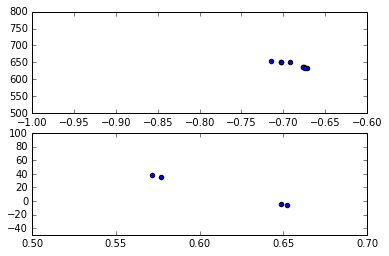

 80%|███████▉  | 543/682 [03:38<00:51,  2.70it/s]

[(0.61229355251094386, 15.649969008664669), (-0.68715631600289517, 642.32449117234819)]


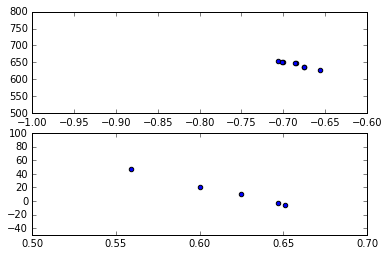

 80%|███████▉  | 544/682 [03:39<00:52,  2.64it/s]

[(0.61640902872777015, 13.660971272229812), (-0.68573621253166706, 643.51471258936192)]


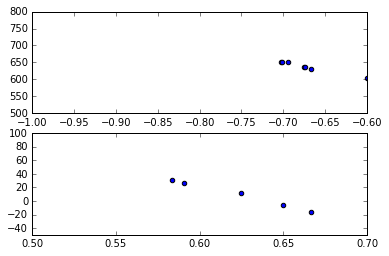

 80%|███████▉  | 545/682 [03:39<00:52,  2.63it/s]

[(0.62318181818181817, 9.3169696969696929), (-0.68578178396090939, 642.66568249528643)]


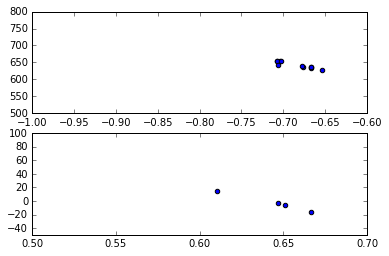

 80%|████████  | 546/682 [03:39<00:50,  2.69it/s]

[(0.6436721581287882, -2.8780483944990607), (-0.68505879444871198, 641.93366456383853)]


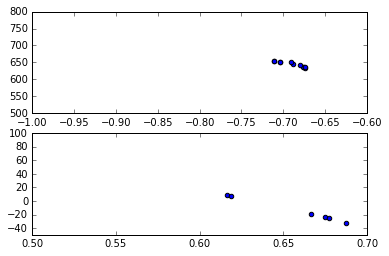

 80%|████████  | 547/682 [03:40<00:51,  2.64it/s]

[(0.65701199945289646, -13.975694795151819), (-0.69011310124187675, 644.74155201717326)]


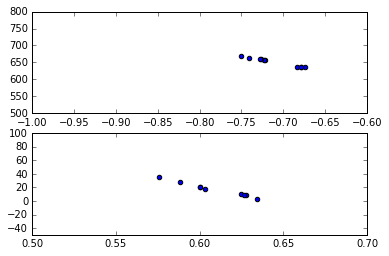

 80%|████████  | 548/682 [03:40<00:51,  2.60it/s]

[(0.60893682906356283, 17.097007247672007), (-0.71051037152649288, 651.11361762685658)]


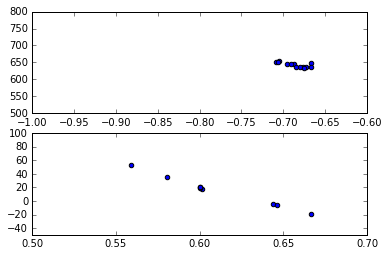

 80%|████████  | 549/682 [03:41<00:52,  2.54it/s]

[(0.6108732528359202, 15.411599901757704), (-0.68590861433939376, 642.88089662910227)]


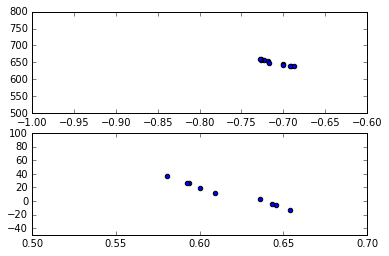

 81%|████████  | 550/682 [03:41<00:53,  2.46it/s]

[(0.61728366856211647, 11.118969122860285), (-0.70993037647456769, 649.05999711593415)]


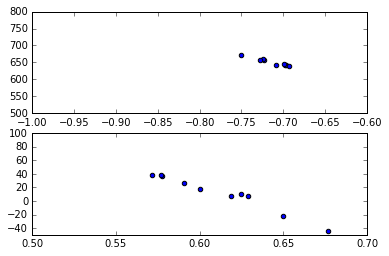

 81%|████████  | 551/682 [03:42<00:53,  2.46it/s]

[(0.6116422703702874, 11.761320633749381), (-0.71332544199354375, 650.58434517057003)]


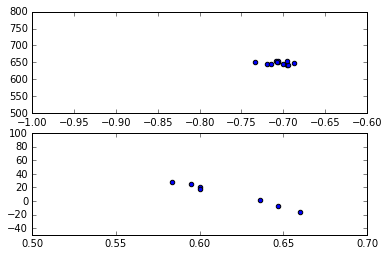

 81%|████████  | 552/682 [03:42<00:52,  2.50it/s]

[(0.61733576968871084, 9.8316066180772008), (-0.70586930287959504, 648.19301716964537)]


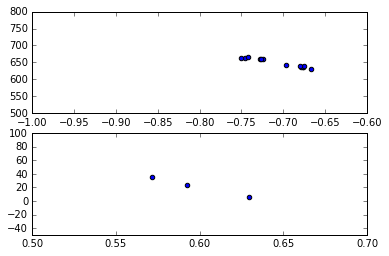

 81%|████████  | 553/682 [03:42<00:52,  2.48it/s]

[(0.59788359788359779, 21.560846560846585), (-0.7052404755925985, 648.70685049439794)]


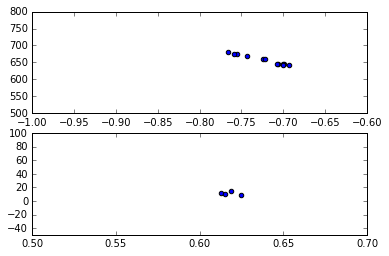

 81%|████████  | 554/682 [03:43<00:50,  2.54it/s]

[(0.6180838650596715, 11.502407538697852), (-0.7230335474884817, 656.70630245260463)]


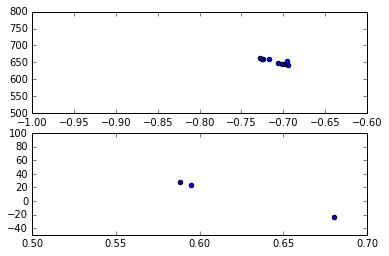

 81%|████████▏ | 555/682 [03:43<00:51,  2.48it/s]

[(0.62094329623741384, 8.9176894541600209), (-0.71000087224188824, 652.87140261660034)]


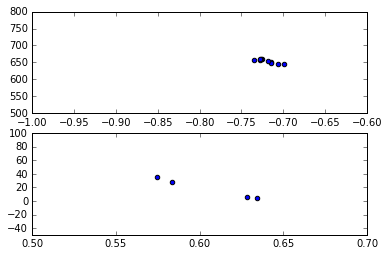

 82%|████████▏ | 556/682 [03:43<00:48,  2.59it/s]

[(0.6051297971186399, 18.516453221143138), (-0.71942491623560134, 653.54837523580431)]


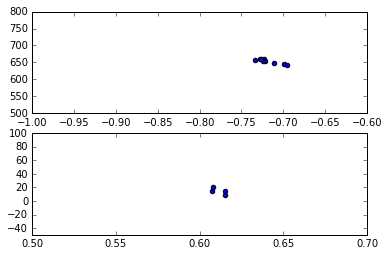

 82%|████████▏ | 557/682 [03:44<00:47,  2.64it/s]

[(0.61143880629174752, 14.347325468649004), (-0.71813929289203082, 653.08378028793118)]


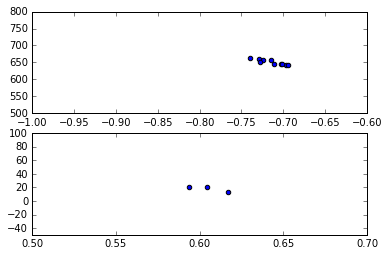

 82%|████████▏ | 558/682 [03:44<00:47,  2.61it/s]

[(0.60502260981912148, 18.491359819121442), (-0.71416254555156156, 650.31680392446526)]


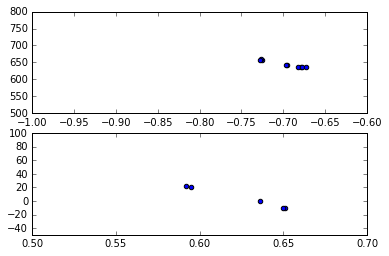

 82%|████████▏ | 559/682 [03:45<00:47,  2.58it/s]

[(0.624913679815993, 4.6760862877884168), (-0.69813413351229336, 645.35890288676046)]


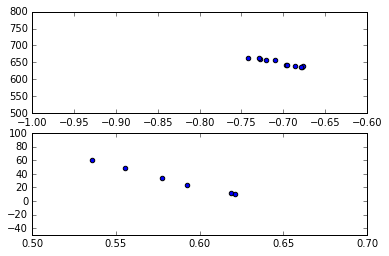

 82%|████████▏ | 560/682 [03:45<00:47,  2.58it/s]

[(0.58348942586745067, 31.390834866719246), (-0.70368349804034835, 648.58466260783382)]


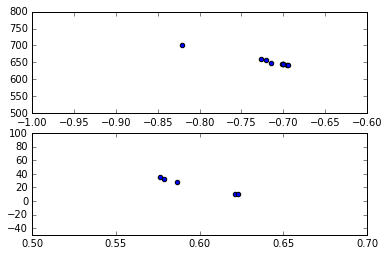

 82%|████████▏ | 561/682 [03:45<00:49,  2.46it/s]

[(0.59706880260421402, 23.1750823223196), (-0.71754568438988175, 652.98163599370787)]


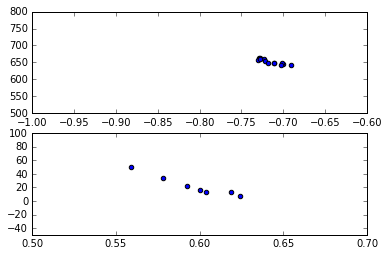

 82%|████████▏ | 562/682 [03:46<00:46,  2.57it/s]

[(0.59656236351904668, 22.262077032979203), (-0.7151399253636247, 652.21540119174438)]


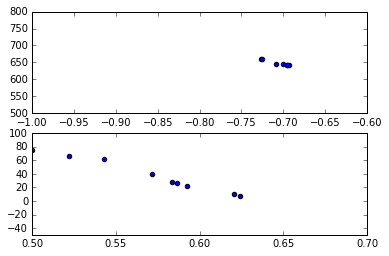

 83%|████████▎ | 563/682 [03:46<00:45,  2.61it/s]

[(0.58029765607221151, 33.072289950390335), (-0.7064677431948837, 648.44997262186371)]


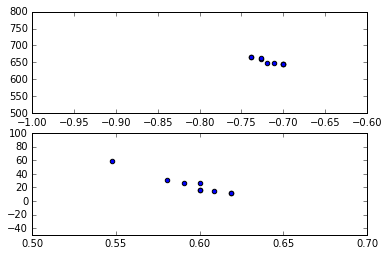

 83%|████████▎ | 564/682 [03:47<00:45,  2.62it/s]

[(0.59621824334306794, 23.774270117187353), (-0.71797648447897122, 653.55133762156231)]


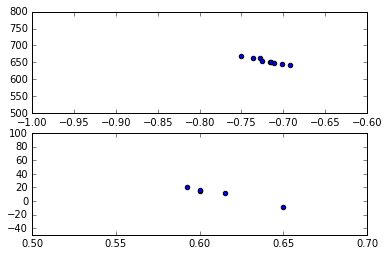

 83%|████████▎ | 565/682 [03:47<00:44,  2.61it/s]

[(0.61159544159544166, 10.991538461538459), (-0.71937845933651734, 654.35591988309636)]


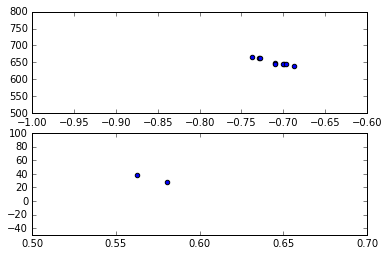

 83%|████████▎ | 566/682 [03:47<00:47,  2.47it/s]

[(0.57157258064516125, 32.694556451612897), (-0.71077461750860638, 651.02902782054389)]


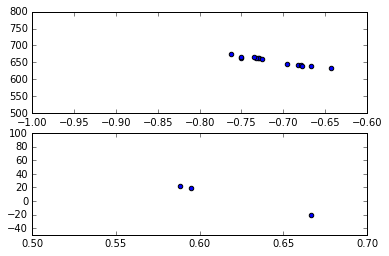

 83%|████████▎ | 567/682 [03:48<00:46,  2.45it/s]

[(0.61649885179296948, 6.7417417417417482), (-0.71132898367408337, 654.05689367183027)]


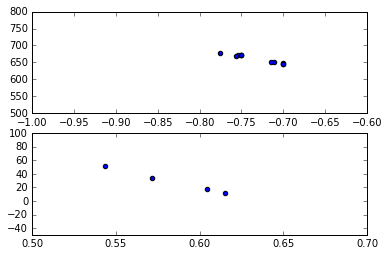

 83%|████████▎ | 568/682 [03:48<00:50,  2.25it/s]

[(0.58373565261836236, 28.65529339214882), (-0.73292452460705304, 660.87065997169566)]


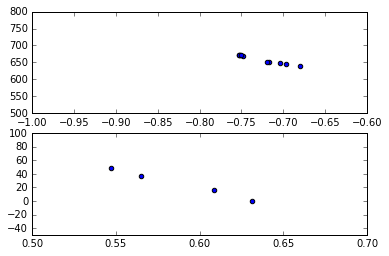

 83%|████████▎ | 569/682 [03:49<00:51,  2.18it/s]

[(0.5881654505418592, 25.600762056906007), (-0.72735643674214834, 659.28281520788903)]


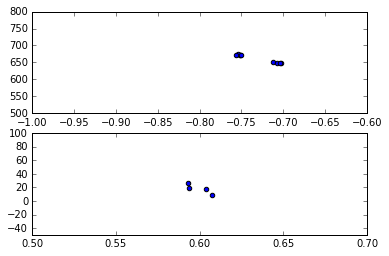

 84%|████████▎ | 570/682 [03:49<00:48,  2.29it/s]

[(0.59947169525789201, 18.273114849353576), (-0.73209368742093472, 661.59479280669848)]


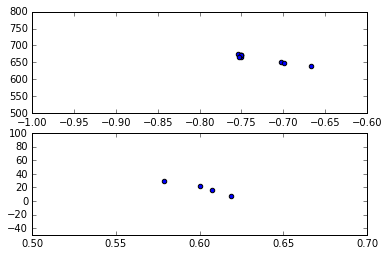

 84%|████████▎ | 571/682 [03:50<00:45,  2.43it/s]

[(0.60128446115288225, 18.484461152882204), (-0.73283745294458602, 663.11556184346705)]


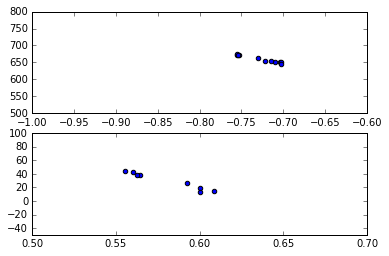

 84%|████████▍ | 572/682 [03:50<00:46,  2.38it/s]

[(0.58043079555307819, 29.868236792394391), (-0.7275779915485967, 660.22380547308126)]


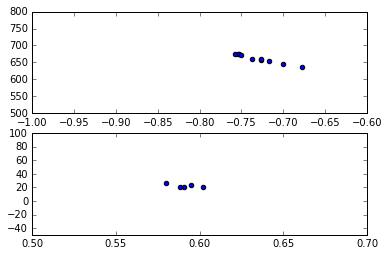

 84%|████████▍ | 573/682 [03:50<00:44,  2.43it/s]

[(0.59111476310223376, 22.569629682816025), (-0.73004420042539464, 660.256519598924)]


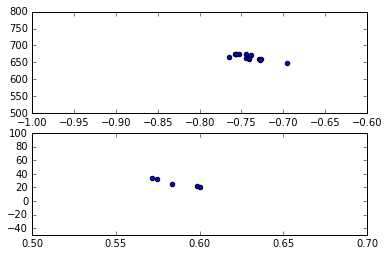

 84%|████████▍ | 574/682 [03:51<00:44,  2.41it/s]

[(0.58558284007892081, 26.898069108942572), (-0.74115904455868198, 665.62235503623367)]


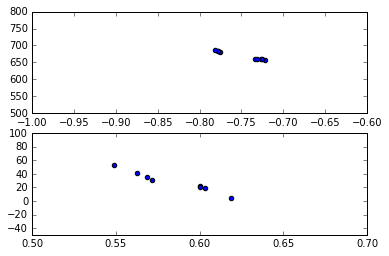

 84%|████████▍ | 575/682 [03:51<00:47,  2.25it/s]

[(0.58422473155929033, 28.38724177170868), (-0.75025377822660788, 669.9843305066853)]


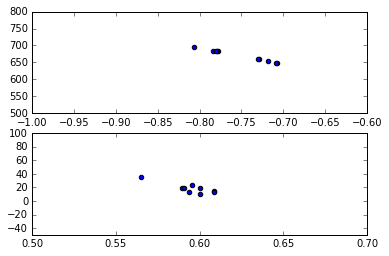

 84%|████████▍ | 576/682 [03:52<00:46,  2.30it/s]

[(0.59467323542494521, 18.704374388909685), (-0.75233783956744438, 670.20031598373907)]


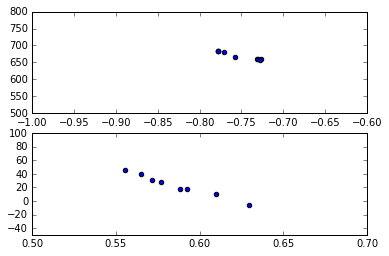

 85%|████████▍ | 577/682 [03:52<00:44,  2.34it/s]

[(0.58616727613904951, 23.003445187611803), (-0.75321766048927674, 669.68869387559744)]


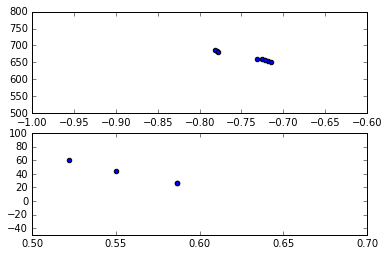

 85%|████████▍ | 578/682 [03:53<00:41,  2.48it/s]

[(0.56103823088455762, 39.719396551724145), (-0.74365834649805773, 666.01967760608511)]


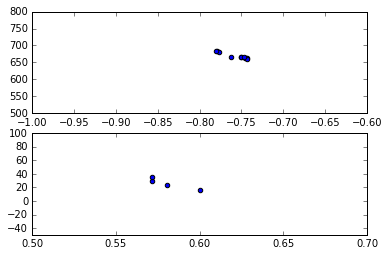

 85%|████████▍ | 579/682 [03:53<00:41,  2.51it/s]

[(0.58087557603686635, 26.292165898617512), (-0.75658168198461562, 668.96213154836312)]


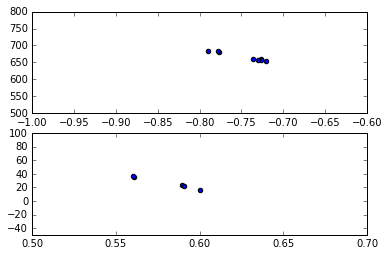

 85%|████████▌ | 580/682 [03:53<00:39,  2.57it/s]

[(0.58032565808175574, 27.040672010915898), (-0.74819961652320843, 666.7277181777896)]


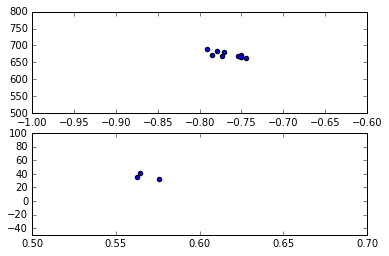

 85%|████████▌ | 581/682 [03:54<00:38,  2.63it/s]

[(0.56745337995337997, 36.44988344988343), (-0.76477410605830487, 672.47819882244073)]


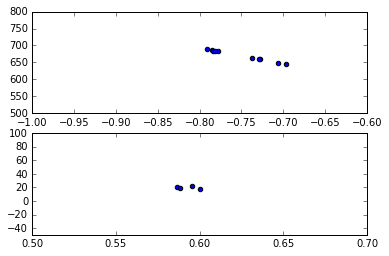

 85%|████████▌ | 582/682 [03:54<00:36,  2.71it/s]

[(0.59242007147686659, 19.435103351685513), (-0.75182044836308159, 669.95252731264316)]


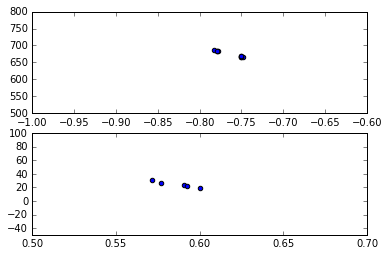

 85%|████████▌ | 583/682 [03:55<00:49,  1.99it/s]

[(0.58637066637066637, 24.389156029156037), (-0.76305729216002016, 674.18629384926271)]


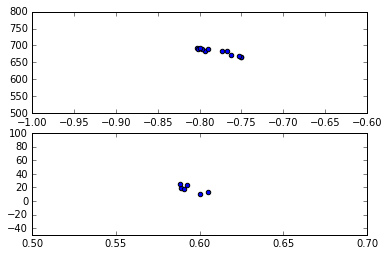

 86%|████████▌ | 584/682 [03:55<00:53,  1.82it/s]

[(0.59434020523407971, 18.305417935236836), (-0.77833829807608745, 681.30633903631053)]


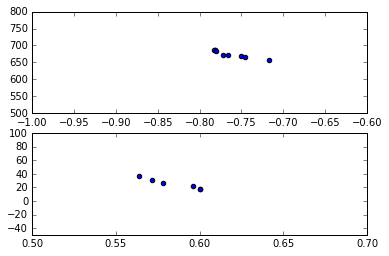

 86%|████████▌ | 585/682 [03:56<00:49,  1.95it/s]

[(0.58486673876582129, 25.103200240126863), (-0.76427940887318946, 674.85756730251569)]


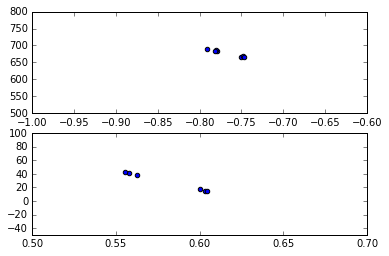

 86%|████████▌ | 586/682 [03:56<00:45,  2.09it/s]

[(0.5805904386098244, 28.401927534579727), (-0.76824197891659984, 677.68770141110906)]


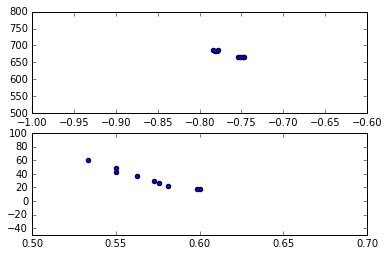

 86%|████████▌ | 587/682 [03:57<00:48,  1.98it/s]

[(0.56935859776371844, 33.706697432738757), (-0.76534628328991228, 676.07178818070167)]


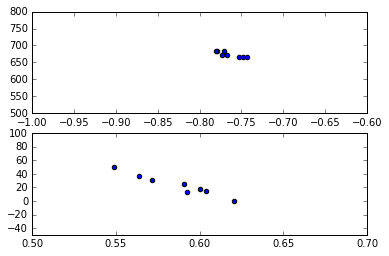

 86%|████████▌ | 588/682 [03:57<00:44,  2.12it/s]

[(0.58648493564822168, 23.397174031530007), (-0.76469390680677019, 673.98697782462159)]


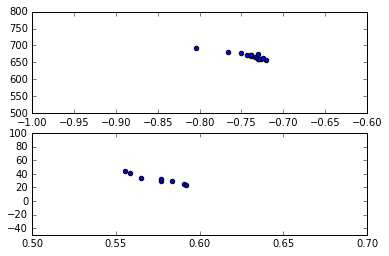

 86%|████████▋ | 589/682 [03:58<00:40,  2.31it/s]

[(0.57485472431576001, 32.7241486024528), (-0.74043776328130229, 669.11216035285099)]


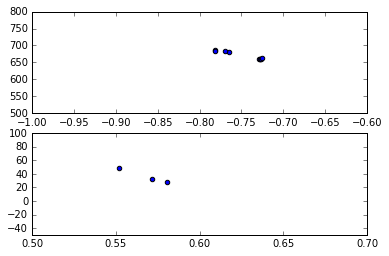

 87%|████████▋ | 590/682 [03:58<00:38,  2.41it/s]

[(0.56793262354997609, 36.499020075215846), (-0.74819033433135262, 670.51207550743175)]


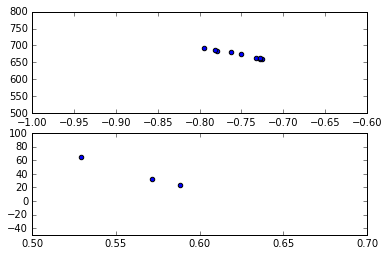

 87%|████████▋ | 591/682 [03:58<00:36,  2.51it/s]

[(0.56302521008403361, 40.400560224089645), (-0.75343370027645651, 673.80518693601289)]


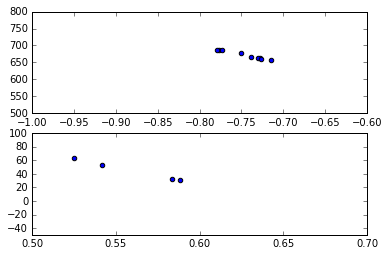

 87%|████████▋ | 592/682 [03:59<00:33,  2.65it/s]

[(0.55955882352941178, 44.925735294117629), (-0.74628115353603219, 671.45839221687481)]


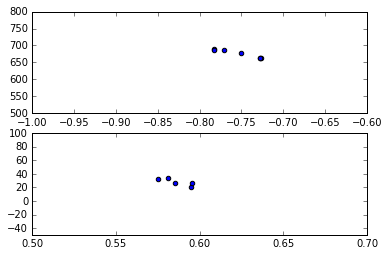

 87%|████████▋ | 593/682 [03:59<00:33,  2.64it/s]

[(0.58631877846568714, 27.913100264189314), (-0.75254435320515145, 675.0523726687145)]


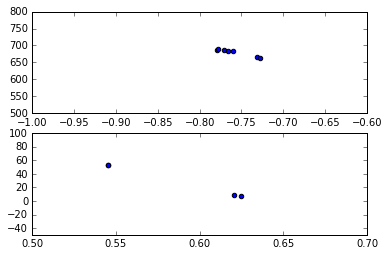

 87%|████████▋ | 594/682 [03:59<00:33,  2.66it/s]

[(0.58414968652037613, 30.657425548589345), (-0.75895259368527435, 679.42798653377304)]


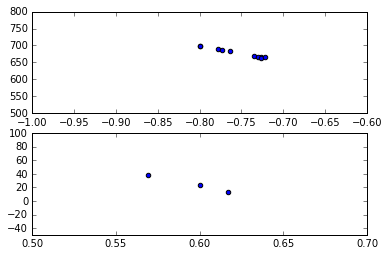

 87%|████████▋ | 595/682 [04:00<00:32,  2.68it/s]

[(0.59529914529914529, 25.517094017094013), (-0.7554329468261356, 678.55046630012566)]


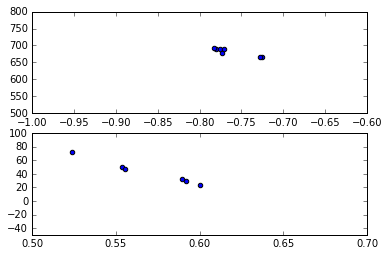

 87%|████████▋ | 596/682 [04:00<00:32,  2.66it/s]

[(0.56917668101878627, 42.851830430777788), (-0.76230363084388497, 680.9173558000299)]


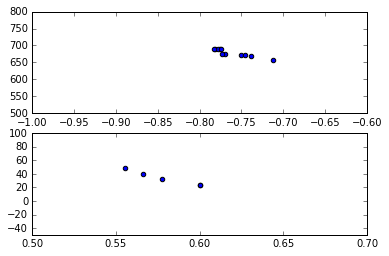

 88%|████████▊ | 597/682 [04:00<00:30,  2.80it/s]

[(0.57978257580669568, 33.591263264820938), (-0.76192880222055104, 678.75317900179209)]


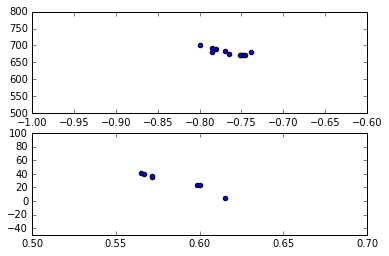

 88%|████████▊ | 598/682 [04:01<00:30,  2.79it/s]

[(0.58406949599292535, 29.280820011539909), (-0.76685998322671944, 681.57177945442982)]


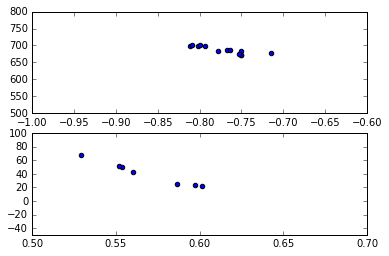

 88%|████████▊ | 599/682 [04:01<00:30,  2.70it/s]

[(0.56851157362186167, 40.531119849479715), (-0.77262239350678463, 687.04536260192253)]


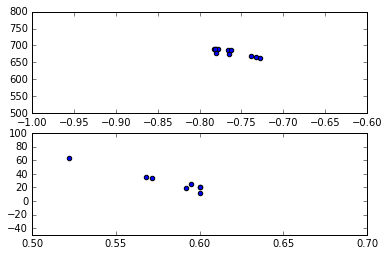

 88%|████████▊ | 600/682 [04:02<00:30,  2.71it/s]

[(0.58097260616670554, 28.9214565179239), (-0.76307958315931113, 679.96862805858325)]


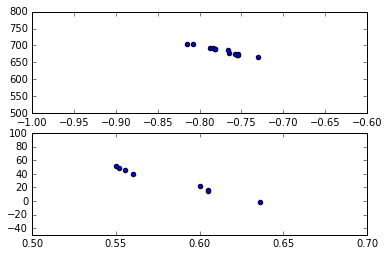

 88%|████████▊ | 601/682 [04:02<00:29,  2.73it/s]

[(0.58293998413251291, 30.009001654475775), (-0.7722907436903651, 683.87725591707556)]


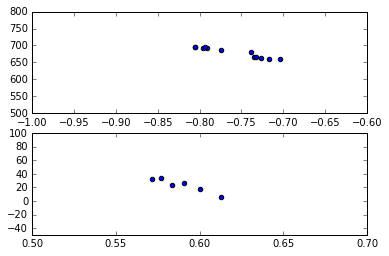

 88%|████████▊ | 602/682 [04:02<00:29,  2.72it/s]

[(0.58924954973342059, 23.69071197619586), (-0.76010023867547316, 679.50833970720487)]


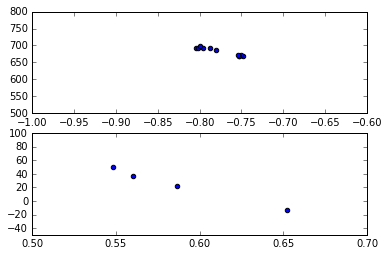

 88%|████████▊ | 603/682 [04:03<00:28,  2.82it/s]

[(0.58669197659234906, 24.135703922232452), (-0.77549057747576133, 682.3406704814297)]


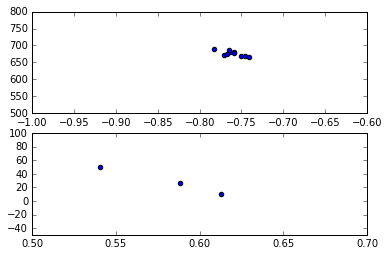

 89%|████████▊ | 604/682 [04:03<00:27,  2.83it/s]

[(0.58055968682154635, 28.726396225447445), (-0.76043647938730485, 676.4487276403521)]


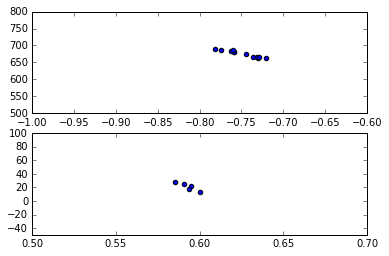

 89%|████████▊ | 605/682 [04:03<00:27,  2.78it/s]

[(0.59292390783244442, 21.362054593396046), (-0.74908023133355772, 675.16388774313327)]


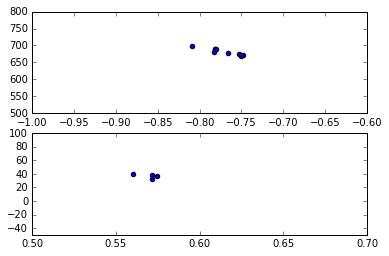

 89%|████████▉ | 606/682 [04:04<00:26,  2.91it/s]

[(0.56933130699088141, 36.822978723404262), (-0.77034545750513639, 681.10083162838248)]


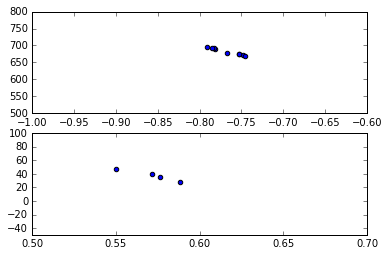

 89%|████████▉ | 607/682 [04:04<00:26,  2.87it/s]

[(0.57148376299672421, 37.527453354223042), (-0.76748998377974975, 681.70678401074497)]


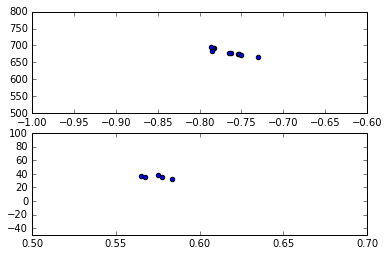

 89%|████████▉ | 608/682 [04:04<00:26,  2.83it/s]

[(0.57363593849491068, 35.440227018611779), (-0.76523709916005767, 680.2301292809226)]


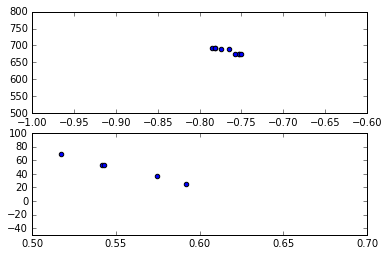

 89%|████████▉ | 609/682 [04:05<00:25,  2.82it/s]

[(0.55371661913404191, 47.841279923947823), (-0.76703277089734001, 683.80465336457132)]


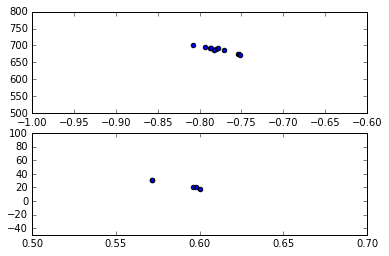

 89%|████████▉ | 610/682 [04:05<00:26,  2.69it/s]

[(0.58742836602649684, 24.24550272157752), (-0.77676083069909185, 687.17098050733193)]


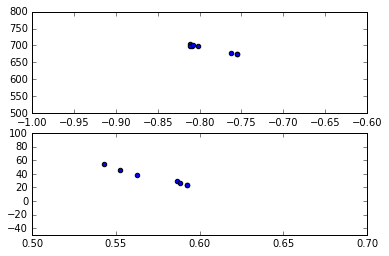

 90%|████████▉ | 611/682 [04:06<00:26,  2.67it/s]

[(0.57389378782503031, 34.540736889340074), (-0.78930311698551414, 691.23267476310662)]


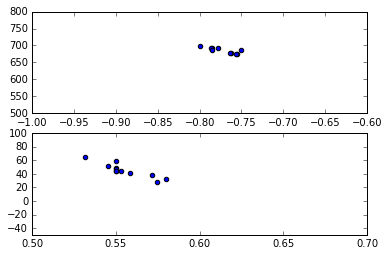

 90%|████████▉ | 612/682 [04:06<00:25,  2.76it/s]

[(0.5553035309302049, 45.734510603463008), (-0.77221223945063211, 685.56109107207863)]


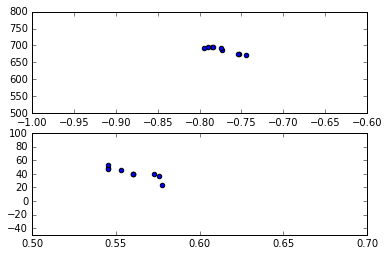

 90%|████████▉ | 613/682 [04:06<00:24,  2.85it/s]

[(0.55959060132412763, 41.335814071305911), (-0.77272302261935844, 686.27484002220876)]


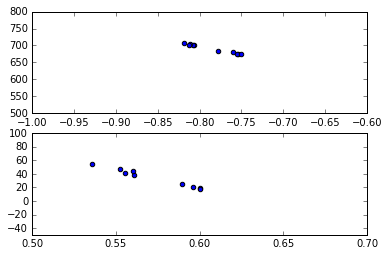

 90%|█████████ | 614/682 [04:07<00:23,  2.94it/s]

[(0.57225739893476302, 34.432542307056629), (-0.78541228953599096, 690.41539709364201)]


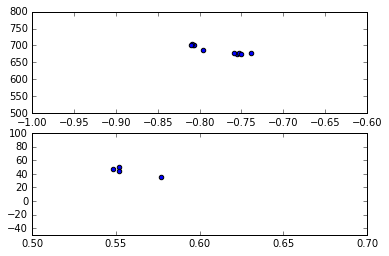

 90%|█████████ | 615/682 [04:07<00:23,  2.89it/s]

[(0.55718961238983478, 44.06173526140158), (-0.77865962027655022, 687.37050644666817)]


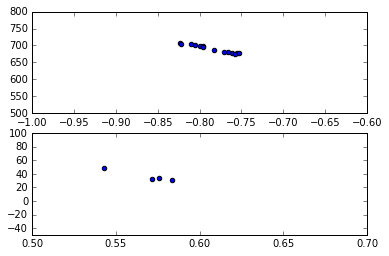

 90%|█████████ | 616/682 [04:07<00:24,  2.73it/s]

[(0.56834415584415587, 36.805357142857147), (-0.78580178439180526, 689.98186889180772)]


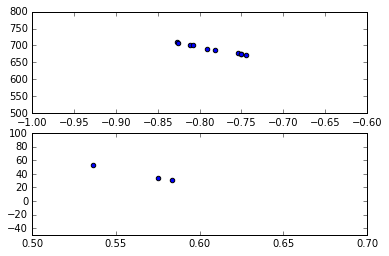

 90%|█████████ | 617/682 [04:08<00:22,  2.94it/s]

[(0.56497289972899722, 39.622831978319766), (-0.78427562740704793, 689.08579908361571)]


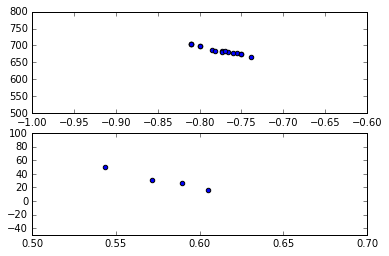

 91%|█████████ | 618/682 [04:08<00:21,  2.91it/s]

[(0.57747839498411579, 31.082917368672526), (-0.77710507028610254, 685.97781633140289)]


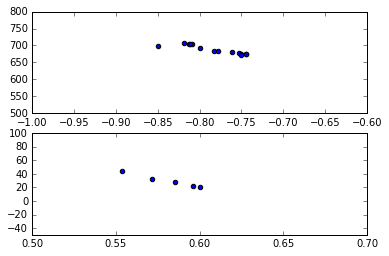

 91%|█████████ | 619/682 [04:08<00:21,  2.99it/s]

[(0.58130393996247653, 29.230581613508456), (-0.78316430216077293, 687.90186661039365)]


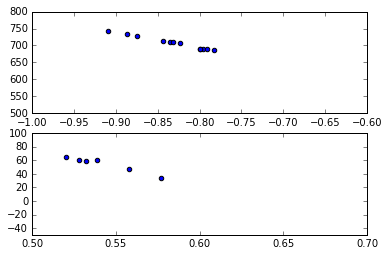

 91%|█████████ | 620/682 [04:09<00:20,  3.00it/s]

[(0.54212826574528694, 54.535346729708429), (-0.83107763922962408, 707.62561175599842)]


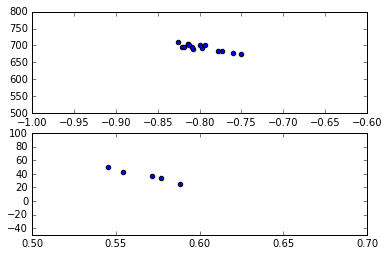

 91%|█████████ | 621/682 [04:09<00:20,  2.97it/s]

[(0.56725167107874408, 37.927446472733514), (-0.79820697727288092, 693.9398517524595)]


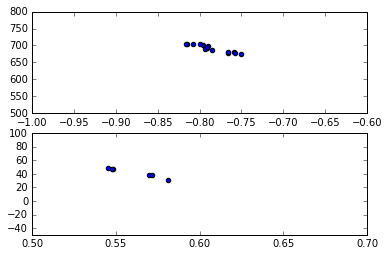

 91%|█████████ | 622/682 [04:09<00:20,  3.00it/s]

[(0.56066240606938278, 41.836205867775639), (-0.78583441009751698, 691.29555994912164)]


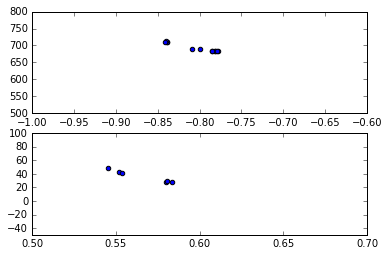

 91%|█████████▏| 623/682 [04:10<00:19,  3.06it/s]

[(0.56577176838655807, 36.391942631294221), (-0.80501711786456742, 693.65260356202782)]


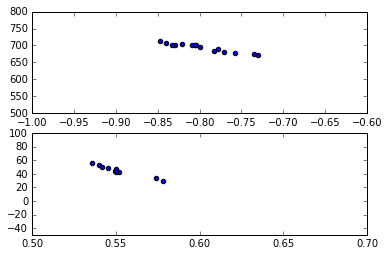

 91%|█████████▏| 624/682 [04:10<00:19,  2.94it/s]

[(0.55158083512087974, 44.717853044866388), (-0.79643711302114395, 693.57399163666196)]


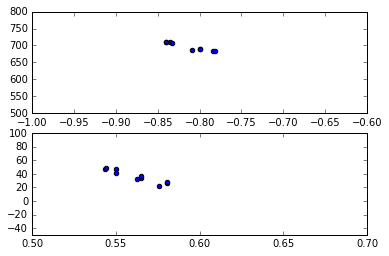

 92%|█████████▏| 625/682 [04:10<00:18,  3.05it/s]

[(0.56170522066129347, 36.573716930713914), (-0.81371893593769029, 696.33580368874618)]


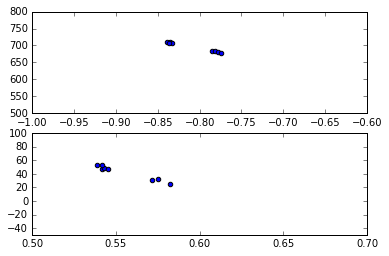

 92%|█████████▏| 626/682 [04:11<00:17,  3.12it/s]

[(0.55485170156847374, 42.015975783183087), (-0.80818721547186612, 694.95008489336533)]


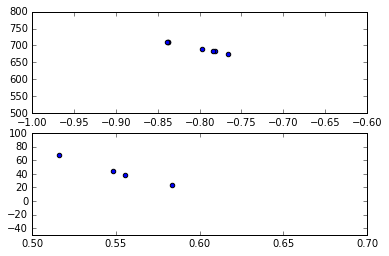

 92%|█████████▏| 627/682 [04:11<00:18,  2.95it/s]

[(0.55085125448028671, 44.056675627240139), (-0.80589859719931167, 694.11555507688013)]


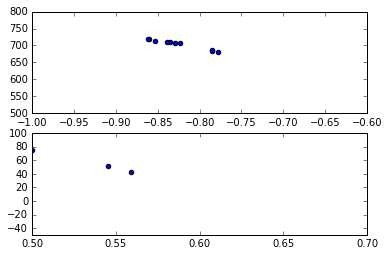

 92%|█████████▏| 628/682 [04:11<00:18,  3.00it/s]

[(0.55213903743315507, 47.664438502673789), (-0.82512767086384819, 703.3461619729934)]


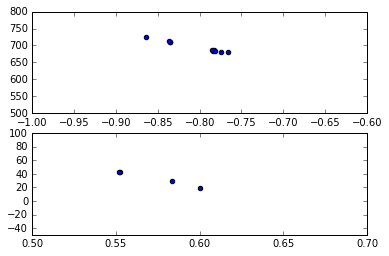

 92%|█████████▏| 629/682 [04:12<00:18,  2.85it/s]

[(0.5719222625529341, 33.715676043557167), (-0.80463956874226594, 695.7247816730644)]


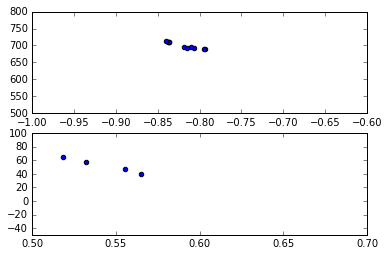

 92%|█████████▏| 630/682 [04:12<00:18,  2.82it/s]

[(0.54280158974886072, 52.544334806591991), (-0.81886893308397324, 699.58658790274785)]


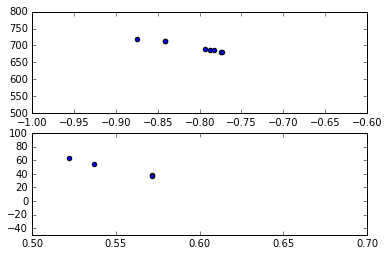

 93%|█████████▎| 631/682 [04:12<00:17,  2.87it/s]

[(0.55040832758224056, 48.261502185415225), (-0.80868055210343259, 696.34605706848879)]


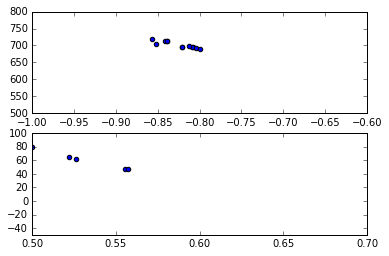

 93%|█████████▎| 632/682 [04:13<00:17,  2.78it/s]

[(0.54024688116108766, 55.613107668196392), (-0.82530911471309176, 701.68908404489275)]


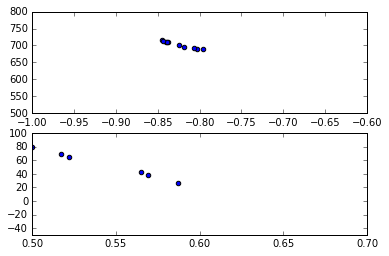

 93%|█████████▎| 633/682 [04:13<00:17,  2.73it/s]

[(0.5520770384038749, 48.618456925383455), (-0.82525870900487841, 702.99497279155958)]


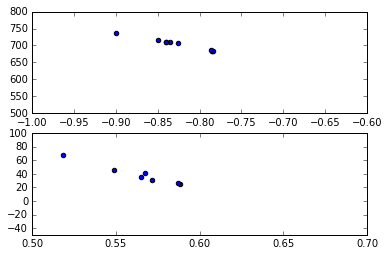

 93%|█████████▎| 634/682 [04:13<00:17,  2.77it/s]

[(0.56386420257758829, 38.828890156019739), (-0.82327173487072225, 703.01305597055682)]


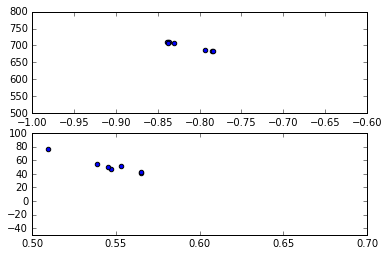

 93%|█████████▎| 635/682 [04:14<00:16,  2.77it/s]

[(0.5462644740215189, 52.017862136565292), (-0.81790301837911594, 699.40890033380037)]


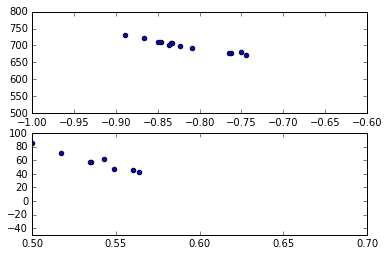

 93%|█████████▎| 636/682 [04:14<00:16,  2.73it/s]

[(0.54316013902827287, 54.699096114351562), (-0.81617204950177835, 699.10174812108028)]


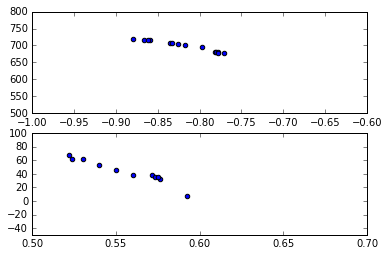

 93%|█████████▎| 637/682 [04:15<00:16,  2.75it/s]

[(0.55593978149005396, 43.325736846645633), (-0.81889383582837927, 698.68437418080407)]


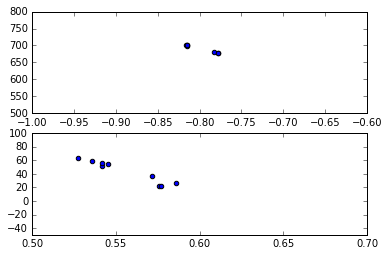

 94%|█████████▎| 638/682 [04:15<00:16,  2.65it/s]

[(0.55574918908252235, 43.582516865850209), (-0.80004843740053477, 691.18515319570383)]


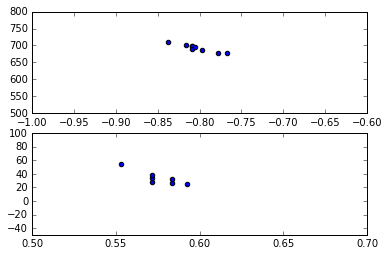

 94%|█████████▎| 639/682 [04:15<00:16,  2.63it/s]

[(0.57524806612952517, 34.262857625319633), (-0.80337502686915541, 692.94827557154031)]


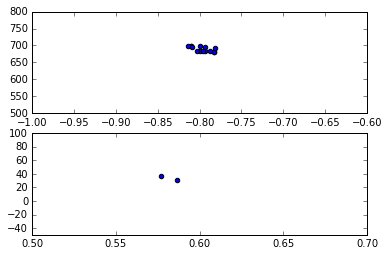

 94%|█████████▍| 640/682 [04:16<00:15,  2.71it/s]

[(0.58156498673740042, 34.050397877984096), (-0.79741827877901161, 689.4997826813526)]


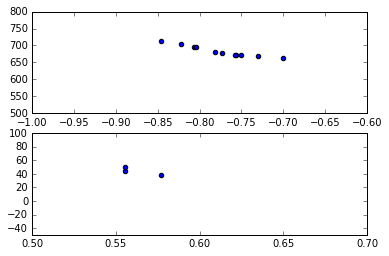

 94%|█████████▍| 641/682 [04:16<00:14,  2.92it/s]

[(0.56267806267806264, 44.28205128205127), (-0.77532428846143153, 682.57473256702622)]


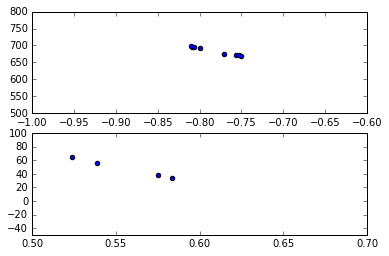

 94%|█████████▍| 642/682 [04:16<00:13,  2.92it/s]

[(0.55515109890109893, 48.155196886446888), (-0.78207777056408201, 682.8844887373233)]


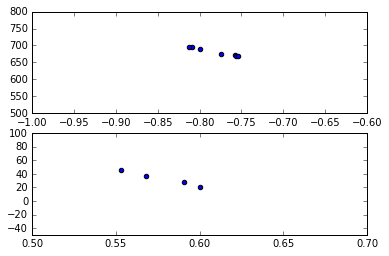

 94%|█████████▍| 643/682 [04:17<00:13,  2.91it/s]

[(0.57807059961315288, 32.76610251450677), (-0.78063868566143957, 680.93705927520534)]


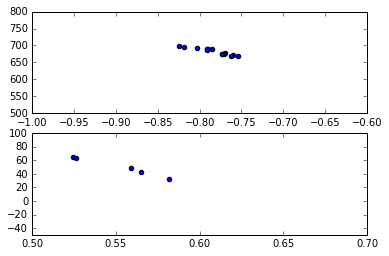

 94%|█████████▍| 644/682 [04:17<00:13,  2.86it/s]

[(0.55135301118848079, 50.464482052551546), (-0.78376601131959744, 682.76052857389755)]


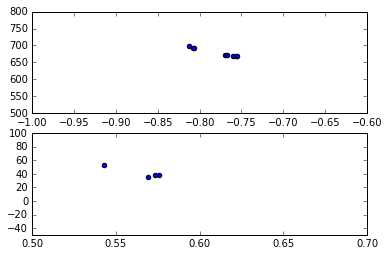

 95%|█████████▍| 645/682 [04:17<00:12,  2.87it/s]

[(0.56527741190520098, 41.170479461377028), (-0.77964966215393505, 679.71461574991781)]


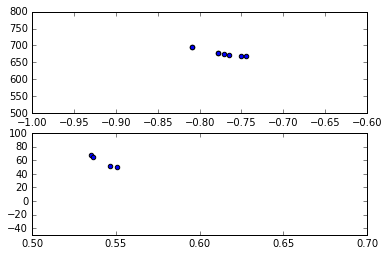

 95%|█████████▍| 646/682 [04:18<00:12,  2.97it/s]

[(0.5421356281109192, 58.384898379294739), (-0.77563669697510362, 678.52938479683621)]


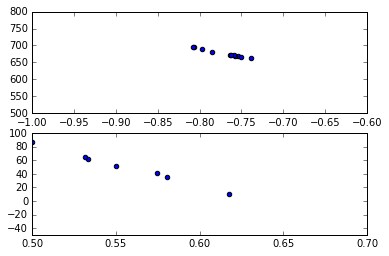

 95%|█████████▍| 647/682 [04:18<00:11,  3.04it/s]

[(0.56462320136230348, 44.498524729967613), (-0.77089705842631517, 676.64045139575251)]


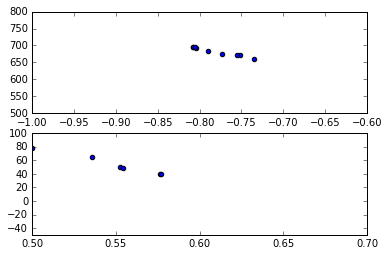

 95%|█████████▌| 648/682 [04:18<00:11,  2.90it/s]

[(0.55915626098107851, 48.653617639019124), (-0.78115120942396232, 682.08757838770225)]


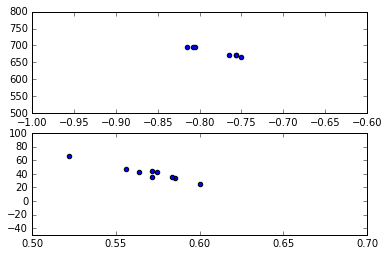

 95%|█████████▌| 649/682 [04:19<00:11,  2.81it/s]

[(0.56974347775055767, 41.520428822208189), (-0.77959900738999555, 680.57511326841029)]


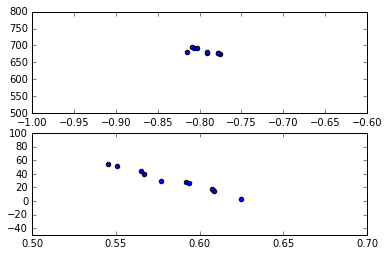

 95%|█████████▌| 650/682 [04:19<00:10,  2.92it/s]

[(0.58539795629466407, 29.691226179557791), (-0.79391341322505415, 683.09908359166866)]


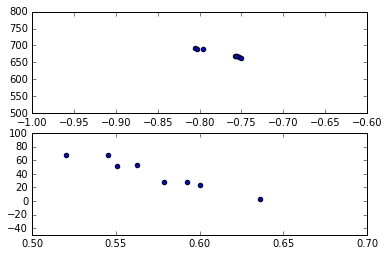

 95%|█████████▌| 651/682 [04:19<00:10,  2.86it/s]

[(0.57332284756412333, 40.524155061291786), (-0.77202928185875175, 676.02191008322654)]


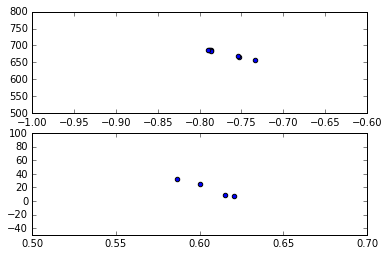

 96%|█████████▌| 652/682 [04:20<00:10,  2.82it/s]

[(0.60557029177718835, 18.332625994694965), (-0.77236852514382115, 677.73998614575578)]


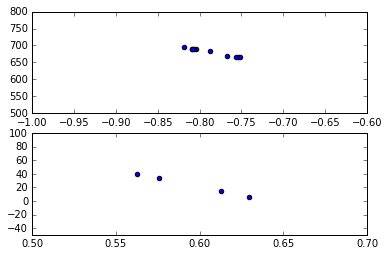

 96%|█████████▌| 653/682 [04:20<00:10,  2.89it/s]

[(0.59519760779841424, 23.708302785923749), (-0.78639757918082753, 680.29929382045145)]


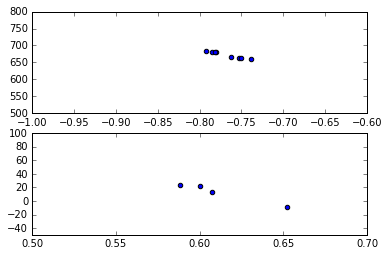

 96%|█████████▌| 654/682 [04:21<00:10,  2.74it/s]

[(0.61188801607599563, 12.519903178662773), (-0.76779015911810278, 672.34063856177545)]


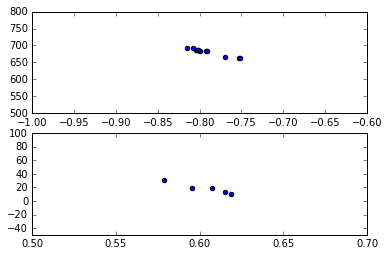

 96%|█████████▌| 655/682 [04:21<00:09,  2.76it/s]

[(0.60315211104684796, 18.772517833044162), (-0.78977389470834358, 680.75385081156946)]


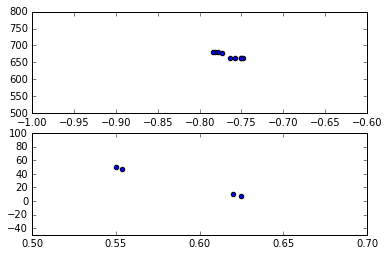

 96%|█████████▌| 656/682 [04:21<00:09,  2.81it/s]

[(0.58714285714285719, 29.010892857142835), (-0.76503804598581615, 670.65743438963659)]


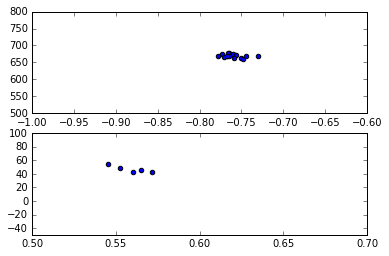

 96%|█████████▋| 657/682 [04:22<00:08,  2.80it/s]

[(0.55886786283152279, 47.18491611957154), (-0.76000809633076705, 669.09182385726558)]


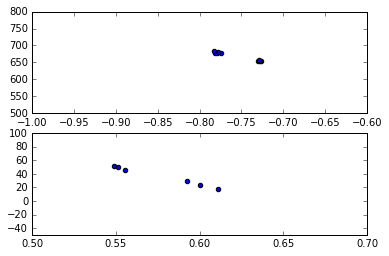

 96%|█████████▋| 658/682 [04:22<00:08,  2.78it/s]

[(0.57651002587123379, 36.514793306663229), (-0.75665477841179396, 668.45563266297972)]


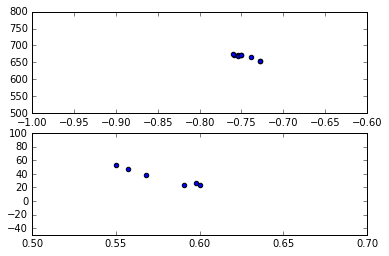

 97%|█████████▋| 659/682 [04:22<00:08,  2.77it/s]

[(0.57734330886504803, 35.561024844720471), (-0.74690158343646051, 667.20576613117942)]


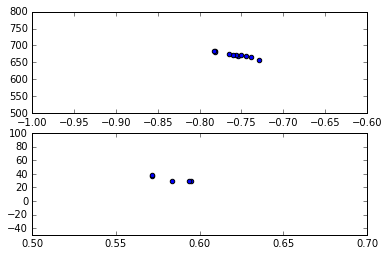

 97%|█████████▋| 660/682 [04:23<00:08,  2.67it/s]

[(0.58299635970090524, 32.50729781582055), (-0.75853119960183935, 672.65187019402128)]


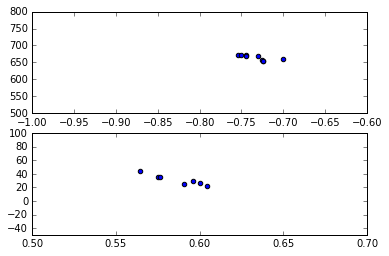

 97%|█████████▋| 661/682 [04:23<00:07,  2.77it/s]

[(0.58670864204417938, 31.314693066745878), (-0.73334246692511262, 663.66045792140289)]


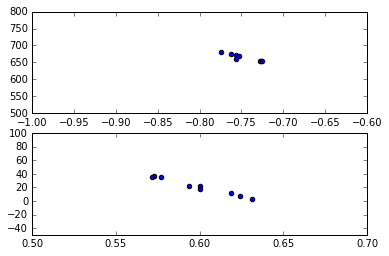

 97%|█████████▋| 662/682 [04:23<00:07,  2.76it/s]

[(0.59878894552736972, 21.511200123894795), (-0.74779448534348569, 665.01099978718844)]


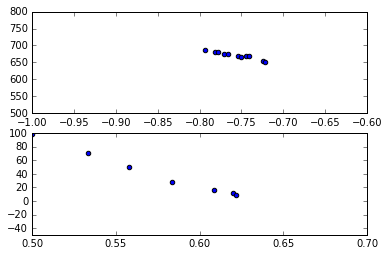

 97%|█████████▋| 663/682 [04:24<00:06,  2.92it/s]

[(0.58745402598403962, 30.882878172862945), (-0.75689361086112428, 670.44120128051145)]


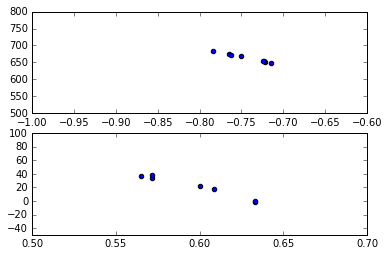

 97%|█████████▋| 664/682 [04:24<00:05,  3.01it/s]

[(0.5976338361431528, 20.95016267376516), (-0.74318606979502999, 663.02430272377296)]


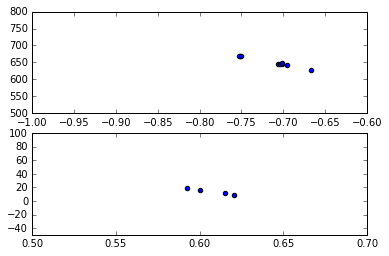

 98%|█████████▊| 665/682 [04:24<00:05,  2.90it/s]

[(0.60716671578740544, 14.027433932606343), (-0.7144788399219375, 650.65093051753342)]


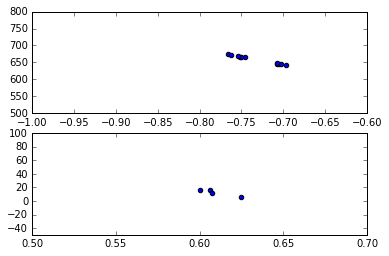

 98%|█████████▊| 666/682 [04:25<00:05,  2.92it/s]

[(0.60955086580086582, 12.72813852813853), (-0.73165885757521398, 658.42121072884754)]


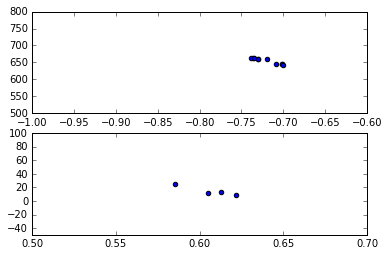

 98%|█████████▊| 667/682 [04:25<00:05,  2.91it/s]

[(0.6062884647453366, 14.293298194877963), (-0.72016271384741593, 654.61016610070442)]


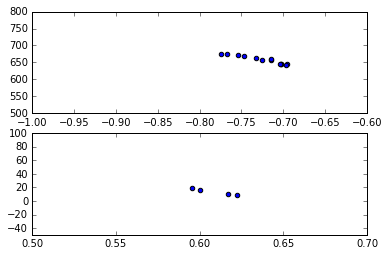

 98%|█████████▊| 668/682 [04:25<00:04,  2.88it/s]

[(0.60874704491725773, 13.626950354609932), (-0.72552176215734532, 657.25253642535131)]


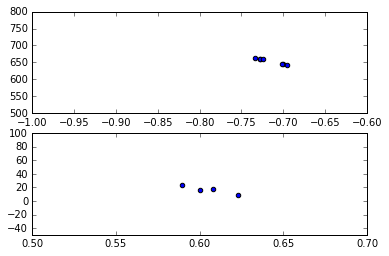

 98%|█████████▊| 669/682 [04:26<00:04,  2.83it/s]

[(0.60494259024364461, 16.422505747582051), (-0.71597662658358641, 653.58722771266162)]


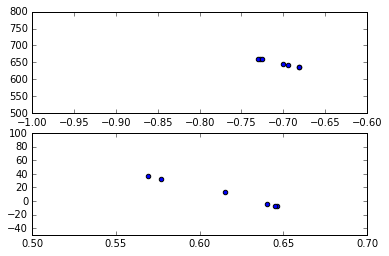

 98%|█████████▊| 670/682 [04:26<00:04,  2.79it/s]

[(0.61551121220476057, 10.766177281499873), (-0.70582864665149547, 648.8249966943406)]


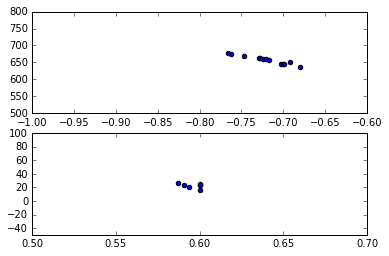

 98%|█████████▊| 671/682 [04:27<00:04,  2.61it/s]

[(0.59594508752117459, 22.577950310559004), (-0.72062422922692571, 656.91564733389055)]


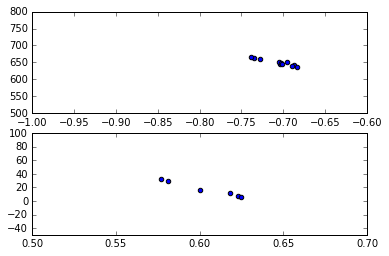

 99%|█████████▊| 672/682 [04:27<00:03,  2.64it/s]

[(0.60398957721402269, 17.241108192066946), (-0.70642810697905267, 649.66658700870084)]


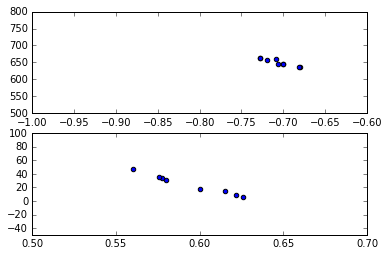

 99%|█████████▊| 673/682 [04:27<00:03,  2.83it/s]

[(0.59453410048627986, 24.497373611406616), (-0.70579804570805638, 649.98296927323315)]


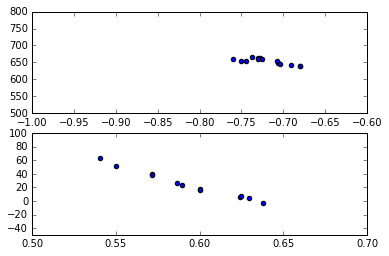

 99%|█████████▉| 674/682 [04:28<00:02,  2.90it/s]

[(0.5938307486817771, 24.427154816851584), (-0.71964451994545287, 653.21151894168997)]


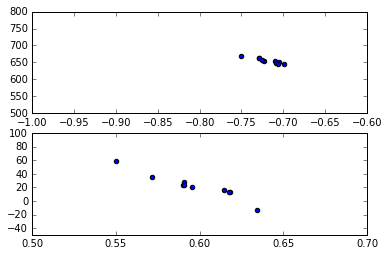

 99%|█████████▉| 675/682 [04:28<00:02,  3.01it/s]

[(0.59735096302342106, 22.006309876563108), (-0.71852276378981328, 655.0181398924251)]


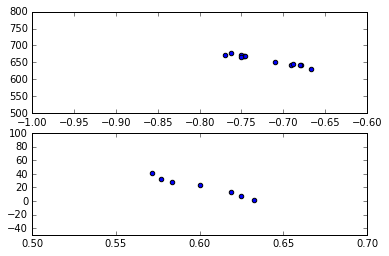

 99%|█████████▉| 676/682 [04:28<00:02,  2.90it/s]

[(0.60119795170815582, 21.109953651790388), (-0.7221084859254786, 656.81533817540185)]


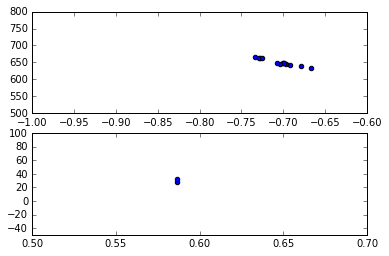

 99%|█████████▉| 677/682 [04:29<00:01,  3.07it/s]

[(0.58620689655172409, 30.051724137931075), (-0.70466788385415302, 650.06343325886905)]


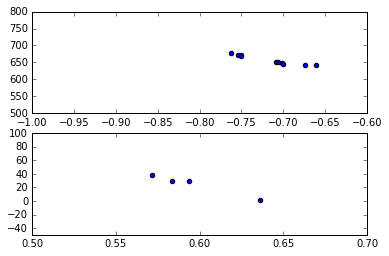

 99%|█████████▉| 678/682 [04:29<00:01,  2.93it/s]

[(0.59621888528138534, 24.586715367965368), (-0.71680824951976585, 656.55009169528716)]


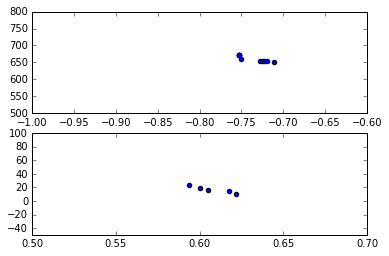

100%|█████████▉| 679/682 [04:29<00:01,  2.97it/s]

[(0.60765636766797759, 16.887437034557774), (-0.73662533028256327, 661.68037698209514)]


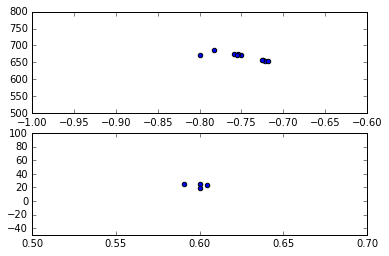

100%|█████████▉| 680/682 [04:30<00:00,  2.87it/s]

[(0.59889006342494711, 23.242917547568709), (-0.74915438026157766, 666.85984427348899)]


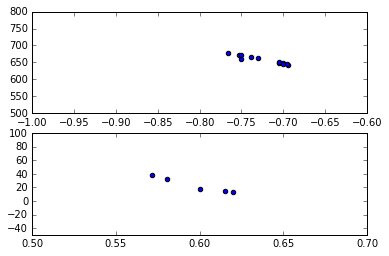

100%|█████████▉| 681/682 [04:30<00:00,  3.02it/s]

[(0.59749166962070188, 23.177805033675998), (-0.72417153443501336, 657.69118918900767)]


[MoviePy] Done.
[MoviePy] >>>> Video ready: yellow.mp4 

CPU times: user 5min 56s, sys: 5min 39s, total: 11min 35s
Wall time: 4min 31s


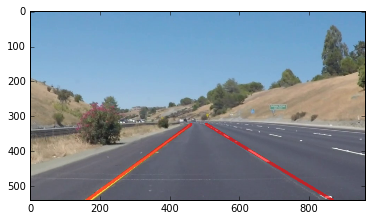

In [75]:
yellow_output = 'yellow.mp4'
clip2 = VideoFileClip('solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(find_lines)
%time yellow_clip.write_videofile(yellow_output, audio=False)

In [76]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Optional Challenge

Unfortunately, my code crashes on the optional challenge. I believe this is because of the dashboard in the video. In future versions of this pipeline, I will ensure that is more robust to these kinds of effects. I believe that I would do this by cutting off the bottom part of the screen in the region of interest.

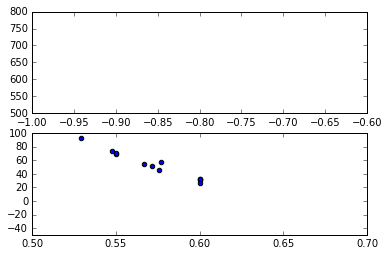

[(0.57231722525840156, 53.543609658315546), (nan, nan)]


ValueError: cannot convert float NaN to integer

In [78]:
challenge_output = 'extra.mp4'
clip2 = VideoFileClip('challenge.mp4')
challenge_clip = clip2.fl_image(find_lines)
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))